# Data Loading

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
import numpy as np
from functools import reduce

"""
Establish the intersection of all keys and return train and test subjects
"""
def get_split(datasets, test_size=0.2, random_state=42):
    
    # Intersection of subjects from datasets
    subjects = reduce(np.intersect1d, map(lambda x: np.array(list(x.keys())), datasets))
    
    print("Subject in intersection:", subjects.shape[0])
    
    indexes = list(range(subjects.shape[0]))

    train_index, test_index = train_test_split(
        indexes, 
        test_size=test_size, 
        random_state=random_state)

    train_subjects = subjects[train_index]
    test_subjects = subjects[test_index]
    
    return train_subjects, test_subjects

In [2]:
def get_image_data(dataset, subjects):
    result = []
    for subject in subjects:
        result.append([dataset[subject][0]])
    return np.concatenate(result, axis=0)   

In [3]:
def get_dict_data(dataset, subjects):
    result = []
    for subject in subjects:
        result.append(dataset[subject])
    return np.array(result)

In [4]:
def get_labels(classification_path):
    
    y = {}
    
    # Load labels
    df = pd.read_csv(classification_path)
    subjects = np.array(df.iloc[:,1])
    labels = np.array(df.iloc[:,2])
    
    for i, subject in enumerate(subjects):
        y[subject] = labels[i]
        
    return y

In [5]:
import pickle

def get_data(dataset_path, classification_path, excludes=None):

    # Load images
    with open(dataset_path, "rb") as file:
        images = pickle.load(file)

    labels = get_labels(classification_path)
    
    if excludes:
        for exclude in excludes:
            if exclude in images:
                del images[exclude]
            if exclude in labels:
                del labels[exclude]
                
    train, test = get_split([images, labels])
    
    X_train = get_image_data(images, train)
    X_test = get_image_data(images, test)
    
    y_train = get_dict_data(labels, train)
    y_test = get_dict_data(labels, test)
    
    return X_train, y_train, X_test, y_test

# Model definition

In [6]:
#pip install --user keras==2.3.1

In [7]:
import numpy as np

# from keras import layers
from tensorflow.keras.layers import Input, Add, Dense, Dropout, Activation, ZeroPadding2D, BatchNormalization, Flatten, Conv2D, AveragePooling2D, MaxPooling2D, GlobalMaxPooling2D
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from tensorflow.keras.preprocessing import image

from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from tensorflow.keras.applications.imagenet_utils import preprocess_input

#import pydot
from IPython.display import SVG

from keras.utils.vis_utils import model_to_dot
from tensorflow.keras.utils import plot_model
#from resnets_utils import *
from tensorflow.keras.initializers import glorot_uniform

import scipy.misc
from matplotlib.pyplot import imshow
%matplotlib inline
from gliomi import *

import tensorflow.keras.backend as K

K.set_image_data_format('channels_last')
K.set_learning_phase(1)

Using TensorFlow backend.


In [8]:
from tensorflow.keras.applications import *

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D,Dropout

from keras.callbacks import EarlyStopping, ModelCheckpoint

from tensorflow.keras.optimizers import SGD, Adam

import tensorflow.keras.backend as K

In [9]:
def ConvN(name, X, filters, stride, batch_norm=True, max_pool=True, random_seed=0):
    
    for i, f in enumerate(filters):
        
        X = Conv2D(filters = f, 
                   kernel_size = (3, 3), 
                   strides = (stride, stride), 
                   padding = 'valid', 
                   name = f"conv-{name}-branch-{i}", 
                   kernel_initializer = glorot_uniform(seed=random_seed))(X)
        
        X = Activation('relu')(X)
        
        if batch_norm:
            X = BatchNormalization(axis = 3, 
                                   name = f"bn-{name}-branch-{i}")(X)
            
    if max_pool:
        X = MaxPooling2D((2, 2), strides=(stride, stride))(X)
    
    return X

In [10]:
def CNN_2D(n_features, input_shape=(224,224,1), classes=2, zero_pad=True, avg_pool=True, random_seed=0):
    
    X = Input(input_shape)
    X_input = X
    
    if zero_pad:
        X = ZeroPadding2D((3, 3))(X)
        
    X = ConvN("1-a", X, [64,128,256], stride=1, batch_norm=True, max_pool=True, random_seed=random_seed)
    X = ConvN("2-b", X, [64,128], stride=1, batch_norm=True, max_pool=True, random_seed=random_seed)
    X = ConvN("3-c", X, [64], stride=2, batch_norm=True, max_pool=True, random_seed=random_seed)
    X = ConvN("4-d", X, [64], stride=2, batch_norm=True, max_pool=False, random_seed=random_seed)

    # X = Conv1(X,stage=1,block='a', filters=[64,128,256], s=2,batch_norm=True)
    # X = Conv2(X,stage=2,block='b', filters, s,batch_norm=True)
    # X = Conv3(X,stage=3,block='c', filters, s,batch_norm=True)
    # X = Conv4(X,stage=4,block='d', filters, s,batch_norm=True)
    
    if avg_pool:
        X = AveragePooling2D((2,2), name="avg_pool")(X)
        
    X = Flatten()(X)
    
    X = Dense(n_features, 
              activation='relu', 
              name='fc' + str(n_features), 
              kernel_initializer = glorot_uniform(seed=random_seed))(X)
    
    X = Dense(classes, 
              activation='softmax', 
              name='fc' + str(classes), 
              kernel_initializer = glorot_uniform(seed=random_seed))(X)
    
    print("Model", X)
    
    # Create model
    return Model(inputs = X_input, outputs = X, name='4_Conv_Blocks_Net')

#model.get_layer('fc256')

In [11]:
import tensorflow as tf

optimizers = {
    'rmsprop': (lambda : tf.keras.optimizers.RMSprop(learning_rate=0.0001)),
    'sgd': (lambda : tf.keras.optimizers.SGD(lr=0.001, momentum=0.9, decay=0.001/10, nesterov=False)),
    'adam' : (lambda : tf.keras.optimizers.Adam(lr=0.0001))
}

In [12]:
import os

def make_name(slice_dataset, dataset, optimizer_name, sequence, percentile):
    slice_dataset = os.path.basename(slice_dataset).replace("datasets-", "")
    return "-".join([slice_dataset, dataset, optimizer_name, sequence, percentile])

In [13]:
from collections import Counter

from tensorflow.keras.preprocessing.image import ImageDataGenerator

def fill_with_random_images(X, y, target_slices):
    
    X_new = []
    y_new = []
    
    # Construct image generator
    aug = ImageDataGenerator(
        rotation_range=90,
        horizontal_flip=True,
        vertical_flip=True
        # zoom_range=0.15,
        # width_shift_range=0.2,
        # height_shift_range=0.2,
        # shear_range=0.15,
        # fill_mode="nearest"
    )

    imageGenerator = aug.flow(x=X, y=y, batch_size=1)

    index = 0

    for img, label in imageGenerator:
        
        X_new.append(img)
        y_new.append(label)
        
        index = index + 1

        if index == target_slices:
            break
            
    return np.array(X_new), np.array(y_new)

            
def balance_dataset(X, y, class_size=None):
    
    # Count occurrences of label 0.0 and 1.0
    count = Counter(y)

    # Bring the smaller class to the number of elements of bigger class
    if class_size is None:

        if count[0.0] < count[1.0]:
            X_zero, y_zero = fill_with_random_images( X[y == 0.0], y[y == 0.0],target_slices=count[1.0])
            X_one, y_one = X[y == 1.0], y[y == 1.0]
            return np.concatenate((X_zero[:,0,:,:,:], X_one),axis=0), np.concatenate((y_zero[:,0], y_one),axis=0)
        else:
            X_zero, y_zero = X[y == 0.0], y[y == 0.0]
            X_one, y_one = fill_with_random_images( X[y == 1.0], y[y == 1.0],target_slices=count[0.0])
            return np.concatenate((X_zero, X_one[:,0,:,:,:]),axis=0), np.concatenate((y_zero, y_one[:,0]),axis=0)
    else:
        X_zero, y_zero = fill_with_random_images(X[y == 0.0], y[y == 0.0],target_slices=class_size)
        X_one, y_one = fill_with_random_images(X[y == 1.0], y[y == 1.0],target_slices=class_size)
        return np.concatenate((X_zero[:,0,:,:,:], X_one[:,0,:,:,:]),axis=0), np.concatenate((y_zero[:,0], y_one[:,0]),axis=0)

In [14]:
from keras.utils import to_categorical
def train_and_test(model, X_train, y_train, X_test, y_test, random_state=42, epochs=500, batch_size=16, balance=False):
    
    early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=50)
    #tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=f"logs-2.6-test/{model_name}")
    
    if balance:
        balanced_X, balanced_y = balance_dataset(X_train, y_train)
    else:
        balanced_X, balanced_y = X_train, y_train
        
    balanced_y = to_categorical(balanced_y)
    y_test = to_categorical(y_test)
            
    fit = model.fit(
            balanced_X, balanced_y, 
            epochs=epochs,
            callbacks=[early_stopping_callback],
            validation_data=(X_test, y_test), 
            shuffle=True,
            batch_size=batch_size)
    
    
    return fit,balanced_X,balanced_y,y_test

In [15]:
import matplotlib.pyplot as plt

"""
Save results in plot
"""
def save_plot(history, output_name):

    acc = history.history['acc']
    val_acc = history.history['val_acc']

    loss = history.history['loss']
    val_loss = history.history['val_loss']

    plt.figure(figsize=(8, 8))
    plt.subplot(2, 1, 1)
    plt.plot(acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.ylabel('Accuracy')
    plt.ylim([min(plt.ylim()),1])
    plt.title('Training and Validation Accuracy')

    plt.subplot(2, 1, 2)
    plt.plot(loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.ylabel('Cross Entropy')
    # plt.ylim([0,1.0])
    plt.title('Training and Validation Loss')
    plt.xlabel('epoch')

    plt.savefig(f"{output_name}.png")
    # plt.show()

# Launch without survivor balanced datasets

Subject in intersection: 212
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 169 samples, validate on 43 samples
Epoch 1/500
169/169 [==============================] - 1s 7ms/sample - loss: 0.7578 - acc: 0.5621 - val_loss: 0.6951 - val_acc: 0.4884
Epoch 2/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.5177 - acc: 0.7751 - val_loss: 0.6972 - val_acc: 0.4884
Epoch 3/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.3172 - acc: 0.9290 - val_loss: 0.7051 - val_acc: 0.4884
Epoch 4/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2616 - acc: 0.9586 - val_loss: 0.7062 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1293 - acc: 1.0000 - val_loss: 0.7098 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0653 - acc: 1.0000 - val_loss: 0.7166 - val_acc: 0.4884
Epoch 7/500
169/169 [=======================

169/169 [==============================] - 0s 2ms/sample - loss: 4.9377e-09 - acc: 1.0000 - val_loss: 1.2448 - val_acc: 0.4651
Epoch 60/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1991e-08 - acc: 1.0000 - val_loss: 1.3204 - val_acc: 0.4419
Epoch 61/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6430e-09 - acc: 1.0000 - val_loss: 1.3619 - val_acc: 0.4419
Epoch 62/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6224e-08 - acc: 1.0000 - val_loss: 1.4509 - val_acc: 0.4186
Epoch 63/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5269e-09 - acc: 1.0000 - val_loss: 1.4905 - val_acc: 0.4186
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.3484e-09 - acc: 1.0000 - val_loss: 1.5927 - val_acc: 0.4186
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4108e-09 - acc: 1.0000 - val_loss: 1.6254 - val_acc: 0.4186
Epoch 66/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1172 - val_acc: 0.4419
Epoch 118/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1008 - val_acc: 0.4419
Epoch 119/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0980 - val_acc: 0.4419
Epoch 120/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0920 - val_acc: 0.4419
Epoch 121/500
43/43 [==============================] - 0s 721us/sample - loss: 2.0868 - acc: 0.4419
Subject in intersection: 212
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 169 samples, validate on 43 samples
Epoch 1/500
169/169 [==============================] - 1s 6ms/sample - loss: 0.7933 - acc: 0.4615 - val_loss: 0.6931 - val_acc: 0.4884
Epoch 2/500
169/169 [==============================] - 0s 2ms/sample 

Epoch 54/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8632 - val_acc: 0.5814
Epoch 55/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.8747 - val_acc: 0.5814
Epoch 56/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.8984 - val_acc: 0.5349
Epoch 57/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9250 - val_acc: 0.5581
Epoch 58/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.9785 - val_acc: 0.5581
Epoch 59/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9574 - val_acc: 0.6047
Epoch 60/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.9475 - val_acc: 0.5581
Epoch 61/500
169/169 [==========================

169/169 [==============================] - 0s 2ms/sample - loss: 6.3960e-04 - acc: 1.0000 - val_loss: 1.2301 - val_acc: 0.6047
Epoch 114/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7492e-04 - acc: 1.0000 - val_loss: 1.2431 - val_acc: 0.6047
Epoch 115/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.2253e-04 - acc: 1.0000 - val_loss: 1.2414 - val_acc: 0.6047
Epoch 116/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.8965e-04 - acc: 1.0000 - val_loss: 1.2473 - val_acc: 0.6047
Epoch 117/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8655e-04 - acc: 1.0000 - val_loss: 1.2401 - val_acc: 0.6047
Epoch 118/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9965e-04 - acc: 1.0000 - val_loss: 1.2369 - val_acc: 0.6047
Epoch 119/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9517e-04 - acc: 1.0000 - val_loss: 1.2293 - val_acc: 0.6047
Epoch 120/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.1304e-04 - acc: 1.0000 - val_loss: 1.2586 - val_acc: 0.6047
Epoch 172/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2767e-04 - acc: 1.0000 - val_loss: 1.2689 - val_acc: 0.6047
Epoch 173/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8510e-04 - acc: 1.0000 - val_loss: 1.2695 - val_acc: 0.6047
Epoch 174/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9618e-04 - acc: 1.0000 - val_loss: 1.2693 - val_acc: 0.6047
Epoch 175/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4649e-04 - acc: 1.0000 - val_loss: 1.2627 - val_acc: 0.6047
Epoch 176/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9803e-04 - acc: 1.0000 - val_loss: 1.2570 - val_acc: 0.6047
Epoch 177/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7279e-04 - acc: 1.0000 - val_loss: 1.2612 - val_acc: 0.6047
Epoch 178/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.9836e-04 - acc: 1.0000 - val_loss: 1.2760 - val_acc: 0.6047
Epoch 230/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8103e-04 - acc: 1.0000 - val_loss: 1.2769 - val_acc: 0.6047
Epoch 231/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3001e-04 - acc: 1.0000 - val_loss: 1.2791 - val_acc: 0.6047
Epoch 232/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7668e-04 - acc: 1.0000 - val_loss: 1.2775 - val_acc: 0.6047
Epoch 233/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3806e-04 - acc: 1.0000 - val_loss: 1.2782 - val_acc: 0.6047
Epoch 234/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5003e-04 - acc: 1.0000 - val_loss: 1.2817 - val_acc: 0.6047
Epoch 235/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2479e-04 - acc: 1.0000 - val_loss: 1.2764 - val_acc: 0.6047
Epoch 236/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.0593e-04 - acc: 1.0000 - val_loss: 1.2979 - val_acc: 0.6047
Epoch 288/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0928e-04 - acc: 1.0000 - val_loss: 1.2979 - val_acc: 0.6047
Epoch 289/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9960e-04 - acc: 1.0000 - val_loss: 1.2960 - val_acc: 0.6047
Epoch 290/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0772e-04 - acc: 1.0000 - val_loss: 1.2973 - val_acc: 0.6047
Epoch 291/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9319e-04 - acc: 1.0000 - val_loss: 1.2964 - val_acc: 0.6047
Epoch 292/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6427e-04 - acc: 1.0000 - val_loss: 1.2949 - val_acc: 0.6047
Epoch 293/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5576e-04 - acc: 1.0000 - val_loss: 1.2945 - val_acc: 0.6047
Epoch 294/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.0525e-04 - acc: 1.0000 - val_loss: 1.3098 - val_acc: 0.6047
Epoch 346/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8555e-04 - acc: 1.0000 - val_loss: 1.3115 - val_acc: 0.6047
Epoch 347/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7676e-04 - acc: 1.0000 - val_loss: 1.3117 - val_acc: 0.6047
Epoch 348/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2099e-04 - acc: 1.0000 - val_loss: 1.3079 - val_acc: 0.6047
Epoch 349/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0433e-04 - acc: 1.0000 - val_loss: 1.3064 - val_acc: 0.6047
Epoch 350/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7972e-04 - acc: 1.0000 - val_loss: 1.3044 - val_acc: 0.6047
Epoch 351/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9345e-04 - acc: 1.0000 - val_loss: 1.3049 - val_acc: 0.6047
Epoch 352/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4228e-04 - acc: 1.0000 - val_loss: 1.3185 - val_acc: 0.6047
Epoch 404/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4215e-04 - acc: 1.0000 - val_loss: 1.3171 - val_acc: 0.6047
Epoch 405/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9771e-04 - acc: 1.0000 - val_loss: 1.3179 - val_acc: 0.6047
Epoch 406/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9208e-04 - acc: 1.0000 - val_loss: 1.3186 - val_acc: 0.6047
Epoch 407/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6696e-04 - acc: 1.0000 - val_loss: 1.3184 - val_acc: 0.6047
Epoch 408/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5217e-04 - acc: 1.0000 - val_loss: 1.3188 - val_acc: 0.6047
Epoch 409/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3623e-04 - acc: 1.0000 - val_loss: 1.3196 - val_acc: 0.6047
Epoch 410/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.3968e-04 - acc: 1.0000 - val_loss: 1.3611 - val_acc: 0.6047
Epoch 462/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2434e-04 - acc: 1.0000 - val_loss: 1.3558 - val_acc: 0.6047
Epoch 463/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5548e-04 - acc: 1.0000 - val_loss: 1.3515 - val_acc: 0.6047
Epoch 464/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3211e-04 - acc: 1.0000 - val_loss: 1.3493 - val_acc: 0.6047
Epoch 465/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4781e-04 - acc: 1.0000 - val_loss: 1.3441 - val_acc: 0.6047
Epoch 466/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2881e-04 - acc: 1.0000 - val_loss: 1.3424 - val_acc: 0.6047
Epoch 467/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4214e-04 - acc: 1.0000 - val_loss: 1.3407 - val_acc: 0.6047
Epoch 468/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.8827 - val_acc: 0.4884
Epoch 18/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0050 - acc: 1.0000 - val_loss: 0.9148 - val_acc: 0.4884
Epoch 19/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.9502 - val_acc: 0.4884
Epoch 20/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 0.9956 - val_acc: 0.4884
Epoch 21/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0378 - val_acc: 0.4884
Epoch 22/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 1.0985 - val_acc: 0.4884
Epoch 23/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 1.1525 - val_acc: 0.4884
Epoch 24/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 3.4559e-04 - acc: 1.0000 - val_loss: 1.0579 - val_acc: 0.4884
Epoch 77/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.0809e-04 - acc: 1.0000 - val_loss: 1.0572 - val_acc: 0.5349
Epoch 78/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.0192e-04 - acc: 1.0000 - val_loss: 1.0505 - val_acc: 0.5116
Epoch 79/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4903e-04 - acc: 1.0000 - val_loss: 1.0447 - val_acc: 0.4884
Epoch 80/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8530e-04 - acc: 1.0000 - val_loss: 1.0435 - val_acc: 0.4884
Epoch 81/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9642e-04 - acc: 1.0000 - val_loss: 1.0448 - val_acc: 0.5116
Epoch 82/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9598e-04 - acc: 1.0000 - val_loss: 1.0444 - val_acc: 0.5116
Epoch 83/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 1.1854e-04 - acc: 1.0000 - val_loss: 1.0941 - val_acc: 0.4884
Epoch 135/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.1347e-05 - acc: 1.0000 - val_loss: 1.0919 - val_acc: 0.4884
Epoch 136/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5848e-05 - acc: 1.0000 - val_loss: 1.0846 - val_acc: 0.5116
Epoch 137/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.9659e-05 - acc: 1.0000 - val_loss: 1.0865 - val_acc: 0.5116
Epoch 138/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5531e-04 - acc: 1.0000 - val_loss: 1.0809 - val_acc: 0.5116
Epoch 139/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.6902e-05 - acc: 1.0000 - val_loss: 1.0544 - val_acc: 0.5581
Epoch 140/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.6649e-05 - acc: 1.0000 - val_loss: 1.0540 - val_acc: 0.5581
Epoch 141/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.0803e-05 - acc: 1.0000 - val_loss: 1.1230 - val_acc: 0.5116
Epoch 193/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.6860e-05 - acc: 1.0000 - val_loss: 1.1242 - val_acc: 0.5116
Epoch 194/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8957e-05 - acc: 1.0000 - val_loss: 1.1254 - val_acc: 0.5116
Epoch 195/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7416e-05 - acc: 1.0000 - val_loss: 1.1261 - val_acc: 0.4884
Epoch 196/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.6858e-05 - acc: 1.0000 - val_loss: 1.1277 - val_acc: 0.4884
Epoch 197/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9834e-05 - acc: 1.0000 - val_loss: 1.1222 - val_acc: 0.5116
Epoch 198/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4738e-05 - acc: 1.0000 - val_loss: 1.1222 - val_acc: 0.5116
Epoch 199/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.3990e-05 - acc: 1.0000 - val_loss: 1.1508 - val_acc: 0.5116
Epoch 251/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9229e-05 - acc: 1.0000 - val_loss: 1.1542 - val_acc: 0.5349
Epoch 252/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7669e-05 - acc: 1.0000 - val_loss: 1.1547 - val_acc: 0.5349
Epoch 253/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1943e-05 - acc: 1.0000 - val_loss: 1.1588 - val_acc: 0.5349
Epoch 254/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0343e-05 - acc: 1.0000 - val_loss: 1.1573 - val_acc: 0.5349
Epoch 255/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1103e-05 - acc: 1.0000 - val_loss: 1.1571 - val_acc: 0.5116
Epoch 256/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2069e-05 - acc: 1.0000 - val_loss: 1.1572 - val_acc: 0.5116
Epoch 257/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4039e-05 - acc: 1.0000 - val_loss: 1.1718 - val_acc: 0.5349
Epoch 309/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6871e-05 - acc: 1.0000 - val_loss: 1.1732 - val_acc: 0.5349
Epoch 310/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3779e-05 - acc: 1.0000 - val_loss: 1.1763 - val_acc: 0.5349
Epoch 311/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5524e-05 - acc: 1.0000 - val_loss: 1.1773 - val_acc: 0.5349
Epoch 312/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1522e-05 - acc: 1.0000 - val_loss: 1.1765 - val_acc: 0.5349
Epoch 313/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4303e-05 - acc: 1.0000 - val_loss: 1.1736 - val_acc: 0.5349
Epoch 314/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2334e-05 - acc: 1.0000 - val_loss: 1.1720 - val_acc: 0.5349
Epoch 315/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 8.8045e-06 - acc: 1.0000 - val_loss: 1.1839 - val_acc: 0.5116
Epoch 367/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.3629e-06 - acc: 1.0000 - val_loss: 1.1866 - val_acc: 0.5116
Epoch 368/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0088e-06 - acc: 1.0000 - val_loss: 1.1911 - val_acc: 0.5116
Epoch 369/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7890e-06 - acc: 1.0000 - val_loss: 1.1925 - val_acc: 0.5349
Epoch 370/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8165e-06 - acc: 1.0000 - val_loss: 1.1924 - val_acc: 0.5349
Epoch 371/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.9002e-06 - acc: 1.0000 - val_loss: 1.1942 - val_acc: 0.5349
Epoch 372/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0629e-06 - acc: 1.0000 - val_loss: 1.1928 - val_acc: 0.5349
Epoch 373/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.7143e-06 - acc: 1.0000 - val_loss: 1.2697 - val_acc: 0.4884
Epoch 425/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.2182e-06 - acc: 1.0000 - val_loss: 1.2665 - val_acc: 0.4884
Epoch 426/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1370e-06 - acc: 1.0000 - val_loss: 1.2647 - val_acc: 0.5116
Epoch 427/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9463e-06 - acc: 1.0000 - val_loss: 1.2623 - val_acc: 0.5116
Epoch 428/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.2182e-06 - acc: 1.0000 - val_loss: 1.2592 - val_acc: 0.5349
Epoch 429/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.3487e-06 - acc: 1.0000 - val_loss: 1.2573 - val_acc: 0.5349
Epoch 430/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4333e-06 - acc: 1.0000 - val_loss: 1.2577 - val_acc: 0.5349
Epoch 431/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.7905e-06 - acc: 1.0000 - val_loss: 1.2566 - val_acc: 0.5116
Epoch 483/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4745e-06 - acc: 1.0000 - val_loss: 1.2583 - val_acc: 0.5116
Epoch 484/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7199e-06 - acc: 1.0000 - val_loss: 1.2631 - val_acc: 0.5116
Epoch 485/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1655e-06 - acc: 1.0000 - val_loss: 1.2635 - val_acc: 0.5116
Epoch 486/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7277e-06 - acc: 1.0000 - val_loss: 1.2666 - val_acc: 0.5349
Epoch 487/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0717e-06 - acc: 1.0000 - val_loss: 1.2667 - val_acc: 0.5349
Epoch 488/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4851e-06 - acc: 1.0000 - val_loss: 1.2671 - val_acc: 0.5349
Epoch 489/500
169/169 [====

Epoch 39/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5589e-06 - acc: 1.0000 - val_loss: 1.9139 - val_acc: 0.5116
Epoch 40/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0292 - acc: 0.9941 - val_loss: 1.4843 - val_acc: 0.5116
Epoch 41/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.5256 - val_acc: 0.5116
Epoch 42/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4891e-04 - acc: 1.0000 - val_loss: 1.6089 - val_acc: 0.5116
Epoch 43/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2922e-04 - acc: 1.0000 - val_loss: 1.6557 - val_acc: 0.5116
Epoch 44/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0810e-04 - acc: 1.0000 - val_loss: 1.6258 - val_acc: 0.5116
Epoch 45/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.5475e-05 - acc: 1.0000 - val_loss: 1.6171 - val_acc: 0.5116
Epoch 46/500
169/169 [======

169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6828 - val_acc: 0.4884
Epoch 98/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6619 - val_acc: 0.5116
Epoch 99/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6626 - val_acc: 0.5116
Epoch 100/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6717 - val_acc: 0.5116
Epoch 101/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6743 - val_acc: 0.5116
Epoch 102/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6801 - val_acc: 0.5581
Epoch 103/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6815 - val_acc: 0.5116
Epoch 104/500
169/169 [======

169/169 [==============================] - 0s 2ms/sample - loss: 0.0071 - acc: 1.0000 - val_loss: 0.6967 - val_acc: 0.5116
Epoch 20/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0063 - acc: 1.0000 - val_loss: 0.6979 - val_acc: 0.5116
Epoch 21/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 0.7067 - val_acc: 0.5116
Epoch 22/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0055 - acc: 1.0000 - val_loss: 0.7205 - val_acc: 0.5116
Epoch 23/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0050 - acc: 1.0000 - val_loss: 0.7337 - val_acc: 0.5116
Epoch 24/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.7524 - val_acc: 0.5116
Epoch 25/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.7703 - val_acc: 0.5116
Epoch 26/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 9.8579e-04 - acc: 1.0000 - val_loss: 0.9514 - val_acc: 0.4419
Epoch 80/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.2414e-04 - acc: 1.0000 - val_loss: 0.9559 - val_acc: 0.4419
Epoch 81/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.2835e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.4419
Epoch 82/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.2951e-04 - acc: 1.0000 - val_loss: 0.9599 - val_acc: 0.4419
Epoch 83/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.4293e-04 - acc: 1.0000 - val_loss: 0.9632 - val_acc: 0.4651
Epoch 84/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.1968e-04 - acc: 1.0000 - val_loss: 0.9687 - val_acc: 0.4419
Epoch 85/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7963e-04 - acc: 1.0000 - val_loss: 0.9743 - val_acc: 0.4419
Epoch 86/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 4.9539e-04 - acc: 1.0000 - val_loss: 1.0309 - val_acc: 0.4419
Epoch 138/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.6199e-04 - acc: 1.0000 - val_loss: 1.0321 - val_acc: 0.4419
Epoch 139/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8812e-04 - acc: 1.0000 - val_loss: 1.0326 - val_acc: 0.4419
Epoch 140/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0705e-04 - acc: 1.0000 - val_loss: 1.0367 - val_acc: 0.4419
Epoch 141/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9742e-04 - acc: 1.0000 - val_loss: 1.0369 - val_acc: 0.4419
Epoch 142/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7995e-04 - acc: 1.0000 - val_loss: 1.0363 - val_acc: 0.4419
Epoch 143/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.6225e-04 - acc: 1.0000 - val_loss: 1.0373 - val_acc: 0.4419
Epoch 144/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.9878e-04 - acc: 1.0000 - val_loss: 1.0554 - val_acc: 0.4419
Epoch 196/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5962e-04 - acc: 1.0000 - val_loss: 1.0558 - val_acc: 0.4419
Epoch 197/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2924e-04 - acc: 1.0000 - val_loss: 1.0559 - val_acc: 0.4419
Epoch 198/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1111e-04 - acc: 1.0000 - val_loss: 1.0576 - val_acc: 0.4419
Epoch 199/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9719e-04 - acc: 1.0000 - val_loss: 1.0566 - val_acc: 0.4419
Epoch 200/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3282e-04 - acc: 1.0000 - val_loss: 1.0560 - val_acc: 0.4419
Epoch 201/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2269e-04 - acc: 1.0000 - val_loss: 1.0555 - val_acc: 0.4419
Epoch 202/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.4682e-04 - acc: 1.0000 - val_loss: 1.0711 - val_acc: 0.4419
Epoch 254/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4692e-04 - acc: 1.0000 - val_loss: 1.0717 - val_acc: 0.4419
Epoch 255/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5983e-04 - acc: 1.0000 - val_loss: 1.0710 - val_acc: 0.4419
Epoch 256/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8585e-04 - acc: 1.0000 - val_loss: 1.0710 - val_acc: 0.4419
Epoch 257/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2942e-04 - acc: 1.0000 - val_loss: 1.0695 - val_acc: 0.4419
Epoch 258/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5244e-04 - acc: 1.0000 - val_loss: 1.0705 - val_acc: 0.4419
Epoch 259/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4369e-04 - acc: 1.0000 - val_loss: 1.0704 - val_acc: 0.4419
Epoch 260/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.0764e-04 - acc: 1.0000 - val_loss: 1.0806 - val_acc: 0.4419
Epoch 312/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1589e-04 - acc: 1.0000 - val_loss: 1.0802 - val_acc: 0.4419
Epoch 313/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9789e-04 - acc: 1.0000 - val_loss: 1.0794 - val_acc: 0.4419
Epoch 314/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9838e-04 - acc: 1.0000 - val_loss: 1.0790 - val_acc: 0.4419
Epoch 315/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1033e-04 - acc: 1.0000 - val_loss: 1.0804 - val_acc: 0.4419
Epoch 316/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2264e-04 - acc: 1.0000 - val_loss: 1.0810 - val_acc: 0.4419
Epoch 317/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0626e-04 - acc: 1.0000 - val_loss: 1.0827 - val_acc: 0.4419
Epoch 318/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.6435e-04 - acc: 1.0000 - val_loss: 1.0906 - val_acc: 0.4419
Epoch 370/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8667e-04 - acc: 1.0000 - val_loss: 1.0908 - val_acc: 0.4419
Epoch 371/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6725e-04 - acc: 1.0000 - val_loss: 1.0909 - val_acc: 0.4419
Epoch 372/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9282e-04 - acc: 1.0000 - val_loss: 1.0907 - val_acc: 0.4419
Epoch 373/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8226e-04 - acc: 1.0000 - val_loss: 1.0909 - val_acc: 0.4419
Epoch 374/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6886e-04 - acc: 1.0000 - val_loss: 1.0901 - val_acc: 0.4419
Epoch 375/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7444e-04 - acc: 1.0000 - val_loss: 1.0897 - val_acc: 0.4419
Epoch 376/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.3909e-04 - acc: 1.0000 - val_loss: 1.0951 - val_acc: 0.4419
Epoch 428/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5912e-04 - acc: 1.0000 - val_loss: 1.0952 - val_acc: 0.4419
Epoch 429/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4531e-04 - acc: 1.0000 - val_loss: 1.0961 - val_acc: 0.4419
Epoch 430/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2923e-04 - acc: 1.0000 - val_loss: 1.0956 - val_acc: 0.4419
Epoch 431/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6261e-04 - acc: 1.0000 - val_loss: 1.0953 - val_acc: 0.4419
Epoch 432/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4953e-04 - acc: 1.0000 - val_loss: 1.0950 - val_acc: 0.4419
Epoch 433/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3625e-04 - acc: 1.0000 - val_loss: 1.0954 - val_acc: 0.4419
Epoch 434/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.3189e-04 - acc: 1.0000 - val_loss: 1.1016 - val_acc: 0.4419
Epoch 486/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3765e-04 - acc: 1.0000 - val_loss: 1.1010 - val_acc: 0.4419
Epoch 487/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4143e-04 - acc: 1.0000 - val_loss: 1.1010 - val_acc: 0.4419
Epoch 488/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5041e-04 - acc: 1.0000 - val_loss: 1.1015 - val_acc: 0.4419
Epoch 489/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2801e-04 - acc: 1.0000 - val_loss: 1.1003 - val_acc: 0.4419
Epoch 490/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4036e-04 - acc: 1.0000 - val_loss: 1.1007 - val_acc: 0.4419
Epoch 491/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2576e-04 - acc: 1.0000 - val_loss: 1.1003 - val_acc: 0.4419
Epoch 492/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 9.1529e-04 - acc: 1.0000 - val_loss: 0.7907 - val_acc: 0.5116
Epoch 43/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.0761e-04 - acc: 1.0000 - val_loss: 0.8089 - val_acc: 0.5116
Epoch 44/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0433e-04 - acc: 1.0000 - val_loss: 0.8207 - val_acc: 0.5116
Epoch 45/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.4619e-04 - acc: 1.0000 - val_loss: 0.8181 - val_acc: 0.5116
Epoch 46/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3444e-04 - acc: 1.0000 - val_loss: 0.8239 - val_acc: 0.5116
Epoch 47/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.9755e-04 - acc: 1.0000 - val_loss: 0.8198 - val_acc: 0.5116
Epoch 48/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3125e-04 - acc: 1.0000 - val_loss: 0.7985 - val_acc: 0.5116
Epoch 49/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 1.7119e-04 - acc: 1.0000 - val_loss: 0.9147 - val_acc: 0.5349
Epoch 101/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8840e-04 - acc: 1.0000 - val_loss: 0.9121 - val_acc: 0.5349
Epoch 102/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5727e-04 - acc: 1.0000 - val_loss: 0.9122 - val_acc: 0.5349
Epoch 103/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5761e-04 - acc: 1.0000 - val_loss: 0.9103 - val_acc: 0.5349
Epoch 104/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4824e-04 - acc: 1.0000 - val_loss: 0.9102 - val_acc: 0.5349
Epoch 105/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7004e-04 - acc: 1.0000 - val_loss: 0.9107 - val_acc: 0.5349
Epoch 106/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5986e-04 - acc: 1.0000 - val_loss: 0.9107 - val_acc: 0.5116
Epoch 107/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 6.9090e-05 - acc: 1.0000 - val_loss: 0.9398 - val_acc: 0.5349
Epoch 159/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9972e-05 - acc: 1.0000 - val_loss: 0.9369 - val_acc: 0.5349
Epoch 160/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7376e-05 - acc: 1.0000 - val_loss: 0.9379 - val_acc: 0.5349
Epoch 161/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.6339e-05 - acc: 1.0000 - val_loss: 0.9366 - val_acc: 0.5116
Epoch 162/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9159e-05 - acc: 1.0000 - val_loss: 0.9376 - val_acc: 0.5116
Epoch 163/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.3281e-05 - acc: 1.0000 - val_loss: 0.9387 - val_acc: 0.5116
Epoch 164/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.1395e-05 - acc: 1.0000 - val_loss: 0.9396 - val_acc: 0.5116
Epoch 165/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.5054e-05 - acc: 1.0000 - val_loss: 0.9644 - val_acc: 0.5349
Epoch 217/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3117e-05 - acc: 1.0000 - val_loss: 0.9627 - val_acc: 0.5349
Epoch 218/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9726e-05 - acc: 1.0000 - val_loss: 0.9634 - val_acc: 0.5349
Epoch 219/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7226e-05 - acc: 1.0000 - val_loss: 0.9647 - val_acc: 0.5349
Epoch 220/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1513e-05 - acc: 1.0000 - val_loss: 0.9608 - val_acc: 0.5349
Epoch 221/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1903e-05 - acc: 1.0000 - val_loss: 0.9624 - val_acc: 0.5349
Epoch 222/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2483e-05 - acc: 1.0000 - val_loss: 0.9627 - val_acc: 0.5349
Epoch 223/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.5924e-05 - acc: 1.0000 - val_loss: 0.9827 - val_acc: 0.5581
Epoch 275/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0715e-05 - acc: 1.0000 - val_loss: 0.9824 - val_acc: 0.5349
Epoch 276/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5944e-05 - acc: 1.0000 - val_loss: 0.9871 - val_acc: 0.5581
Epoch 277/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8654e-05 - acc: 1.0000 - val_loss: 0.9905 - val_acc: 0.5581
Epoch 278/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5398e-05 - acc: 1.0000 - val_loss: 0.9900 - val_acc: 0.5581
Epoch 279/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7715e-05 - acc: 1.0000 - val_loss: 0.9881 - val_acc: 0.5581
Epoch 280/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4984e-05 - acc: 1.0000 - val_loss: 0.9870 - val_acc: 0.5581
Epoch 281/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 9.5903e-06 - acc: 1.0000 - val_loss: 1.0046 - val_acc: 0.5349
Epoch 333/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.1008e-06 - acc: 1.0000 - val_loss: 1.0046 - val_acc: 0.5349
Epoch 334/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2429e-05 - acc: 1.0000 - val_loss: 1.0031 - val_acc: 0.5349
Epoch 335/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.5515e-06 - acc: 1.0000 - val_loss: 1.0037 - val_acc: 0.5349
Epoch 336/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2334e-05 - acc: 1.0000 - val_loss: 1.0034 - val_acc: 0.5349
Epoch 337/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.0105e-06 - acc: 1.0000 - val_loss: 1.0045 - val_acc: 0.5349
Epoch 338/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1029e-05 - acc: 1.0000 - val_loss: 1.0041 - val_acc: 0.5349
Epoch 339/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 6.8676e-06 - acc: 1.0000 - val_loss: 1.0207 - val_acc: 0.5349
Epoch 391/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.5565e-06 - acc: 1.0000 - val_loss: 1.0214 - val_acc: 0.5116
Epoch 392/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.3498e-06 - acc: 1.0000 - val_loss: 1.0213 - val_acc: 0.5116
Epoch 393/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.9501e-06 - acc: 1.0000 - val_loss: 1.0228 - val_acc: 0.5349
Epoch 394/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6376e-06 - acc: 1.0000 - val_loss: 1.0252 - val_acc: 0.5349
Epoch 395/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6416e-06 - acc: 1.0000 - val_loss: 1.0263 - val_acc: 0.5349
Epoch 396/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.2936e-06 - acc: 1.0000 - val_loss: 1.0266 - val_acc: 0.5349
Epoch 397/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.5920e-06 - acc: 1.0000 - val_loss: 1.0444 - val_acc: 0.5581
Epoch 449/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1131e-06 - acc: 1.0000 - val_loss: 1.0423 - val_acc: 0.5349
Epoch 450/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8466e-06 - acc: 1.0000 - val_loss: 1.0438 - val_acc: 0.5581
Epoch 451/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.6139e-06 - acc: 1.0000 - val_loss: 1.0418 - val_acc: 0.5116
Epoch 452/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9783e-06 - acc: 1.0000 - val_loss: 1.0434 - val_acc: 0.5116
Epoch 453/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7992e-06 - acc: 1.0000 - val_loss: 1.0435 - val_acc: 0.5116
Epoch 454/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9045e-06 - acc: 1.0000 - val_loss: 1.0416 - val_acc: 0.5116
Epoch 455/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.1996 - acc: 0.9882 - val_loss: 0.7540 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1258 - acc: 1.0000 - val_loss: 0.7918 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0559 - acc: 1.0000 - val_loss: 0.8163 - val_acc: 0.4884
Epoch 7/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0467 - acc: 1.0000 - val_loss: 0.8971 - val_acc: 0.4884
Epoch 8/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0579 - acc: 1.0000 - val_loss: 0.9479 - val_acc: 0.4884
Epoch 9/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0095 - acc: 1.0000 - val_loss: 1.0091 - val_acc: 0.4884
Epoch 10/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 1.0501 - val_acc: 0.4884
Epoch 11/500
169/169 [==============================] - 0s 2ms/sam

169/169 [==============================] - 0s 2ms/sample - loss: 8.8687e-06 - acc: 1.0000 - val_loss: 0.9915 - val_acc: 0.6047
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9101e-06 - acc: 1.0000 - val_loss: 0.9762 - val_acc: 0.6512
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3569e-06 - acc: 1.0000 - val_loss: 0.9920 - val_acc: 0.6512
Epoch 66/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8293e-06 - acc: 1.0000 - val_loss: 0.9159 - val_acc: 0.6512
Epoch 67/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3769e-06 - acc: 1.0000 - val_loss: 0.9572 - val_acc: 0.6512
Epoch 68/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.9247e-07 - acc: 1.0000 - val_loss: 0.9146 - val_acc: 0.6512
Epoch 69/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9181e-07 - acc: 1.0000 - val_loss: 0.8861 - val_acc: 0.6744
Epoch 70/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0374 - val_acc: 0.6512
Epoch 122/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0429 - val_acc: 0.6512
Epoch 123/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0400 - val_acc: 0.6512
Epoch 124/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0432 - val_acc: 0.6512
Epoch 125/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0489 - val_acc: 0.6512
Epoch 126/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0612 - val_acc: 0.6512
Epoch 127/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0639 - val_acc: 0.6512
Epoch 128/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.5073 - val_acc: 0.4884
Epoch 49/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.3773 - val_acc: 0.4884
Epoch 50/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2681 - val_acc: 0.5116
Epoch 51/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1697 - val_acc: 0.5116
Epoch 52/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0936 - val_acc: 0.5349
Epoch 53/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0270 - val_acc: 0.5349
Epoch 54/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9809 - val_acc: 0.5349
Epoch 55/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 7.1831e-04 - acc: 1.0000 - val_loss: 0.8086 - val_acc: 0.6047
Epoch 108/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.3133e-04 - acc: 1.0000 - val_loss: 0.8088 - val_acc: 0.6279
Epoch 109/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.7130e-04 - acc: 1.0000 - val_loss: 0.8072 - val_acc: 0.6047
Epoch 110/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9306e-04 - acc: 1.0000 - val_loss: 0.8092 - val_acc: 0.6047
Epoch 111/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6880e-04 - acc: 1.0000 - val_loss: 0.8088 - val_acc: 0.6047
Epoch 112/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9585e-04 - acc: 1.0000 - val_loss: 0.8076 - val_acc: 0.6047
Epoch 113/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.9905e-04 - acc: 1.0000 - val_loss: 0.8066 - val_acc: 0.6047
Epoch 114/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.3293e-04 - acc: 1.0000 - val_loss: 0.8191 - val_acc: 0.6047
Epoch 166/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0360e-04 - acc: 1.0000 - val_loss: 0.8212 - val_acc: 0.6512
Epoch 167/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8115e-04 - acc: 1.0000 - val_loss: 0.8233 - val_acc: 0.6279
Epoch 168/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8470e-04 - acc: 1.0000 - val_loss: 0.8213 - val_acc: 0.6279
Epoch 169/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8357e-04 - acc: 1.0000 - val_loss: 0.8226 - val_acc: 0.6047
Epoch 170/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8910e-04 - acc: 1.0000 - val_loss: 0.8222 - val_acc: 0.6047
Epoch 171/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.3764e-04 - acc: 1.0000 - val_loss: 0.8214 - val_acc: 0.6279
Epoch 172/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.2316e-04 - acc: 1.0000 - val_loss: 0.8396 - val_acc: 0.6279
Epoch 224/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1116e-04 - acc: 1.0000 - val_loss: 0.8410 - val_acc: 0.6279
Epoch 225/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2747e-04 - acc: 1.0000 - val_loss: 0.8399 - val_acc: 0.6279
Epoch 226/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8781e-04 - acc: 1.0000 - val_loss: 0.8398 - val_acc: 0.6279
Epoch 227/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8420e-04 - acc: 1.0000 - val_loss: 0.8398 - val_acc: 0.6279
Epoch 228/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2098e-04 - acc: 1.0000 - val_loss: 0.8400 - val_acc: 0.6279
Epoch 229/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7004e-04 - acc: 1.0000 - val_loss: 0.8390 - val_acc: 0.6279
Epoch 230/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.3905e-04 - acc: 1.0000 - val_loss: 0.8478 - val_acc: 0.6279
Epoch 282/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1050e-04 - acc: 1.0000 - val_loss: 0.8480 - val_acc: 0.6279
Epoch 283/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2571e-04 - acc: 1.0000 - val_loss: 0.8474 - val_acc: 0.6279
Epoch 284/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7849e-04 - acc: 1.0000 - val_loss: 0.8462 - val_acc: 0.6279
Epoch 285/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4782e-04 - acc: 1.0000 - val_loss: 0.8458 - val_acc: 0.6279
Epoch 286/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4102e-04 - acc: 1.0000 - val_loss: 0.8464 - val_acc: 0.6279
Epoch 287/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1546e-04 - acc: 1.0000 - val_loss: 0.8454 - val_acc: 0.6279
Epoch 288/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.7346e-04 - acc: 1.0000 - val_loss: 0.8567 - val_acc: 0.6279
Epoch 340/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8768e-04 - acc: 1.0000 - val_loss: 0.8565 - val_acc: 0.6279
Epoch 341/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8347e-04 - acc: 1.0000 - val_loss: 0.8562 - val_acc: 0.6279
Epoch 342/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7733e-04 - acc: 1.0000 - val_loss: 0.8557 - val_acc: 0.6279
Epoch 343/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7838e-04 - acc: 1.0000 - val_loss: 0.8557 - val_acc: 0.6279
Epoch 344/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9992e-04 - acc: 1.0000 - val_loss: 0.8559 - val_acc: 0.6279
Epoch 345/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8665e-04 - acc: 1.0000 - val_loss: 0.8560 - val_acc: 0.6279
Epoch 346/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.5502e-04 - acc: 1.0000 - val_loss: 0.8637 - val_acc: 0.6279
Epoch 398/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8393e-04 - acc: 1.0000 - val_loss: 0.8634 - val_acc: 0.6279
Epoch 399/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9541e-04 - acc: 1.0000 - val_loss: 0.8639 - val_acc: 0.6279
Epoch 400/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5386e-04 - acc: 1.0000 - val_loss: 0.8625 - val_acc: 0.6279
Epoch 401/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5096e-04 - acc: 1.0000 - val_loss: 0.8619 - val_acc: 0.6279
Epoch 402/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4475e-04 - acc: 1.0000 - val_loss: 0.8618 - val_acc: 0.6279
Epoch 403/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8328e-04 - acc: 1.0000 - val_loss: 0.8630 - val_acc: 0.6279
Epoch 404/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4943e-04 - acc: 1.0000 - val_loss: 0.8691 - val_acc: 0.6279
Epoch 456/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3938e-04 - acc: 1.0000 - val_loss: 0.8692 - val_acc: 0.6279
Epoch 457/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2758e-04 - acc: 1.0000 - val_loss: 0.8695 - val_acc: 0.6279
Epoch 458/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3442e-04 - acc: 1.0000 - val_loss: 0.8695 - val_acc: 0.6279
Epoch 459/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4132e-04 - acc: 1.0000 - val_loss: 0.8695 - val_acc: 0.6279
Epoch 460/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4685e-04 - acc: 1.0000 - val_loss: 0.8692 - val_acc: 0.6279
Epoch 461/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4691e-04 - acc: 1.0000 - val_loss: 0.8699 - val_acc: 0.6279
Epoch 462/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0120 - acc: 1.0000 - val_loss: 0.8087 - val_acc: 0.4884
Epoch 12/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0099 - acc: 1.0000 - val_loss: 0.8167 - val_acc: 0.4884
Epoch 13/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0093 - acc: 1.0000 - val_loss: 0.8286 - val_acc: 0.4884
Epoch 14/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0073 - acc: 1.0000 - val_loss: 0.8416 - val_acc: 0.4884
Epoch 15/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0067 - acc: 1.0000 - val_loss: 0.8473 - val_acc: 0.4884
Epoch 16/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0059 - acc: 1.0000 - val_loss: 0.8595 - val_acc: 0.4884
Epoch 17/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 0.8693 - val_acc: 0.4884
Epoch 18/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 3.1069e-04 - acc: 1.0000 - val_loss: 0.7027 - val_acc: 0.6047
Epoch 71/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3257e-04 - acc: 1.0000 - val_loss: 0.7007 - val_acc: 0.6279
Epoch 72/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4706e-04 - acc: 1.0000 - val_loss: 0.7058 - val_acc: 0.6047
Epoch 73/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1997e-04 - acc: 1.0000 - val_loss: 0.7049 - val_acc: 0.6047
Epoch 74/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8961e-04 - acc: 1.0000 - val_loss: 0.7100 - val_acc: 0.6047
Epoch 75/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.0596e-04 - acc: 1.0000 - val_loss: 0.7099 - val_acc: 0.6047
Epoch 76/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7583e-04 - acc: 1.0000 - val_loss: 0.7119 - val_acc: 0.6047
Epoch 77/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 1.0171e-04 - acc: 1.0000 - val_loss: 0.7901 - val_acc: 0.5581
Epoch 129/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0010e-05 - acc: 1.0000 - val_loss: 0.7909 - val_acc: 0.5581
Epoch 130/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0347e-05 - acc: 1.0000 - val_loss: 0.7902 - val_acc: 0.5581
Epoch 131/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.7418e-05 - acc: 1.0000 - val_loss: 0.7906 - val_acc: 0.5581
Epoch 132/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5191e-05 - acc: 1.0000 - val_loss: 0.7920 - val_acc: 0.5581
Epoch 133/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.8968e-05 - acc: 1.0000 - val_loss: 0.7929 - val_acc: 0.5581
Epoch 134/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.7002e-05 - acc: 1.0000 - val_loss: 0.7928 - val_acc: 0.5581
Epoch 135/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.7899e-05 - acc: 1.0000 - val_loss: 0.8316 - val_acc: 0.5814
Epoch 187/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1876e-05 - acc: 1.0000 - val_loss: 0.8326 - val_acc: 0.5814
Epoch 188/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2642e-05 - acc: 1.0000 - val_loss: 0.8339 - val_acc: 0.5814
Epoch 189/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0985e-05 - acc: 1.0000 - val_loss: 0.8350 - val_acc: 0.5581
Epoch 190/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9609e-05 - acc: 1.0000 - val_loss: 0.8363 - val_acc: 0.5581
Epoch 191/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0738e-05 - acc: 1.0000 - val_loss: 0.8373 - val_acc: 0.5581
Epoch 192/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1000e-05 - acc: 1.0000 - val_loss: 0.8387 - val_acc: 0.5581
Epoch 193/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.7218e-06 - acc: 1.0000 - val_loss: 0.8880 - val_acc: 0.5581
Epoch 245/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.0521e-06 - acc: 1.0000 - val_loss: 0.8892 - val_acc: 0.5581
Epoch 246/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0632e-06 - acc: 1.0000 - val_loss: 0.8900 - val_acc: 0.5581
Epoch 247/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7479e-06 - acc: 1.0000 - val_loss: 0.8906 - val_acc: 0.5581
Epoch 248/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0886e-06 - acc: 1.0000 - val_loss: 0.8913 - val_acc: 0.5581
Epoch 249/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6268e-06 - acc: 1.0000 - val_loss: 0.8921 - val_acc: 0.5581
Epoch 250/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8151e-06 - acc: 1.0000 - val_loss: 0.8929 - val_acc: 0.5581
Epoch 251/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.7305e-06 - acc: 1.0000 - val_loss: 0.9266 - val_acc: 0.5581
Epoch 303/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1655e-06 - acc: 1.0000 - val_loss: 0.9267 - val_acc: 0.5581
Epoch 304/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1037e-06 - acc: 1.0000 - val_loss: 0.9270 - val_acc: 0.5581
Epoch 305/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9811e-06 - acc: 1.0000 - val_loss: 0.9275 - val_acc: 0.5581
Epoch 306/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7599e-06 - acc: 1.0000 - val_loss: 0.9280 - val_acc: 0.5581
Epoch 307/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2974e-06 - acc: 1.0000 - val_loss: 0.9285 - val_acc: 0.5581
Epoch 308/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8540e-06 - acc: 1.0000 - val_loss: 0.9289 - val_acc: 0.5581
Epoch 309/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.1900e-06 - acc: 1.0000 - val_loss: 0.9561 - val_acc: 0.5814
Epoch 361/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2901e-06 - acc: 1.0000 - val_loss: 0.9565 - val_acc: 0.5814
Epoch 362/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4615e-06 - acc: 1.0000 - val_loss: 0.9569 - val_acc: 0.5814
Epoch 363/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2069e-06 - acc: 1.0000 - val_loss: 0.9573 - val_acc: 0.5814
Epoch 364/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2647e-06 - acc: 1.0000 - val_loss: 0.9579 - val_acc: 0.5814
Epoch 365/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2351e-06 - acc: 1.0000 - val_loss: 0.9580 - val_acc: 0.5814
Epoch 366/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1201e-06 - acc: 1.0000 - val_loss: 0.9584 - val_acc: 0.5814
Epoch 367/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 7.5969e-07 - acc: 1.0000 - val_loss: 0.9825 - val_acc: 0.5814
Epoch 419/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5563e-07 - acc: 1.0000 - val_loss: 0.9828 - val_acc: 0.5814
Epoch 420/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1730e-06 - acc: 1.0000 - val_loss: 0.9833 - val_acc: 0.5814
Epoch 421/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6024e-07 - acc: 1.0000 - val_loss: 0.9835 - val_acc: 0.5814
Epoch 422/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6588e-07 - acc: 1.0000 - val_loss: 0.9839 - val_acc: 0.5814
Epoch 423/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0202e-07 - acc: 1.0000 - val_loss: 0.9842 - val_acc: 0.5814
Epoch 424/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.4521e-07 - acc: 1.0000 - val_loss: 0.9841 - val_acc: 0.5814
Epoch 425/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.8883e-07 - acc: 1.0000 - val_loss: 1.0035 - val_acc: 0.5814
Epoch 477/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.1634e-07 - acc: 1.0000 - val_loss: 1.0041 - val_acc: 0.5814
Epoch 478/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0576e-07 - acc: 1.0000 - val_loss: 1.0043 - val_acc: 0.5814
Epoch 479/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.3804e-07 - acc: 1.0000 - val_loss: 1.0046 - val_acc: 0.5814
Epoch 480/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1406e-07 - acc: 1.0000 - val_loss: 1.0048 - val_acc: 0.5814
Epoch 481/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0435e-07 - acc: 1.0000 - val_loss: 1.0050 - val_acc: 0.5814
Epoch 482/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1406e-07 - acc: 1.0000 - val_loss: 1.0054 - val_acc: 0.5814
Epoch 483/500
169/169 [====

Epoch 33/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1860e-05 - acc: 1.0000 - val_loss: 0.8475 - val_acc: 0.3721
Epoch 34/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4705e-05 - acc: 1.0000 - val_loss: 0.8690 - val_acc: 0.3953
Epoch 35/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.9042e-06 - acc: 1.0000 - val_loss: 0.8604 - val_acc: 0.3953
Epoch 36/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8067e-06 - acc: 1.0000 - val_loss: 0.9076 - val_acc: 0.4419
Epoch 37/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0757e-06 - acc: 1.0000 - val_loss: 0.9051 - val_acc: 0.4651
Epoch 38/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0501 - acc: 0.9763 - val_loss: 1.1040 - val_acc: 0.5116
Epoch 39/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 1.1204 - val_acc: 0.5116
Epoch 40/500
169/169 [======

Epoch 92/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7719e-06 - acc: 1.0000 - val_loss: 1.1242 - val_acc: 0.6512
Epoch 93/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3974e-06 - acc: 1.0000 - val_loss: 1.1597 - val_acc: 0.5581
Epoch 94/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.2106e-07 - acc: 1.0000 - val_loss: 1.1182 - val_acc: 0.6047
Epoch 95/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7933e-07 - acc: 1.0000 - val_loss: 1.1042 - val_acc: 0.6047
Epoch 96/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6593e-07 - acc: 1.0000 - val_loss: 1.1181 - val_acc: 0.5581
Epoch 97/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1498e-07 - acc: 1.0000 - val_loss: 1.1303 - val_acc: 0.5349
Epoch 98/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.0289e-08 - acc: 1.0000 - val_loss: 1.1967 - val_acc: 0.5349
Epoch 99/500
169/169

169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2848 - val_acc: 0.5814
Epoch 151/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4108e-09 - acc: 1.0000 - val_loss: 1.2297 - val_acc: 0.6047
Epoch 152/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2366 - val_acc: 0.6047
Epoch 153/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2631 - val_acc: 0.6047
Epoch 154/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2323 - val_acc: 0.6047
Epoch 155/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-10 - acc: 1.0000 - val_loss: 1.2833 - val_acc: 0.5814
Epoch 156/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2860 - val_acc: 0.5814
Epoch 157/500
169/169 [====

Epoch 50/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.8838 - val_acc: 0.4419
Epoch 51/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8543 - val_acc: 0.4419
Epoch 52/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8432 - val_acc: 0.4884
Epoch 53/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8423 - val_acc: 0.4651
Epoch 54/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8436 - val_acc: 0.4651
Epoch 55/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8561 - val_acc: 0.4419
Epoch 56/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8636 - val_acc: 0.4651
Epoch 57/500
169/169 [==========================

169/169 [==============================] - 0s 2ms/sample - loss: 6.9221e-04 - acc: 1.0000 - val_loss: 1.0216 - val_acc: 0.5116
Epoch 110/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.8986e-04 - acc: 1.0000 - val_loss: 1.0234 - val_acc: 0.5116
Epoch 111/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.5628e-04 - acc: 1.0000 - val_loss: 1.0250 - val_acc: 0.5116
Epoch 112/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8578e-04 - acc: 1.0000 - val_loss: 1.0252 - val_acc: 0.5116
Epoch 113/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.8982e-04 - acc: 1.0000 - val_loss: 1.0248 - val_acc: 0.5116
Epoch 114/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5596e-04 - acc: 1.0000 - val_loss: 1.0253 - val_acc: 0.5116
Epoch 115/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6248e-04 - acc: 1.0000 - val_loss: 1.0232 - val_acc: 0.5116
Epoch 116/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.3745e-04 - acc: 1.0000 - val_loss: 1.0443 - val_acc: 0.5116
Epoch 168/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8369e-04 - acc: 1.0000 - val_loss: 1.0433 - val_acc: 0.5116
Epoch 169/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7721e-04 - acc: 1.0000 - val_loss: 1.0452 - val_acc: 0.5116
Epoch 170/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1361e-04 - acc: 1.0000 - val_loss: 1.0455 - val_acc: 0.5116
Epoch 171/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8089e-04 - acc: 1.0000 - val_loss: 1.0436 - val_acc: 0.5116
Epoch 172/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5948e-04 - acc: 1.0000 - val_loss: 1.0436 - val_acc: 0.5116
Epoch 173/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.6755e-04 - acc: 1.0000 - val_loss: 1.0439 - val_acc: 0.5116
Epoch 174/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.1193e-04 - acc: 1.0000 - val_loss: 1.0633 - val_acc: 0.5116
Epoch 226/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5515e-04 - acc: 1.0000 - val_loss: 1.0631 - val_acc: 0.5116
Epoch 227/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5618e-04 - acc: 1.0000 - val_loss: 1.0629 - val_acc: 0.5116
Epoch 228/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1300e-04 - acc: 1.0000 - val_loss: 1.0611 - val_acc: 0.5116
Epoch 229/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6311e-04 - acc: 1.0000 - val_loss: 1.0615 - val_acc: 0.5116
Epoch 230/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.0218e-04 - acc: 1.0000 - val_loss: 1.0614 - val_acc: 0.5116
Epoch 231/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7229e-04 - acc: 1.0000 - val_loss: 1.0619 - val_acc: 0.5116
Epoch 232/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.4320e-04 - acc: 1.0000 - val_loss: 1.0718 - val_acc: 0.5116
Epoch 284/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3452e-04 - acc: 1.0000 - val_loss: 1.0722 - val_acc: 0.5116
Epoch 285/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5657e-04 - acc: 1.0000 - val_loss: 1.0720 - val_acc: 0.5116
Epoch 286/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2358e-04 - acc: 1.0000 - val_loss: 1.0712 - val_acc: 0.5116
Epoch 287/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1896e-04 - acc: 1.0000 - val_loss: 1.0703 - val_acc: 0.5116
Epoch 288/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0319e-04 - acc: 1.0000 - val_loss: 1.0703 - val_acc: 0.5116
Epoch 289/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4180e-04 - acc: 1.0000 - val_loss: 1.0716 - val_acc: 0.5116
Epoch 290/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.9955e-04 - acc: 1.0000 - val_loss: 1.0736 - val_acc: 0.5116
Epoch 342/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9659e-04 - acc: 1.0000 - val_loss: 1.0730 - val_acc: 0.5116
Epoch 343/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8775e-04 - acc: 1.0000 - val_loss: 1.0738 - val_acc: 0.5116
Epoch 344/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7545e-04 - acc: 1.0000 - val_loss: 1.0747 - val_acc: 0.5116
Epoch 345/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9530e-04 - acc: 1.0000 - val_loss: 1.0768 - val_acc: 0.5116
Epoch 346/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7007e-04 - acc: 1.0000 - val_loss: 1.0796 - val_acc: 0.5116
Epoch 347/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5188e-04 - acc: 1.0000 - val_loss: 1.0802 - val_acc: 0.5116
Epoch 348/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.6352e-04 - acc: 1.0000 - val_loss: 1.0866 - val_acc: 0.5116
Epoch 400/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8474e-04 - acc: 1.0000 - val_loss: 1.0871 - val_acc: 0.5116
Epoch 401/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4230e-04 - acc: 1.0000 - val_loss: 1.0876 - val_acc: 0.5116
Epoch 402/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5925e-04 - acc: 1.0000 - val_loss: 1.0875 - val_acc: 0.5116
Epoch 403/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4716e-04 - acc: 1.0000 - val_loss: 1.0869 - val_acc: 0.5116
Epoch 404/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2926e-04 - acc: 1.0000 - val_loss: 1.0866 - val_acc: 0.5116
Epoch 405/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4726e-04 - acc: 1.0000 - val_loss: 1.0861 - val_acc: 0.5116
Epoch 406/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4762e-04 - acc: 1.0000 - val_loss: 1.0876 - val_acc: 0.5116
Epoch 458/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3463e-04 - acc: 1.0000 - val_loss: 1.0879 - val_acc: 0.5116
Epoch 459/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6821e-04 - acc: 1.0000 - val_loss: 1.0892 - val_acc: 0.5116
Epoch 460/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3943e-04 - acc: 1.0000 - val_loss: 1.0900 - val_acc: 0.5116
Epoch 461/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3686e-04 - acc: 1.0000 - val_loss: 1.0906 - val_acc: 0.5116
Epoch 462/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2456e-04 - acc: 1.0000 - val_loss: 1.0909 - val_acc: 0.5116
Epoch 463/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3498e-04 - acc: 1.0000 - val_loss: 1.0908 - val_acc: 0.5116
Epoch 464/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0092 - acc: 1.0000 - val_loss: 0.7493 - val_acc: 0.4884
Epoch 14/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0071 - acc: 1.0000 - val_loss: 0.7410 - val_acc: 0.4884
Epoch 15/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0068 - acc: 1.0000 - val_loss: 0.7311 - val_acc: 0.4884
Epoch 16/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0062 - acc: 1.0000 - val_loss: 0.7234 - val_acc: 0.4884
Epoch 17/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0049 - acc: 1.0000 - val_loss: 0.7162 - val_acc: 0.4884
Epoch 18/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.7073 - val_acc: 0.4884
Epoch 19/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.7001 - val_acc: 0.4884
Epoch 20/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 3.4293e-04 - acc: 1.0000 - val_loss: 0.8347 - val_acc: 0.5349
Epoch 73/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9033e-04 - acc: 1.0000 - val_loss: 0.8307 - val_acc: 0.5581
Epoch 74/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9963e-04 - acc: 1.0000 - val_loss: 0.8276 - val_acc: 0.5349
Epoch 75/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.2849e-04 - acc: 1.0000 - val_loss: 0.8274 - val_acc: 0.5349
Epoch 76/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5425e-04 - acc: 1.0000 - val_loss: 0.8258 - val_acc: 0.5581
Epoch 77/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5923e-04 - acc: 1.0000 - val_loss: 0.8267 - val_acc: 0.5581
Epoch 78/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5541e-04 - acc: 1.0000 - val_loss: 0.8319 - val_acc: 0.5581
Epoch 79/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 1.0292e-04 - acc: 1.0000 - val_loss: 0.9194 - val_acc: 0.5581
Epoch 131/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0467e-04 - acc: 1.0000 - val_loss: 0.9207 - val_acc: 0.5581
Epoch 132/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.2955e-05 - acc: 1.0000 - val_loss: 0.9218 - val_acc: 0.5581
Epoch 133/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7823e-05 - acc: 1.0000 - val_loss: 0.9231 - val_acc: 0.5581
Epoch 134/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1280e-04 - acc: 1.0000 - val_loss: 0.9285 - val_acc: 0.5581
Epoch 135/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.9591e-05 - acc: 1.0000 - val_loss: 0.9285 - val_acc: 0.5581
Epoch 136/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.2170e-05 - acc: 1.0000 - val_loss: 0.9288 - val_acc: 0.5581
Epoch 137/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.3388e-05 - acc: 1.0000 - val_loss: 0.9590 - val_acc: 0.5581
Epoch 189/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7002e-05 - acc: 1.0000 - val_loss: 0.9602 - val_acc: 0.5581
Epoch 190/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9717e-05 - acc: 1.0000 - val_loss: 0.9601 - val_acc: 0.5581
Epoch 191/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9324e-05 - acc: 1.0000 - val_loss: 0.9603 - val_acc: 0.5581
Epoch 192/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5815e-05 - acc: 1.0000 - val_loss: 0.9613 - val_acc: 0.5581
Epoch 193/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5260e-05 - acc: 1.0000 - val_loss: 0.9617 - val_acc: 0.5581
Epoch 194/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1470e-05 - acc: 1.0000 - val_loss: 0.9589 - val_acc: 0.5581
Epoch 195/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.9195e-05 - acc: 1.0000 - val_loss: 0.9973 - val_acc: 0.5581
Epoch 247/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5313e-05 - acc: 1.0000 - val_loss: 0.9904 - val_acc: 0.5581
Epoch 248/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5959e-05 - acc: 1.0000 - val_loss: 0.9869 - val_acc: 0.5581
Epoch 249/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0666e-05 - acc: 1.0000 - val_loss: 0.9863 - val_acc: 0.5581
Epoch 250/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3542e-05 - acc: 1.0000 - val_loss: 0.9873 - val_acc: 0.5581
Epoch 251/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8155e-05 - acc: 1.0000 - val_loss: 0.9896 - val_acc: 0.5581
Epoch 252/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1753e-05 - acc: 1.0000 - val_loss: 0.9909 - val_acc: 0.5581
Epoch 253/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.5669e-05 - acc: 1.0000 - val_loss: 1.0185 - val_acc: 0.5581
Epoch 305/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8857e-05 - acc: 1.0000 - val_loss: 1.0189 - val_acc: 0.5581
Epoch 306/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3825e-05 - acc: 1.0000 - val_loss: 1.0191 - val_acc: 0.5581
Epoch 307/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2728e-05 - acc: 1.0000 - val_loss: 1.0194 - val_acc: 0.5581
Epoch 308/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4359e-05 - acc: 1.0000 - val_loss: 1.0197 - val_acc: 0.5581
Epoch 309/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4542e-05 - acc: 1.0000 - val_loss: 1.0199 - val_acc: 0.5581
Epoch 310/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5288e-05 - acc: 1.0000 - val_loss: 1.0214 - val_acc: 0.5581
Epoch 311/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 8.1400e-06 - acc: 1.0000 - val_loss: 1.0394 - val_acc: 0.5581
Epoch 363/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.8085e-06 - acc: 1.0000 - val_loss: 1.0399 - val_acc: 0.5581
Epoch 364/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4241e-06 - acc: 1.0000 - val_loss: 1.0393 - val_acc: 0.5581
Epoch 365/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.8144e-06 - acc: 1.0000 - val_loss: 1.0399 - val_acc: 0.5581
Epoch 366/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.5324e-06 - acc: 1.0000 - val_loss: 1.0400 - val_acc: 0.5581
Epoch 367/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.8893e-06 - acc: 1.0000 - val_loss: 1.0397 - val_acc: 0.5581
Epoch 368/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1662e-05 - acc: 1.0000 - val_loss: 1.0403 - val_acc: 0.5581
Epoch 369/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.6268e-06 - acc: 1.0000 - val_loss: 1.0612 - val_acc: 0.5581
Epoch 421/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.1239e-06 - acc: 1.0000 - val_loss: 1.0607 - val_acc: 0.5581
Epoch 422/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5027e-06 - acc: 1.0000 - val_loss: 1.0616 - val_acc: 0.5581
Epoch 423/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3157e-06 - acc: 1.0000 - val_loss: 1.0615 - val_acc: 0.5581
Epoch 424/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8819e-06 - acc: 1.0000 - val_loss: 1.0630 - val_acc: 0.5581
Epoch 425/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5612e-06 - acc: 1.0000 - val_loss: 1.0640 - val_acc: 0.5581
Epoch 426/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4854e-06 - acc: 1.0000 - val_loss: 1.0662 - val_acc: 0.5581
Epoch 427/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.0714e-06 - acc: 1.0000 - val_loss: 1.0835 - val_acc: 0.5349
Epoch 479/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.8409e-06 - acc: 1.0000 - val_loss: 1.0838 - val_acc: 0.5349
Epoch 480/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0256e-06 - acc: 1.0000 - val_loss: 1.0817 - val_acc: 0.5349
Epoch 481/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7519e-06 - acc: 1.0000 - val_loss: 1.0818 - val_acc: 0.5349
Epoch 482/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0750e-06 - acc: 1.0000 - val_loss: 1.0840 - val_acc: 0.5581
Epoch 483/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1258e-06 - acc: 1.0000 - val_loss: 1.0866 - val_acc: 0.5581
Epoch 484/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0376e-06 - acc: 1.0000 - val_loss: 1.0889 - val_acc: 0.5581
Epoch 485/500
169/169 [====

Epoch 35/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5615e-05 - acc: 1.0000 - val_loss: 1.4201 - val_acc: 0.4884
Epoch 36/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0366e-05 - acc: 1.0000 - val_loss: 1.4331 - val_acc: 0.4884
Epoch 37/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.3335e-06 - acc: 1.0000 - val_loss: 1.5736 - val_acc: 0.4884
Epoch 38/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.5011 - val_acc: 0.4884
Epoch 39/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0050 - acc: 1.0000 - val_loss: 1.3062 - val_acc: 0.5116
Epoch 40/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.9262e-04 - acc: 1.0000 - val_loss: 1.2623 - val_acc: 0.5581
Epoch 41/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7983e-04 - acc: 1.0000 - val_loss: 1.4444 - val_acc: 0.5349
Epoch 42/500
169/169 [======

169/169 [==============================] - 0s 2ms/sample - loss: 4.9377e-09 - acc: 1.0000 - val_loss: 1.4435 - val_acc: 0.6977
Epoch 94/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.2323e-09 - acc: 1.0000 - val_loss: 1.4201 - val_acc: 0.7209
Epoch 95/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5269e-09 - acc: 1.0000 - val_loss: 1.4694 - val_acc: 0.7209
Epoch 96/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.4500 - val_acc: 0.7209
Epoch 97/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8215e-09 - acc: 1.0000 - val_loss: 1.5809 - val_acc: 0.6744
Epoch 98/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9377e-09 - acc: 1.0000 - val_loss: 1.6050 - val_acc: 0.6977
Epoch 99/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7841e-08 - acc: 1.0000 - val_loss: 1.4424 - val_acc: 0.6977
Epoch 100/500
169/169 [==========

169/169 [==============================] - 0s 2ms/sample - loss: 0.5354 - acc: 0.7456 - val_loss: 0.7043 - val_acc: 0.4884
Epoch 4/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.4717 - acc: 0.8047 - val_loss: 0.7133 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.3462 - acc: 0.8876 - val_loss: 0.7095 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2682 - acc: 0.9586 - val_loss: 0.7167 - val_acc: 0.4884
Epoch 7/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1965 - acc: 0.9822 - val_loss: 0.7136 - val_acc: 0.4884
Epoch 8/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1419 - acc: 1.0000 - val_loss: 0.7078 - val_acc: 0.4884
Epoch 9/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1357 - acc: 0.9882 - val_loss: 0.7148 - val_acc: 0.4884
Epoch 10/500
169/169 [==============================] - 0s 2ms/samp

169/169 [==============================] - 0s 2ms/sample - loss: 0.0069 - acc: 1.0000 - val_loss: 0.9905 - val_acc: 0.4884
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0060 - acc: 1.0000 - val_loss: 0.9938 - val_acc: 0.4419
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 0.9775 - val_acc: 0.5116
Epoch 66/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.9407 - val_acc: 0.5581
Epoch 67/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 0.9400 - val_acc: 0.5814
Epoch 68/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0065 - acc: 1.0000 - val_loss: 0.9814 - val_acc: 0.5581
Epoch 69/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.9592 - val_acc: 0.5581
Epoch 70/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9007 - val_acc: 0.5814
Epoch 124/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.9036 - val_acc: 0.5814
Epoch 125/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.8986 - val_acc: 0.5814
Epoch 126/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9013 - val_acc: 0.5814
Epoch 127/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.9013 - val_acc: 0.5814
Epoch 128/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9056 - val_acc: 0.5814
Epoch 129/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.9005 - val_acc: 0.5814
Epoch 130/500
169/169 [==============================] 

Epoch 183/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.9097 - val_acc: 0.5814
Epoch 184/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9114 - val_acc: 0.5814
Epoch 185/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9155 - val_acc: 0.5814
Epoch 186/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9158 - val_acc: 0.5814
Epoch 187/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.6156e-04 - acc: 1.0000 - val_loss: 0.9137 - val_acc: 0.5814
Epoch 188/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.9514e-04 - acc: 1.0000 - val_loss: 0.9117 - val_acc: 0.5814
Epoch 189/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7373e-04 - acc: 1.0000 - val_loss: 0.9156 - val_acc: 0.5814
Epoch 190/500
169/169 [======

Epoch 242/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6237e-04 - acc: 1.0000 - val_loss: 0.9421 - val_acc: 0.5814
Epoch 243/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9980e-04 - acc: 1.0000 - val_loss: 0.9468 - val_acc: 0.5814
Epoch 244/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.7012e-04 - acc: 1.0000 - val_loss: 0.9504 - val_acc: 0.5814
Epoch 245/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.1988e-04 - acc: 1.0000 - val_loss: 0.9530 - val_acc: 0.5814
Epoch 246/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2470e-04 - acc: 1.0000 - val_loss: 0.9568 - val_acc: 0.5814
Epoch 247/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0057 - acc: 1.0000 - val_loss: 0.9421 - val_acc: 0.6047
Epoch 248/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9916 - val_acc: 0.5349
Epoch 249/500
169/169

169/169 [==============================] - 0s 2ms/sample - loss: 5.7396e-04 - acc: 1.0000 - val_loss: 0.9484 - val_acc: 0.5814
Epoch 301/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3420e-04 - acc: 1.0000 - val_loss: 0.9510 - val_acc: 0.5814
Epoch 302/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5940e-04 - acc: 1.0000 - val_loss: 0.9511 - val_acc: 0.5814
Epoch 303/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8178e-04 - acc: 1.0000 - val_loss: 0.9518 - val_acc: 0.5814
Epoch 304/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0434e-04 - acc: 1.0000 - val_loss: 0.9536 - val_acc: 0.5814
Epoch 305/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3425e-04 - acc: 1.0000 - val_loss: 0.9528 - val_acc: 0.5814
Epoch 306/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2383e-04 - acc: 1.0000 - val_loss: 0.9542 - val_acc: 0.5814
Epoch 307/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.7919e-04 - acc: 1.0000 - val_loss: 0.9730 - val_acc: 0.5814
Epoch 359/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4062e-04 - acc: 1.0000 - val_loss: 0.9754 - val_acc: 0.5814
Epoch 360/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8117e-04 - acc: 1.0000 - val_loss: 0.9761 - val_acc: 0.5814
Epoch 361/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1269e-04 - acc: 1.0000 - val_loss: 0.9748 - val_acc: 0.5814
Epoch 362/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7687e-04 - acc: 1.0000 - val_loss: 0.9744 - val_acc: 0.5814
Epoch 363/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8659e-04 - acc: 1.0000 - val_loss: 0.9755 - val_acc: 0.5814
Epoch 364/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8868e-04 - acc: 1.0000 - val_loss: 0.9769 - val_acc: 0.5814
Epoch 365/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.9467e-04 - acc: 1.0000 - val_loss: 0.9809 - val_acc: 0.5814
Epoch 417/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5170e-04 - acc: 1.0000 - val_loss: 0.9813 - val_acc: 0.5814
Epoch 418/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.5355e-04 - acc: 1.0000 - val_loss: 0.9822 - val_acc: 0.5814
Epoch 419/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5461e-04 - acc: 1.0000 - val_loss: 0.9825 - val_acc: 0.5814
Epoch 420/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3294e-04 - acc: 1.0000 - val_loss: 0.9817 - val_acc: 0.5814
Epoch 421/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2812e-04 - acc: 1.0000 - val_loss: 0.9759 - val_acc: 0.5814
Epoch 422/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1316e-04 - acc: 1.0000 - val_loss: 0.9749 - val_acc: 0.5814
Epoch 423/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.0385e-04 - acc: 1.0000 - val_loss: 0.9810 - val_acc: 0.5814
Epoch 475/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.4093e-04 - acc: 1.0000 - val_loss: 0.9877 - val_acc: 0.5814
Epoch 476/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6942e-04 - acc: 1.0000 - val_loss: 0.9906 - val_acc: 0.5814
Epoch 477/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0472e-04 - acc: 1.0000 - val_loss: 0.9910 - val_acc: 0.5814
Epoch 478/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3870e-04 - acc: 1.0000 - val_loss: 0.9919 - val_acc: 0.5814
Epoch 479/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9965e-04 - acc: 1.0000 - val_loss: 0.9931 - val_acc: 0.5814
Epoch 480/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7899e-04 - acc: 1.0000 - val_loss: 0.9940 - val_acc: 0.5814
Epoch 481/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.0167 - val_acc: 0.4884
Epoch 32/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.0382 - val_acc: 0.4884
Epoch 33/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0664 - val_acc: 0.4884
Epoch 34/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0895 - val_acc: 0.4884
Epoch 35/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 1.1098 - val_acc: 0.4884
Epoch 36/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 1.1682 - val_acc: 0.4884
Epoch 37/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.2016 - val_acc: 0.4884
Epoch 38/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5774 - val_acc: 0.6279
Epoch 91/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.5459e-04 - acc: 1.0000 - val_loss: 0.6459 - val_acc: 0.6744
Epoch 92/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.9773e-04 - acc: 1.0000 - val_loss: 0.6472 - val_acc: 0.6512
Epoch 93/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.6594e-04 - acc: 1.0000 - val_loss: 0.6214 - val_acc: 0.6512
Epoch 94/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.8485e-04 - acc: 1.0000 - val_loss: 0.5808 - val_acc: 0.6512
Epoch 95/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.5445 - val_acc: 0.6512
Epoch 96/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.4618e-04 - acc: 1.0000 - val_loss: 0.5312 - val_acc: 0.7209
Epoch 97/500
169/169 [===================

169/169 [==============================] - 0s 2ms/sample - loss: 1.4947e-04 - acc: 1.0000 - val_loss: 0.5520 - val_acc: 0.6512
Epoch 149/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3921e-04 - acc: 1.0000 - val_loss: 0.5594 - val_acc: 0.6512
Epoch 150/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3691e-04 - acc: 1.0000 - val_loss: 0.5592 - val_acc: 0.6512
Epoch 151/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7406e-04 - acc: 1.0000 - val_loss: 0.5693 - val_acc: 0.6512
Epoch 152/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5677e-04 - acc: 1.0000 - val_loss: 0.5749 - val_acc: 0.6512
Epoch 153/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0956e-04 - acc: 1.0000 - val_loss: 0.5574 - val_acc: 0.6512
Epoch 154/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6250e-04 - acc: 1.0000 - val_loss: 0.5572 - val_acc: 0.6279
Epoch 155/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 6.5835e-05 - acc: 1.0000 - val_loss: 0.5625 - val_acc: 0.6512
Epoch 207/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7784e-05 - acc: 1.0000 - val_loss: 0.5618 - val_acc: 0.6512
Epoch 208/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.5807e-05 - acc: 1.0000 - val_loss: 0.5743 - val_acc: 0.6279
Epoch 209/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.1669e-05 - acc: 1.0000 - val_loss: 0.5740 - val_acc: 0.6279
Epoch 210/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4005e-05 - acc: 1.0000 - val_loss: 0.5677 - val_acc: 0.6279
Epoch 211/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0370e-04 - acc: 1.0000 - val_loss: 0.5610 - val_acc: 0.6512
Epoch 212/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.9908e-05 - acc: 1.0000 - val_loss: 0.5605 - val_acc: 0.6512
Epoch 213/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.7290e-05 - acc: 1.0000 - val_loss: 0.5461 - val_acc: 0.6744
Epoch 265/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9117e-05 - acc: 1.0000 - val_loss: 0.5473 - val_acc: 0.6744
Epoch 266/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1647e-05 - acc: 1.0000 - val_loss: 0.5537 - val_acc: 0.6512
Epoch 267/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6156e-05 - acc: 1.0000 - val_loss: 0.5613 - val_acc: 0.6744
Epoch 268/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0091e-04 - acc: 1.0000 - val_loss: 0.5743 - val_acc: 0.6512
Epoch 269/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7267e-05 - acc: 1.0000 - val_loss: 0.5852 - val_acc: 0.6047
Epoch 270/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2208e-05 - acc: 1.0000 - val_loss: 0.5854 - val_acc: 0.6047
Epoch 271/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.1414e-05 - acc: 1.0000 - val_loss: 0.5937 - val_acc: 0.6279
Epoch 323/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1416e-05 - acc: 1.0000 - val_loss: 0.6220 - val_acc: 0.6279
Epoch 324/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1581e-05 - acc: 1.0000 - val_loss: 0.6162 - val_acc: 0.6279
Epoch 325/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9937e-05 - acc: 1.0000 - val_loss: 0.6039 - val_acc: 0.6279
Epoch 326/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5808e-05 - acc: 1.0000 - val_loss: 0.6018 - val_acc: 0.6279
Epoch 327/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1184e-05 - acc: 1.0000 - val_loss: 0.5962 - val_acc: 0.6279
Epoch 328/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5848e-05 - acc: 1.0000 - val_loss: 0.5916 - val_acc: 0.6279
Epoch 329/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.3697e-05 - acc: 1.0000 - val_loss: 0.6254 - val_acc: 0.6279
Epoch 381/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3401e-05 - acc: 1.0000 - val_loss: 0.6176 - val_acc: 0.6279
Epoch 382/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2061e-05 - acc: 1.0000 - val_loss: 0.6106 - val_acc: 0.6279
Epoch 383/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1340e-05 - acc: 1.0000 - val_loss: 0.6047 - val_acc: 0.6512
Epoch 384/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3199e-05 - acc: 1.0000 - val_loss: 0.6037 - val_acc: 0.6512
Epoch 385/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2410e-05 - acc: 1.0000 - val_loss: 0.6012 - val_acc: 0.6512
Epoch 386/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1462e-05 - acc: 1.0000 - val_loss: 0.5997 - val_acc: 0.6279
Epoch 387/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.2712 - acc: 0.9408 - val_loss: 0.7014 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2202 - acc: 0.9822 - val_loss: 0.7071 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1281 - acc: 0.9941 - val_loss: 0.7426 - val_acc: 0.4884
Epoch 7/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1201 - acc: 1.0000 - val_loss: 0.7214 - val_acc: 0.4884
Epoch 8/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1145 - acc: 0.9941 - val_loss: 0.7118 - val_acc: 0.4884
Epoch 9/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0710 - acc: 1.0000 - val_loss: 0.7403 - val_acc: 0.4884
Epoch 10/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0390 - acc: 1.0000 - val_loss: 0.7604 - val_acc: 0.4884
Epoch 11/500
169/169 [==============================] - 0s 2ms/sam

169/169 [==============================] - 0s 2ms/sample - loss: 3.1946e-06 - acc: 1.0000 - val_loss: 1.4003 - val_acc: 0.5581
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6642e-07 - acc: 1.0000 - val_loss: 1.4276 - val_acc: 0.5116
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2702 - val_acc: 0.5814
Epoch 66/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7927e-04 - acc: 1.0000 - val_loss: 1.3788 - val_acc: 0.5116
Epoch 67/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3408e-05 - acc: 1.0000 - val_loss: 1.4330 - val_acc: 0.5349
Epoch 68/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6333e-05 - acc: 1.0000 - val_loss: 1.5254 - val_acc: 0.5116
Epoch 69/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6771e-05 - acc: 1.0000 - val_loss: 1.5610 - val_acc: 0.4419
Epoch 70/500
169/169 [===============

169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-10 - acc: 1.0000 - val_loss: 1.7696 - val_acc: 0.5581
Epoch 122/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1161e-09 - acc: 1.0000 - val_loss: 1.7813 - val_acc: 0.5581
Epoch 123/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5974e-08 - acc: 1.0000 - val_loss: 1.7747 - val_acc: 0.5814
Epoch 124/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-08 - acc: 1.0000 - val_loss: 1.6929 - val_acc: 0.5814
Epoch 125/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4108e-08 - acc: 1.0000 - val_loss: 1.9283 - val_acc: 0.5814
Epoch 126/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4108e-09 - acc: 1.0000 - val_loss: 1.9187 - val_acc: 0.6047
Epoch 127/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5797e-04 - acc: 1.0000 - val_loss: 1.5837 - val_acc: 0.5349
Epoch 128/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0778 - acc: 1.0000 - val_loss: 0.8923 - val_acc: 0.4884
Epoch 12/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0714 - acc: 1.0000 - val_loss: 0.8981 - val_acc: 0.4884
Epoch 13/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0640 - acc: 1.0000 - val_loss: 0.9035 - val_acc: 0.4884
Epoch 14/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0538 - acc: 1.0000 - val_loss: 0.9824 - val_acc: 0.4884
Epoch 15/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0552 - acc: 1.0000 - val_loss: 0.9900 - val_acc: 0.4884
Epoch 16/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0460 - acc: 1.0000 - val_loss: 1.0197 - val_acc: 0.4884
Epoch 17/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0616 - acc: 0.9941 - val_loss: 0.9537 - val_acc: 0.4884
Epoch 18/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 1.0633 - val_acc: 0.5116
Epoch 72/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 1.0774 - val_acc: 0.5116
Epoch 73/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 1.1034 - val_acc: 0.5116
Epoch 74/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.1054 - val_acc: 0.5116
Epoch 75/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 1.1119 - val_acc: 0.5116
Epoch 76/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.0914 - val_acc: 0.5349
Epoch 77/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.0858 - val_acc: 0.5349
Epoch 78/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.2328 - val_acc: 0.4651
Epoch 132/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.2134 - val_acc: 0.4884
Epoch 133/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.2236 - val_acc: 0.4884
Epoch 134/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 1.2426 - val_acc: 0.4651
Epoch 135/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.2476 - val_acc: 0.4884
Epoch 136/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2556 - val_acc: 0.4884
Epoch 137/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.2683 - val_acc: 0.4419
Epoch 138/500
169/169 [==============================] 

Epoch 191/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5221e-04 - acc: 1.0000 - val_loss: 1.3116 - val_acc: 0.4419
Epoch 192/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.3003 - val_acc: 0.4419
Epoch 193/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.2686 - val_acc: 0.4419
Epoch 194/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.4908e-04 - acc: 1.0000 - val_loss: 1.2693 - val_acc: 0.4884
Epoch 195/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.4003e-04 - acc: 1.0000 - val_loss: 1.2669 - val_acc: 0.4884
Epoch 196/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.2819 - val_acc: 0.4651
Epoch 197/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.2799 - val_acc: 0.4651
Epoch 198/500
169/169 [======

169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.2730 - val_acc: 0.5116
Epoch 251/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3862e-04 - acc: 1.0000 - val_loss: 1.2631 - val_acc: 0.5349
Epoch 252/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 1.2337 - val_acc: 0.5814
Epoch 253/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.2498 - val_acc: 0.5116
Epoch 254/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 1.2428 - val_acc: 0.5814
Epoch 255/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2595 - val_acc: 0.5814
Epoch 256/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.2834 - val_acc: 0.5581
Epoch 257/500
169/169 [============================

Epoch 42/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.8414 - val_acc: 0.5116
Epoch 43/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.8589 - val_acc: 0.4884
Epoch 44/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.8984 - val_acc: 0.4884
Epoch 45/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9246 - val_acc: 0.4651
Epoch 46/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9520 - val_acc: 0.5116
Epoch 47/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.9622 - val_acc: 0.5116
Epoch 48/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9693 - val_acc: 0.5116
Epoch 49/500
169/169 [==========================

169/169 [==============================] - 0s 2ms/sample - loss: 5.1954e-04 - acc: 1.0000 - val_loss: 1.0465 - val_acc: 0.5349
Epoch 102/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.6417e-04 - acc: 1.0000 - val_loss: 1.0485 - val_acc: 0.5349
Epoch 103/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5221e-04 - acc: 1.0000 - val_loss: 1.0639 - val_acc: 0.5349
Epoch 104/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.6801e-04 - acc: 1.0000 - val_loss: 1.0805 - val_acc: 0.5349
Epoch 105/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9035e-04 - acc: 1.0000 - val_loss: 1.0747 - val_acc: 0.5349
Epoch 106/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.1287e-04 - acc: 1.0000 - val_loss: 1.0615 - val_acc: 0.5349
Epoch 107/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7328e-04 - acc: 1.0000 - val_loss: 1.0667 - val_acc: 0.5349
Epoch 108/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.0066e-04 - acc: 1.0000 - val_loss: 1.1318 - val_acc: 0.5349
Epoch 160/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5695e-04 - acc: 1.0000 - val_loss: 1.1584 - val_acc: 0.5349
Epoch 161/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2252e-04 - acc: 1.0000 - val_loss: 1.1300 - val_acc: 0.5349
Epoch 162/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4743e-04 - acc: 1.0000 - val_loss: 1.1060 - val_acc: 0.5581
Epoch 163/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4045e-04 - acc: 1.0000 - val_loss: 1.1095 - val_acc: 0.5581
Epoch 164/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0289e-04 - acc: 1.0000 - val_loss: 1.1411 - val_acc: 0.5116
Epoch 165/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3200e-04 - acc: 1.0000 - val_loss: 1.1438 - val_acc: 0.5116
Epoch 166/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 8.1796e-05 - acc: 1.0000 - val_loss: 1.1169 - val_acc: 0.5349
Epoch 218/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5932e-05 - acc: 1.0000 - val_loss: 1.1422 - val_acc: 0.5349
Epoch 219/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0982e-04 - acc: 1.0000 - val_loss: 1.1500 - val_acc: 0.5349
Epoch 220/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.1347e-05 - acc: 1.0000 - val_loss: 1.1588 - val_acc: 0.5581
Epoch 221/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.8116e-05 - acc: 1.0000 - val_loss: 1.1631 - val_acc: 0.5581
Epoch 222/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3162e-05 - acc: 1.0000 - val_loss: 1.1488 - val_acc: 0.5581
Epoch 223/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.7885e-05 - acc: 1.0000 - val_loss: 1.1451 - val_acc: 0.5581
Epoch 224/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 6.5420e-05 - acc: 1.0000 - val_loss: 1.1725 - val_acc: 0.5349
Epoch 276/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9529e-05 - acc: 1.0000 - val_loss: 1.1714 - val_acc: 0.5349
Epoch 277/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.9491e-05 - acc: 1.0000 - val_loss: 1.1878 - val_acc: 0.5349
Epoch 278/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9453e-05 - acc: 1.0000 - val_loss: 1.1909 - val_acc: 0.5349
Epoch 279/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7412e-05 - acc: 1.0000 - val_loss: 1.1908 - val_acc: 0.5349
Epoch 280/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.6327e-05 - acc: 1.0000 - val_loss: 1.1867 - val_acc: 0.5349
Epoch 281/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4041e-05 - acc: 1.0000 - val_loss: 1.1665 - val_acc: 0.5581
Epoch 282/500
169/169 [====

Epoch 26/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7895e-04 - acc: 1.0000 - val_loss: 2.1229 - val_acc: 0.4884
Epoch 27/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0228e-04 - acc: 1.0000 - val_loss: 2.1302 - val_acc: 0.4884
Epoch 28/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1954e-04 - acc: 1.0000 - val_loss: 1.7680 - val_acc: 0.4884
Epoch 29/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0696e-04 - acc: 1.0000 - val_loss: 1.9818 - val_acc: 0.4884
Epoch 30/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4021e-05 - acc: 1.0000 - val_loss: 2.1219 - val_acc: 0.4884
Epoch 31/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.5588e-05 - acc: 1.0000 - val_loss: 2.2552 - val_acc: 0.4884
Epoch 32/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1715e-05 - acc: 1.0000 - val_loss: 1.9795 - val_acc: 0.4884
Epoch 33/500
169/169

169/169 [==============================] - 0s 2ms/sample - loss: 4.5856e-06 - acc: 1.0000 - val_loss: 1.9454 - val_acc: 0.5116
Epoch 85/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7007e-06 - acc: 1.0000 - val_loss: 1.9787 - val_acc: 0.4884
Epoch 86/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.2104e-06 - acc: 1.0000 - val_loss: 2.0592 - val_acc: 0.4651
Epoch 87/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.6479e-07 - acc: 1.0000 - val_loss: 1.9219 - val_acc: 0.5814
Epoch 88/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9447e-07 - acc: 1.0000 - val_loss: 1.9661 - val_acc: 0.5349
Epoch 89/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9203e-07 - acc: 1.0000 - val_loss: 1.9893 - val_acc: 0.5581
Epoch 90/500
169/169 [==============================] - 0s 3ms/sample - loss: 1.5250e-06 - acc: 1.0000 - val_loss: 1.9032 - val_acc: 0.4651
Epoch 91/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 4.9377e-09 - acc: 1.0000 - val_loss: 1.9957 - val_acc: 0.5814
Epoch 143/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9751e-08 - acc: 1.0000 - val_loss: 2.1853 - val_acc: 0.5349
Epoch 144/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-10 - acc: 1.0000 - val_loss: 2.1462 - val_acc: 0.5814
Epoch 145/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-10 - acc: 1.0000 - val_loss: 2.1693 - val_acc: 0.5349
Epoch 146/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1616 - val_acc: 0.5349
Epoch 147/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1161e-09 - acc: 1.0000 - val_loss: 2.0878 - val_acc: 0.5814
Epoch 148/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1161e-09 - acc: 1.0000 - val_loss: 2.1772 - val_acc: 0.5581
Epoch 149/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0215 - acc: 1.0000 - val_loss: 1.3448 - val_acc: 0.4884
Epoch 19/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0199 - acc: 1.0000 - val_loss: 1.3762 - val_acc: 0.4884
Epoch 20/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0191 - acc: 1.0000 - val_loss: 1.4135 - val_acc: 0.4884
Epoch 21/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0174 - acc: 1.0000 - val_loss: 1.4976 - val_acc: 0.4884
Epoch 22/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0174 - acc: 1.0000 - val_loss: 1.5685 - val_acc: 0.4884
Epoch 23/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0135 - acc: 1.0000 - val_loss: 1.5701 - val_acc: 0.4884
Epoch 24/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0139 - acc: 1.0000 - val_loss: 1.6100 - val_acc: 0.4884
Epoch 25/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.8194 - val_acc: 0.6512
Epoch 79/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.8221 - val_acc: 0.6512
Epoch 80/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.8281 - val_acc: 0.6512
Epoch 81/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.8302 - val_acc: 0.6512
Epoch 82/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.8430 - val_acc: 0.6279
Epoch 83/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.8290 - val_acc: 0.6512
Epoch 84/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.8265 - val_acc: 0.6512
Epoch 85/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8472 - val_acc: 0.6279
Epoch 139/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8539 - val_acc: 0.6279
Epoch 140/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8742 - val_acc: 0.6279
Epoch 141/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.8752 - val_acc: 0.6279
Epoch 142/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8715 - val_acc: 0.6279
Epoch 143/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.3024e-04 - acc: 1.0000 - val_loss: 0.8546 - val_acc: 0.6744
Epoch 144/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8507 - val_acc: 0.6744
Epoch 145/500
169/169 [============================

169/169 [==============================] - 0s 2ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.8368 - val_acc: 0.6744
Epoch 198/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.8356 - val_acc: 0.6744
Epoch 199/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.8360e-04 - acc: 1.0000 - val_loss: 0.8323 - val_acc: 0.6744
Epoch 200/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8309 - val_acc: 0.6744
Epoch 201/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.1247e-04 - acc: 1.0000 - val_loss: 0.8365 - val_acc: 0.6744
Epoch 202/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8474 - val_acc: 0.6744
Epoch 203/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.8225e-04 - acc: 1.0000 - val_loss: 0.8545 - val_acc: 0.6744
Epoch 204/500
169/169 [====================

169/169 [==============================] - 0s 2ms/sample - loss: 6.6008e-04 - acc: 1.0000 - val_loss: 0.8553 - val_acc: 0.6744
Epoch 256/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.0241e-04 - acc: 1.0000 - val_loss: 0.8571 - val_acc: 0.6744
Epoch 257/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2481e-04 - acc: 1.0000 - val_loss: 0.8613 - val_acc: 0.6744
Epoch 258/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.5993e-04 - acc: 1.0000 - val_loss: 0.8648 - val_acc: 0.6744
Epoch 259/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2700e-04 - acc: 1.0000 - val_loss: 0.8645 - val_acc: 0.6744
Epoch 260/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4835e-04 - acc: 1.0000 - val_loss: 0.8660 - val_acc: 0.6744
Epoch 261/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.1686e-04 - acc: 1.0000 - val_loss: 0.8680 - val_acc: 0.6744
Epoch 262/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 4.5863e-04 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.6279
Epoch 314/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4371e-04 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.6279
Epoch 315/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7100e-04 - acc: 1.0000 - val_loss: 0.8789 - val_acc: 0.6279
Epoch 316/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2284e-04 - acc: 1.0000 - val_loss: 0.8810 - val_acc: 0.6279
Epoch 317/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.2321e-04 - acc: 1.0000 - val_loss: 0.8816 - val_acc: 0.6279
Epoch 318/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4962e-04 - acc: 1.0000 - val_loss: 0.8753 - val_acc: 0.6512
Epoch 319/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5975e-04 - acc: 1.0000 - val_loss: 0.8739 - val_acc: 0.6744
Epoch 320/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.5591e-04 - acc: 1.0000 - val_loss: 0.8852 - val_acc: 0.6512
Epoch 372/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0019e-04 - acc: 1.0000 - val_loss: 0.8834 - val_acc: 0.6512
Epoch 373/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7953e-04 - acc: 1.0000 - val_loss: 0.8837 - val_acc: 0.6512
Epoch 374/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4439e-04 - acc: 1.0000 - val_loss: 0.8836 - val_acc: 0.6512
Epoch 375/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3119e-04 - acc: 1.0000 - val_loss: 0.8820 - val_acc: 0.6512
Epoch 376/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7619e-04 - acc: 1.0000 - val_loss: 0.8790 - val_acc: 0.6744
Epoch 377/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3687e-04 - acc: 1.0000 - val_loss: 0.8787 - val_acc: 0.6744
Epoch 378/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 3.8838e-04 - acc: 1.0000 - val_loss: 0.8815 - val_acc: 0.6744
Epoch 430/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1595e-04 - acc: 1.0000 - val_loss: 0.8828 - val_acc: 0.6744
Epoch 431/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.6164e-04 - acc: 1.0000 - val_loss: 0.8853 - val_acc: 0.6744
Epoch 432/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5035e-04 - acc: 1.0000 - val_loss: 0.8870 - val_acc: 0.6744
Epoch 433/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5572e-04 - acc: 1.0000 - val_loss: 0.8881 - val_acc: 0.6744
Epoch 434/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3111e-04 - acc: 1.0000 - val_loss: 0.8882 - val_acc: 0.6744
Epoch 435/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6640e-04 - acc: 1.0000 - val_loss: 0.8883 - val_acc: 0.6512
Epoch 436/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 0.0203 - acc: 1.0000 - val_loss: 0.8353 - val_acc: 0.4884
Epoch 13/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0182 - acc: 1.0000 - val_loss: 0.8387 - val_acc: 0.4884
Epoch 14/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0167 - acc: 1.0000 - val_loss: 0.8240 - val_acc: 0.4884
Epoch 15/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0172 - acc: 1.0000 - val_loss: 0.8133 - val_acc: 0.4884
Epoch 16/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0127 - acc: 1.0000 - val_loss: 0.8130 - val_acc: 0.4884
Epoch 17/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0119 - acc: 1.0000 - val_loss: 0.7914 - val_acc: 0.4884
Epoch 18/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0104 - acc: 1.0000 - val_loss: 0.7819 - val_acc: 0.4884
Epoch 19/500
169/169 [==============================] - 0s 2m

169/169 [==============================] - 0s 2ms/sample - loss: 8.2739e-04 - acc: 1.0000 - val_loss: 0.9685 - val_acc: 0.5581
Epoch 73/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9995e-04 - acc: 1.0000 - val_loss: 0.9659 - val_acc: 0.5581
Epoch 74/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.1616e-04 - acc: 1.0000 - val_loss: 0.9623 - val_acc: 0.5581
Epoch 75/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.8203e-04 - acc: 1.0000 - val_loss: 0.9593 - val_acc: 0.5814
Epoch 76/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.6694e-04 - acc: 1.0000 - val_loss: 0.9608 - val_acc: 0.5814
Epoch 77/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4486e-04 - acc: 1.0000 - val_loss: 0.9540 - val_acc: 0.5814
Epoch 78/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7854e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.5814
Epoch 79/500
169/169 [===========

169/169 [==============================] - 0s 2ms/sample - loss: 5.4299e-04 - acc: 1.0000 - val_loss: 1.0312 - val_acc: 0.5581
Epoch 131/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0396e-04 - acc: 1.0000 - val_loss: 1.0624 - val_acc: 0.5349
Epoch 132/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5233e-04 - acc: 1.0000 - val_loss: 1.0335 - val_acc: 0.5116
Epoch 133/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1848e-04 - acc: 1.0000 - val_loss: 1.0450 - val_acc: 0.6047
Epoch 134/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6781e-04 - acc: 1.0000 - val_loss: 1.0485 - val_acc: 0.5814
Epoch 135/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3281e-04 - acc: 1.0000 - val_loss: 1.0526 - val_acc: 0.5349
Epoch 136/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9780e-04 - acc: 1.0000 - val_loss: 1.0531 - val_acc: 0.5581
Epoch 137/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4948e-04 - acc: 1.0000 - val_loss: 1.0488 - val_acc: 0.6279
Epoch 189/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8507e-04 - acc: 1.0000 - val_loss: 1.0613 - val_acc: 0.5814
Epoch 190/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.7707e-05 - acc: 1.0000 - val_loss: 1.0703 - val_acc: 0.5814
Epoch 191/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0969e-04 - acc: 1.0000 - val_loss: 1.0743 - val_acc: 0.5581
Epoch 192/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.7854e-05 - acc: 1.0000 - val_loss: 1.0752 - val_acc: 0.5349
Epoch 193/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.3570e-05 - acc: 1.0000 - val_loss: 1.0752 - val_acc: 0.5349
Epoch 194/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0348e-04 - acc: 1.0000 - val_loss: 1.0782 - val_acc: 0.5581
Epoch 195/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 6.1871e-05 - acc: 1.0000 - val_loss: 1.1079 - val_acc: 0.5581
Epoch 247/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5367e-05 - acc: 1.0000 - val_loss: 1.1085 - val_acc: 0.5581
Epoch 248/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.1788e-05 - acc: 1.0000 - val_loss: 1.1078 - val_acc: 0.5581
Epoch 249/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4855e-05 - acc: 1.0000 - val_loss: 1.1076 - val_acc: 0.5581
Epoch 250/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.0269e-05 - acc: 1.0000 - val_loss: 1.1035 - val_acc: 0.5581
Epoch 251/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.1782e-05 - acc: 1.0000 - val_loss: 1.1008 - val_acc: 0.5581
Epoch 252/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3792e-05 - acc: 1.0000 - val_loss: 1.1029 - val_acc: 0.5814
Epoch 253/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.6603e-05 - acc: 1.0000 - val_loss: 1.1422 - val_acc: 0.5581
Epoch 305/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5396e-05 - acc: 1.0000 - val_loss: 1.1488 - val_acc: 0.5581
Epoch 306/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7652e-05 - acc: 1.0000 - val_loss: 1.1513 - val_acc: 0.5581
Epoch 307/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.8407e-05 - acc: 1.0000 - val_loss: 1.1509 - val_acc: 0.5581
Epoch 308/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2522e-05 - acc: 1.0000 - val_loss: 1.1506 - val_acc: 0.5581
Epoch 309/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3587e-05 - acc: 1.0000 - val_loss: 1.1508 - val_acc: 0.5581
Epoch 310/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.3733e-05 - acc: 1.0000 - val_loss: 1.1530 - val_acc: 0.5581
Epoch 311/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.6621e-05 - acc: 1.0000 - val_loss: 1.1669 - val_acc: 0.5581
Epoch 363/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8565e-05 - acc: 1.0000 - val_loss: 1.1644 - val_acc: 0.5581
Epoch 364/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0025e-04 - acc: 1.0000 - val_loss: 1.1979 - val_acc: 0.5814
Epoch 365/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.1968e-05 - acc: 1.0000 - val_loss: 1.1958 - val_acc: 0.5814
Epoch 366/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7581e-05 - acc: 1.0000 - val_loss: 1.1279 - val_acc: 0.6047
Epoch 367/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.2982e-05 - acc: 1.0000 - val_loss: 1.0912 - val_acc: 0.6047
Epoch 368/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.7582e-05 - acc: 1.0000 - val_loss: 1.0846 - val_acc: 0.6279
Epoch 369/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.0630e-05 - acc: 1.0000 - val_loss: 1.1773 - val_acc: 0.5581
Epoch 421/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.7172e-06 - acc: 1.0000 - val_loss: 1.1785 - val_acc: 0.5581
Epoch 422/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.1329e-05 - acc: 1.0000 - val_loss: 1.1795 - val_acc: 0.5581
Epoch 423/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.1332e-06 - acc: 1.0000 - val_loss: 1.1799 - val_acc: 0.5581
Epoch 424/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0525e-05 - acc: 1.0000 - val_loss: 1.1817 - val_acc: 0.5581
Epoch 425/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5117e-05 - acc: 1.0000 - val_loss: 1.1826 - val_acc: 0.5581
Epoch 426/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0281e-05 - acc: 1.0000 - val_loss: 1.1826 - val_acc: 0.5581
Epoch 427/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 7.2160e-06 - acc: 1.0000 - val_loss: 1.1933 - val_acc: 0.5814
Epoch 479/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.6817e-06 - acc: 1.0000 - val_loss: 1.1920 - val_acc: 0.5581
Epoch 480/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.8358e-06 - acc: 1.0000 - val_loss: 1.1898 - val_acc: 0.5581
Epoch 481/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9687e-06 - acc: 1.0000 - val_loss: 1.1903 - val_acc: 0.5581
Epoch 482/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.3940e-06 - acc: 1.0000 - val_loss: 1.1920 - val_acc: 0.5581
Epoch 483/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.6899e-05 - acc: 1.0000 - val_loss: 1.1940 - val_acc: 0.5581
Epoch 484/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0198e-05 - acc: 1.0000 - val_loss: 1.1915 - val_acc: 0.5581
Epoch 485/500
169/169 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


43/43 [==============================] - 0s 746us/sample - loss: 1.2014 - acc: 0.5581
Subject in intersection: 212
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 169 samples, validate on 43 samples
Epoch 1/500
169/169 [==============================] - 1s 8ms/sample - loss: 0.7842 - acc: 0.5385 - val_loss: 0.6955 - val_acc: 0.4884
Epoch 2/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.4291 - acc: 0.8580 - val_loss: 0.6988 - val_acc: 0.4884
Epoch 3/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2695 - acc: 0.9586 - val_loss: 0.7058 - val_acc: 0.4884
Epoch 4/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1880 - acc: 1.0000 - val_loss: 0.7187 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1394 - acc: 0.9941 - val_loss: 0.7293 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 3ms/sample - loss: 0.1116 - acc: 1.

Epoch 58/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4951e-06 - acc: 1.0000 - val_loss: 2.0063 - val_acc: 0.5116
Epoch 59/500
169/169 [==============================] - 0s 3ms/sample - loss: 2.8674e-06 - acc: 1.0000 - val_loss: 2.1268 - val_acc: 0.5116
Epoch 60/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9440e-06 - acc: 1.0000 - val_loss: 2.1560 - val_acc: 0.4884
Epoch 61/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3000e-06 - acc: 1.0000 - val_loss: 2.1394 - val_acc: 0.4884
Epoch 62/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.5300e-06 - acc: 1.0000 - val_loss: 2.0421 - val_acc: 0.4419
Epoch 63/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.3430e-07 - acc: 1.0000 - val_loss: 1.8169 - val_acc: 0.4186
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9816e-07 - acc: 1.0000 - val_loss: 2.2098 - val_acc: 0.4651
Epoch 65/500
169/169

169/169 [==============================] - 0s 2ms/sample - loss: 2.1161e-09 - acc: 1.0000 - val_loss: 2.4900 - val_acc: 0.4186
Epoch 117/500
169/169 [==============================] - 0s 3ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.5038 - val_acc: 0.4186
Epoch 118/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5269e-09 - acc: 1.0000 - val_loss: 2.5281 - val_acc: 0.4186
Epoch 119/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.5354 - val_acc: 0.4186
Epoch 120/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4813e-08 - acc: 1.0000 - val_loss: 2.6081 - val_acc: 0.4651
Epoch 121/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.5582 - val_acc: 0.4651
Epoch 122/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.0538e-10 - acc: 1.0000 - val_loss: 2.4738 - val_acc: 0.4419
Epoch 123/500
169/169 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


43/43 [==============================] - 0s 746us/sample - loss: 2.4342 - acc: 0.4186
Subject in intersection: 212
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 169 samples, validate on 43 samples
Epoch 1/500
169/169 [==============================] - 1s 6ms/sample - loss: 0.8365 - acc: 0.4024 - val_loss: 0.6948 - val_acc: 0.4884
Epoch 2/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.5897 - acc: 0.7160 - val_loss: 0.7035 - val_acc: 0.4884
Epoch 3/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.4562 - acc: 0.8166 - val_loss: 0.7039 - val_acc: 0.4884
Epoch 4/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.3829 - acc: 0.8935 - val_loss: 0.7091 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2547 - acc: 0.9645 - val_loss: 0.7275 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2011 - acc: 0.

Epoch 59/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0778 - val_acc: 0.5581
Epoch 60/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 1.0782 - val_acc: 0.5349
Epoch 61/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0948 - val_acc: 0.5349
Epoch 62/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 1.1184 - val_acc: 0.5116
Epoch 63/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.1292 - val_acc: 0.4884
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 1.1334 - val_acc: 0.4651
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 1.1505 - val_acc: 0.4884
Epoch 66/500
169/169 [==========================

169/169 [==============================] - 0s 2ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.3162 - val_acc: 0.4419
Epoch 120/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.3349 - val_acc: 0.4186
Epoch 121/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.3193 - val_acc: 0.4186
Epoch 122/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.3162 - val_acc: 0.4186
Epoch 123/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.3130 - val_acc: 0.4186
Epoch 124/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.3128 - val_acc: 0.4419
Epoch 125/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.3093 - val_acc: 0.4419
Epoch 126/500
169/169 [==============================] 

Epoch 179/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.3452 - val_acc: 0.4186
Epoch 180/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.3372 - val_acc: 0.3953
Epoch 181/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.8647e-04 - acc: 1.0000 - val_loss: 1.3369 - val_acc: 0.4186
Epoch 182/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0177e-04 - acc: 1.0000 - val_loss: 1.3401 - val_acc: 0.4186
Epoch 183/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.3413 - val_acc: 0.4186
Epoch 184/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.3454 - val_acc: 0.4186
Epoch 185/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.3516 - val_acc: 0.4186
Epoch 186/500
169/169 [==========

Epoch 238/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.5211e-04 - acc: 1.0000 - val_loss: 1.3818 - val_acc: 0.4186
Epoch 239/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.3828 - val_acc: 0.4186
Epoch 240/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.9121e-04 - acc: 1.0000 - val_loss: 1.4029 - val_acc: 0.3953
Epoch 241/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.6889e-04 - acc: 1.0000 - val_loss: 1.4122 - val_acc: 0.3953
Epoch 242/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.4261e-04 - acc: 1.0000 - val_loss: 1.4229 - val_acc: 0.4186
Epoch 243/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.4266 - val_acc: 0.4186
Epoch 244/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4181e-04 - acc: 1.0000 - val_loss: 1.4251 - val_acc: 0.4186
Epoch 245/500
169/169

169/169 [==============================] - 0s 2ms/sample - loss: 6.1497e-04 - acc: 1.0000 - val_loss: 1.4098 - val_acc: 0.4651
Epoch 297/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.0241e-04 - acc: 1.0000 - val_loss: 1.4037 - val_acc: 0.4651
Epoch 298/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8188e-04 - acc: 1.0000 - val_loss: 1.4034 - val_acc: 0.4651
Epoch 299/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.3621e-04 - acc: 1.0000 - val_loss: 1.4102 - val_acc: 0.4651
Epoch 300/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8334e-04 - acc: 1.0000 - val_loss: 1.4354 - val_acc: 0.4419
Epoch 301/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.8645e-04 - acc: 1.0000 - val_loss: 1.4425 - val_acc: 0.4651
Epoch 302/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.8863e-04 - acc: 1.0000 - val_loss: 1.4409 - val_acc: 0.4651
Epoch 303/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.5176e-04 - acc: 1.0000 - val_loss: 1.4565 - val_acc: 0.4884
Epoch 355/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.2564e-04 - acc: 1.0000 - val_loss: 1.4546 - val_acc: 0.4884
Epoch 356/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.2141e-04 - acc: 1.0000 - val_loss: 1.4531 - val_acc: 0.4884
Epoch 357/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.7437e-04 - acc: 1.0000 - val_loss: 1.4538 - val_acc: 0.4884
Epoch 358/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.4524 - val_acc: 0.4884
Epoch 359/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.9676e-04 - acc: 1.0000 - val_loss: 1.4205 - val_acc: 0.4651
Epoch 360/500
169/169 [==============================] - 0s 2ms/sample - loss: 7.4110e-04 - acc: 1.0000 - val_loss: 1.4171 - val_acc: 0.4651
Epoch 361/500
169/169 [========

169/169 [==============================] - 0s 2ms/sample - loss: 6.4642e-04 - acc: 1.0000 - val_loss: 1.4796 - val_acc: 0.4884
Epoch 413/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0584e-04 - acc: 1.0000 - val_loss: 1.4837 - val_acc: 0.4884
Epoch 414/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.4855 - val_acc: 0.4884
Epoch 415/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.7659e-04 - acc: 1.0000 - val_loss: 1.4906 - val_acc: 0.4419
Epoch 416/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.7138e-04 - acc: 1.0000 - val_loss: 1.4846 - val_acc: 0.4186
Epoch 417/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3474e-04 - acc: 1.0000 - val_loss: 1.4811 - val_acc: 0.4186
Epoch 418/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.1055e-04 - acc: 1.0000 - val_loss: 1.4754 - val_acc: 0.4186
Epoch 419/500
169/169 [========

169/169 [==============================] - 0s 2ms/sample - loss: 6.0884e-04 - acc: 1.0000 - val_loss: 1.4850 - val_acc: 0.4651
Epoch 471/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.8493e-04 - acc: 1.0000 - val_loss: 1.4835 - val_acc: 0.4884
Epoch 472/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4218e-04 - acc: 1.0000 - val_loss: 1.4798 - val_acc: 0.4884
Epoch 473/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.4801 - val_acc: 0.4884
Epoch 474/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9356e-04 - acc: 1.0000 - val_loss: 1.4993 - val_acc: 0.5116
Epoch 475/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.0839e-04 - acc: 1.0000 - val_loss: 1.5018 - val_acc: 0.4884
Epoch 476/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.6145e-04 - acc: 1.0000 - val_loss: 1.4975 - val_acc: 0.4884
Epoch 477/500
169/169 [========

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


43/43 [==============================] - 0s 722us/sample - loss: 1.5030 - acc: 0.4651
Subject in intersection: 212
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 169 samples, validate on 43 samples
Epoch 1/500
169/169 [==============================] - 1s 6ms/sample - loss: 0.7871 - acc: 0.4970 - val_loss: 0.6945 - val_acc: 0.4884
Epoch 2/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.4174 - acc: 0.8639 - val_loss: 0.6997 - val_acc: 0.4884
Epoch 3/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2842 - acc: 0.9290 - val_loss: 0.7065 - val_acc: 0.4884
Epoch 4/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.2040 - acc: 0.9822 - val_loss: 0.7123 - val_acc: 0.4884
Epoch 5/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1577 - acc: 0.9941 - val_loss: 0.7206 - val_acc: 0.4884
Epoch 6/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.1017 - acc: 1.

Epoch 59/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0638 - val_acc: 0.5349
Epoch 60/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.1045 - val_acc: 0.4884
Epoch 61/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.0688 - val_acc: 0.5116
Epoch 62/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.0656 - val_acc: 0.4884
Epoch 63/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.7193e-04 - acc: 1.0000 - val_loss: 1.1088 - val_acc: 0.5116
Epoch 64/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.9088e-04 - acc: 1.0000 - val_loss: 1.1457 - val_acc: 0.4884
Epoch 65/500
169/169 [==============================] - 0s 2ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.1696 - val_acc: 0.4884
Epoch 66/500
169/169 [==================

169/169 [==============================] - 0s 2ms/sample - loss: 3.0740e-04 - acc: 1.0000 - val_loss: 1.4252 - val_acc: 0.4884
Epoch 118/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5071e-04 - acc: 1.0000 - val_loss: 1.4182 - val_acc: 0.4651
Epoch 119/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.7190e-04 - acc: 1.0000 - val_loss: 1.4153 - val_acc: 0.4884
Epoch 120/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3785e-04 - acc: 1.0000 - val_loss: 1.4238 - val_acc: 0.4884
Epoch 121/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.7120e-04 - acc: 1.0000 - val_loss: 1.4071 - val_acc: 0.4884
Epoch 122/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9426e-04 - acc: 1.0000 - val_loss: 1.4069 - val_acc: 0.4651
Epoch 123/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5422e-04 - acc: 1.0000 - val_loss: 1.4047 - val_acc: 0.4419
Epoch 124/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.0431e-04 - acc: 1.0000 - val_loss: 1.3998 - val_acc: 0.4651
Epoch 176/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2936e-04 - acc: 1.0000 - val_loss: 1.3823 - val_acc: 0.4651
Epoch 177/500
169/169 [==============================] - 0s 2ms/sample - loss: 9.3550e-05 - acc: 1.0000 - val_loss: 1.3761 - val_acc: 0.4651
Epoch 178/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4767e-04 - acc: 1.0000 - val_loss: 1.3846 - val_acc: 0.4651
Epoch 179/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.1059e-04 - acc: 1.0000 - val_loss: 1.4149 - val_acc: 0.4651
Epoch 180/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3383e-04 - acc: 1.0000 - val_loss: 1.4355 - val_acc: 0.4651
Epoch 181/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5432e-04 - acc: 1.0000 - val_loss: 1.4575 - val_acc: 0.4419
Epoch 182/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 8.1168e-05 - acc: 1.0000 - val_loss: 1.5624 - val_acc: 0.4651
Epoch 234/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.2171e-05 - acc: 1.0000 - val_loss: 1.5395 - val_acc: 0.4651
Epoch 235/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.9618e-05 - acc: 1.0000 - val_loss: 1.5409 - val_acc: 0.4651
Epoch 236/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.9822e-05 - acc: 1.0000 - val_loss: 1.5315 - val_acc: 0.4419
Epoch 237/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.7241e-04 - acc: 1.0000 - val_loss: 1.5382 - val_acc: 0.4186
Epoch 238/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.0128e-05 - acc: 1.0000 - val_loss: 1.5443 - val_acc: 0.4186
Epoch 239/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.3520e-05 - acc: 1.0000 - val_loss: 1.5387 - val_acc: 0.4186
Epoch 240/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 5.4361e-05 - acc: 1.0000 - val_loss: 1.5673 - val_acc: 0.4419
Epoch 292/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.5980e-05 - acc: 1.0000 - val_loss: 1.5631 - val_acc: 0.4186
Epoch 293/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.4569e-05 - acc: 1.0000 - val_loss: 1.5659 - val_acc: 0.4186
Epoch 294/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3237e-05 - acc: 1.0000 - val_loss: 1.5679 - val_acc: 0.4186
Epoch 295/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.4464e-05 - acc: 1.0000 - val_loss: 1.5527 - val_acc: 0.4186
Epoch 296/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2265e-05 - acc: 1.0000 - val_loss: 1.5478 - val_acc: 0.4186
Epoch 297/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5836e-05 - acc: 1.0000 - val_loss: 1.5446 - val_acc: 0.4186
Epoch 298/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 2.2853e-05 - acc: 1.0000 - val_loss: 1.5872 - val_acc: 0.4419
Epoch 350/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.2244e-05 - acc: 1.0000 - val_loss: 1.5333 - val_acc: 0.4419
Epoch 351/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.9248e-05 - acc: 1.0000 - val_loss: 1.5262 - val_acc: 0.4419
Epoch 352/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.9242e-05 - acc: 1.0000 - val_loss: 1.5385 - val_acc: 0.4419
Epoch 353/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.0795e-05 - acc: 1.0000 - val_loss: 1.5547 - val_acc: 0.4419
Epoch 354/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.5794e-05 - acc: 1.0000 - val_loss: 1.5687 - val_acc: 0.4419
Epoch 355/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.8289e-05 - acc: 1.0000 - val_loss: 1.5776 - val_acc: 0.4419
Epoch 356/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.2675e-04 - acc: 1.0000 - val_loss: 1.6000 - val_acc: 0.3953
Epoch 408/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4269e-04 - acc: 1.0000 - val_loss: 1.7089 - val_acc: 0.4651
Epoch 409/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.3564e-05 - acc: 1.0000 - val_loss: 1.7062 - val_acc: 0.4186
Epoch 410/500
169/169 [==============================] - 0s 2ms/sample - loss: 4.5893e-05 - acc: 1.0000 - val_loss: 1.6887 - val_acc: 0.4186
Epoch 411/500
169/169 [==============================] - 0s 2ms/sample - loss: 5.4107e-05 - acc: 1.0000 - val_loss: 1.6840 - val_acc: 0.4186
Epoch 412/500
169/169 [==============================] - 0s 2ms/sample - loss: 2.6470e-05 - acc: 1.0000 - val_loss: 1.6984 - val_acc: 0.4186
Epoch 413/500
169/169 [==============================] - 0s 2ms/sample - loss: 3.3847e-05 - acc: 1.0000 - val_loss: 1.6940 - val_acc: 0.4186
Epoch 414/500
169/169 [====

169/169 [==============================] - 0s 2ms/sample - loss: 1.4885e-05 - acc: 1.0000 - val_loss: 1.7150 - val_acc: 0.4651
Epoch 466/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.3578e-05 - acc: 1.0000 - val_loss: 1.7091 - val_acc: 0.4651
Epoch 467/500
169/169 [==============================] - 0s 2ms/sample - loss: 8.8595e-06 - acc: 1.0000 - val_loss: 1.7186 - val_acc: 0.4651
Epoch 468/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4504e-05 - acc: 1.0000 - val_loss: 1.7386 - val_acc: 0.4651
Epoch 469/500
169/169 [==============================] - 0s 2ms/sample - loss: 6.9966e-06 - acc: 1.0000 - val_loss: 1.7505 - val_acc: 0.4419
Epoch 470/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.4141e-05 - acc: 1.0000 - val_loss: 1.7323 - val_acc: 0.4651
Epoch 471/500
169/169 [==============================] - 0s 2ms/sample - loss: 1.0429e-05 - acc: 1.0000 - val_loss: 1.7218 - val_acc: 0.4651
Epoch 472/500
169/169 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


43/43 [==============================] - 0s 733us/sample - loss: 1.6827 - acc: 0.4186


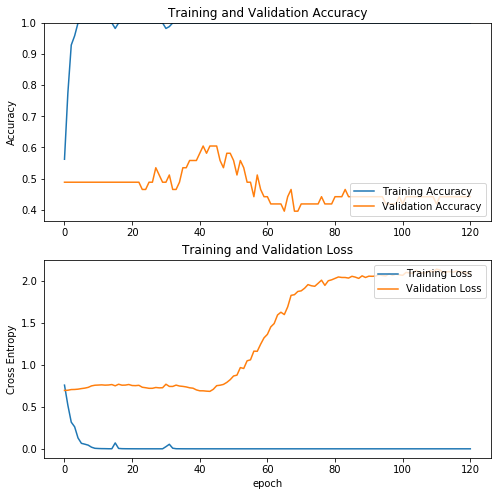

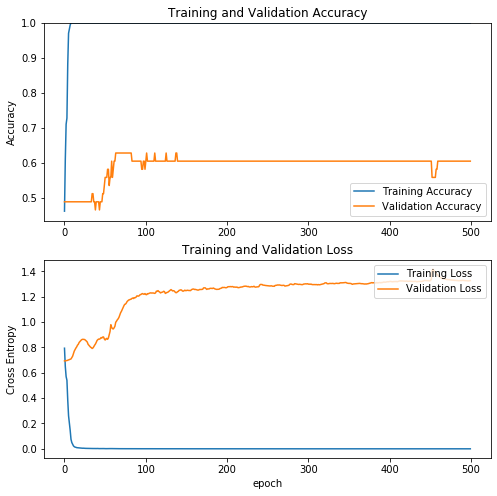

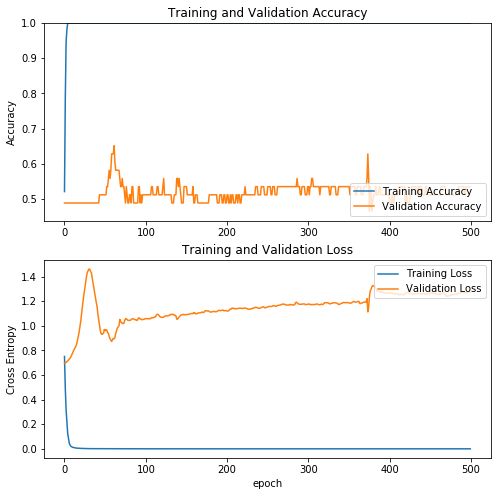

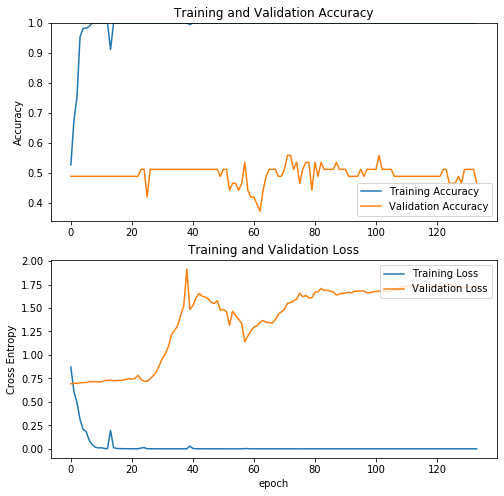

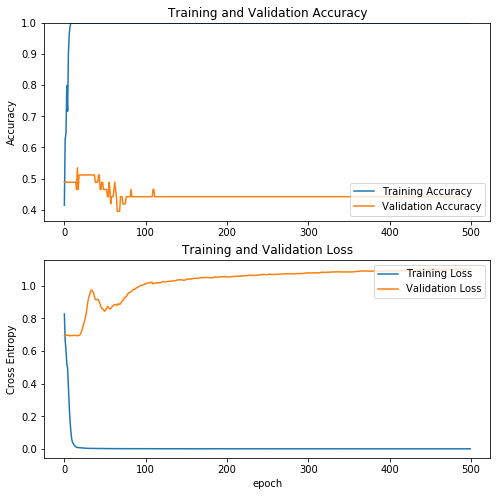

...

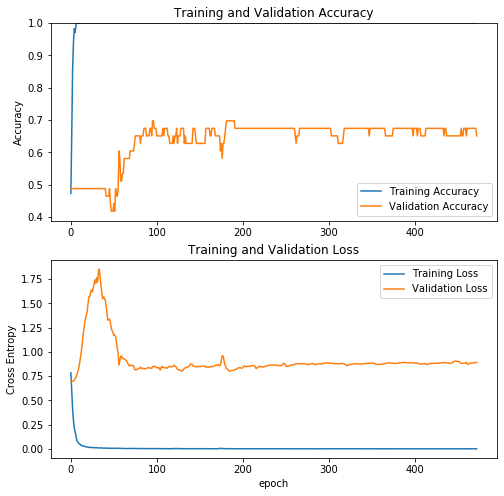

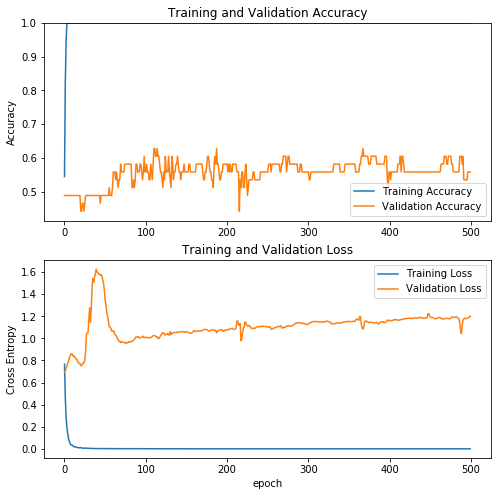

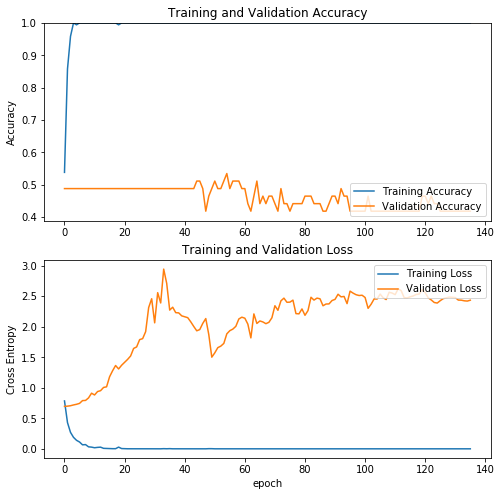

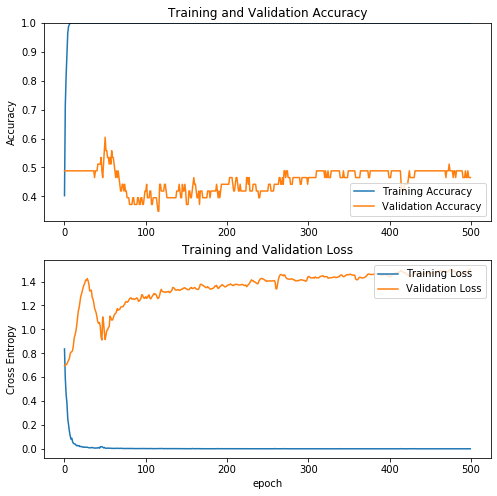

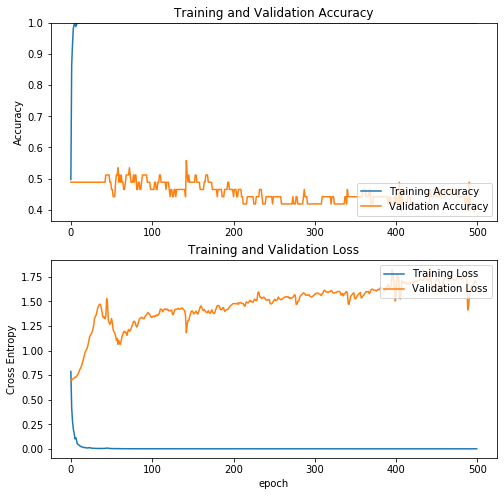

In [21]:
import pandas as pd
from keras.utils import to_categorical

columns = ["slice-dataset", "dataset", "optimizer","sequence", "percentile", "Train_acc", "Train_loss", "Val_acc", "Val_loss"]

rows_list = []

side = 64
epochs=500
batch_size=16
    
result_file = "results-2.8_bratz_unbalanced.csv"

recover_count = 0

recover = False

if recover:
    df = pd.read_csv(result_file)
    rows_list = df.iloc[:, 1:]
    rows_list = np.array(rows_list).tolist()

for slice_dataset in ["/data/RMN/dataset-gliomi-cnn/datasets-full-brain", "/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop"]:
    for dataset in ["survivor"]:
        for sequence in ["flair", "t1", "t2", "t1ce"]:
            for percentile in [100]:
                
                if recover and recover_count < len(rows_list):
                    pass
                    
                for optimizer_name in ['rmsprop','sgd','adam']:
                    
                    if recover and recover_count < len(rows_list):
                        recover_count = recover_count + 1
                        print("Skip row:", recover_count)
                        continue
                        
                    recover = False
                    
                    # try:
                    
                    excludes=None
                    if sequence == 't1':
                        excludes = ['RE_ATTILIO']

                    K.clear_session()

                    X_train, y_train, X_test, y_test = get_data(f"{slice_dataset}/bratz-{sequence}-{side}-{percentile}.pickle",
                                                                f"{slice_dataset}/../dataset-{dataset}-brats19_new.csv",
                                                                excludes=excludes)

                    model = CNN_2D(
                        n_features=256,
                        input_shape=(side, side, 1), 
                        classes=2, 
                        zero_pad=True,
                        avg_pool=True,
                        random_seed=42)

                    # model.summary()

                    model.compile(optimizer=optimizers[f'{optimizer_name}'](), loss='categorical_crossentropy', metrics=['accuracy'])

                    print("Starting fit")

                    history,balanced_X,balanced_y,y_test = train_and_test(model, 
                                             X_train, y_train, X_test, y_test, 
                                             random_state=42, 
                                             epochs=epochs, 
                                             batch_size=batch_size, 
                                             balance=False)

                    plot_file_name = make_name(slice_dataset, dataset, optimizer_name, sequence, str(percentile))

                    save_plot(history, f"2.8-{plot_file_name}_bratz_unbalanced")

                    train_score = model.evaluate(balanced_X, balanced_y)

                    test_score = model.evaluate(X_test, y_test)

                    #scores_str = ", ".join(str(x) for x in (scores * 100))

                    rows_list.append([
                        slice_dataset,
                        dataset,
                        optimizer_name,
                        sequence,
                        percentile,
                        str(train_score[1]),
                        str(train_score[0]),
                        str(test_score[1]),
                        str(test_score[0])
                    ])

                    df = pd.DataFrame(rows_list, columns=columns)

                    df.to_csv(result_file)

In [126]:
import pandas as pd
from keras.utils import to_categorical

#columns = ["slice-dataset", "dataset", "optimizer","sequence", "percentile", "Train_acc", "Train_loss", "Val_acc", "Val_loss"]

slice_dataset="/data/RMN/dataset-gliomi-cnn/datasets-full-brain"
side = 64
epochs=500
batch_size=16

sequence="T1"

side="64"
percentile="100"
dataset="ki67"
    
result_file = "results-2.6_balanced.csv"

recover_count = 0

recover = False




X_train, y_train, X_test, y_test = get_data(f"{slice_dataset}/{sequence}-{side}-{percentile}.pickle",
                                                                f"{slice_dataset}/../dataset-{dataset}.csv")




Subject in intersection: 105


In [127]:
print(X_train.shape,y_train.shape,X_test.shape,y_test.shape)

(84, 64, 64, 1) (84,) (21, 64, 64, 1) (21,)


In [133]:
X=X_train[:5]
y=y_train[:5]

In [134]:
y

array([1, 1, 0, 1, 1])

In [145]:
X_zero, y_zero = fill_with_random_images( X[y == 0.0], y[y == 0.0],target_slices=4)
X_one, y_one = X[y == 1.0], y[y == 1.0]

print(X_zero[:,0,:,:,:].shape,y_zero.shape,X_one.shape,y_one.shape)
np.concatenate((X_zero[:,0,:,:,:], X_one),axis=0), np.concatenate((y_zero[:,0], y_one),axis=0)

(4, 64, 64, 1) (4, 1) (4, 64, 64, 1) (4,)


(array([[[[0.00073365],
          [0.00073365],
          [0.00073365],
          ...,
          [0.00922306],
          [0.00554392],
          [0.01774759]],
 
         [[0.00073365],
          [0.00073365],
          [0.00073365],
          ...,
          [0.00901256],
          [0.00657866],
          [0.01744856]],
 
         [[0.00073365],
          [0.00073365],
          [0.00073365],
          ...,
          [0.0084162 ],
          [0.00849893],
          [0.0155103 ]],
 
         ...,
 
         [[0.01288111],
          [0.01637577],
          [0.00902381],
          ...,
          [0.00073365],
          [0.00073365],
          [0.00073365]],
 
         [[0.01503852],
          [0.01491118],
          [0.00842981],
          ...,
          [0.00073365],
          [0.00073365],
          [0.00073365]],
 
         [[0.01719592],
          [0.0134466 ],
          [0.00783581],
          ...,
          [0.00073365],
          [0.00073365],
          [0.00073365]]],
 
 
        [

In [128]:
balanced_X, balanced_y = balance_dataset(X_train, y_train)

ValueError: all the input arrays must have same number of dimensions, but the array at index 0 has 5 dimension(s) and the array at index 1 has 4 dimension(s)

# Run over all (non balanced)

Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 11ms/sample - loss: 0.7217 - acc: 0.4808 - val_loss: 0.6922 - val_acc: 0.5556
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 0.6922 - val_acc: 0.5556
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.4423 - val_loss: 0.6923 - val_acc: 0.5556
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.4423 - val_loss: 0.6923 - val_acc: 0.5556
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.5000 - val_loss: 0.6922 - val_acc: 0.5556
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.4615 - val_loss: 0.6922 - val_acc: 0.5556
Epoch 7/500
104/104 [======================

Epoch 119/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 91342.1445 - val_acc: 0.4444
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 64350.1243 - val_acc: 0.4444
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.5000 - val_loss: 18659.6536 - val_acc: 0.4444
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 23729.3464 - val_acc: 0.4444
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.5000 - val_loss: 103214.4413 - val_acc: 0.4444
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.5000 - val_loss: 96268.0515 - val_acc: 0.4444
Epoch 125/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 50398.3934 - val_acc: 0.4444
Epoch 126/50

Epoch 41/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 3379.6076 - val_acc: 0.4444
Epoch 42/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 1657.5052 - val_acc: 0.4444
Epoch 43/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 1110.2690 - val_acc: 0.5556
Epoch 44/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 415.1309 - val_acc: 0.5556
Epoch 45/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 177.0535 - val_acc: 0.4444
Epoch 46/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 893.7232 - val_acc: 0.4444
Epoch 47/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 1705.2068 - val_acc: 0.4444
Epoch 48/500
104/104 [========

Epoch 48/500
104/104 [==============================] - 0s 5ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 2.6629 - val_acc: 0.4444
Epoch 49/500
104/104 [==============================] - 0s 5ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 3.4377 - val_acc: 0.4444
Epoch 50/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 3.8175 - val_acc: 0.4444
Epoch 51/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5000 - val_loss: 3.6194 - val_acc: 0.4444
Epoch 52/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5000 - val_loss: 4.3015 - val_acc: 0.4444
Epoch 53/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5000 - val_loss: 4.3416 - val_acc: 0.4444
Epoch 54/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.4808 - val_loss: 5.6767 - val_acc: 0.4444
Epoch 55/500
104/104 [==========================

104/104 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5117 - val_acc: 0.5185
Epoch 93/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.4387e-09 - acc: 1.0000 - val_loss: 1.5465 - val_acc: 0.4815
Epoch 94/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.4387e-09 - acc: 1.0000 - val_loss: 1.5640 - val_acc: 0.4815
Epoch 95/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5667 - val_acc: 0.5185
Epoch 96/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5872 - val_acc: 0.5185
Epoch 97/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5964 - val_acc: 0.5185
Epoch 98/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6072 - val_acc: 0.5556
Epoch 99/500
104/104 [===========

104/104 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.7947 - val_acc: 0.4815
Epoch 79/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7967 - val_acc: 0.5185
Epoch 80/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.8028 - val_acc: 0.5185
Epoch 81/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8105 - val_acc: 0.5556
Epoch 82/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8244 - val_acc: 0.5556
Epoch 83/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8381 - val_acc: 0.5556
Epoch 84/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8484 - val_acc: 0.5556
Epoch 85/500
104/104 [==============================] - 0s 4m

Epoch 137/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.2474e-04 - acc: 1.0000 - val_loss: 1.0049 - val_acc: 0.6296
Epoch 138/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.0137e-04 - acc: 1.0000 - val_loss: 1.0032 - val_acc: 0.6296
Epoch 139/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.2676e-04 - acc: 1.0000 - val_loss: 1.0048 - val_acc: 0.6296
Epoch 140/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.7705e-04 - acc: 1.0000 - val_loss: 1.0059 - val_acc: 0.6296
Epoch 141/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.7037e-04 - acc: 1.0000 - val_loss: 1.0075 - val_acc: 0.6296
Epoch 142/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.9502e-04 - acc: 1.0000 - val_loss: 1.0089 - val_acc: 0.6296
Epoch 143/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.5243e-04 - acc: 1.0000 - val_loss: 1.0095 - val_acc: 0.6296
Epoch 144/500

104/104 [==============================] - 0s 4ms/sample - loss: 3.9047e-04 - acc: 1.0000 - val_loss: 1.0617 - val_acc: 0.6296
Epoch 254/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.9715e-04 - acc: 1.0000 - val_loss: 1.0626 - val_acc: 0.5926
Epoch 255/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.5512e-04 - acc: 1.0000 - val_loss: 1.0627 - val_acc: 0.5926
Epoch 256/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.5293e-04 - acc: 1.0000 - val_loss: 1.0643 - val_acc: 0.5926
Epoch 257/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.0251e-04 - acc: 1.0000 - val_loss: 1.0632 - val_acc: 0.5926
Epoch 258/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.4139e-04 - acc: 1.0000 - val_loss: 1.0617 - val_acc: 0.6296
Epoch 259/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.1526e-04 - acc: 1.0000 - val_loss: 1.0609 - val_acc: 0.6296
Epoch 260/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 2.0448e-04 - acc: 1.0000 - val_loss: 1.0768 - val_acc: 0.5926
Epoch 370/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.4295e-04 - acc: 1.0000 - val_loss: 1.0762 - val_acc: 0.5926
Epoch 371/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0093e-04 - acc: 1.0000 - val_loss: 1.0764 - val_acc: 0.5926
Epoch 372/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.4686e-04 - acc: 1.0000 - val_loss: 1.0771 - val_acc: 0.5926
Epoch 373/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.2063e-04 - acc: 1.0000 - val_loss: 1.0758 - val_acc: 0.5926
Epoch 374/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.1971e-04 - acc: 1.0000 - val_loss: 1.0745 - val_acc: 0.5926
Epoch 375/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0748e-04 - acc: 1.0000 - val_loss: 1.0757 - val_acc: 0.5926
Epoch 376/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 1.5781e-04 - acc: 1.0000 - val_loss: 1.0884 - val_acc: 0.5926
Epoch 486/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.7308e-04 - acc: 1.0000 - val_loss: 1.0875 - val_acc: 0.5926
Epoch 487/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.7021e-04 - acc: 1.0000 - val_loss: 1.0869 - val_acc: 0.5926
Epoch 488/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0809e-04 - acc: 1.0000 - val_loss: 1.0870 - val_acc: 0.5926
Epoch 489/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.4851e-04 - acc: 1.0000 - val_loss: 1.0875 - val_acc: 0.5926
Epoch 490/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.6541e-04 - acc: 1.0000 - val_loss: 1.0869 - val_acc: 0.5926
Epoch 491/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.9311e-04 - acc: 1.0000 - val_loss: 1.0858 - val_acc: 0.5926
Epoch 492/500
104/104 [====

Epoch 101/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.6865e-04 - acc: 1.0000 - val_loss: 0.7759 - val_acc: 0.6296
Epoch 102/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.8451e-04 - acc: 1.0000 - val_loss: 0.7836 - val_acc: 0.6296
Epoch 103/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.8417e-04 - acc: 1.0000 - val_loss: 0.7933 - val_acc: 0.6296
Epoch 104/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.1748e-04 - acc: 1.0000 - val_loss: 0.7994 - val_acc: 0.6296
Epoch 105/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.8465e-04 - acc: 1.0000 - val_loss: 0.8031 - val_acc: 0.6296
Epoch 106/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.5157e-04 - acc: 1.0000 - val_loss: 0.8092 - val_acc: 0.6296
Epoch 107/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.5693e-04 - acc: 1.0000 - val_loss: 0.8175 - val_acc: 0.6296
Epoch 108/500

104/104 [==============================] - 0s 4ms/sample - loss: 7.8201e-05 - acc: 1.0000 - val_loss: 0.9482 - val_acc: 0.5926
Epoch 218/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.5359e-05 - acc: 1.0000 - val_loss: 0.9494 - val_acc: 0.5926
Epoch 219/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.5035e-05 - acc: 1.0000 - val_loss: 0.9481 - val_acc: 0.5926
Epoch 220/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.7708e-05 - acc: 1.0000 - val_loss: 0.9459 - val_acc: 0.5926
Epoch 221/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.9624e-05 - acc: 1.0000 - val_loss: 0.9460 - val_acc: 0.5926
Epoch 222/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.3175e-05 - acc: 1.0000 - val_loss: 0.9457 - val_acc: 0.5926
Epoch 223/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.4252e-05 - acc: 1.0000 - val_loss: 0.9462 - val_acc: 0.5926
Epoch 224/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 2.3201e-05 - acc: 1.0000 - val_loss: 0.9733 - val_acc: 0.6296
Epoch 334/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.3592e-05 - acc: 1.0000 - val_loss: 0.9756 - val_acc: 0.6296
Epoch 335/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.9709e-05 - acc: 1.0000 - val_loss: 0.9756 - val_acc: 0.6296
Epoch 336/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.7733e-05 - acc: 1.0000 - val_loss: 0.9761 - val_acc: 0.5926
Epoch 337/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.5687e-05 - acc: 1.0000 - val_loss: 0.9764 - val_acc: 0.5926
Epoch 338/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.4833e-05 - acc: 1.0000 - val_loss: 0.9792 - val_acc: 0.5926
Epoch 339/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.3076e-05 - acc: 1.0000 - val_loss: 0.9803 - val_acc: 0.5926
Epoch 340/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 1.4553e-05 - acc: 1.0000 - val_loss: 1.0129 - val_acc: 0.5926
Epoch 450/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.6360e-05 - acc: 1.0000 - val_loss: 1.0158 - val_acc: 0.5926
Epoch 451/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.4311e-05 - acc: 1.0000 - val_loss: 1.0177 - val_acc: 0.5926
Epoch 452/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.2948e-05 - acc: 1.0000 - val_loss: 1.0188 - val_acc: 0.5926
Epoch 453/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.1214e-05 - acc: 1.0000 - val_loss: 1.0190 - val_acc: 0.5926
Epoch 454/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.0951e-05 - acc: 1.0000 - val_loss: 1.0191 - val_acc: 0.5926
Epoch 455/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.5058e-05 - acc: 1.0000 - val_loss: 1.0194 - val_acc: 0.5926
Epoch 456/500
104/104 [====

121/121 [==============================] - 1s 4ms/sample - loss: 4.9260e-09 - acc: 1.0000 - val_loss: 2.8997 - val_acc: 0.4839
Epoch 65/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.8719e-08 - acc: 1.0000 - val_loss: 2.8915 - val_acc: 0.4839
Epoch 66/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.9704e-09 - acc: 1.0000 - val_loss: 2.9766 - val_acc: 0.4839
Epoch 67/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.9792 - val_acc: 0.4839
Epoch 68/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.8816e-09 - acc: 1.0000 - val_loss: 2.8716 - val_acc: 0.4839
Epoch 69/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.9014 - val_acc: 0.4839
Epoch 70/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.8826 - val_acc: 0.4839
Epoch 71/500
121/121 [===========

121/121 [==============================] - 1s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.2742 - val_acc: 0.4839
Epoch 64/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.2389 - val_acc: 0.4839
Epoch 65/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.2143 - val_acc: 0.4839
Epoch 66/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1950 - val_acc: 0.4839
Epoch 67/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.1768 - val_acc: 0.4839
Epoch 68/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.1712 - val_acc: 0.4516
Epoch 69/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 1.1625 - val_acc: 0.4516
Epoch 70/500
121/121 [==============================] - 1s 4m

Epoch 123/500
121/121 [==============================] - 0s 4ms/sample - loss: 8.8061e-04 - acc: 1.0000 - val_loss: 0.8552 - val_acc: 0.6129
Epoch 124/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.8550 - val_acc: 0.6129
Epoch 125/500
121/121 [==============================] - 1s 4ms/sample - loss: 9.2791e-04 - acc: 1.0000 - val_loss: 0.8562 - val_acc: 0.6129
Epoch 126/500
121/121 [==============================] - 1s 4ms/sample - loss: 9.7075e-04 - acc: 1.0000 - val_loss: 0.8557 - val_acc: 0.6129
Epoch 127/500
121/121 [==============================] - 1s 4ms/sample - loss: 8.9706e-04 - acc: 1.0000 - val_loss: 0.8545 - val_acc: 0.6129
Epoch 128/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.8801e-04 - acc: 1.0000 - val_loss: 0.8550 - val_acc: 0.6129
Epoch 129/500
121/121 [==============================] - 1s 4ms/sample - loss: 9.5233e-04 - acc: 1.0000 - val_loss: 0.8549 - val_acc: 0.6129
Epoch 130/500
121

Epoch 181/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.1163e-04 - acc: 1.0000 - val_loss: 0.8606 - val_acc: 0.6129
Epoch 182/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.8402e-04 - acc: 1.0000 - val_loss: 0.8608 - val_acc: 0.6129
Epoch 183/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.0407e-04 - acc: 1.0000 - val_loss: 0.8616 - val_acc: 0.6129
Epoch 184/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.1925e-04 - acc: 1.0000 - val_loss: 0.8617 - val_acc: 0.6129
Epoch 185/500
121/121 [==============================] - 1s 4ms/sample - loss: 5.6906e-04 - acc: 1.0000 - val_loss: 0.8623 - val_acc: 0.6129
Epoch 186/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.6291e-04 - acc: 1.0000 - val_loss: 0.8632 - val_acc: 0.6129
Epoch 187/500
121/121 [==============================] - 0s 4ms/sample - loss: 4.9080e-04 - acc: 1.0000 - val_loss: 0.8641 - val_acc: 0.6129
Epoch 188/500

121/121 [==============================] - 0s 4ms/sample - loss: 3.4812e-04 - acc: 1.0000 - val_loss: 0.8777 - val_acc: 0.6129
Epoch 298/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.5671e-04 - acc: 1.0000 - val_loss: 0.8773 - val_acc: 0.6129
Epoch 299/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.1834e-04 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.6129
Epoch 300/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.3821e-04 - acc: 1.0000 - val_loss: 0.8768 - val_acc: 0.6129
Epoch 301/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.0504e-04 - acc: 1.0000 - val_loss: 0.8776 - val_acc: 0.6129
Epoch 302/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.4159e-04 - acc: 1.0000 - val_loss: 0.8780 - val_acc: 0.6129
Epoch 303/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.0925e-04 - acc: 1.0000 - val_loss: 0.8777 - val_acc: 0.6129
Epoch 304/500
121/121 [====

121/121 [==============================] - 0s 4ms/sample - loss: 2.2716e-04 - acc: 1.0000 - val_loss: 0.8848 - val_acc: 0.6129
Epoch 414/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.2222e-04 - acc: 1.0000 - val_loss: 0.8852 - val_acc: 0.6129
Epoch 415/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.1102e-04 - acc: 1.0000 - val_loss: 0.8852 - val_acc: 0.6129
Epoch 416/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.6981e-04 - acc: 1.0000 - val_loss: 0.8858 - val_acc: 0.6129
Epoch 417/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.3159e-04 - acc: 1.0000 - val_loss: 0.8859 - val_acc: 0.6129
Epoch 418/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.1215e-04 - acc: 1.0000 - val_loss: 0.8865 - val_acc: 0.6129
Epoch 419/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.5689e-04 - acc: 1.0000 - val_loss: 0.8867 - val_acc: 0.6129
Epoch 420/500
121/121 [====

121/121 [==============================] - 1s 4ms/sample - loss: 5.3052e-04 - acc: 1.0000 - val_loss: 0.8292 - val_acc: 0.5484
Epoch 76/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.9275e-04 - acc: 1.0000 - val_loss: 0.8191 - val_acc: 0.5484
Epoch 77/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.8582e-04 - acc: 1.0000 - val_loss: 0.8104 - val_acc: 0.5806
Epoch 78/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.5131e-04 - acc: 1.0000 - val_loss: 0.8024 - val_acc: 0.5484
Epoch 79/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.6905e-04 - acc: 1.0000 - val_loss: 0.7966 - val_acc: 0.5484
Epoch 80/500
121/121 [==============================] - 1s 4ms/sample - loss: 4.2774e-04 - acc: 1.0000 - val_loss: 0.7927 - val_acc: 0.4839
Epoch 81/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.8643e-04 - acc: 1.0000 - val_loss: 0.7790 - val_acc: 0.5806
Epoch 82/500
121/121 [===========

121/121 [==============================] - 1s 4ms/sample - loss: 7.1776e-05 - acc: 1.0000 - val_loss: 0.8675 - val_acc: 0.5484
Epoch 192/500
121/121 [==============================] - 1s 4ms/sample - loss: 6.0466e-05 - acc: 1.0000 - val_loss: 0.8654 - val_acc: 0.5484
Epoch 193/500
121/121 [==============================] - 1s 4ms/sample - loss: 6.5521e-05 - acc: 1.0000 - val_loss: 0.8640 - val_acc: 0.5484
Epoch 194/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.9921e-05 - acc: 1.0000 - val_loss: 0.8633 - val_acc: 0.5484
Epoch 195/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.0476e-05 - acc: 1.0000 - val_loss: 0.8654 - val_acc: 0.5484
Epoch 196/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.6094e-05 - acc: 1.0000 - val_loss: 0.8659 - val_acc: 0.5484
Epoch 197/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.7016e-05 - acc: 1.0000 - val_loss: 0.8648 - val_acc: 0.5484
Epoch 198/500
121/121 [====

121/121 [==============================] - 1s 4ms/sample - loss: 2.6958e-05 - acc: 1.0000 - val_loss: 0.9089 - val_acc: 0.5484
Epoch 308/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.5751e-05 - acc: 1.0000 - val_loss: 0.9081 - val_acc: 0.5484
Epoch 309/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.6113e-05 - acc: 1.0000 - val_loss: 0.9068 - val_acc: 0.5484
Epoch 310/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.0146e-05 - acc: 1.0000 - val_loss: 0.9058 - val_acc: 0.5484
Epoch 311/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.6337e-05 - acc: 1.0000 - val_loss: 0.9060 - val_acc: 0.5484
Epoch 312/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.3238e-05 - acc: 1.0000 - val_loss: 0.9029 - val_acc: 0.5484
Epoch 313/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.5997e-05 - acc: 1.0000 - val_loss: 0.9016 - val_acc: 0.5484
Epoch 314/500
121/121 [====

Epoch 365/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.8448e-05 - acc: 1.0000 - val_loss: 0.9262 - val_acc: 0.5161
Epoch 366/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.5643e-05 - acc: 1.0000 - val_loss: 0.9246 - val_acc: 0.5161
Epoch 367/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.8480e-05 - acc: 1.0000 - val_loss: 0.9244 - val_acc: 0.5161
Epoch 368/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.5582e-05 - acc: 1.0000 - val_loss: 0.9241 - val_acc: 0.4839
Epoch 369/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.7452e-05 - acc: 1.0000 - val_loss: 0.9249 - val_acc: 0.5161
Epoch 370/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.3456e-05 - acc: 1.0000 - val_loss: 0.9254 - val_acc: 0.5161
Epoch 371/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.0351e-05 - acc: 1.0000 - val_loss: 0.9256 - val_acc: 0.5161
Epoch 372/500

121/121 [==============================] - 1s 4ms/sample - loss: 7.2136e-06 - acc: 1.0000 - val_loss: 0.9543 - val_acc: 0.5161
Epoch 482/500
121/121 [==============================] - 1s 4ms/sample - loss: 6.6570e-06 - acc: 1.0000 - val_loss: 0.9553 - val_acc: 0.5161
Epoch 483/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.0117e-05 - acc: 1.0000 - val_loss: 0.9531 - val_acc: 0.5161
Epoch 484/500
121/121 [==============================] - 1s 4ms/sample - loss: 9.0992e-06 - acc: 1.0000 - val_loss: 0.9543 - val_acc: 0.5161
Epoch 485/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.2648e-06 - acc: 1.0000 - val_loss: 0.9544 - val_acc: 0.5161
Epoch 486/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.7870e-06 - acc: 1.0000 - val_loss: 0.9546 - val_acc: 0.5161
Epoch 487/500
121/121 [==============================] - 1s 4ms/sample - loss: 8.5633e-06 - acc: 1.0000 - val_loss: 0.9549 - val_acc: 0.5161
Epoch 488/500
121/121 [====

Epoch 38/500
116/116 [==============================] - 0s 4ms/sample - loss: 7.1842e-04 - acc: 1.0000 - val_loss: 0.7129 - val_acc: 0.5333
Epoch 39/500
116/116 [==============================] - 0s 4ms/sample - loss: 3.8486e-04 - acc: 1.0000 - val_loss: 0.7146 - val_acc: 0.4667
Epoch 40/500
116/116 [==============================] - 0s 4ms/sample - loss: 3.6240e-04 - acc: 1.0000 - val_loss: 0.7052 - val_acc: 0.5333
Epoch 41/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.8143e-04 - acc: 1.0000 - val_loss: 0.6991 - val_acc: 0.5000
Epoch 42/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0393e-04 - acc: 1.0000 - val_loss: 0.7078 - val_acc: 0.5667
Epoch 43/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0247e-04 - acc: 1.0000 - val_loss: 0.6834 - val_acc: 0.7000
Epoch 44/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.1087e-04 - acc: 1.0000 - val_loss: 0.7028 - val_acc: 0.6000
Epoch 45/500
116/116

116/116 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5145 - val_acc: 0.6333
Epoch 155/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5036 - val_acc: 0.6333
Epoch 156/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.4987 - val_acc: 0.6333
Epoch 157/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.4931 - val_acc: 0.6333
Epoch 158/500
30/30 [==============================] - 0s 10ms/sample - loss: 1.4909 - acc: 0.6333
Subject in intersection: 146
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 116 samples, validate on 30 samples
Epoch 1/500
116/116 [==============================] - 1s 9ms/sample - loss: 0.8119 - acc: 0.4569 - val_loss: 0.6945 - val_acc: 0.5000
Epoch 2/500
116/116 [==============================] - 0s 4ms/sample -

Epoch 54/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.9896 - val_acc: 0.4333
Epoch 55/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.0152 - val_acc: 0.4333
Epoch 56/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.0280 - val_acc: 0.4333
Epoch 57/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.0423 - val_acc: 0.4333
Epoch 58/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.0477 - val_acc: 0.4333
Epoch 59/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.0518 - val_acc: 0.4333
Epoch 60/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.0622 - val_acc: 0.4333
Epoch 61/500
116/116 [==========================

116/116 [==============================] - 0s 4ms/sample - loss: 5.8334e-04 - acc: 1.0000 - val_loss: 0.8077 - val_acc: 0.5000
Epoch 173/500
116/116 [==============================] - 0s 4ms/sample - loss: 6.5093e-04 - acc: 1.0000 - val_loss: 0.8099 - val_acc: 0.5000
Epoch 174/500
116/116 [==============================] - 0s 4ms/sample - loss: 5.5830e-04 - acc: 1.0000 - val_loss: 0.8131 - val_acc: 0.5000
Epoch 175/500
116/116 [==============================] - 0s 4ms/sample - loss: 5.5922e-04 - acc: 1.0000 - val_loss: 0.8127 - val_acc: 0.5000
Epoch 176/500
116/116 [==============================] - 0s 4ms/sample - loss: 8.8133e-04 - acc: 1.0000 - val_loss: 0.8117 - val_acc: 0.5000
Epoch 177/500
116/116 [==============================] - 0s 4ms/sample - loss: 7.3137e-04 - acc: 1.0000 - val_loss: 0.8085 - val_acc: 0.5000
Epoch 178/500
116/116 [==============================] - 0s 4ms/sample - loss: 7.7899e-04 - acc: 1.0000 - val_loss: 0.8122 - val_acc: 0.5000
Epoch 179/500
116/116 [====

116/116 [==============================] - 0s 4ms/sample - loss: 0.1272 - acc: 1.0000 - val_loss: 0.7028 - val_acc: 0.5000
Epoch 6/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.1003 - acc: 1.0000 - val_loss: 0.7049 - val_acc: 0.5000
Epoch 7/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0692 - acc: 1.0000 - val_loss: 0.7083 - val_acc: 0.5000
Epoch 8/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0447 - acc: 1.0000 - val_loss: 0.7105 - val_acc: 0.5000
Epoch 9/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0406 - acc: 1.0000 - val_loss: 0.7141 - val_acc: 0.5000
Epoch 10/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0286 - acc: 1.0000 - val_loss: 0.7170 - val_acc: 0.5000
Epoch 11/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0311 - acc: 1.0000 - val_loss: 0.7198 - val_acc: 0.5000
Epoch 12/500
116/116 [==============================] - 0s 4ms/sa

116/116 [==============================] - 0s 4ms/sample - loss: 2.3679e-04 - acc: 1.0000 - val_loss: 0.7574 - val_acc: 0.6000
Epoch 124/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.8984e-04 - acc: 1.0000 - val_loss: 0.7618 - val_acc: 0.6000
Epoch 125/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.3682e-04 - acc: 1.0000 - val_loss: 0.7614 - val_acc: 0.5667
Epoch 126/500
116/116 [==============================] - 0s 4ms/sample - loss: 3.0617e-04 - acc: 1.0000 - val_loss: 0.7619 - val_acc: 0.6000
Epoch 127/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.5393e-04 - acc: 1.0000 - val_loss: 0.7614 - val_acc: 0.6000
Epoch 128/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.9731e-04 - acc: 1.0000 - val_loss: 0.7626 - val_acc: 0.6000
Epoch 129/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.1260e-04 - acc: 1.0000 - val_loss: 0.7585 - val_acc: 0.5667
Epoch 130/500
116/116 [====

116/116 [==============================] - 0s 4ms/sample - loss: 9.1999e-05 - acc: 1.0000 - val_loss: 0.9670 - val_acc: 0.5333
Epoch 240/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.4717e-04 - acc: 1.0000 - val_loss: 0.9549 - val_acc: 0.5333
Epoch 241/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.6994e-04 - acc: 1.0000 - val_loss: 0.9847 - val_acc: 0.5000
Epoch 242/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.3056e-04 - acc: 1.0000 - val_loss: 1.1284 - val_acc: 0.5667
Epoch 243/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.7308e-04 - acc: 1.0000 - val_loss: 1.1475 - val_acc: 0.5333
Epoch 244/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.5768e-04 - acc: 1.0000 - val_loss: 1.1338 - val_acc: 0.5333
Epoch 245/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.4099e-04 - acc: 1.0000 - val_loss: 1.1109 - val_acc: 0.5000
Epoch 246/500
116/116 [====

116/116 [==============================] - 0s 4ms/sample - loss: 2.7125e-05 - acc: 1.0000 - val_loss: 0.8731 - val_acc: 0.5667
Epoch 356/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.2423e-05 - acc: 1.0000 - val_loss: 0.8760 - val_acc: 0.5667
Epoch 357/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.9862e-05 - acc: 1.0000 - val_loss: 0.8785 - val_acc: 0.5667
Epoch 358/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.4080e-05 - acc: 1.0000 - val_loss: 0.8801 - val_acc: 0.5667
Epoch 359/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.3346e-05 - acc: 1.0000 - val_loss: 0.8816 - val_acc: 0.5667
Epoch 360/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.3374e-05 - acc: 1.0000 - val_loss: 0.8814 - val_acc: 0.5667
Epoch 361/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.6572e-05 - acc: 1.0000 - val_loss: 0.8802 - val_acc: 0.5667
Epoch 362/500
116/116 [====

116/116 [==============================] - 0s 4ms/sample - loss: 8.0538e-06 - acc: 1.0000 - val_loss: 0.8943 - val_acc: 0.6000
Epoch 472/500
116/116 [==============================] - 0s 4ms/sample - loss: 8.4741e-06 - acc: 1.0000 - val_loss: 0.8950 - val_acc: 0.6000
Epoch 473/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0037e-05 - acc: 1.0000 - val_loss: 0.8955 - val_acc: 0.6000
Epoch 474/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.1083e-05 - acc: 1.0000 - val_loss: 0.8973 - val_acc: 0.6000
Epoch 475/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0094e-05 - acc: 1.0000 - val_loss: 0.9017 - val_acc: 0.6000
Epoch 476/500
116/116 [==============================] - 0s 4ms/sample - loss: 7.9304e-06 - acc: 1.0000 - val_loss: 0.9006 - val_acc: 0.6000
Epoch 477/500
116/116 [==============================] - 0s 4ms/sample - loss: 9.2993e-06 - acc: 1.0000 - val_loss: 0.8989 - val_acc: 0.6000
Epoch 478/500
116/116 [====

81/81 [==============================] - 0s 4ms/sample - loss: 4.8567e-08 - acc: 1.0000 - val_loss: 1.0007 - val_acc: 0.4762
Epoch 88/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.5321e-08 - acc: 1.0000 - val_loss: 1.0100 - val_acc: 0.5238
Epoch 89/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.3548e-08 - acc: 1.0000 - val_loss: 1.0254 - val_acc: 0.5238
Epoch 90/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.7661e-08 - acc: 1.0000 - val_loss: 1.0496 - val_acc: 0.5238
Epoch 91/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.4717e-08 - acc: 1.0000 - val_loss: 1.0600 - val_acc: 0.5238
Epoch 92/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.6793e-08 - acc: 1.0000 - val_loss: 0.9641 - val_acc: 0.6190
Epoch 93/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.9434e-08 - acc: 1.0000 - val_loss: 1.0032 - val_acc: 0.6190
Epoch 94/500
81/81 [===========================

81/81 [==============================] - 0s 4ms/sample - loss: 0.0060 - acc: 1.0000 - val_loss: 0.6458 - val_acc: 0.7619
Epoch 50/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0067 - acc: 1.0000 - val_loss: 0.6514 - val_acc: 0.7143
Epoch 51/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 0.6785 - val_acc: 0.6190
Epoch 52/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0155 - acc: 1.0000 - val_loss: 0.6954 - val_acc: 0.6190
Epoch 53/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0137 - acc: 1.0000 - val_loss: 0.7076 - val_acc: 0.6190
Epoch 54/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0089 - acc: 1.0000 - val_loss: 0.7178 - val_acc: 0.4762
Epoch 55/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 0.7249 - val_acc: 0.4762
Epoch 56/500
81/81 [==============================] - 0s 4ms/sample - loss:

Epoch 50/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6168 - val_acc: 0.6667
Epoch 51/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.6144 - val_acc: 0.6667
Epoch 52/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.6153 - val_acc: 0.6667
Epoch 53/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6154 - val_acc: 0.6667
Epoch 54/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.5820e-04 - acc: 1.0000 - val_loss: 0.6155 - val_acc: 0.6667
Epoch 55/500
81/81 [==============================] - 0s 4ms/sample - loss: 8.9736e-04 - acc: 1.0000 - val_loss: 0.6156 - val_acc: 0.6667
Epoch 56/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.6165 - val_acc: 0.6667
Epoch 57/500
81/81 [==============================] - 

Epoch 169/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 1.4238 - val_acc: 0.3333
Epoch 170/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0053 - acc: 1.0000 - val_loss: 1.4186 - val_acc: 0.3810
Epoch 171/500
21/21 [==============================] - 0s 1ms/sample - loss: 1.4366 - acc: 0.3810
Subject in intersection: 153
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 122 samples, validate on 31 samples
Epoch 1/500
122/122 [==============================] - 2s 14ms/sample - loss: 0.7616 - acc: 0.5738 - val_loss: 0.7055 - val_acc: 0.3548
Epoch 2/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.3584 - acc: 0.8770 - val_loss: 0.7248 - val_acc: 0.3548
Epoch 3/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.1725 - acc: 0.9918 - val_loss: 0.7418 - val_acc: 0.3548
Epoch 4/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0

122/122 [==============================] - 1s 5ms/sample - loss: 1.2898e-07 - acc: 1.0000 - val_loss: 1.4641 - val_acc: 0.3548
Epoch 56/500
122/122 [==============================] - 1s 4ms/sample - loss: 8.3056e-08 - acc: 1.0000 - val_loss: 1.3602 - val_acc: 0.3548
Epoch 57/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.6673e-08 - acc: 1.0000 - val_loss: 1.3457 - val_acc: 0.3548
Epoch 58/500
122/122 [==============================] - 1s 4ms/sample - loss: 4.4948e-08 - acc: 1.0000 - val_loss: 1.2931 - val_acc: 0.3548
Epoch 59/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.0520e-08 - acc: 1.0000 - val_loss: 1.2797 - val_acc: 0.3548
Epoch 60/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.5405e-08 - acc: 1.0000 - val_loss: 1.2789 - val_acc: 0.3548
Epoch 61/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.7588e-08 - acc: 1.0000 - val_loss: 1.2454 - val_acc: 0.3548
Epoch 62/500
122/122 [===========

Epoch 50/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9228 - val_acc: 0.3548
Epoch 51/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9101 - val_acc: 0.3548
Epoch 52/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.8959 - val_acc: 0.3548
Epoch 53/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8849 - val_acc: 0.3871
Epoch 54/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8842 - val_acc: 0.3871
Epoch 55/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.8868 - val_acc: 0.3871
Epoch 56/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8894 - val_acc: 0.3871
Epoch 57/500
122/122 [==========================

122/122 [==============================] - 1s 4ms/sample - loss: 4.6507e-04 - acc: 1.0000 - val_loss: 0.9581 - val_acc: 0.5484
Epoch 168/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.4714e-04 - acc: 1.0000 - val_loss: 0.9583 - val_acc: 0.5484
Epoch 169/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.1767e-04 - acc: 1.0000 - val_loss: 0.9601 - val_acc: 0.5484
Epoch 170/500
122/122 [==============================] - 1s 4ms/sample - loss: 4.7532e-04 - acc: 1.0000 - val_loss: 0.9603 - val_acc: 0.5484
Epoch 171/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.1856e-04 - acc: 1.0000 - val_loss: 0.9618 - val_acc: 0.5484
Epoch 172/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.1128e-04 - acc: 1.0000 - val_loss: 0.9608 - val_acc: 0.5484
Epoch 173/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.3332e-04 - acc: 1.0000 - val_loss: 0.9597 - val_acc: 0.5484
Epoch 174/500
122/122 [====

122/122 [==============================] - 1s 4ms/sample - loss: 2.7331e-04 - acc: 1.0000 - val_loss: 0.9867 - val_acc: 0.5484
Epoch 284/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.4070e-04 - acc: 1.0000 - val_loss: 0.9860 - val_acc: 0.5484
Epoch 285/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.5330e-04 - acc: 1.0000 - val_loss: 0.9860 - val_acc: 0.5484
Epoch 286/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.9531e-04 - acc: 1.0000 - val_loss: 0.9860 - val_acc: 0.5484
Epoch 287/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.8651e-04 - acc: 1.0000 - val_loss: 0.9853 - val_acc: 0.5484
Epoch 288/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.1776e-04 - acc: 1.0000 - val_loss: 0.9850 - val_acc: 0.5484
Epoch 289/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.9631e-04 - acc: 1.0000 - val_loss: 0.9880 - val_acc: 0.5484
Epoch 290/500
122/122 [====

122/122 [==============================] - 1s 4ms/sample - loss: 2.1123e-04 - acc: 1.0000 - val_loss: 1.0039 - val_acc: 0.5484
Epoch 400/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.1222e-04 - acc: 1.0000 - val_loss: 1.0043 - val_acc: 0.5484
Epoch 401/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.0581e-04 - acc: 1.0000 - val_loss: 1.0047 - val_acc: 0.5484
Epoch 402/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.2872e-04 - acc: 1.0000 - val_loss: 1.0053 - val_acc: 0.5484
Epoch 403/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.8505e-04 - acc: 1.0000 - val_loss: 1.0060 - val_acc: 0.5484
Epoch 404/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.9681e-04 - acc: 1.0000 - val_loss: 1.0057 - val_acc: 0.5484
Epoch 405/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.0235e-04 - acc: 1.0000 - val_loss: 1.0064 - val_acc: 0.5484
Epoch 406/500
122/122 [====

122/122 [==============================] - 0s 4ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 0.8081 - val_acc: 0.3548
Epoch 14/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 0.8279 - val_acc: 0.3548
Epoch 15/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0049 - acc: 1.0000 - val_loss: 0.8501 - val_acc: 0.3548
Epoch 16/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.8721 - val_acc: 0.3548
Epoch 17/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 0.8944 - val_acc: 0.3548
Epoch 18/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.9103 - val_acc: 0.3548
Epoch 19/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.9268 - val_acc: 0.3548
Epoch 20/500
122/122 [==============================] - 1s 4m

122/122 [==============================] - 1s 4ms/sample - loss: 1.1759e-04 - acc: 1.0000 - val_loss: 0.9372 - val_acc: 0.4516
Epoch 131/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.2689e-04 - acc: 1.0000 - val_loss: 0.9380 - val_acc: 0.4516
Epoch 132/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.1985e-04 - acc: 1.0000 - val_loss: 0.9406 - val_acc: 0.4516
Epoch 133/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.4387e-04 - acc: 1.0000 - val_loss: 0.9417 - val_acc: 0.4516
Epoch 134/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.5331e-04 - acc: 1.0000 - val_loss: 0.9416 - val_acc: 0.4516
Epoch 135/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.2330e-04 - acc: 1.0000 - val_loss: 0.9447 - val_acc: 0.4516
Epoch 136/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.1056e-04 - acc: 1.0000 - val_loss: 0.9441 - val_acc: 0.4516
Epoch 137/500
122/122 [====

122/122 [==============================] - 1s 4ms/sample - loss: 3.9060e-05 - acc: 1.0000 - val_loss: 0.9871 - val_acc: 0.4839
Epoch 247/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.6305e-05 - acc: 1.0000 - val_loss: 0.9872 - val_acc: 0.4839
Epoch 248/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.7074e-05 - acc: 1.0000 - val_loss: 0.9886 - val_acc: 0.4839
Epoch 249/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.6780e-05 - acc: 1.0000 - val_loss: 0.9893 - val_acc: 0.4839
Epoch 250/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.8830e-05 - acc: 1.0000 - val_loss: 0.9887 - val_acc: 0.4839
Epoch 251/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.2480e-05 - acc: 1.0000 - val_loss: 0.9872 - val_acc: 0.4839
Epoch 252/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.8627e-05 - acc: 1.0000 - val_loss: 0.9863 - val_acc: 0.4839
Epoch 253/500
122/122 [====

122/122 [==============================] - 1s 4ms/sample - loss: 1.5015e-05 - acc: 1.0000 - val_loss: 1.0280 - val_acc: 0.4839
Epoch 363/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.9270e-05 - acc: 1.0000 - val_loss: 1.0285 - val_acc: 0.4839
Epoch 364/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.9819e-05 - acc: 1.0000 - val_loss: 1.0289 - val_acc: 0.4839
Epoch 365/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.5573e-05 - acc: 1.0000 - val_loss: 1.0300 - val_acc: 0.4839
Epoch 366/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.8251e-05 - acc: 1.0000 - val_loss: 1.0285 - val_acc: 0.4839
Epoch 367/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.4988e-05 - acc: 1.0000 - val_loss: 1.0292 - val_acc: 0.4839
Epoch 368/500
122/122 [==============================] - 1s 4ms/sample - loss: 1.6358e-05 - acc: 1.0000 - val_loss: 1.0300 - val_acc: 0.4839
Epoch 369/500
122/122 [====

122/122 [==============================] - 1s 4ms/sample - loss: 8.0661e-06 - acc: 1.0000 - val_loss: 1.0440 - val_acc: 0.5161
Epoch 479/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.7661e-06 - acc: 1.0000 - val_loss: 1.0432 - val_acc: 0.5161
Epoch 480/500
122/122 [==============================] - 1s 4ms/sample - loss: 6.9923e-06 - acc: 1.0000 - val_loss: 1.0432 - val_acc: 0.5161
Epoch 481/500
122/122 [==============================] - 1s 4ms/sample - loss: 8.8253e-06 - acc: 1.0000 - val_loss: 1.0447 - val_acc: 0.5161
Epoch 482/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.8893e-06 - acc: 1.0000 - val_loss: 1.0459 - val_acc: 0.4839
Epoch 483/500
122/122 [==============================] - 1s 4ms/sample - loss: 9.4282e-06 - acc: 1.0000 - val_loss: 1.0455 - val_acc: 0.5161
Epoch 484/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.2131e-06 - acc: 1.0000 - val_loss: 1.0480 - val_acc: 0.4839
Epoch 485/500
122/122 [====

Epoch 36/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5016 - acc: 0.8030 - val_loss: 0.5331 - val_acc: 0.8235
Epoch 37/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5017 - acc: 0.8030 - val_loss: 0.5421 - val_acc: 0.8235
Epoch 38/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5004 - acc: 0.8030 - val_loss: 0.5190 - val_acc: 0.8235
Epoch 39/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4986 - acc: 0.8030 - val_loss: 0.5165 - val_acc: 0.8235
Epoch 40/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4977 - acc: 0.8030 - val_loss: 0.5147 - val_acc: 0.8235
Epoch 41/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4983 - acc: 0.8030 - val_loss: 0.4926 - val_acc: 0.8235
Epoch 42/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4980 - acc: 0.8030 - val_loss: 0.5063 - val_acc: 0.8235
Epoch 43/500
66/66 [==============================] - 0s 4ms/s

Epoch 97/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4968 - acc: 0.8030 - val_loss: 360.9142 - val_acc: 0.8235
Epoch 98/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4963 - acc: 0.8030 - val_loss: 264.9595 - val_acc: 0.8235
Epoch 99/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4966 - acc: 0.8030 - val_loss: 698.5315 - val_acc: 0.8235
Epoch 100/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4969 - acc: 0.8030 - val_loss: 430.8157 - val_acc: 0.8235
Epoch 101/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4970 - acc: 0.8030 - val_loss: 583.6209 - val_acc: 0.8235
Epoch 102/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4980 - acc: 0.8030 - val_loss: 835.1365 - val_acc: 0.8235
Epoch 103/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4986 - acc: 0.8030 - val_loss: 1431.0465 - val_acc: 0.8235
Epoch 104/500
66/66 [======================

66/66 [==============================] - 0s 4ms/sample - loss: 0.5101 - acc: 0.8030 - val_loss: 0.5447 - val_acc: 0.8235
Epoch 21/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5074 - acc: 0.8030 - val_loss: 0.6208 - val_acc: 0.8235
Epoch 22/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5056 - acc: 0.8030 - val_loss: 0.5434 - val_acc: 0.8235
Epoch 23/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5040 - acc: 0.8030 - val_loss: 0.5083 - val_acc: 0.8235
Epoch 24/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5034 - acc: 0.8030 - val_loss: 0.5444 - val_acc: 0.8235
Epoch 25/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5011 - acc: 0.8030 - val_loss: 0.6277 - val_acc: 0.8235
Epoch 26/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4992 - acc: 0.8030 - val_loss: 0.7159 - val_acc: 0.8235
Epoch 27/500
66/66 [==============================] - 0s 4ms/sample - loss:

Epoch 81/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4972 - acc: 0.8030 - val_loss: 6025.2040 - val_acc: 0.8235
Epoch 82/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4972 - acc: 0.8030 - val_loss: 9389.3989 - val_acc: 0.8235
Epoch 83/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4977 - acc: 0.8030 - val_loss: 6771.9858 - val_acc: 0.8235
Epoch 84/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4975 - acc: 0.8030 - val_loss: 11110.3833 - val_acc: 0.8235
Epoch 85/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4971 - acc: 0.8030 - val_loss: 9519.7443 - val_acc: 0.8235
Epoch 86/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4967 - acc: 0.8030 - val_loss: 9196.9871 - val_acc: 0.8235
Epoch 87/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4967 - acc: 0.8030 - val_loss: 10582.7537 - val_acc: 0.8235
Epoch 88/500
66/66 [===================

66/66 [==============================] - 0s 4ms/sample - loss: 0.4965 - acc: 0.8030 - val_loss: 46.1058 - val_acc: 0.8235
Epoch 85/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4965 - acc: 0.8030 - val_loss: 50.8170 - val_acc: 0.8235
Epoch 86/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4965 - acc: 0.8030 - val_loss: 31.5950 - val_acc: 0.8235
Epoch 87/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4967 - acc: 0.8030 - val_loss: 14.7583 - val_acc: 0.1765
Epoch 88/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4971 - acc: 0.8030 - val_loss: 45.5540 - val_acc: 0.1765
Epoch 89/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4969 - acc: 0.8030 - val_loss: 6.8009 - val_acc: 0.8235
Epoch 90/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4973 - acc: 0.8030 - val_loss: 29.3506 - val_acc: 0.8235
Epoch 91/500
66/66 [==============================] - 0s 4ms/sample -

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 944.1263 - acc: 0.8235
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 18ms/sample - loss: 0.5809 - acc: 0.7313 - val_loss: 0.7045 - val_acc: 0.1176
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2444 - acc: 0.8507 - val_loss: 0.7295 - val_acc: 0.1176
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1023 - acc: 0.9851 - val_loss: 0.7531 - val_acc: 0.1176
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0447 - acc: 1.0000 - val_loss: 0.7825 - val_acc: 0.1176
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0334 - acc: 1.0000 - val_loss: 0.8068 - val_acc: 0.1176
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0187 - acc: 1.0000 - val_lo

67/67 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.4353 - val_acc: 0.8235
Epoch 118/500
67/67 [==============================] - 0s 4ms/sample - loss: 7.1170e-09 - acc: 1.0000 - val_loss: 0.4395 - val_acc: 0.7647
Epoch 119/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.0817e-07 - acc: 1.0000 - val_loss: 0.6903 - val_acc: 0.5294
Epoch 120/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.4819e-06 - acc: 1.0000 - val_loss: 0.4564 - val_acc: 0.7059
Epoch 121/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2811e-07 - acc: 1.0000 - val_loss: 0.4135 - val_acc: 0.8235
Epoch 122/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.9638e-08 - acc: 1.0000 - val_loss: 0.4071 - val_acc: 0.8824
Epoch 123/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.6936e-08 - acc: 1.0000 - val_loss: 0.4610 - val_acc: 0.8235
Epoch 124/500
67/67 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.3763 - acc: 0.8824
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 12ms/sample - loss: 0.6040 - acc: 0.7463 - val_loss: 0.7018 - val_acc: 0.1176
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.4592 - acc: 0.8060 - val_loss: 0.7230 - val_acc: 0.1176
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.3380 - acc: 0.8806 - val_loss: 0.7531 - val_acc: 0.1176
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2340 - acc: 0.9403 - val_loss: 0.7841 - val_acc: 0.1176
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1585 - acc: 0.9701 - val_loss: 0.8117 - val_acc: 0.1176
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1133 - acc: 1.0000 - val_loss

Epoch 60/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.5860 - val_acc: 0.1176
Epoch 61/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.5558 - val_acc: 0.1176
Epoch 62/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.5258 - val_acc: 0.1176
Epoch 63/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.5169 - val_acc: 0.1176
Epoch 64/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.4963 - val_acc: 0.1176
Epoch 65/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.4714 - val_acc: 0.1176
Epoch 66/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.4409 - val_acc: 0.1176
Epoch 67/500
67/67 [==============================] - 0s 4ms/s

Epoch 120/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.9249e-04 - acc: 1.0000 - val_loss: 0.4020 - val_acc: 0.8235
Epoch 121/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.4354e-04 - acc: 1.0000 - val_loss: 0.3929 - val_acc: 0.8235
Epoch 122/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.0567e-04 - acc: 1.0000 - val_loss: 0.3825 - val_acc: 0.8235
Epoch 123/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.1238e-04 - acc: 1.0000 - val_loss: 0.3730 - val_acc: 0.8235
Epoch 124/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.7880e-04 - acc: 1.0000 - val_loss: 0.3634 - val_acc: 0.8235
Epoch 125/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.5779e-04 - acc: 1.0000 - val_loss: 0.3554 - val_acc: 0.8235
Epoch 126/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.5462e-04 - acc: 1.0000 - val_loss: 0.3488 - val_acc: 0.8235
Epoch 127/500
67/67 [======

Epoch 179/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.2835e-04 - acc: 1.0000 - val_loss: 0.3133 - val_acc: 0.9412
Epoch 180/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.0481e-04 - acc: 1.0000 - val_loss: 0.3141 - val_acc: 0.9412
Epoch 181/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.9754e-04 - acc: 1.0000 - val_loss: 0.3153 - val_acc: 0.9412
Epoch 182/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.9693e-04 - acc: 1.0000 - val_loss: 0.3157 - val_acc: 0.9412
Epoch 183/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.1404e-04 - acc: 1.0000 - val_loss: 0.3170 - val_acc: 0.9412
Epoch 184/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.6291e-04 - acc: 1.0000 - val_loss: 0.3178 - val_acc: 0.9412
Epoch 185/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.1153e-04 - acc: 1.0000 - val_loss: 0.3180 - val_acc: 0.9412
Epoch 186/500
67/67 [======

Epoch 238/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.9970e-04 - acc: 1.0000 - val_loss: 0.3460 - val_acc: 0.8824
Epoch 239/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.0080e-04 - acc: 1.0000 - val_loss: 0.3462 - val_acc: 0.8824
Epoch 240/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.5332e-04 - acc: 1.0000 - val_loss: 0.3472 - val_acc: 0.8824
Epoch 241/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.2834e-04 - acc: 1.0000 - val_loss: 0.3489 - val_acc: 0.8824
Epoch 242/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.2304e-04 - acc: 1.0000 - val_loss: 0.3494 - val_acc: 0.8824
Epoch 243/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.2946e-04 - acc: 1.0000 - val_loss: 0.3506 - val_acc: 0.8824
Epoch 244/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.8921e-04 - acc: 1.0000 - val_loss: 0.3506 - val_acc: 0.8824
Epoch 245/500
67/67 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.3601 - acc: 0.8824
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 12ms/sample - loss: 0.5803 - acc: 0.7164 - val_loss: 0.7059 - val_acc: 0.1176
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2515 - acc: 0.8358 - val_loss: 0.7336 - val_acc: 0.1176
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1124 - acc: 1.0000 - val_loss: 0.7731 - val_acc: 0.1176
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0610 - acc: 1.0000 - val_loss: 0.8165 - val_acc: 0.1176
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0413 - acc: 1.0000 - val_loss: 0.8524 - val_acc: 0.1176
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0327 - acc: 1.0000 - val_loss

67/67 [==============================] - 0s 4ms/sample - loss: 1.3769e-04 - acc: 1.0000 - val_loss: 0.5178 - val_acc: 0.6471
Epoch 119/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2789e-04 - acc: 1.0000 - val_loss: 0.5072 - val_acc: 0.6471
Epoch 120/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2168e-04 - acc: 1.0000 - val_loss: 0.4970 - val_acc: 0.6471
Epoch 121/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2161e-04 - acc: 1.0000 - val_loss: 0.4867 - val_acc: 0.6471
Epoch 122/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.1867e-04 - acc: 1.0000 - val_loss: 0.4762 - val_acc: 0.7647
Epoch 123/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2127e-04 - acc: 1.0000 - val_loss: 0.4649 - val_acc: 0.7647
Epoch 124/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.6646e-04 - acc: 1.0000 - val_loss: 0.4556 - val_acc: 0.8235
Epoch 125/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 6.9253e-05 - acc: 1.0000 - val_loss: 0.5106 - val_acc: 0.8824
Epoch 178/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.4797e-05 - acc: 1.0000 - val_loss: 0.5117 - val_acc: 0.8824
Epoch 179/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.2582e-05 - acc: 1.0000 - val_loss: 0.5124 - val_acc: 0.8824
Epoch 180/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.6465e-05 - acc: 1.0000 - val_loss: 0.5136 - val_acc: 0.8824
Epoch 181/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.6435e-05 - acc: 1.0000 - val_loss: 0.5135 - val_acc: 0.8824
Epoch 182/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.6142e-05 - acc: 1.0000 - val_loss: 0.5136 - val_acc: 0.8824
Epoch 183/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.4034e-05 - acc: 1.0000 - val_loss: 0.5145 - val_acc: 0.8824
Epoch 184/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 4.2520e-05 - acc: 1.0000 - val_loss: 0.5489 - val_acc: 0.8824
Epoch 237/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.7142e-05 - acc: 1.0000 - val_loss: 0.5501 - val_acc: 0.8824
Epoch 238/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.2921e-05 - acc: 1.0000 - val_loss: 0.5502 - val_acc: 0.8824
Epoch 239/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.4302e-05 - acc: 1.0000 - val_loss: 0.5514 - val_acc: 0.8824
Epoch 240/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.3318e-05 - acc: 1.0000 - val_loss: 0.5520 - val_acc: 0.8824
Epoch 241/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.8050e-05 - acc: 1.0000 - val_loss: 0.5523 - val_acc: 0.8824
Epoch 242/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.0272e-05 - acc: 1.0000 - val_loss: 0.5526 - val_acc: 0.8824
Epoch 243/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 6.4679e-05 - acc: 1.0000 - val_loss: 0.5835 - val_acc: 0.8824
Epoch 296/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.1034e-05 - acc: 1.0000 - val_loss: 0.5761 - val_acc: 0.8824
Epoch 297/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.2843e-05 - acc: 1.0000 - val_loss: 0.5729 - val_acc: 0.8824
Epoch 298/500
67/67 [==============================] - 0s 4ms/sample - loss: 5.1292e-05 - acc: 1.0000 - val_loss: 0.5704 - val_acc: 0.8824
Epoch 299/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.4999e-05 - acc: 1.0000 - val_loss: 0.5674 - val_acc: 0.8824
Epoch 300/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.2594e-05 - acc: 1.0000 - val_loss: 0.5675 - val_acc: 0.8824
Epoch 301/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.0363e-05 - acc: 1.0000 - val_loss: 0.5677 - val_acc: 0.8824
Epoch 302/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 1.7995e-05 - acc: 1.0000 - val_loss: 0.5628 - val_acc: 0.8824
Epoch 355/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.8673e-05 - acc: 1.0000 - val_loss: 0.5641 - val_acc: 0.8824
Epoch 356/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.7630e-05 - acc: 1.0000 - val_loss: 0.5662 - val_acc: 0.8824
Epoch 357/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.6198e-05 - acc: 1.0000 - val_loss: 0.5674 - val_acc: 0.8824
Epoch 358/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.7901e-05 - acc: 1.0000 - val_loss: 0.5668 - val_acc: 0.8824
Epoch 359/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.7911e-05 - acc: 1.0000 - val_loss: 0.5668 - val_acc: 0.8824
Epoch 360/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.4953e-05 - acc: 1.0000 - val_loss: 0.5663 - val_acc: 0.8824
Epoch 361/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 2.5782e-05 - acc: 1.0000 - val_loss: 0.5807 - val_acc: 0.8824
Epoch 414/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.7534e-05 - acc: 1.0000 - val_loss: 0.5784 - val_acc: 0.8824
Epoch 415/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.5150e-05 - acc: 1.0000 - val_loss: 0.5754 - val_acc: 0.8824
Epoch 416/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2611e-05 - acc: 1.0000 - val_loss: 0.5743 - val_acc: 0.8824
Epoch 417/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.3214e-05 - acc: 1.0000 - val_loss: 0.5743 - val_acc: 0.8824
Epoch 418/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2131e-05 - acc: 1.0000 - val_loss: 0.5749 - val_acc: 0.8824
Epoch 419/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2923e-05 - acc: 1.0000 - val_loss: 0.5765 - val_acc: 0.8824
Epoch 420/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 1.0207e-05 - acc: 1.0000 - val_loss: 0.5834 - val_acc: 0.8824
Epoch 473/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.0022e-05 - acc: 1.0000 - val_loss: 0.5840 - val_acc: 0.8824
Epoch 474/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.3018e-06 - acc: 1.0000 - val_loss: 0.5852 - val_acc: 0.8824
Epoch 475/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.7288e-06 - acc: 1.0000 - val_loss: 0.5862 - val_acc: 0.8824
Epoch 476/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.2840e-06 - acc: 1.0000 - val_loss: 0.5871 - val_acc: 0.8824
Epoch 477/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.0494e-05 - acc: 1.0000 - val_loss: 0.5882 - val_acc: 0.8824
Epoch 478/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.0453e-05 - acc: 1.0000 - val_loss: 0.5881 - val_acc: 0.8824
Epoch 479/500
67/67 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.5989 - acc: 0.8824
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 19ms/sample - loss: 0.6215 - acc: 0.6447 - val_loss: 0.6972 - val_acc: 0.1500
Epoch 2/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1789 - acc: 0.9211 - val_loss: 0.7100 - val_acc: 0.1500
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0642 - acc: 1.0000 - val_loss: 0.7194 - val_acc: 0.1500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0252 - acc: 1.0000 - val_loss: 0.7323 - val_acc: 0.1500
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0164 - acc: 1.0000 - val_loss: 0.7393 - val_acc: 0.1500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0127 - acc: 1.0000 - val_loss

76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2123 - val_acc: 0.8500
Epoch 118/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2358 - val_acc: 0.8500
Epoch 119/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2557 - val_acc: 0.8500
Epoch 120/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.2794 - val_acc: 0.8500
Epoch 121/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1371e-09 - acc: 1.0000 - val_loss: 1.2834 - val_acc: 0.8500
Epoch 122/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.8427e-09 - acc: 1.0000 - val_loss: 1.2672 - val_acc: 0.8500
Epoch 123/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5685e-09 - acc: 1.0000 - val_loss: 1.2886 - val_acc: 0.8500
Epoch 124/500
76/76 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.6122 - acc: 0.8500
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 11ms/sample - loss: 0.6891 - acc: 0.6447 - val_loss: 0.6967 - val_acc: 0.1500
Epoch 2/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.3659 - acc: 0.8421 - val_loss: 0.6951 - val_acc: 0.1500
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2628 - acc: 0.8947 - val_loss: 0.6916 - val_acc: 0.8500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2010 - acc: 0.9605 - val_loss: 0.6843 - val_acc: 0.8500
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1236 - acc: 0.9605 - val_loss: 0.6830 - val_acc: 0.8500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0669 - acc: 1.0000 - val_loss

Epoch 60/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.5243 - val_acc: 0.8500
Epoch 61/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5176 - val_acc: 0.8500
Epoch 62/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5106 - val_acc: 0.8500
Epoch 63/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5043 - val_acc: 0.8500
Epoch 64/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.4992 - val_acc: 0.8500
Epoch 65/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4950 - val_acc: 0.8500
Epoch 66/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.4906 - val_acc: 0.8500
Epoch 67/500
76/76 [==============================] - 0s 4ms/s

Epoch 120/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.1255e-04 - acc: 1.0000 - val_loss: 0.7053 - val_acc: 0.8500
Epoch 121/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.3157e-04 - acc: 1.0000 - val_loss: 0.7126 - val_acc: 0.8500
Epoch 122/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.5391e-04 - acc: 1.0000 - val_loss: 0.7189 - val_acc: 0.8500
Epoch 123/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.0790e-04 - acc: 1.0000 - val_loss: 0.7256 - val_acc: 0.8500
Epoch 124/500
76/76 [==============================] - 0s 4ms/sample - loss: 8.4103e-04 - acc: 1.0000 - val_loss: 0.7318 - val_acc: 0.8500
Epoch 125/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.1996e-04 - acc: 1.0000 - val_loss: 0.7376 - val_acc: 0.8500
Epoch 126/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.1483e-04 - acc: 1.0000 - val_loss: 0.7416 - val_acc: 0.8500
Epoch 127/500
76/76 [======

Epoch 179/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.4001e-04 - acc: 1.0000 - val_loss: 0.8029 - val_acc: 0.8500
Epoch 180/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.0449e-04 - acc: 1.0000 - val_loss: 0.8036 - val_acc: 0.8500
Epoch 181/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2262e-04 - acc: 1.0000 - val_loss: 0.8047 - val_acc: 0.8500
Epoch 182/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.6110e-04 - acc: 1.0000 - val_loss: 0.8046 - val_acc: 0.8500
Epoch 183/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2379e-04 - acc: 1.0000 - val_loss: 0.8034 - val_acc: 0.8500
Epoch 184/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.5653e-04 - acc: 1.0000 - val_loss: 0.8035 - val_acc: 0.8500
Epoch 185/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.2358e-04 - acc: 1.0000 - val_loss: 0.8041 - val_acc: 0.8500
Epoch 186/500
76/76 [======

Epoch 238/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.8297e-04 - acc: 1.0000 - val_loss: 0.8278 - val_acc: 0.8500
Epoch 239/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.3194e-04 - acc: 1.0000 - val_loss: 0.8277 - val_acc: 0.8500
Epoch 240/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.6697e-04 - acc: 1.0000 - val_loss: 0.8282 - val_acc: 0.8500
Epoch 241/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.3487e-04 - acc: 1.0000 - val_loss: 0.8277 - val_acc: 0.8500
Epoch 242/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5431e-04 - acc: 1.0000 - val_loss: 0.8278 - val_acc: 0.8500
Epoch 243/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.6074e-04 - acc: 1.0000 - val_loss: 0.8269 - val_acc: 0.8500
Epoch 244/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5049e-04 - acc: 1.0000 - val_loss: 0.8259 - val_acc: 0.8500
Epoch 245/500
76/76 [======

Epoch 297/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8227e-04 - acc: 1.0000 - val_loss: 0.8407 - val_acc: 0.8500
Epoch 298/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.2347e-04 - acc: 1.0000 - val_loss: 0.8412 - val_acc: 0.8500
Epoch 299/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.6078e-04 - acc: 1.0000 - val_loss: 0.8411 - val_acc: 0.8500
Epoch 300/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8927e-04 - acc: 1.0000 - val_loss: 0.8411 - val_acc: 0.8500
Epoch 301/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1080e-04 - acc: 1.0000 - val_loss: 0.8409 - val_acc: 0.8500
Epoch 302/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8853e-04 - acc: 1.0000 - val_loss: 0.8417 - val_acc: 0.8500
Epoch 303/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.7344e-04 - acc: 1.0000 - val_loss: 0.8425 - val_acc: 0.8500
Epoch 304/500
76/76 [======

Epoch 356/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8294e-04 - acc: 1.0000 - val_loss: 0.8535 - val_acc: 0.8500
Epoch 357/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.1399e-04 - acc: 1.0000 - val_loss: 0.8538 - val_acc: 0.8500
Epoch 358/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.5703e-04 - acc: 1.0000 - val_loss: 0.8536 - val_acc: 0.8500
Epoch 359/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.1896e-04 - acc: 1.0000 - val_loss: 0.8535 - val_acc: 0.8500
Epoch 360/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9540e-04 - acc: 1.0000 - val_loss: 0.8539 - val_acc: 0.8500
Epoch 361/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.1631e-04 - acc: 1.0000 - val_loss: 0.8545 - val_acc: 0.8500
Epoch 362/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.6267e-04 - acc: 1.0000 - val_loss: 0.8547 - val_acc: 0.8500
Epoch 363/500
76/76 [======

Epoch 415/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.1572e-04 - acc: 1.0000 - val_loss: 0.8580 - val_acc: 0.8500
Epoch 416/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.8662e-04 - acc: 1.0000 - val_loss: 0.8582 - val_acc: 0.8500
Epoch 417/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.1241e-04 - acc: 1.0000 - val_loss: 0.8587 - val_acc: 0.8500
Epoch 418/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.2684e-04 - acc: 1.0000 - val_loss: 0.8585 - val_acc: 0.8500
Epoch 419/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9735e-04 - acc: 1.0000 - val_loss: 0.8588 - val_acc: 0.8500
Epoch 420/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.7535e-04 - acc: 1.0000 - val_loss: 0.8593 - val_acc: 0.8500
Epoch 421/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9292e-04 - acc: 1.0000 - val_loss: 0.8602 - val_acc: 0.8500
Epoch 422/500
76/76 [======

Epoch 474/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.6656e-04 - acc: 1.0000 - val_loss: 0.8698 - val_acc: 0.8500
Epoch 475/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.6493e-04 - acc: 1.0000 - val_loss: 0.8694 - val_acc: 0.8500
Epoch 476/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5994e-04 - acc: 1.0000 - val_loss: 0.8691 - val_acc: 0.8500
Epoch 477/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.6835e-04 - acc: 1.0000 - val_loss: 0.8695 - val_acc: 0.8500
Epoch 478/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5041e-04 - acc: 1.0000 - val_loss: 0.8695 - val_acc: 0.8500
Epoch 479/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.8127e-04 - acc: 1.0000 - val_loss: 0.8699 - val_acc: 0.8500
Epoch 480/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9049e-04 - acc: 1.0000 - val_loss: 0.8704 - val_acc: 0.8500
Epoch 481/500
76/76 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 0.8758 - acc: 0.8500
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 12ms/sample - loss: 0.6117 - acc: 0.6974 - val_loss: 0.6902 - val_acc: 0.8500
Epoch 2/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2470 - acc: 0.8947 - val_loss: 0.6915 - val_acc: 0.7500
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1175 - acc: 0.9605 - val_loss: 0.7007 - val_acc: 0.1500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0642 - acc: 1.0000 - val_loss: 0.7089 - val_acc: 0.1500
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0372 - acc: 1.0000 - val_loss: 0.7209 - val_acc: 0.1500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0227 - acc: 1.0000 - val_loss

Epoch 59/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.1256e-04 - acc: 1.0000 - val_loss: 0.6019 - val_acc: 0.7500
Epoch 60/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.7643e-04 - acc: 1.0000 - val_loss: 0.6054 - val_acc: 0.7000
Epoch 61/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.9913e-04 - acc: 1.0000 - val_loss: 0.6072 - val_acc: 0.6500
Epoch 62/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.1149e-04 - acc: 1.0000 - val_loss: 0.6076 - val_acc: 0.7000
Epoch 63/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.0398e-04 - acc: 1.0000 - val_loss: 0.6072 - val_acc: 0.7000
Epoch 64/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.3034e-04 - acc: 1.0000 - val_loss: 0.6073 - val_acc: 0.7000
Epoch 65/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.3658e-04 - acc: 1.0000 - val_loss: 0.6060 - val_acc: 0.7000
Epoch 66/500
76/76 [==============

Epoch 177/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0311e-04 - acc: 1.0000 - val_loss: 0.8837 - val_acc: 0.8500
Epoch 178/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.0568e-05 - acc: 1.0000 - val_loss: 0.8823 - val_acc: 0.8500
Epoch 179/500
76/76 [==============================] - 0s 4ms/sample - loss: 8.2779e-05 - acc: 1.0000 - val_loss: 0.8820 - val_acc: 0.8500
Epoch 180/500
76/76 [==============================] - 0s 4ms/sample - loss: 8.8529e-05 - acc: 1.0000 - val_loss: 0.8815 - val_acc: 0.8500
Epoch 181/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.0209e-05 - acc: 1.0000 - val_loss: 0.8815 - val_acc: 0.8500
Epoch 182/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.2217e-04 - acc: 1.0000 - val_loss: 0.8803 - val_acc: 0.8500
Epoch 183/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.6079e-05 - acc: 1.0000 - val_loss: 0.8793 - val_acc: 0.8500
Epoch 184/500
76/76 [======

Epoch 236/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.9024e-05 - acc: 1.0000 - val_loss: 0.9031 - val_acc: 0.8500
Epoch 237/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.6720e-05 - acc: 1.0000 - val_loss: 0.9036 - val_acc: 0.8500
Epoch 238/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.5979e-05 - acc: 1.0000 - val_loss: 0.9037 - val_acc: 0.8500
Epoch 239/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.0749e-05 - acc: 1.0000 - val_loss: 0.9041 - val_acc: 0.8500
Epoch 240/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.2802e-05 - acc: 1.0000 - val_loss: 0.9055 - val_acc: 0.8500
Epoch 241/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.1680e-04 - acc: 1.0000 - val_loss: 0.9037 - val_acc: 0.8500
Epoch 242/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.0676e-05 - acc: 1.0000 - val_loss: 0.8965 - val_acc: 0.8500
Epoch 243/500
76/76 [======

Epoch 295/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5562e-05 - acc: 1.0000 - val_loss: 0.9352 - val_acc: 0.8500
Epoch 296/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5095e-05 - acc: 1.0000 - val_loss: 0.9356 - val_acc: 0.8500
Epoch 297/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.6871e-05 - acc: 1.0000 - val_loss: 0.9364 - val_acc: 0.8500
Epoch 298/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8354e-05 - acc: 1.0000 - val_loss: 0.9373 - val_acc: 0.8500
Epoch 299/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.0187e-05 - acc: 1.0000 - val_loss: 0.9380 - val_acc: 0.8500
Epoch 300/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.8341e-05 - acc: 1.0000 - val_loss: 0.9389 - val_acc: 0.8500
Epoch 301/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.5360e-05 - acc: 1.0000 - val_loss: 0.9388 - val_acc: 0.8500
Epoch 302/500
76/76 [======

Epoch 354/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.2732e-05 - acc: 1.0000 - val_loss: 0.9656 - val_acc: 0.8500
Epoch 355/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9528e-05 - acc: 1.0000 - val_loss: 0.9664 - val_acc: 0.8500
Epoch 356/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8460e-05 - acc: 1.0000 - val_loss: 0.9672 - val_acc: 0.8500
Epoch 357/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8043e-05 - acc: 1.0000 - val_loss: 0.9664 - val_acc: 0.8500
Epoch 358/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1153e-05 - acc: 1.0000 - val_loss: 0.9663 - val_acc: 0.8500
Epoch 359/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9649e-05 - acc: 1.0000 - val_loss: 0.9659 - val_acc: 0.8500
Epoch 360/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9785e-05 - acc: 1.0000 - val_loss: 0.9661 - val_acc: 0.8500
Epoch 361/500
76/76 [======

Epoch 413/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.7315e-05 - acc: 1.0000 - val_loss: 0.9936 - val_acc: 0.8500
Epoch 414/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.8552e-05 - acc: 1.0000 - val_loss: 0.9939 - val_acc: 0.8500
Epoch 415/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.6871e-05 - acc: 1.0000 - val_loss: 0.9944 - val_acc: 0.8500
Epoch 416/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.4688e-05 - acc: 1.0000 - val_loss: 0.9950 - val_acc: 0.8500
Epoch 417/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5947e-05 - acc: 1.0000 - val_loss: 0.9953 - val_acc: 0.8500
Epoch 418/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5273e-05 - acc: 1.0000 - val_loss: 0.9960 - val_acc: 0.8500
Epoch 419/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.4054e-05 - acc: 1.0000 - val_loss: 0.9967 - val_acc: 0.8500
Epoch 420/500
76/76 [======

Epoch 472/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0423e-05 - acc: 1.0000 - val_loss: 1.0199 - val_acc: 0.8500
Epoch 473/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5630e-05 - acc: 1.0000 - val_loss: 1.0206 - val_acc: 0.8500
Epoch 474/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.4386e-05 - acc: 1.0000 - val_loss: 1.0204 - val_acc: 0.8500
Epoch 475/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0381e-05 - acc: 1.0000 - val_loss: 1.0205 - val_acc: 0.8500
Epoch 476/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.1968e-05 - acc: 1.0000 - val_loss: 1.0210 - val_acc: 0.8500
Epoch 477/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0611e-05 - acc: 1.0000 - val_loss: 1.0214 - val_acc: 0.8500
Epoch 478/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0186e-05 - acc: 1.0000 - val_loss: 1.0222 - val_acc: 0.8500
Epoch 479/500
76/76 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.0304 - acc: 0.8500
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 13ms/sample - loss: 0.5313 - acc: 0.7162 - val_loss: 0.7023 - val_acc: 0.2632
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2046 - acc: 0.9054 - val_loss: 0.7181 - val_acc: 0.2632
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0886 - acc: 0.9865 - val_loss: 0.7307 - val_acc: 0.2632
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0360 - acc: 1.0000 - val_loss: 0.7420 - val_acc: 0.2632
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0205 - acc: 1.0000 - val_loss: 0.7579 - val_acc: 0.2632
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0144 - acc: 1.0000 - val_loss

74/74 [==============================] - 0s 4ms/sample - loss: 1.1277e-08 - acc: 1.0000 - val_loss: 1.5467 - val_acc: 0.7368
Epoch 118/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.4437e-09 - acc: 1.0000 - val_loss: 1.6042 - val_acc: 0.7368
Epoch 119/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.2219e-09 - acc: 1.0000 - val_loss: 1.6569 - val_acc: 0.7368
Epoch 120/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.2887e-08 - acc: 1.0000 - val_loss: 1.7356 - val_acc: 0.7368
Epoch 121/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.8328e-09 - acc: 1.0000 - val_loss: 1.7898 - val_acc: 0.7368
Epoch 122/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2553e-08 - acc: 1.0000 - val_loss: 1.8559 - val_acc: 0.7368
Epoch 123/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6109e-09 - acc: 1.0000 - val_loss: 1.8956 - val_acc: 0.7368
Epoch 124/500
74/74 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 13ms/sample - loss: 2.6154 - acc: 0.7368
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 11ms/sample - loss: 0.5611 - acc: 0.7432 - val_loss: 0.6988 - val_acc: 0.2632
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.3820 - acc: 0.8378 - val_loss: 0.7046 - val_acc: 0.2632
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2615 - acc: 0.9054 - val_loss: 0.7121 - val_acc: 0.2632
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2066 - acc: 0.9459 - val_loss: 0.7164 - val_acc: 0.2632
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1298 - acc: 0.9865 - val_loss: 0.7213 - val_acc: 0.2632
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0876 - acc: 1.0000 - val_los

Epoch 60/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0400 - val_acc: 0.2632
Epoch 61/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.0434 - val_acc: 0.2632
Epoch 62/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0452 - val_acc: 0.2632
Epoch 63/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0464 - val_acc: 0.2632
Epoch 64/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.0468 - val_acc: 0.2632
Epoch 65/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.0439 - val_acc: 0.2632
Epoch 66/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0392 - val_acc: 0.2105
Epoch 67/500
74/74 [==============================] - 0s 4ms/s

74/74 [==============================] - 0s 4ms/sample - loss: 6.0092e-04 - acc: 1.0000 - val_loss: 1.4890 - val_acc: 0.7368
Epoch 180/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.1755e-04 - acc: 1.0000 - val_loss: 1.4953 - val_acc: 0.7368
Epoch 181/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.4333e-04 - acc: 1.0000 - val_loss: 1.5011 - val_acc: 0.7368
Epoch 182/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.5307e-04 - acc: 1.0000 - val_loss: 1.5035 - val_acc: 0.7368
Epoch 183/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.3227e-04 - acc: 1.0000 - val_loss: 1.5077 - val_acc: 0.7368
Epoch 184/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.1841e-04 - acc: 1.0000 - val_loss: 1.5078 - val_acc: 0.7368
Epoch 185/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.1184e-04 - acc: 1.0000 - val_loss: 1.5077 - val_acc: 0.7368
Epoch 186/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 3.3906e-04 - acc: 1.0000 - val_loss: 1.5979 - val_acc: 0.7368
Epoch 239/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.0223e-04 - acc: 1.0000 - val_loss: 1.6010 - val_acc: 0.7368
Epoch 240/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.1945e-04 - acc: 1.0000 - val_loss: 1.6041 - val_acc: 0.7368
Epoch 241/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.7752e-04 - acc: 1.0000 - val_loss: 1.6052 - val_acc: 0.7368
Epoch 242/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.0905e-04 - acc: 1.0000 - val_loss: 1.6074 - val_acc: 0.7368
Epoch 243/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.6647e-04 - acc: 1.0000 - val_loss: 1.6079 - val_acc: 0.7368
Epoch 244/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.3461e-04 - acc: 1.0000 - val_loss: 1.6053 - val_acc: 0.7368
Epoch 245/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 3.0356e-04 - acc: 1.0000 - val_loss: 1.6307 - val_acc: 0.7368
Epoch 298/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.5190e-04 - acc: 1.0000 - val_loss: 1.6321 - val_acc: 0.7368
Epoch 299/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.0000e-04 - acc: 1.0000 - val_loss: 1.6329 - val_acc: 0.7368
Epoch 300/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.0015e-04 - acc: 1.0000 - val_loss: 1.6353 - val_acc: 0.7368
Epoch 301/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.5322e-04 - acc: 1.0000 - val_loss: 1.6365 - val_acc: 0.7368
Epoch 302/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.7085e-04 - acc: 1.0000 - val_loss: 1.6372 - val_acc: 0.7368
Epoch 303/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.4841e-04 - acc: 1.0000 - val_loss: 1.6379 - val_acc: 0.7368
Epoch 304/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 2.6709e-04 - acc: 1.0000 - val_loss: 1.6662 - val_acc: 0.7368
Epoch 357/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.0697e-04 - acc: 1.0000 - val_loss: 1.6662 - val_acc: 0.7368
Epoch 358/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.2037e-04 - acc: 1.0000 - val_loss: 1.6659 - val_acc: 0.7368
Epoch 359/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.9761e-04 - acc: 1.0000 - val_loss: 1.6659 - val_acc: 0.7368
Epoch 360/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.8425e-04 - acc: 1.0000 - val_loss: 1.6647 - val_acc: 0.7368
Epoch 361/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.3177e-04 - acc: 1.0000 - val_loss: 1.6661 - val_acc: 0.7368
Epoch 362/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.4579e-04 - acc: 1.0000 - val_loss: 1.6672 - val_acc: 0.7368
Epoch 363/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 2.0085e-04 - acc: 1.0000 - val_loss: 1.6750 - val_acc: 0.7368
Epoch 416/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2191e-04 - acc: 1.0000 - val_loss: 1.6772 - val_acc: 0.7368
Epoch 417/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.1158e-04 - acc: 1.0000 - val_loss: 1.6800 - val_acc: 0.7368
Epoch 418/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.3082e-04 - acc: 1.0000 - val_loss: 1.6799 - val_acc: 0.7368
Epoch 419/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.0214e-04 - acc: 1.0000 - val_loss: 1.6811 - val_acc: 0.7368
Epoch 420/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.3839e-04 - acc: 1.0000 - val_loss: 1.6812 - val_acc: 0.7368
Epoch 421/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.7171e-04 - acc: 1.0000 - val_loss: 1.6803 - val_acc: 0.7368
Epoch 422/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 1.9127e-04 - acc: 1.0000 - val_loss: 1.6899 - val_acc: 0.7368
Epoch 475/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.1429e-04 - acc: 1.0000 - val_loss: 1.6911 - val_acc: 0.7368
Epoch 476/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6181e-04 - acc: 1.0000 - val_loss: 1.6933 - val_acc: 0.7368
Epoch 477/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.8644e-04 - acc: 1.0000 - val_loss: 1.6958 - val_acc: 0.7368
Epoch 478/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.4937e-04 - acc: 1.0000 - val_loss: 1.6986 - val_acc: 0.7368
Epoch 479/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2263e-04 - acc: 1.0000 - val_loss: 1.7002 - val_acc: 0.7368
Epoch 480/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.8586e-04 - acc: 1.0000 - val_loss: 1.7020 - val_acc: 0.7368
Epoch 481/500
74/74 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 1ms/sample - loss: 1.7124 - acc: 0.7368
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 11ms/sample - loss: 0.5936 - acc: 0.7027 - val_loss: 0.7012 - val_acc: 0.2632
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1920 - acc: 0.9324 - val_loss: 0.7116 - val_acc: 0.2632
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1004 - acc: 1.0000 - val_loss: 0.7231 - val_acc: 0.2632
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0631 - acc: 1.0000 - val_loss: 0.7338 - val_acc: 0.2632
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0393 - acc: 1.0000 - val_loss: 0.7437 - val_acc: 0.2632
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0394 - acc: 1.0000 - val_loss

74/74 [==============================] - 0s 4ms/sample - loss: 2.1513e-04 - acc: 1.0000 - val_loss: 0.8730 - val_acc: 0.7368
Epoch 119/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6439e-04 - acc: 1.0000 - val_loss: 0.8958 - val_acc: 0.7368
Epoch 120/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.1920e-04 - acc: 1.0000 - val_loss: 0.9213 - val_acc: 0.7368
Epoch 121/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.5996e-04 - acc: 1.0000 - val_loss: 0.9485 - val_acc: 0.7368
Epoch 122/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.4060e-04 - acc: 1.0000 - val_loss: 0.9739 - val_acc: 0.7368
Epoch 123/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.3712e-04 - acc: 1.0000 - val_loss: 0.9982 - val_acc: 0.7368
Epoch 124/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.2122e-04 - acc: 1.0000 - val_loss: 1.0245 - val_acc: 0.7368
Epoch 125/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 1.3686e-04 - acc: 1.0000 - val_loss: 1.5557 - val_acc: 0.7368
Epoch 178/500
74/74 [==============================] - 0s 4ms/sample - loss: 9.5325e-05 - acc: 1.0000 - val_loss: 1.5514 - val_acc: 0.7368
Epoch 179/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.8953e-05 - acc: 1.0000 - val_loss: 1.5522 - val_acc: 0.7368
Epoch 180/500
74/74 [==============================] - 0s 4ms/sample - loss: 9.9937e-05 - acc: 1.0000 - val_loss: 1.5542 - val_acc: 0.7368
Epoch 181/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6163e-04 - acc: 1.0000 - val_loss: 1.5529 - val_acc: 0.7368
Epoch 182/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.7880e-05 - acc: 1.0000 - val_loss: 1.5535 - val_acc: 0.7368
Epoch 183/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.5271e-05 - acc: 1.0000 - val_loss: 1.5563 - val_acc: 0.7368
Epoch 184/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 6.1913e-05 - acc: 1.0000 - val_loss: 1.6581 - val_acc: 0.7368
Epoch 237/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.1095e-05 - acc: 1.0000 - val_loss: 1.6585 - val_acc: 0.7368
Epoch 238/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.4442e-05 - acc: 1.0000 - val_loss: 1.6579 - val_acc: 0.7368
Epoch 239/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.7094e-05 - acc: 1.0000 - val_loss: 1.6596 - val_acc: 0.7368
Epoch 240/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.0985e-05 - acc: 1.0000 - val_loss: 1.6616 - val_acc: 0.7368
Epoch 241/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.1519e-04 - acc: 1.0000 - val_loss: 1.6618 - val_acc: 0.7368
Epoch 242/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.3766e-05 - acc: 1.0000 - val_loss: 1.6583 - val_acc: 0.7368
Epoch 243/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 3.3054e-05 - acc: 1.0000 - val_loss: 1.7405 - val_acc: 0.7368
Epoch 296/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.5769e-05 - acc: 1.0000 - val_loss: 1.7402 - val_acc: 0.7368
Epoch 297/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.0060e-05 - acc: 1.0000 - val_loss: 1.7412 - val_acc: 0.7368
Epoch 298/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.9980e-05 - acc: 1.0000 - val_loss: 1.7419 - val_acc: 0.7368
Epoch 299/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.8598e-05 - acc: 1.0000 - val_loss: 1.7422 - val_acc: 0.7368
Epoch 300/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2836e-05 - acc: 1.0000 - val_loss: 1.7436 - val_acc: 0.7368
Epoch 301/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.7759e-05 - acc: 1.0000 - val_loss: 1.7463 - val_acc: 0.7368
Epoch 302/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 2.0106e-05 - acc: 1.0000 - val_loss: 1.7792 - val_acc: 0.7368
Epoch 355/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.7107e-05 - acc: 1.0000 - val_loss: 1.7798 - val_acc: 0.7368
Epoch 356/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.0080e-05 - acc: 1.0000 - val_loss: 1.7815 - val_acc: 0.7368
Epoch 357/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.8297e-05 - acc: 1.0000 - val_loss: 1.7831 - val_acc: 0.7368
Epoch 358/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.7744e-05 - acc: 1.0000 - val_loss: 1.7820 - val_acc: 0.7368
Epoch 359/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.4435e-05 - acc: 1.0000 - val_loss: 1.7841 - val_acc: 0.7368
Epoch 360/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6989e-05 - acc: 1.0000 - val_loss: 1.7855 - val_acc: 0.7368
Epoch 361/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 2.2858e-05 - acc: 1.0000 - val_loss: 1.8277 - val_acc: 0.7368
Epoch 414/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.3437e-05 - acc: 1.0000 - val_loss: 1.8286 - val_acc: 0.7368
Epoch 415/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.4263e-05 - acc: 1.0000 - val_loss: 1.8306 - val_acc: 0.7368
Epoch 416/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.3868e-05 - acc: 1.0000 - val_loss: 1.8321 - val_acc: 0.7368
Epoch 417/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.4954e-05 - acc: 1.0000 - val_loss: 1.8324 - val_acc: 0.7368
Epoch 418/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.4070e-05 - acc: 1.0000 - val_loss: 1.8348 - val_acc: 0.7368
Epoch 419/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.7792e-05 - acc: 1.0000 - val_loss: 1.8354 - val_acc: 0.7368
Epoch 420/500
74/74 [====================

74/74 [==============================] - 0s 4ms/sample - loss: 1.5144e-05 - acc: 1.0000 - val_loss: 1.8502 - val_acc: 0.7368
Epoch 473/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.9360e-05 - acc: 1.0000 - val_loss: 1.8533 - val_acc: 0.7368
Epoch 474/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.5168e-05 - acc: 1.0000 - val_loss: 1.8556 - val_acc: 0.7368
Epoch 475/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.2510e-05 - acc: 1.0000 - val_loss: 1.8602 - val_acc: 0.7368
Epoch 476/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.0299e-05 - acc: 1.0000 - val_loss: 1.8646 - val_acc: 0.7368
Epoch 477/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.3574e-05 - acc: 1.0000 - val_loss: 1.8678 - val_acc: 0.7368
Epoch 478/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.4919e-05 - acc: 1.0000 - val_loss: 1.8700 - val_acc: 0.7368
Epoch 479/500
74/74 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 1ms/sample - loss: 1.8913 - acc: 0.7368
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 18ms/sample - loss: 0.6603 - acc: 0.6731 - val_loss: 0.7019 - val_acc: 0.2143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1724 - acc: 0.9423 - val_loss: 0.7160 - val_acc: 0.2143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0660 - acc: 1.0000 - val_loss: 0.7259 - val_acc: 0.2143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0232 - acc: 1.0000 - val_loss: 0.7365 - val_acc: 0.2143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0143 - acc: 1.0000 - val_loss: 0.7464 - val_acc: 0.2143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0120 - acc: 1.0000 - val_loss

52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6156 - val_acc: 0.7857
Epoch 118/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6192 - val_acc: 0.7857
Epoch 119/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6233 - val_acc: 0.7857
Epoch 120/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6302 - val_acc: 0.7857
Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6342 - val_acc: 0.7857
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.6376 - val_acc: 0.7857
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.8775e-09 - acc: 1.0000 - val_loss: 0.6590 - val_acc: 0.7857
Epoch 124/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.9797 - acc: 0.7857
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 15ms/sample - loss: 0.7343 - acc: 0.5385 - val_loss: 0.6939 - val_acc: 0.2857
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.3322 - acc: 0.8654 - val_loss: 0.6888 - val_acc: 0.7857
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2100 - acc: 0.8654 - val_loss: 0.6895 - val_acc: 0.7857
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1611 - acc: 0.9038 - val_loss: 0.6877 - val_acc: 0.7857
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1025 - acc: 1.0000 - val_loss: 0.6787 - val_acc: 0.7857
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0881 - acc: 1.0000 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.3335e-04 - acc: 1.0000 - val_loss: 0.6111 - val_acc: 0.7857
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.3486e-04 - acc: 1.0000 - val_loss: 0.6123 - val_acc: 0.7857
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.1026e-04 - acc: 1.0000 - val_loss: 0.6123 - val_acc: 0.7857
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6118 - val_acc: 0.7857
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.1262e-04 - acc: 1.0000 - val_loss: 0.6119 - val_acc: 0.7857
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.6722e-04 - acc: 1.0000 - val_loss: 0.6118 - val_acc: 0.7857
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.3552e-04 - acc: 1.0000 - val_loss: 0.6114 - val_acc: 0.7857
Epoch 67/500
52/52 [==================

52/52 [==============================] - 0s 4ms/sample - loss: 3.2097e-04 - acc: 1.0000 - val_loss: 0.6812 - val_acc: 0.7857
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1486e-04 - acc: 1.0000 - val_loss: 0.6856 - val_acc: 0.7857
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2837e-04 - acc: 1.0000 - val_loss: 0.6894 - val_acc: 0.7857
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2847e-04 - acc: 1.0000 - val_loss: 0.6934 - val_acc: 0.7857
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5496e-04 - acc: 1.0000 - val_loss: 0.6948 - val_acc: 0.7857
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7091e-04 - acc: 1.0000 - val_loss: 0.6972 - val_acc: 0.7857
Epoch 184/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5936e-04 - acc: 1.0000 - val_loss: 0.7001 - val_acc: 0.7857
Epoch 185/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.0984e-04 - acc: 1.0000 - val_loss: 0.8146 - val_acc: 0.7857
Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.1002e-04 - acc: 1.0000 - val_loss: 0.8157 - val_acc: 0.7857
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.3646e-04 - acc: 1.0000 - val_loss: 0.8163 - val_acc: 0.7857
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8986e-04 - acc: 1.0000 - val_loss: 0.8169 - val_acc: 0.7857
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0808e-04 - acc: 1.0000 - val_loss: 0.8179 - val_acc: 0.7857
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0784e-04 - acc: 1.0000 - val_loss: 0.8192 - val_acc: 0.7857
Epoch 243/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2396e-04 - acc: 1.0000 - val_loss: 0.8202 - val_acc: 0.7857
Epoch 244/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.6968e-04 - acc: 1.0000 - val_loss: 0.8415 - val_acc: 0.7857
Epoch 297/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6803e-04 - acc: 1.0000 - val_loss: 0.8424 - val_acc: 0.7857
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5917e-04 - acc: 1.0000 - val_loss: 0.8437 - val_acc: 0.7857
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8302e-04 - acc: 1.0000 - val_loss: 0.8445 - val_acc: 0.7857
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5720e-04 - acc: 1.0000 - val_loss: 0.8451 - val_acc: 0.7857
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7563e-04 - acc: 1.0000 - val_loss: 0.8458 - val_acc: 0.7857
Epoch 302/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6923e-04 - acc: 1.0000 - val_loss: 0.8468 - val_acc: 0.7857
Epoch 303/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.5890e-04 - acc: 1.0000 - val_loss: 0.8540 - val_acc: 0.7857
Epoch 356/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4812e-04 - acc: 1.0000 - val_loss: 0.8537 - val_acc: 0.7857
Epoch 357/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5411e-04 - acc: 1.0000 - val_loss: 0.8530 - val_acc: 0.7857
Epoch 358/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4904e-04 - acc: 1.0000 - val_loss: 0.8529 - val_acc: 0.7857
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4615e-04 - acc: 1.0000 - val_loss: 0.8532 - val_acc: 0.7857
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6259e-04 - acc: 1.0000 - val_loss: 0.8537 - val_acc: 0.7857
Epoch 361/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5195e-04 - acc: 1.0000 - val_loss: 0.8531 - val_acc: 0.7857
Epoch 362/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.1783e-04 - acc: 1.0000 - val_loss: 0.8585 - val_acc: 0.7857
Epoch 415/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2752e-04 - acc: 1.0000 - val_loss: 0.8589 - val_acc: 0.7857
Epoch 416/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2879e-04 - acc: 1.0000 - val_loss: 0.8597 - val_acc: 0.7857
Epoch 417/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.3537e-04 - acc: 1.0000 - val_loss: 0.8605 - val_acc: 0.7857
Epoch 418/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.3277e-04 - acc: 1.0000 - val_loss: 0.8613 - val_acc: 0.7857
Epoch 419/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2628e-04 - acc: 1.0000 - val_loss: 0.8617 - val_acc: 0.7857
Epoch 420/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4243e-04 - acc: 1.0000 - val_loss: 0.8624 - val_acc: 0.7857
Epoch 421/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.3641e-04 - acc: 1.0000 - val_loss: 0.8718 - val_acc: 0.7857
Epoch 474/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.1792e-04 - acc: 1.0000 - val_loss: 0.8719 - val_acc: 0.7857
Epoch 475/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.1831e-04 - acc: 1.0000 - val_loss: 0.8707 - val_acc: 0.7857
Epoch 476/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0868e-04 - acc: 1.0000 - val_loss: 0.8707 - val_acc: 0.7857
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0931e-04 - acc: 1.0000 - val_loss: 0.8703 - val_acc: 0.7857
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0896e-04 - acc: 1.0000 - val_loss: 0.8701 - val_acc: 0.7857
Epoch 479/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2318e-04 - acc: 1.0000 - val_loss: 0.8708 - val_acc: 0.7857
Epoch 480/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.8715 - acc: 0.7857
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 20ms/sample - loss: 0.6398 - acc: 0.5769 - val_loss: 0.6967 - val_acc: 0.2143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2167 - acc: 0.8846 - val_loss: 0.7025 - val_acc: 0.2143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0866 - acc: 0.9808 - val_loss: 0.7045 - val_acc: 0.2143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0513 - acc: 1.0000 - val_loss: 0.7059 - val_acc: 0.2143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0386 - acc: 1.0000 - val_loss: 0.7060 - val_acc: 0.2143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0248 - acc: 1.0000 - val_loss

52/52 [==============================] - 0s 4ms/sample - loss: 3.9492e-04 - acc: 1.0000 - val_loss: 0.6214 - val_acc: 0.7143
Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4302e-04 - acc: 1.0000 - val_loss: 0.6187 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.2817e-04 - acc: 1.0000 - val_loss: 0.6175 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.7647e-04 - acc: 1.0000 - val_loss: 0.6168 - val_acc: 0.7143
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.9729e-04 - acc: 1.0000 - val_loss: 0.6154 - val_acc: 0.7143
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.4928e-04 - acc: 1.0000 - val_loss: 0.6151 - val_acc: 0.7143
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3068e-04 - acc: 1.0000 - val_loss: 0.6163 - val_acc: 0.7143
Epoch 66/500
52/52 [===========================

52/52 [==============================] - 0s 4ms/sample - loss: 8.6867e-05 - acc: 1.0000 - val_loss: 0.6901 - val_acc: 0.7857
Epoch 178/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.8192e-05 - acc: 1.0000 - val_loss: 0.6985 - val_acc: 0.7857
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.1062e-05 - acc: 1.0000 - val_loss: 0.7071 - val_acc: 0.7857
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.4030e-05 - acc: 1.0000 - val_loss: 0.7158 - val_acc: 0.7857
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.7715e-05 - acc: 1.0000 - val_loss: 0.7253 - val_acc: 0.7857
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.1434e-05 - acc: 1.0000 - val_loss: 0.7350 - val_acc: 0.7857
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.7357e-05 - acc: 1.0000 - val_loss: 0.7412 - val_acc: 0.7857
Epoch 184/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 4.6940e-05 - acc: 1.0000 - val_loss: 0.8633 - val_acc: 0.7857
Epoch 237/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.6188e-05 - acc: 1.0000 - val_loss: 0.8666 - val_acc: 0.7857
Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.3565e-05 - acc: 1.0000 - val_loss: 0.8705 - val_acc: 0.7857
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4457e-05 - acc: 1.0000 - val_loss: 0.8726 - val_acc: 0.7857
Epoch 240/500
52/52 [==============================] - 0s 5ms/sample - loss: 6.3746e-05 - acc: 1.0000 - val_loss: 0.8753 - val_acc: 0.7857
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.2531e-05 - acc: 1.0000 - val_loss: 0.8777 - val_acc: 0.7857
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.1003e-05 - acc: 1.0000 - val_loss: 0.8802 - val_acc: 0.7857
Epoch 243/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.9350e-05 - acc: 1.0000 - val_loss: 0.9139 - val_acc: 0.7857
Epoch 296/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1008e-05 - acc: 1.0000 - val_loss: 0.9144 - val_acc: 0.7857
Epoch 297/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.8908e-05 - acc: 1.0000 - val_loss: 0.9150 - val_acc: 0.7857
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.9093e-05 - acc: 1.0000 - val_loss: 0.9154 - val_acc: 0.7857
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.5138e-05 - acc: 1.0000 - val_loss: 0.9171 - val_acc: 0.7857
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0680e-05 - acc: 1.0000 - val_loss: 0.9201 - val_acc: 0.7857
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.8415e-05 - acc: 1.0000 - val_loss: 0.9210 - val_acc: 0.7857
Epoch 302/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.4291e-05 - acc: 1.0000 - val_loss: 0.9209 - val_acc: 0.7857
Epoch 355/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4630e-05 - acc: 1.0000 - val_loss: 0.9223 - val_acc: 0.7857
Epoch 356/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5105e-05 - acc: 1.0000 - val_loss: 0.9235 - val_acc: 0.7857
Epoch 357/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4823e-05 - acc: 1.0000 - val_loss: 0.9235 - val_acc: 0.7857
Epoch 358/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4112e-05 - acc: 1.0000 - val_loss: 0.9235 - val_acc: 0.7857
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4770e-05 - acc: 1.0000 - val_loss: 0.9246 - val_acc: 0.7857
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4272e-05 - acc: 1.0000 - val_loss: 0.9278 - val_acc: 0.7857
Epoch 361/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.9245e-05 - acc: 1.0000 - val_loss: 0.9456 - val_acc: 0.7857
Epoch 414/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6664e-05 - acc: 1.0000 - val_loss: 0.9460 - val_acc: 0.7857
Epoch 415/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7883e-05 - acc: 1.0000 - val_loss: 0.9480 - val_acc: 0.7857
Epoch 416/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5181e-05 - acc: 1.0000 - val_loss: 0.9494 - val_acc: 0.7857
Epoch 417/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6414e-05 - acc: 1.0000 - val_loss: 0.9502 - val_acc: 0.7857
Epoch 418/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8186e-05 - acc: 1.0000 - val_loss: 0.9499 - val_acc: 0.7857
Epoch 419/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9199e-05 - acc: 1.0000 - val_loss: 0.9517 - val_acc: 0.7857
Epoch 420/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.3700e-05 - acc: 1.0000 - val_loss: 0.9774 - val_acc: 0.7857
Epoch 473/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.1907e-05 - acc: 1.0000 - val_loss: 0.9755 - val_acc: 0.7857
Epoch 474/500
52/52 [==============================] - 0s 5ms/sample - loss: 1.2196e-05 - acc: 1.0000 - val_loss: 0.9760 - val_acc: 0.7857
Epoch 475/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4481e-05 - acc: 1.0000 - val_loss: 0.9756 - val_acc: 0.7857
Epoch 476/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2464e-05 - acc: 1.0000 - val_loss: 0.9769 - val_acc: 0.7857
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2705e-05 - acc: 1.0000 - val_loss: 0.9767 - val_acc: 0.7857
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2276e-05 - acc: 1.0000 - val_loss: 0.9774 - val_acc: 0.7857
Epoch 479/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.9826 - acc: 0.7857
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 2s 20ms/sample - loss: 0.6402 - acc: 0.7143 - val_loss: 0.7030 - val_acc: 0.2000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1897 - acc: 0.9481 - val_loss: 0.7220 - val_acc: 0.2000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0702 - acc: 1.0000 - val_loss: 0.7393 - val_acc: 0.2000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0281 - acc: 1.0000 - val_loss: 0.7538 - val_acc: 0.2000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0178 - acc: 1.0000 - val_loss: 0.7737 - val_acc: 0.2000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0119 - acc: 1.0000 - val_loss

77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0932 - val_acc: 0.8000
Epoch 118/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.5482e-09 - acc: 1.0000 - val_loss: 1.1197 - val_acc: 0.8000
Epoch 119/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1463 - val_acc: 0.8000
Epoch 120/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.6445e-09 - acc: 1.0000 - val_loss: 1.1979 - val_acc: 0.8000
Epoch 121/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.2890e-09 - acc: 1.0000 - val_loss: 1.1892 - val_acc: 0.8000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.1892 - acc: 0.8000
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 1s 13ms/sample - loss: 0.6053 - acc: 0.6623 - val_loss: 0.6996 - val_acc: 0.2000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.4104 - acc: 0.8312 - val_loss: 0.7013 - val_acc: 0.2000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.2848 - acc: 0.8442 - val_loss: 0.7074 - val_acc: 0.2000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1622 - acc: 0.9870 - val_loss: 0.7085 - val_acc: 0.2000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0966 - acc: 1.0000 - val_loss: 0.7134 - val_acc: 0.2000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0564 - acc: 1.0000 - val_loss

Epoch 60/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5129 - val_acc: 0.8000
Epoch 61/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.5132 - val_acc: 0.8000
Epoch 62/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5138 - val_acc: 0.8000
Epoch 63/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5136 - val_acc: 0.8000
Epoch 64/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5136 - val_acc: 0.8000
Epoch 65/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.5143 - val_acc: 0.8000
Epoch 66/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5146 - val_acc: 0.8000
Epoch 67/500
77/77 [==============================] - 0s 4ms/s

77/77 [==============================] - 0s 4ms/sample - loss: 4.5071e-04 - acc: 1.0000 - val_loss: 1.0735 - val_acc: 0.8000
Epoch 179/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.3264e-04 - acc: 1.0000 - val_loss: 1.0764 - val_acc: 0.8000
Epoch 180/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.9177e-04 - acc: 1.0000 - val_loss: 1.0791 - val_acc: 0.8000
Epoch 181/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.5610e-04 - acc: 1.0000 - val_loss: 1.0808 - val_acc: 0.8000
Epoch 182/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.2259e-04 - acc: 1.0000 - val_loss: 1.0833 - val_acc: 0.8000
Epoch 183/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.3263e-04 - acc: 1.0000 - val_loss: 1.0837 - val_acc: 0.8000
Epoch 184/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.8285e-04 - acc: 1.0000 - val_loss: 1.0856 - val_acc: 0.8000
Epoch 185/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 3.4334e-04 - acc: 1.0000 - val_loss: 1.1593 - val_acc: 0.8000
Epoch 238/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.0567e-04 - acc: 1.0000 - val_loss: 1.1589 - val_acc: 0.8000
Epoch 239/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.9499e-04 - acc: 1.0000 - val_loss: 1.1589 - val_acc: 0.8000
Epoch 240/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.3587e-04 - acc: 1.0000 - val_loss: 1.1589 - val_acc: 0.8000
Epoch 241/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.9378e-04 - acc: 1.0000 - val_loss: 1.1587 - val_acc: 0.8000
Epoch 242/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.3128e-04 - acc: 1.0000 - val_loss: 1.1583 - val_acc: 0.8000
Epoch 243/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.3146e-04 - acc: 1.0000 - val_loss: 1.1593 - val_acc: 0.8000
Epoch 244/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 2.8206e-04 - acc: 1.0000 - val_loss: 1.1869 - val_acc: 0.8000
Epoch 297/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.2714e-04 - acc: 1.0000 - val_loss: 1.1869 - val_acc: 0.8000
Epoch 298/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.3746e-04 - acc: 1.0000 - val_loss: 1.1869 - val_acc: 0.8000
Epoch 299/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.6144e-04 - acc: 1.0000 - val_loss: 1.1871 - val_acc: 0.8000
Epoch 300/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.3455e-04 - acc: 1.0000 - val_loss: 1.1871 - val_acc: 0.8000
Epoch 301/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.9857e-04 - acc: 1.0000 - val_loss: 1.1871 - val_acc: 0.8000
Epoch 302/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.4268e-04 - acc: 1.0000 - val_loss: 1.1869 - val_acc: 0.8000
Epoch 303/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 2.3140e-04 - acc: 1.0000 - val_loss: 1.2023 - val_acc: 0.8000
Epoch 356/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.2022e-04 - acc: 1.0000 - val_loss: 1.2032 - val_acc: 0.8000
Epoch 357/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.2403e-04 - acc: 1.0000 - val_loss: 1.2038 - val_acc: 0.8000
Epoch 358/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.2289e-04 - acc: 1.0000 - val_loss: 1.2042 - val_acc: 0.8000
Epoch 359/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.4653e-04 - acc: 1.0000 - val_loss: 1.2045 - val_acc: 0.8000
Epoch 360/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.0914e-04 - acc: 1.0000 - val_loss: 1.2051 - val_acc: 0.8000
Epoch 361/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.5010e-04 - acc: 1.0000 - val_loss: 1.2056 - val_acc: 0.8000
Epoch 362/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 1.9071e-04 - acc: 1.0000 - val_loss: 1.2221 - val_acc: 0.8000
Epoch 415/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.7341e-04 - acc: 1.0000 - val_loss: 1.2224 - val_acc: 0.8000
Epoch 416/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.3995e-04 - acc: 1.0000 - val_loss: 1.2225 - val_acc: 0.8000
Epoch 417/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.8058e-04 - acc: 1.0000 - val_loss: 1.2230 - val_acc: 0.8000
Epoch 418/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.7817e-04 - acc: 1.0000 - val_loss: 1.2232 - val_acc: 0.8000
Epoch 419/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.8046e-04 - acc: 1.0000 - val_loss: 1.2241 - val_acc: 0.8000
Epoch 420/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.8764e-04 - acc: 1.0000 - val_loss: 1.2242 - val_acc: 0.8000
Epoch 421/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 1.5160e-04 - acc: 1.0000 - val_loss: 1.2325 - val_acc: 0.8000
Epoch 474/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.5781e-04 - acc: 1.0000 - val_loss: 1.2330 - val_acc: 0.8000
Epoch 475/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.7036e-04 - acc: 1.0000 - val_loss: 1.2339 - val_acc: 0.8000
Epoch 476/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.4631e-04 - acc: 1.0000 - val_loss: 1.2342 - val_acc: 0.8000
Epoch 477/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.2625e-04 - acc: 1.0000 - val_loss: 1.2344 - val_acc: 0.8000
Epoch 478/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.8193e-04 - acc: 1.0000 - val_loss: 1.2347 - val_acc: 0.8000
Epoch 479/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.9318e-04 - acc: 1.0000 - val_loss: 1.2352 - val_acc: 0.8000
Epoch 480/500
77/77 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.2415 - acc: 0.8000
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 1s 14ms/sample - loss: 0.5645 - acc: 0.7532 - val_loss: 0.7065 - val_acc: 0.2000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1951 - acc: 0.8961 - val_loss: 0.7188 - val_acc: 0.2000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1022 - acc: 1.0000 - val_loss: 0.7262 - val_acc: 0.2000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0567 - acc: 1.0000 - val_loss: 0.7341 - val_acc: 0.2000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0285 - acc: 1.0000 - val_loss: 0.7451 - val_acc: 0.2000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0159 - acc: 1.0000 - val_loss

77/77 [==============================] - 0s 4ms/sample - loss: 1.2699e-04 - acc: 1.0000 - val_loss: 0.6488 - val_acc: 0.8000
Epoch 118/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.3740e-04 - acc: 1.0000 - val_loss: 0.6525 - val_acc: 0.8000
Epoch 119/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.3338e-04 - acc: 1.0000 - val_loss: 0.6584 - val_acc: 0.8000
Epoch 120/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.2421e-04 - acc: 1.0000 - val_loss: 0.6643 - val_acc: 0.8000
Epoch 121/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.3249e-04 - acc: 1.0000 - val_loss: 0.6701 - val_acc: 0.8000
Epoch 122/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.4879e-04 - acc: 1.0000 - val_loss: 0.6723 - val_acc: 0.8000
Epoch 123/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1829e-04 - acc: 1.0000 - val_loss: 0.6753 - val_acc: 0.8000
Epoch 124/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 7.4492e-05 - acc: 1.0000 - val_loss: 1.3572 - val_acc: 0.8000
Epoch 177/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.5902e-05 - acc: 1.0000 - val_loss: 1.3626 - val_acc: 0.8000
Epoch 178/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.1100e-05 - acc: 1.0000 - val_loss: 1.3658 - val_acc: 0.8000
Epoch 179/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.2032e-05 - acc: 1.0000 - val_loss: 1.3703 - val_acc: 0.8000
Epoch 180/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.4710e-05 - acc: 1.0000 - val_loss: 1.3747 - val_acc: 0.8000
Epoch 181/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.9433e-05 - acc: 1.0000 - val_loss: 1.3790 - val_acc: 0.8000
Epoch 182/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.5094e-05 - acc: 1.0000 - val_loss: 1.3836 - val_acc: 0.8000
Epoch 183/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 3.8124e-05 - acc: 1.0000 - val_loss: 1.4944 - val_acc: 0.8000
Epoch 236/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.9013e-05 - acc: 1.0000 - val_loss: 1.4956 - val_acc: 0.8000
Epoch 237/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.7010e-05 - acc: 1.0000 - val_loss: 1.4971 - val_acc: 0.8000
Epoch 238/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.2383e-05 - acc: 1.0000 - val_loss: 1.4988 - val_acc: 0.8000
Epoch 239/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.7347e-05 - acc: 1.0000 - val_loss: 1.5008 - val_acc: 0.8000
Epoch 240/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.5304e-05 - acc: 1.0000 - val_loss: 1.5028 - val_acc: 0.8000
Epoch 241/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.9763e-05 - acc: 1.0000 - val_loss: 1.5040 - val_acc: 0.8000
Epoch 242/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 3.6187e-05 - acc: 1.0000 - val_loss: 1.5438 - val_acc: 0.8000
Epoch 295/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.6821e-05 - acc: 1.0000 - val_loss: 1.5438 - val_acc: 0.8000
Epoch 296/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.6434e-05 - acc: 1.0000 - val_loss: 1.5442 - val_acc: 0.8000
Epoch 297/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.2507e-05 - acc: 1.0000 - val_loss: 1.5451 - val_acc: 0.8000
Epoch 298/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.7721e-05 - acc: 1.0000 - val_loss: 1.5468 - val_acc: 0.8000
Epoch 299/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.3086e-05 - acc: 1.0000 - val_loss: 1.5481 - val_acc: 0.8000
Epoch 300/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.8442e-05 - acc: 1.0000 - val_loss: 1.5495 - val_acc: 0.8000
Epoch 301/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 2.1083e-05 - acc: 1.0000 - val_loss: 1.5973 - val_acc: 0.8000
Epoch 354/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.0470e-05 - acc: 1.0000 - val_loss: 1.5984 - val_acc: 0.8000
Epoch 355/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.0891e-05 - acc: 1.0000 - val_loss: 1.5992 - val_acc: 0.8000
Epoch 356/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.8151e-05 - acc: 1.0000 - val_loss: 1.5995 - val_acc: 0.8000
Epoch 357/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.7751e-05 - acc: 1.0000 - val_loss: 1.5993 - val_acc: 0.8000
Epoch 358/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.9099e-05 - acc: 1.0000 - val_loss: 1.5996 - val_acc: 0.8000
Epoch 359/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.5076e-05 - acc: 1.0000 - val_loss: 1.6003 - val_acc: 0.8000
Epoch 360/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 1.3797e-05 - acc: 1.0000 - val_loss: 1.6318 - val_acc: 0.8000
Epoch 413/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.4749e-05 - acc: 1.0000 - val_loss: 1.6336 - val_acc: 0.8000
Epoch 414/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.2056e-05 - acc: 1.0000 - val_loss: 1.6348 - val_acc: 0.8000
Epoch 415/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.4457e-05 - acc: 1.0000 - val_loss: 1.6368 - val_acc: 0.8000
Epoch 416/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.4142e-05 - acc: 1.0000 - val_loss: 1.6375 - val_acc: 0.8000
Epoch 417/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.6466e-05 - acc: 1.0000 - val_loss: 1.6370 - val_acc: 0.8000
Epoch 418/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1820e-05 - acc: 1.0000 - val_loss: 1.6368 - val_acc: 0.8000
Epoch 419/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 9.7317e-06 - acc: 1.0000 - val_loss: 1.6696 - val_acc: 0.8000
Epoch 472/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1743e-05 - acc: 1.0000 - val_loss: 1.6700 - val_acc: 0.8000
Epoch 473/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1072e-05 - acc: 1.0000 - val_loss: 1.6706 - val_acc: 0.8000
Epoch 474/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.0085e-05 - acc: 1.0000 - val_loss: 1.6711 - val_acc: 0.8000
Epoch 475/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.3014e-06 - acc: 1.0000 - val_loss: 1.6715 - val_acc: 0.8000
Epoch 476/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1645e-05 - acc: 1.0000 - val_loss: 1.6729 - val_acc: 0.8000
Epoch 477/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.0305e-05 - acc: 1.0000 - val_loss: 1.6730 - val_acc: 0.8000
Epoch 478/500
77/77 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.6842 - acc: 0.8000
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 15ms/sample - loss: 0.6267 - acc: 0.7500 - val_loss: 0.6776 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3021 - acc: 0.9048 - val_loss: 0.6641 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.1365 - acc: 0.9643 - val_loss: 0.6577 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0613 - acc: 1.0000 - val_loss: 0.6477 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0399 - acc: 1.0000 - val_loss: 0.6489 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0248 - acc: 1.0000 - val_los

84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.9782 - val_acc: 0.7619
Epoch 118/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.4192e-09 - acc: 1.0000 - val_loss: 2.0195 - val_acc: 0.7619
Epoch 119/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.1221e-08 - acc: 1.0000 - val_loss: 1.8925 - val_acc: 0.7619
Epoch 120/500
84/84 [==============================] - 0s 4ms/sample - loss: 7.8054e-08 - acc: 1.0000 - val_loss: 2.1054 - val_acc: 0.7619
Epoch 121/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.4192e-09 - acc: 1.0000 - val_loss: 2.1567 - val_acc: 0.7619
Epoch 122/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.6766e-09 - acc: 1.0000 - val_loss: 2.1907 - val_acc: 0.7619
Epoch 123/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2414 - val_acc: 0.7619
Epoch 124/500
84/84 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 2.5830 - acc: 0.7619
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 11ms/sample - loss: 0.7393 - acc: 0.6905 - val_loss: 0.6744 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4484 - acc: 0.8571 - val_loss: 0.6587 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3555 - acc: 0.9048 - val_loss: 0.6429 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3186 - acc: 0.8452 - val_loss: 0.6409 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2445 - acc: 0.9881 - val_loss: 0.6445 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.1801 - acc: 0.9524 - val_los

Epoch 60/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.6980 - val_acc: 0.6190
Epoch 61/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7002 - val_acc: 0.5714
Epoch 62/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.7017 - val_acc: 0.5238
Epoch 63/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.7036 - val_acc: 0.5238
Epoch 64/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7102 - val_acc: 0.4762
Epoch 65/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7183 - val_acc: 0.5238
Epoch 66/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.7243 - val_acc: 0.5238
Epoch 67/500
84/84 [==============================] - 0s 4ms/s

84/84 [==============================] - 0s 4ms/sample - loss: 7.5742e-04 - acc: 1.0000 - val_loss: 0.9477 - val_acc: 0.8095
Epoch 121/500
84/84 [==============================] - 0s 4ms/sample - loss: 6.5148e-04 - acc: 1.0000 - val_loss: 0.9634 - val_acc: 0.8095
Epoch 122/500
84/84 [==============================] - 0s 4ms/sample - loss: 6.2835e-04 - acc: 1.0000 - val_loss: 0.9786 - val_acc: 0.8095
Epoch 123/500
84/84 [==============================] - 0s 4ms/sample - loss: 7.0333e-04 - acc: 1.0000 - val_loss: 0.9936 - val_acc: 0.8095
Epoch 124/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.4714e-04 - acc: 1.0000 - val_loss: 1.0090 - val_acc: 0.8095
Epoch 125/500
84/84 [==============================] - 0s 4ms/sample - loss: 6.0053e-04 - acc: 1.0000 - val_loss: 1.0238 - val_acc: 0.8095
Epoch 126/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.6347e-04 - acc: 1.0000 - val_loss: 1.0377 - val_acc: 0.8095
Epoch 127/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 4.6518e-04 - acc: 1.0000 - val_loss: 1.2815 - val_acc: 0.8095
Epoch 180/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.9476e-04 - acc: 1.0000 - val_loss: 1.2830 - val_acc: 0.8095
Epoch 181/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.2828e-04 - acc: 1.0000 - val_loss: 1.2855 - val_acc: 0.8095
Epoch 182/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.9381e-04 - acc: 1.0000 - val_loss: 1.2862 - val_acc: 0.8095
Epoch 183/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.9962e-04 - acc: 1.0000 - val_loss: 1.2878 - val_acc: 0.8095
Epoch 184/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.1863e-04 - acc: 1.0000 - val_loss: 1.2889 - val_acc: 0.8095
Epoch 185/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.8910e-04 - acc: 1.0000 - val_loss: 1.2903 - val_acc: 0.8095
Epoch 186/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 3.0989e-04 - acc: 1.0000 - val_loss: 1.3303 - val_acc: 0.8095
Epoch 239/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.2860e-04 - acc: 1.0000 - val_loss: 1.3316 - val_acc: 0.8095
Epoch 240/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.0975e-04 - acc: 1.0000 - val_loss: 1.3326 - val_acc: 0.8095
Epoch 241/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.7716e-04 - acc: 1.0000 - val_loss: 1.3326 - val_acc: 0.8095
Epoch 242/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.2131e-04 - acc: 1.0000 - val_loss: 1.3327 - val_acc: 0.8095
Epoch 243/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.3609e-04 - acc: 1.0000 - val_loss: 1.3330 - val_acc: 0.8095
Epoch 244/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.8101e-04 - acc: 1.0000 - val_loss: 1.3327 - val_acc: 0.8095
Epoch 245/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 2.1164e-04 - acc: 1.0000 - val_loss: 1.3697 - val_acc: 0.8095
Epoch 298/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.5169e-04 - acc: 1.0000 - val_loss: 1.3713 - val_acc: 0.8095
Epoch 299/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.3118e-04 - acc: 1.0000 - val_loss: 1.3718 - val_acc: 0.8095
Epoch 300/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.0829e-04 - acc: 1.0000 - val_loss: 1.3711 - val_acc: 0.8095
Epoch 301/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.4606e-04 - acc: 1.0000 - val_loss: 1.3709 - val_acc: 0.8095
Epoch 302/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.1100e-04 - acc: 1.0000 - val_loss: 1.3720 - val_acc: 0.8095
Epoch 303/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.1516e-04 - acc: 1.0000 - val_loss: 1.3724 - val_acc: 0.8095
Epoch 304/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 2.0508e-04 - acc: 1.0000 - val_loss: 1.3807 - val_acc: 0.8095
Epoch 357/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.1447e-04 - acc: 1.0000 - val_loss: 1.3801 - val_acc: 0.8095
Epoch 358/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.8802e-04 - acc: 1.0000 - val_loss: 1.3811 - val_acc: 0.8095
Epoch 359/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.9107e-04 - acc: 1.0000 - val_loss: 1.3832 - val_acc: 0.8095
Epoch 360/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.8768e-04 - acc: 1.0000 - val_loss: 1.3841 - val_acc: 0.8095
Epoch 361/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.9928e-04 - acc: 1.0000 - val_loss: 1.3856 - val_acc: 0.8095
Epoch 362/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.8644e-04 - acc: 1.0000 - val_loss: 1.3857 - val_acc: 0.8095
Epoch 363/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 1.6761e-04 - acc: 1.0000 - val_loss: 1.3989 - val_acc: 0.8095
Epoch 416/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.8143e-04 - acc: 1.0000 - val_loss: 1.3995 - val_acc: 0.8095
Epoch 417/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.6201e-04 - acc: 1.0000 - val_loss: 1.4012 - val_acc: 0.8095
Epoch 418/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5678e-04 - acc: 1.0000 - val_loss: 1.4022 - val_acc: 0.8095
Epoch 419/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5849e-04 - acc: 1.0000 - val_loss: 1.4029 - val_acc: 0.8095
Epoch 420/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5930e-04 - acc: 1.0000 - val_loss: 1.4042 - val_acc: 0.8095
Epoch 421/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.4717e-04 - acc: 1.0000 - val_loss: 1.4055 - val_acc: 0.8095
Epoch 422/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 1.7376e-04 - acc: 1.0000 - val_loss: 1.3928 - val_acc: 0.8095
Epoch 475/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5488e-04 - acc: 1.0000 - val_loss: 1.3934 - val_acc: 0.8095
Epoch 476/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.9193e-04 - acc: 1.0000 - val_loss: 1.3945 - val_acc: 0.8095
Epoch 477/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.4716e-04 - acc: 1.0000 - val_loss: 1.3948 - val_acc: 0.8095
Epoch 478/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.4685e-04 - acc: 1.0000 - val_loss: 1.3946 - val_acc: 0.8095
Epoch 479/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5142e-04 - acc: 1.0000 - val_loss: 1.3965 - val_acc: 0.8095
Epoch 480/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.6972e-04 - acc: 1.0000 - val_loss: 1.3977 - val_acc: 0.8095
Epoch 481/500
84/84 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 1.4098 - acc: 0.8095
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 11ms/sample - loss: 0.5694 - acc: 0.7857 - val_loss: 0.6729 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2689 - acc: 0.8690 - val_loss: 0.6568 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.1633 - acc: 1.0000 - val_loss: 0.6449 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0863 - acc: 1.0000 - val_loss: 0.6319 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0640 - acc: 0.9881 - val_loss: 0.6234 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0292 - acc: 1.0000 - val_los

84/84 [==============================] - 0s 4ms/sample - loss: 1.3127e-04 - acc: 1.0000 - val_loss: 1.0984 - val_acc: 0.8095
Epoch 119/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.5543e-05 - acc: 1.0000 - val_loss: 1.1174 - val_acc: 0.8095
Epoch 120/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.2144e-05 - acc: 1.0000 - val_loss: 1.1367 - val_acc: 0.8095
Epoch 121/500
84/84 [==============================] - 0s 4ms/sample - loss: 8.8788e-05 - acc: 1.0000 - val_loss: 1.1537 - val_acc: 0.8095
Epoch 122/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.5876e-05 - acc: 1.0000 - val_loss: 1.1687 - val_acc: 0.8095
Epoch 123/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.6259e-05 - acc: 1.0000 - val_loss: 1.1826 - val_acc: 0.8095
Epoch 124/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.2434e-05 - acc: 1.0000 - val_loss: 1.1992 - val_acc: 0.8095
Epoch 125/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 5.1156e-05 - acc: 1.0000 - val_loss: 1.4375 - val_acc: 0.8095
Epoch 178/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.8791e-05 - acc: 1.0000 - val_loss: 1.4418 - val_acc: 0.8095
Epoch 179/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.9934e-05 - acc: 1.0000 - val_loss: 1.4486 - val_acc: 0.8095
Epoch 180/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.4597e-05 - acc: 1.0000 - val_loss: 1.4541 - val_acc: 0.8095
Epoch 181/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.2619e-05 - acc: 1.0000 - val_loss: 1.4610 - val_acc: 0.8095
Epoch 182/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.2903e-05 - acc: 1.0000 - val_loss: 1.4659 - val_acc: 0.8095
Epoch 183/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.3567e-05 - acc: 1.0000 - val_loss: 1.4704 - val_acc: 0.8095
Epoch 184/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 2.7345e-05 - acc: 1.0000 - val_loss: 1.5703 - val_acc: 0.8095
Epoch 237/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.8932e-05 - acc: 1.0000 - val_loss: 1.5692 - val_acc: 0.8095
Epoch 238/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.8520e-05 - acc: 1.0000 - val_loss: 1.5680 - val_acc: 0.8095
Epoch 239/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.0257e-05 - acc: 1.0000 - val_loss: 1.5688 - val_acc: 0.8095
Epoch 240/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.3758e-05 - acc: 1.0000 - val_loss: 1.5702 - val_acc: 0.8095
Epoch 241/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.1696e-05 - acc: 1.0000 - val_loss: 1.5732 - val_acc: 0.8095
Epoch 242/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.5925e-05 - acc: 1.0000 - val_loss: 1.5753 - val_acc: 0.8095
Epoch 243/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 1.7467e-05 - acc: 1.0000 - val_loss: 1.6268 - val_acc: 0.8095
Epoch 296/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7705e-05 - acc: 1.0000 - val_loss: 1.6285 - val_acc: 0.8095
Epoch 297/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7143e-05 - acc: 1.0000 - val_loss: 1.6305 - val_acc: 0.8095
Epoch 298/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7183e-05 - acc: 1.0000 - val_loss: 1.6323 - val_acc: 0.8095
Epoch 299/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7034e-05 - acc: 1.0000 - val_loss: 1.6338 - val_acc: 0.8095
Epoch 300/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7775e-05 - acc: 1.0000 - val_loss: 1.6346 - val_acc: 0.8095
Epoch 301/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.5981e-05 - acc: 1.0000 - val_loss: 1.6365 - val_acc: 0.8095
Epoch 302/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 1.3524e-05 - acc: 1.0000 - val_loss: 1.6554 - val_acc: 0.8095
Epoch 355/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.3861e-05 - acc: 1.0000 - val_loss: 1.6559 - val_acc: 0.8095
Epoch 356/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.7076e-05 - acc: 1.0000 - val_loss: 1.6570 - val_acc: 0.8095
Epoch 357/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.1824e-05 - acc: 1.0000 - val_loss: 1.6558 - val_acc: 0.8095
Epoch 358/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.2535e-05 - acc: 1.0000 - val_loss: 1.6564 - val_acc: 0.8095
Epoch 359/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.2649e-05 - acc: 1.0000 - val_loss: 1.6580 - val_acc: 0.8095
Epoch 360/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.2541e-05 - acc: 1.0000 - val_loss: 1.6611 - val_acc: 0.8095
Epoch 361/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 9.3281e-06 - acc: 1.0000 - val_loss: 1.7054 - val_acc: 0.8095
Epoch 414/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.3692e-06 - acc: 1.0000 - val_loss: 1.7066 - val_acc: 0.8095
Epoch 415/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.3579e-06 - acc: 1.0000 - val_loss: 1.7092 - val_acc: 0.8095
Epoch 416/500
84/84 [==============================] - 0s 4ms/sample - loss: 8.6100e-06 - acc: 1.0000 - val_loss: 1.7109 - val_acc: 0.8095
Epoch 417/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.9156e-06 - acc: 1.0000 - val_loss: 1.7134 - val_acc: 0.8095
Epoch 418/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.0811e-06 - acc: 1.0000 - val_loss: 1.7148 - val_acc: 0.8095
Epoch 419/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.1055e-05 - acc: 1.0000 - val_loss: 1.7172 - val_acc: 0.8095
Epoch 420/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 8.6327e-06 - acc: 1.0000 - val_loss: 1.7111 - val_acc: 0.7619
Epoch 473/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.0457e-06 - acc: 1.0000 - val_loss: 1.7106 - val_acc: 0.7619
Epoch 474/500
84/84 [==============================] - 0s 4ms/sample - loss: 7.4307e-06 - acc: 1.0000 - val_loss: 1.7126 - val_acc: 0.7619
Epoch 475/500
84/84 [==============================] - 0s 4ms/sample - loss: 8.2098e-06 - acc: 1.0000 - val_loss: 1.7151 - val_acc: 0.7619
Epoch 476/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.0828e-05 - acc: 1.0000 - val_loss: 1.7184 - val_acc: 0.7619
Epoch 477/500
84/84 [==============================] - 0s 4ms/sample - loss: 7.6819e-06 - acc: 1.0000 - val_loss: 1.7151 - val_acc: 0.7619
Epoch 478/500
84/84 [==============================] - 0s 4ms/sample - loss: 9.3819e-06 - acc: 1.0000 - val_loss: 1.7177 - val_acc: 0.7619
Epoch 479/500
84/84 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 1.7566 - acc: 0.7619
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 13ms/sample - loss: 0.5374 - acc: 0.7654 - val_loss: 0.6855 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1634 - acc: 0.9383 - val_loss: 0.6858 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0620 - acc: 1.0000 - val_loss: 0.6868 - val_acc: 0.7143
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0324 - acc: 1.0000 - val_loss: 0.6916 - val_acc: 0.7143
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0225 - acc: 1.0000 - val_loss: 0.6921 - val_acc: 0.7143
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0218 - acc: 1.0000 - val_los

81/81 [==============================] - 0s 4ms/sample - loss: 7.0411e-04 - acc: 1.0000 - val_loss: 1.6372 - val_acc: 0.2857
Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.5602 - val_acc: 0.2857
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.1627e-04 - acc: 1.0000 - val_loss: 1.5212 - val_acc: 0.2857
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.3064e-04 - acc: 1.0000 - val_loss: 1.4983 - val_acc: 0.2857
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.1284e-05 - acc: 1.0000 - val_loss: 1.4873 - val_acc: 0.2857
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 7.8407e-05 - acc: 1.0000 - val_loss: 1.4734 - val_acc: 0.2857
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.0994e-05 - acc: 1.0000 - val_loss: 1.4627 - val_acc: 0.2857
Epoch 66/500
81/81 [==============================]

81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3179 - val_acc: 0.7143
Epoch 178/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3201 - val_acc: 0.7143
Epoch 179/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3392 - val_acc: 0.7143
Epoch 180/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3575 - val_acc: 0.7143
Epoch 181/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3562 - val_acc: 0.7143
Epoch 182/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3633 - val_acc: 0.7143
Epoch 183/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.3617 - val_acc: 0.7143
Epoch 184/500
81/81 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 3.3939 - acc: 0.7143
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 12ms/sample - loss: 0.5648 - acc: 0.7778 - val_loss: 0.6807 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.3758 - acc: 0.8272 - val_loss: 0.6765 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.2687 - acc: 0.8889 - val_loss: 0.6752 - val_acc: 0.7143
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1872 - acc: 0.9259 - val_loss: 0.6753 - val_acc: 0.7143
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1199 - acc: 0.9753 - val_loss: 0.6758 - val_acc: 0.7143
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0618 - acc: 1.0000 - val_los

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.8898 - val_acc: 0.1905
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.1905
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.8726 - val_acc: 0.2381
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.8659 - val_acc: 0.3333
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.8607 - val_acc: 0.3333
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.8593 - val_acc: 0.3333
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.8483 - val_acc: 0.3333
Epoch 67/500
81/81 [==============================] - 0s 4ms/s

Epoch 121/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0293 - acc: 0.9877 - val_loss: 0.9472 - val_acc: 0.6667


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 0.9472 - acc: 0.6667
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 12ms/sample - loss: 0.4786 - acc: 0.7531 - val_loss: 0.6848 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.2076 - acc: 0.8889 - val_loss: 0.6873 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0751 - acc: 1.0000 - val_loss: 0.6948 - val_acc: 0.2857
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0484 - acc: 1.0000 - val_loss: 0.6997 - val_acc: 0.2857
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0276 - acc: 1.0000 - val_loss: 0.7063 - val_acc: 0.2857
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0154 - acc: 1.0000 - val_los

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7723 - val_acc: 0.7143
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.7702 - val_acc: 0.7143
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.7691 - val_acc: 0.7143
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.7676 - val_acc: 0.7143
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.7651 - val_acc: 0.7143
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.7618 - val_acc: 0.7143
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.7640 - val_acc: 0.7143
Epoch 67/500
81/81 [==============================] - 0s 4ms/s

81/81 [==============================] - 0s 4ms/sample - loss: 3.8775e-04 - acc: 1.0000 - val_loss: 1.7071 - val_acc: 0.7143
Epoch 180/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.7538e-04 - acc: 1.0000 - val_loss: 1.7198 - val_acc: 0.7143
Epoch 181/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.0381e-04 - acc: 1.0000 - val_loss: 1.7126 - val_acc: 0.7143
Epoch 182/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.2219e-04 - acc: 1.0000 - val_loss: 1.7127 - val_acc: 0.7143
Epoch 183/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.0086e-04 - acc: 1.0000 - val_loss: 1.7062 - val_acc: 0.7143
Epoch 184/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.8939e-04 - acc: 1.0000 - val_loss: 1.7066 - val_acc: 0.7143
Epoch 185/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.7038e-04 - acc: 1.0000 - val_loss: 1.7246 - val_acc: 0.7143
Epoch 186/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 1.1203e-04 - acc: 1.0000 - val_loss: 1.9165 - val_acc: 0.7143
Epoch 239/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.0238e-04 - acc: 1.0000 - val_loss: 1.9137 - val_acc: 0.7143
Epoch 240/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.9784e-05 - acc: 1.0000 - val_loss: 1.9123 - val_acc: 0.7143
Epoch 241/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.9085e-05 - acc: 1.0000 - val_loss: 1.9124 - val_acc: 0.7143
Epoch 242/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.4313e-05 - acc: 1.0000 - val_loss: 1.9165 - val_acc: 0.7143
Epoch 243/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.8857e-05 - acc: 1.0000 - val_loss: 1.9177 - val_acc: 0.7143
Epoch 244/500
81/81 [==============================] - 0s 4ms/sample - loss: 8.7338e-05 - acc: 1.0000 - val_loss: 1.9219 - val_acc: 0.7143
Epoch 245/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 6.6806e-05 - acc: 1.0000 - val_loss: 1.9513 - val_acc: 0.7143
Epoch 298/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.6188e-05 - acc: 1.0000 - val_loss: 1.9509 - val_acc: 0.7143
Epoch 299/500
81/81 [==============================] - 0s 4ms/sample - loss: 6.5435e-05 - acc: 1.0000 - val_loss: 1.9529 - val_acc: 0.7143
Epoch 300/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.7771e-05 - acc: 1.0000 - val_loss: 1.9438 - val_acc: 0.7143
Epoch 301/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.8011e-05 - acc: 1.0000 - val_loss: 1.9442 - val_acc: 0.7143
Epoch 302/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.4758e-05 - acc: 1.0000 - val_loss: 1.9438 - val_acc: 0.7143
Epoch 303/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.6972e-05 - acc: 1.0000 - val_loss: 1.9438 - val_acc: 0.7143
Epoch 304/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 3.5710e-05 - acc: 1.0000 - val_loss: 2.0486 - val_acc: 0.7143
Epoch 357/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.5394e-05 - acc: 1.0000 - val_loss: 2.0501 - val_acc: 0.7143
Epoch 358/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.4177e-05 - acc: 1.0000 - val_loss: 2.0514 - val_acc: 0.7143
Epoch 359/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.5072e-05 - acc: 1.0000 - val_loss: 2.0521 - val_acc: 0.7143
Epoch 360/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.3414e-05 - acc: 1.0000 - val_loss: 2.0544 - val_acc: 0.7143
Epoch 361/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.7794e-05 - acc: 1.0000 - val_loss: 2.0566 - val_acc: 0.7143
Epoch 362/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.6562e-05 - acc: 1.0000 - val_loss: 2.0625 - val_acc: 0.7143
Epoch 363/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 2.5438e-05 - acc: 1.0000 - val_loss: 2.1152 - val_acc: 0.7143
Epoch 416/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.7014e-05 - acc: 1.0000 - val_loss: 2.1124 - val_acc: 0.7143
Epoch 417/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.6484e-05 - acc: 1.0000 - val_loss: 2.1119 - val_acc: 0.7143
Epoch 418/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.7083e-05 - acc: 1.0000 - val_loss: 2.1181 - val_acc: 0.7143
Epoch 419/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.8256e-05 - acc: 1.0000 - val_loss: 2.1187 - val_acc: 0.7143
Epoch 420/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.7882e-05 - acc: 1.0000 - val_loss: 2.1245 - val_acc: 0.7143
Epoch 421/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.5245e-05 - acc: 1.0000 - val_loss: 2.1180 - val_acc: 0.7143
Epoch 422/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 2.1454e-05 - acc: 1.0000 - val_loss: 2.1823 - val_acc: 0.7143
Epoch 475/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.0720e-05 - acc: 1.0000 - val_loss: 2.1818 - val_acc: 0.7143
Epoch 476/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.9242e-05 - acc: 1.0000 - val_loss: 2.1830 - val_acc: 0.7143
Epoch 477/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.1161e-05 - acc: 1.0000 - val_loss: 2.1867 - val_acc: 0.7143
Epoch 478/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.9757e-05 - acc: 1.0000 - val_loss: 2.1857 - val_acc: 0.7143
Epoch 479/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.0534e-05 - acc: 1.0000 - val_loss: 2.1851 - val_acc: 0.7143
Epoch 480/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.9560e-05 - acc: 1.0000 - val_loss: 2.1889 - val_acc: 0.7143
Epoch 481/500
81/81 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 2.1758 - acc: 0.7143
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 13ms/sample - loss: 0.5866 - acc: 0.7609 - val_loss: 0.6808 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2664 - acc: 0.8696 - val_loss: 0.6615 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0930 - acc: 0.9891 - val_loss: 0.6471 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0401 - acc: 1.0000 - val_loss: 0.6366 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0230 - acc: 1.0000 - val_loss: 0.6295 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0163 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.7181 - val_acc: 0.7500
Epoch 118/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.7589 - val_acc: 0.7500
Epoch 119/500
92/92 [==============================] - 0s 5ms/sample - loss: 2.5915e-09 - acc: 1.0000 - val_loss: 1.7781 - val_acc: 0.7500
Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.8189 - val_acc: 0.7500
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.8490 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.8957 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.9275 - val_acc: 0.7500
Epoch 124/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 12ms/sample - loss: 2.1910 - acc: 0.7917
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 10ms/sample - loss: 0.6075 - acc: 0.7609 - val_loss: 0.6779 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.4087 - acc: 0.8043 - val_loss: 0.6688 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.3006 - acc: 0.8804 - val_loss: 0.6639 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2115 - acc: 0.9674 - val_loss: 0.6587 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1329 - acc: 0.9565 - val_loss: 0.6531 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0936 - acc: 1.0000 - val_lo

Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7976 - val_acc: 0.5833
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8043 - val_acc: 0.5417
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8121 - val_acc: 0.5417
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8178 - val_acc: 0.5000
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8254 - val_acc: 0.5000
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.8370 - val_acc: 0.5000
Epoch 66/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8518 - val_acc: 0.4583
Epoch 67/500
92/92 [==============================] - 0s 4ms/s

Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.2032e-04 - acc: 1.0000 - val_loss: 0.7722 - val_acc: 0.7500
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.6078e-04 - acc: 1.0000 - val_loss: 0.7839 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.9705e-04 - acc: 1.0000 - val_loss: 0.7971 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.7333e-04 - acc: 1.0000 - val_loss: 0.8100 - val_acc: 0.7500
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.9994e-04 - acc: 1.0000 - val_loss: 0.8228 - val_acc: 0.7500
Epoch 125/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.5470e-04 - acc: 1.0000 - val_loss: 0.8336 - val_acc: 0.7500
Epoch 126/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.1661e-04 - acc: 1.0000 - val_loss: 0.8437 - val_acc: 0.7500
Epoch 127/500
92/92 [======

Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.0587e-04 - acc: 1.0000 - val_loss: 0.9995 - val_acc: 0.7917
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8877e-04 - acc: 1.0000 - val_loss: 1.0016 - val_acc: 0.7917
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.0593e-04 - acc: 1.0000 - val_loss: 1.0037 - val_acc: 0.7917
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6268e-04 - acc: 1.0000 - val_loss: 1.0040 - val_acc: 0.7917
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8048e-04 - acc: 1.0000 - val_loss: 1.0024 - val_acc: 0.7917
Epoch 184/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.1702e-04 - acc: 1.0000 - val_loss: 1.0016 - val_acc: 0.7917
Epoch 185/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.7640e-04 - acc: 1.0000 - val_loss: 1.0022 - val_acc: 0.7917
Epoch 186/500
92/92 [======

Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8876e-04 - acc: 1.0000 - val_loss: 1.0276 - val_acc: 0.7917
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.2944e-04 - acc: 1.0000 - val_loss: 1.0277 - val_acc: 0.7917
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8794e-04 - acc: 1.0000 - val_loss: 1.0286 - val_acc: 0.7917
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.6891e-04 - acc: 1.0000 - val_loss: 1.0250 - val_acc: 0.7917
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.5806e-04 - acc: 1.0000 - val_loss: 1.0215 - val_acc: 0.7917
Epoch 243/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.3381e-04 - acc: 1.0000 - val_loss: 1.0222 - val_acc: 0.7917
Epoch 244/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.2530e-04 - acc: 1.0000 - val_loss: 1.0212 - val_acc: 0.7917
Epoch 245/500
92/92 [======

Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5331e-04 - acc: 1.0000 - val_loss: 1.0567 - val_acc: 0.7917
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5320e-04 - acc: 1.0000 - val_loss: 1.0572 - val_acc: 0.7917
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.6089e-04 - acc: 1.0000 - val_loss: 1.0575 - val_acc: 0.7917
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.3513e-04 - acc: 1.0000 - val_loss: 1.0580 - val_acc: 0.7917
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.0096e-04 - acc: 1.0000 - val_loss: 1.0579 - val_acc: 0.7917
Epoch 302/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.0694e-04 - acc: 1.0000 - val_loss: 1.0587 - val_acc: 0.7917
Epoch 303/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8495e-04 - acc: 1.0000 - val_loss: 1.0581 - val_acc: 0.7917
Epoch 304/500
92/92 [======

Epoch 356/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4682e-04 - acc: 1.0000 - val_loss: 1.0735 - val_acc: 0.7917
Epoch 357/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7013e-04 - acc: 1.0000 - val_loss: 1.0724 - val_acc: 0.7917
Epoch 358/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4977e-04 - acc: 1.0000 - val_loss: 1.0730 - val_acc: 0.7917
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7175e-04 - acc: 1.0000 - val_loss: 1.0731 - val_acc: 0.7917
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.3070e-04 - acc: 1.0000 - val_loss: 1.0719 - val_acc: 0.7917
Epoch 361/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0607e-04 - acc: 1.0000 - val_loss: 1.0730 - val_acc: 0.7917
Epoch 362/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0072e-04 - acc: 1.0000 - val_loss: 1.0743 - val_acc: 0.7917
Epoch 363/500
92/92 [======

Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7823e-04 - acc: 1.0000 - val_loss: 1.0811 - val_acc: 0.7917
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9128e-04 - acc: 1.0000 - val_loss: 1.0824 - val_acc: 0.7917
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8492e-04 - acc: 1.0000 - val_loss: 1.0830 - val_acc: 0.7917
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1130e-04 - acc: 1.0000 - val_loss: 1.0835 - val_acc: 0.7917
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6266e-04 - acc: 1.0000 - val_loss: 1.0848 - val_acc: 0.7917
Epoch 420/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8146e-04 - acc: 1.0000 - val_loss: 1.0855 - val_acc: 0.7917
Epoch 421/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6858e-04 - acc: 1.0000 - val_loss: 1.0864 - val_acc: 0.7917
Epoch 422/500
92/92 [======

Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9276e-04 - acc: 1.0000 - val_loss: 1.1009 - val_acc: 0.7917
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0018e-04 - acc: 1.0000 - val_loss: 1.1005 - val_acc: 0.7917
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7500e-04 - acc: 1.0000 - val_loss: 1.0995 - val_acc: 0.7917
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4978e-04 - acc: 1.0000 - val_loss: 1.0997 - val_acc: 0.7917
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4975e-04 - acc: 1.0000 - val_loss: 1.0996 - val_acc: 0.7917
Epoch 479/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9279e-04 - acc: 1.0000 - val_loss: 1.0999 - val_acc: 0.7917
Epoch 480/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6731e-04 - acc: 1.0000 - val_loss: 1.0995 - val_acc: 0.7917
Epoch 481/500
92/92 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.1069 - acc: 0.7917
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 10ms/sample - loss: 0.6758 - acc: 0.7391 - val_loss: 0.6812 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2918 - acc: 0.8913 - val_loss: 0.6855 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1791 - acc: 0.9891 - val_loss: 0.6881 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0848 - acc: 1.0000 - val_loss: 0.6900 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0499 - acc: 1.0000 - val_loss: 0.6912 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0289 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 2.2332e-04 - acc: 1.0000 - val_loss: 0.6245 - val_acc: 0.7917
Epoch 119/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7660e-04 - acc: 1.0000 - val_loss: 0.6285 - val_acc: 0.7917
Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5703e-04 - acc: 1.0000 - val_loss: 0.6336 - val_acc: 0.8333
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6799e-04 - acc: 1.0000 - val_loss: 0.6386 - val_acc: 0.8333
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8732e-04 - acc: 1.0000 - val_loss: 0.6464 - val_acc: 0.8333
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8115e-04 - acc: 1.0000 - val_loss: 0.6518 - val_acc: 0.8333
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5537e-04 - acc: 1.0000 - val_loss: 0.6589 - val_acc: 0.8333
Epoch 125/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 8.4165e-05 - acc: 1.0000 - val_loss: 0.8654 - val_acc: 0.7917
Epoch 178/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1295e-04 - acc: 1.0000 - val_loss: 0.8669 - val_acc: 0.7917
Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.2027e-05 - acc: 1.0000 - val_loss: 0.8612 - val_acc: 0.7917
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.2084e-05 - acc: 1.0000 - val_loss: 0.8596 - val_acc: 0.7917
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.2350e-05 - acc: 1.0000 - val_loss: 0.8598 - val_acc: 0.7917
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.0707e-04 - acc: 1.0000 - val_loss: 0.8617 - val_acc: 0.7917
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.7570e-05 - acc: 1.0000 - val_loss: 0.8621 - val_acc: 0.7917
Epoch 184/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 5.4565e-05 - acc: 1.0000 - val_loss: 0.9303 - val_acc: 0.7917
Epoch 237/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.5380e-05 - acc: 1.0000 - val_loss: 0.9279 - val_acc: 0.7917
Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3099e-05 - acc: 1.0000 - val_loss: 0.9279 - val_acc: 0.7917
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.5759e-05 - acc: 1.0000 - val_loss: 0.9285 - val_acc: 0.7917
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.8919e-05 - acc: 1.0000 - val_loss: 0.9255 - val_acc: 0.7917
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.9953e-05 - acc: 1.0000 - val_loss: 0.9248 - val_acc: 0.7917
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.1949e-05 - acc: 1.0000 - val_loss: 0.9241 - val_acc: 0.7917
Epoch 243/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 4.2683e-05 - acc: 1.0000 - val_loss: 0.9623 - val_acc: 0.7917
Epoch 296/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.2547e-05 - acc: 1.0000 - val_loss: 0.9638 - val_acc: 0.7917
Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4611e-05 - acc: 1.0000 - val_loss: 0.9658 - val_acc: 0.7917
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8222e-05 - acc: 1.0000 - val_loss: 0.9663 - val_acc: 0.7917
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3545e-05 - acc: 1.0000 - val_loss: 0.9671 - val_acc: 0.7917
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4934e-05 - acc: 1.0000 - val_loss: 0.9649 - val_acc: 0.7917
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.1981e-05 - acc: 1.0000 - val_loss: 0.9610 - val_acc: 0.7917
Epoch 302/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 3.6731e-05 - acc: 1.0000 - val_loss: 0.9851 - val_acc: 0.7917
Epoch 355/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7329e-05 - acc: 1.0000 - val_loss: 0.9823 - val_acc: 0.7917
Epoch 356/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.1058e-05 - acc: 1.0000 - val_loss: 0.9781 - val_acc: 0.7917
Epoch 357/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4941e-05 - acc: 1.0000 - val_loss: 0.9754 - val_acc: 0.7917
Epoch 358/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4811e-05 - acc: 1.0000 - val_loss: 0.9750 - val_acc: 0.7917
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0782e-05 - acc: 1.0000 - val_loss: 0.9763 - val_acc: 0.7917
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4928e-05 - acc: 1.0000 - val_loss: 0.9775 - val_acc: 0.7917
Epoch 361/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.5208e-05 - acc: 1.0000 - val_loss: 1.0165 - val_acc: 0.7917
Epoch 414/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7630e-05 - acc: 1.0000 - val_loss: 1.0159 - val_acc: 0.7917
Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8053e-05 - acc: 1.0000 - val_loss: 1.0164 - val_acc: 0.7917
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3487e-05 - acc: 1.0000 - val_loss: 1.0179 - val_acc: 0.7917
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5207e-05 - acc: 1.0000 - val_loss: 1.0192 - val_acc: 0.7917
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5822e-05 - acc: 1.0000 - val_loss: 1.0207 - val_acc: 0.7917
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3486e-05 - acc: 1.0000 - val_loss: 1.0216 - val_acc: 0.7917
Epoch 420/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.0306e-05 - acc: 1.0000 - val_loss: 1.0436 - val_acc: 0.7917
Epoch 473/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2583e-05 - acc: 1.0000 - val_loss: 1.0442 - val_acc: 0.7917
Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0132e-05 - acc: 1.0000 - val_loss: 1.0450 - val_acc: 0.7917
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1891e-05 - acc: 1.0000 - val_loss: 1.0410 - val_acc: 0.7917
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1587e-05 - acc: 1.0000 - val_loss: 1.0376 - val_acc: 0.7917
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.5704e-06 - acc: 1.0000 - val_loss: 1.0380 - val_acc: 0.7917
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.0353e-05 - acc: 1.0000 - val_loss: 1.0391 - val_acc: 0.7917
Epoch 479/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.0595 - acc: 0.7917
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 15ms/sample - loss: 0.6295 - acc: 0.7159 - val_loss: 0.6765 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2217 - acc: 0.9205 - val_loss: 0.6585 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0798 - acc: 0.9886 - val_loss: 0.6422 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0375 - acc: 1.0000 - val_loss: 0.6272 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0230 - acc: 1.0000 - val_loss: 0.6133 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0149 - acc: 1.0000 - val_los

88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3094 - val_acc: 0.7727
Epoch 118/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3393 - val_acc: 0.7727
Epoch 119/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3703 - val_acc: 0.7727
Epoch 120/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3910 - val_acc: 0.7727
Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3547e-09 - acc: 1.0000 - val_loss: 2.4044 - val_acc: 0.7727
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4304 - val_acc: 0.7727
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4518 - val_acc: 0.7727
Epoch 124/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 12ms/sample - loss: 2.7150 - acc: 0.7727
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 13ms/sample - loss: 0.6351 - acc: 0.7045 - val_loss: 0.6746 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3206 - acc: 0.8750 - val_loss: 0.6522 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2266 - acc: 0.9205 - val_loss: 0.6319 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1712 - acc: 0.9545 - val_loss: 0.6151 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1229 - acc: 0.9886 - val_loss: 0.6027 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0735 - acc: 1.0000 - val_lo

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8209 - val_acc: 0.7727
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8303 - val_acc: 0.7727
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8373 - val_acc: 0.7727
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8426 - val_acc: 0.7727
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8488 - val_acc: 0.7727
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8546 - val_acc: 0.7727
Epoch 66/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.9753e-04 - acc: 1.0000 - val_loss: 0.8607 - val_acc: 0.7727
Epoch 67/500
88/88 [==============================] - 0s 4

88/88 [==============================] - 0s 4ms/sample - loss: 3.6317e-04 - acc: 1.0000 - val_loss: 1.2605 - val_acc: 0.7727
Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.2618 - val_acc: 0.7727
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.4787e-04 - acc: 1.0000 - val_loss: 1.2620 - val_acc: 0.7727
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.5330e-04 - acc: 1.0000 - val_loss: 1.2626 - val_acc: 0.7727
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.8764e-04 - acc: 1.0000 - val_loss: 1.2620 - val_acc: 0.7727
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.2084e-04 - acc: 1.0000 - val_loss: 1.2620 - val_acc: 0.7727
Epoch 184/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.1753e-04 - acc: 1.0000 - val_loss: 1.2630 - val_acc: 0.7727
Epoch 185/500
88/88 [========================

88/88 [==============================] - 0s 4ms/sample - loss: 2.3938e-04 - acc: 1.0000 - val_loss: 1.3229 - val_acc: 0.7727
Epoch 297/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3934e-04 - acc: 1.0000 - val_loss: 1.3246 - val_acc: 0.7727
Epoch 298/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2904e-04 - acc: 1.0000 - val_loss: 1.3266 - val_acc: 0.7727
Epoch 299/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0430e-04 - acc: 1.0000 - val_loss: 1.3269 - val_acc: 0.7727
Epoch 300/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6092e-04 - acc: 1.0000 - val_loss: 1.3279 - val_acc: 0.7727
Epoch 301/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2922e-04 - acc: 1.0000 - val_loss: 1.3287 - val_acc: 0.7727
Epoch 302/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1708e-04 - acc: 1.0000 - val_loss: 1.3301 - val_acc: 0.7727
Epoch 303/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.0250e-04 - acc: 1.0000 - val_loss: 1.3556 - val_acc: 0.7727
Epoch 356/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.9149e-04 - acc: 1.0000 - val_loss: 1.3568 - val_acc: 0.7727
Epoch 357/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1743e-04 - acc: 1.0000 - val_loss: 1.3577 - val_acc: 0.7727
Epoch 358/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.9159e-04 - acc: 1.0000 - val_loss: 1.3593 - val_acc: 0.7727
Epoch 359/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2604e-04 - acc: 1.0000 - val_loss: 1.3605 - val_acc: 0.7727
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6920e-04 - acc: 1.0000 - val_loss: 1.3606 - val_acc: 0.7727
Epoch 361/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0487e-04 - acc: 1.0000 - val_loss: 1.3612 - val_acc: 0.7727
Epoch 362/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.6763e-04 - acc: 1.0000 - val_loss: 1.3820 - val_acc: 0.7727
Epoch 415/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6069e-04 - acc: 1.0000 - val_loss: 1.3817 - val_acc: 0.7727
Epoch 416/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.8310e-04 - acc: 1.0000 - val_loss: 1.3815 - val_acc: 0.7727
Epoch 417/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5923e-04 - acc: 1.0000 - val_loss: 1.3831 - val_acc: 0.7727
Epoch 418/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7493e-04 - acc: 1.0000 - val_loss: 1.3828 - val_acc: 0.7727
Epoch 419/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7254e-04 - acc: 1.0000 - val_loss: 1.3828 - val_acc: 0.7727
Epoch 420/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5687e-04 - acc: 1.0000 - val_loss: 1.3824 - val_acc: 0.7727
Epoch 421/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.4343e-04 - acc: 1.0000 - val_loss: 1.4026 - val_acc: 0.7727
Epoch 474/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3858e-04 - acc: 1.0000 - val_loss: 1.4030 - val_acc: 0.7727
Epoch 475/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3406e-04 - acc: 1.0000 - val_loss: 1.4038 - val_acc: 0.7727
Epoch 476/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1862e-04 - acc: 1.0000 - val_loss: 1.4036 - val_acc: 0.7727
Epoch 477/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3349e-04 - acc: 1.0000 - val_loss: 1.4036 - val_acc: 0.7727
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3058e-04 - acc: 1.0000 - val_loss: 1.4033 - val_acc: 0.7727
Epoch 479/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5595e-04 - acc: 1.0000 - val_loss: 1.4030 - val_acc: 0.7727
Epoch 480/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.4109 - acc: 0.7727
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 2s 19ms/sample - loss: 0.5817 - acc: 0.7386 - val_loss: 0.6772 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1763 - acc: 0.9432 - val_loss: 0.6584 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0952 - acc: 1.0000 - val_loss: 0.6413 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0536 - acc: 1.0000 - val_loss: 0.6247 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0281 - acc: 1.0000 - val_loss: 0.6095 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0190 - acc: 1.0000 - val_los

88/88 [==============================] - 0s 5ms/sample - loss: 4.2468e-04 - acc: 1.0000 - val_loss: 0.6785 - val_acc: 0.7727
Epoch 60/500
88/88 [==============================] - 0s 5ms/sample - loss: 3.8850e-04 - acc: 1.0000 - val_loss: 0.6872 - val_acc: 0.7727
Epoch 61/500
88/88 [==============================] - 0s 5ms/sample - loss: 3.9259e-04 - acc: 1.0000 - val_loss: 0.6957 - val_acc: 0.7727
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.4154e-04 - acc: 1.0000 - val_loss: 0.7034 - val_acc: 0.7727
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.9904e-04 - acc: 1.0000 - val_loss: 0.7129 - val_acc: 0.7727
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.9429e-04 - acc: 1.0000 - val_loss: 0.7211 - val_acc: 0.7727
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.0828e-04 - acc: 1.0000 - val_loss: 0.7298 - val_acc: 0.7727
Epoch 66/500
88/88 [===========================

88/88 [==============================] - 0s 4ms/sample - loss: 7.0066e-05 - acc: 1.0000 - val_loss: 1.5150 - val_acc: 0.7727
Epoch 178/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.9424e-05 - acc: 1.0000 - val_loss: 1.5151 - val_acc: 0.7727
Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.8462e-05 - acc: 1.0000 - val_loss: 1.5152 - val_acc: 0.7727
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.9293e-05 - acc: 1.0000 - val_loss: 1.5167 - val_acc: 0.7727
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.6048e-05 - acc: 1.0000 - val_loss: 1.5193 - val_acc: 0.7727
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.7094e-05 - acc: 1.0000 - val_loss: 1.5232 - val_acc: 0.7727
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.6519e-05 - acc: 1.0000 - val_loss: 1.5258 - val_acc: 0.7727
Epoch 184/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 3.4292e-05 - acc: 1.0000 - val_loss: 1.5904 - val_acc: 0.7727
Epoch 237/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.9647e-05 - acc: 1.0000 - val_loss: 1.5932 - val_acc: 0.7727
Epoch 238/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.6404e-05 - acc: 1.0000 - val_loss: 1.5895 - val_acc: 0.7727
Epoch 239/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.2972e-05 - acc: 1.0000 - val_loss: 1.5894 - val_acc: 0.7727
Epoch 240/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.2268e-05 - acc: 1.0000 - val_loss: 1.5908 - val_acc: 0.7727
Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.8474e-05 - acc: 1.0000 - val_loss: 1.5872 - val_acc: 0.7727
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.8367e-05 - acc: 1.0000 - val_loss: 1.5864 - val_acc: 0.7727
Epoch 243/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.4830e-05 - acc: 1.0000 - val_loss: 1.6439 - val_acc: 0.7727
Epoch 296/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4631e-05 - acc: 1.0000 - val_loss: 1.6487 - val_acc: 0.7727
Epoch 297/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.5570e-05 - acc: 1.0000 - val_loss: 1.6541 - val_acc: 0.7727
Epoch 298/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4769e-05 - acc: 1.0000 - val_loss: 1.6577 - val_acc: 0.7727
Epoch 299/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.0992e-05 - acc: 1.0000 - val_loss: 1.6599 - val_acc: 0.7727
Epoch 300/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2936e-05 - acc: 1.0000 - val_loss: 1.6594 - val_acc: 0.7727
Epoch 301/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6038e-05 - acc: 1.0000 - val_loss: 1.6603 - val_acc: 0.7727
Epoch 302/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.7739e-05 - acc: 1.0000 - val_loss: 1.7082 - val_acc: 0.7727
Epoch 355/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6105e-05 - acc: 1.0000 - val_loss: 1.7089 - val_acc: 0.7727
Epoch 356/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7862e-05 - acc: 1.0000 - val_loss: 1.7108 - val_acc: 0.7727
Epoch 357/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7246e-05 - acc: 1.0000 - val_loss: 1.7124 - val_acc: 0.7727
Epoch 358/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5034e-05 - acc: 1.0000 - val_loss: 1.7146 - val_acc: 0.7727
Epoch 359/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5425e-05 - acc: 1.0000 - val_loss: 1.7171 - val_acc: 0.7727
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3365e-05 - acc: 1.0000 - val_loss: 1.7183 - val_acc: 0.7727
Epoch 361/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.2079e-05 - acc: 1.0000 - val_loss: 1.7460 - val_acc: 0.7727
Epoch 414/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1513e-05 - acc: 1.0000 - val_loss: 1.7487 - val_acc: 0.7727
Epoch 415/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1298e-05 - acc: 1.0000 - val_loss: 1.7511 - val_acc: 0.7727
Epoch 416/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5846e-05 - acc: 1.0000 - val_loss: 1.7532 - val_acc: 0.7727
Epoch 417/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.4175e-06 - acc: 1.0000 - val_loss: 1.7537 - val_acc: 0.7727
Epoch 418/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1535e-05 - acc: 1.0000 - val_loss: 1.7550 - val_acc: 0.7727
Epoch 419/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0882e-05 - acc: 1.0000 - val_loss: 1.7556 - val_acc: 0.7727
Epoch 420/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 9.0097e-06 - acc: 1.0000 - val_loss: 1.7764 - val_acc: 0.7727
Epoch 473/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.9444e-06 - acc: 1.0000 - val_loss: 1.7772 - val_acc: 0.7727
Epoch 474/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7344e-05 - acc: 1.0000 - val_loss: 1.7789 - val_acc: 0.7727
Epoch 475/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.9626e-06 - acc: 1.0000 - val_loss: 1.7723 - val_acc: 0.7727
Epoch 476/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0087e-05 - acc: 1.0000 - val_loss: 1.7697 - val_acc: 0.7727
Epoch 477/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.6884e-06 - acc: 1.0000 - val_loss: 1.7704 - val_acc: 0.7727
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.7225e-06 - acc: 1.0000 - val_loss: 1.7725 - val_acc: 0.7727
Epoch 479/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.8130 - acc: 0.7727
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 14ms/sample - loss: 0.5664 - acc: 0.7794 - val_loss: 0.6926 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.1787 - acc: 0.9412 - val_loss: 0.6940 - val_acc: 0.4118
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0652 - acc: 1.0000 - val_loss: 0.6952 - val_acc: 0.4118
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0561 - acc: 1.0000 - val_loss: 0.6952 - val_acc: 0.4118
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0419 - acc: 1.0000 - val_loss: 0.6958 - val_acc: 0.4118
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0137 - acc: 1.0000 - val_loss

68/68 [==============================] - 0s 4ms/sample - loss: 5.2592e-09 - acc: 1.0000 - val_loss: 1.1332 - val_acc: 0.6471
Epoch 118/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.7531e-09 - acc: 1.0000 - val_loss: 1.2634 - val_acc: 0.6471
Epoch 119/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3466 - val_acc: 0.6471
Epoch 120/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.4264 - val_acc: 0.6471
Epoch 121/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.7531e-09 - acc: 1.0000 - val_loss: 1.4601 - val_acc: 0.6471
Epoch 122/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.5484 - val_acc: 0.6471
Epoch 123/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6372 - val_acc: 0.6471
Epoch 124/500
68/68 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 2.9328 - acc: 0.5882
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 14ms/sample - loss: 0.5551 - acc: 0.7647 - val_loss: 0.6899 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.3432 - acc: 0.8529 - val_loss: 0.6886 - val_acc: 0.5882
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.3041 - acc: 0.8529 - val_loss: 0.6889 - val_acc: 0.5882
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.1832 - acc: 0.9559 - val_loss: 0.6906 - val_acc: 0.5882
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.1045 - acc: 1.0000 - val_loss: 0.6910 - val_acc: 0.5882
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0789 - acc: 1.0000 - val_loss

Epoch 60/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.7624 - val_acc: 0.4118
Epoch 61/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.8842e-04 - acc: 1.0000 - val_loss: 0.7736 - val_acc: 0.4118
Epoch 62/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.7825 - val_acc: 0.4118
Epoch 63/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.6125e-04 - acc: 1.0000 - val_loss: 0.7908 - val_acc: 0.4118
Epoch 64/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.7175e-04 - acc: 1.0000 - val_loss: 0.8000 - val_acc: 0.4118
Epoch 65/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.2152e-04 - acc: 1.0000 - val_loss: 0.8097 - val_acc: 0.4118
Epoch 66/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.5907e-04 - acc: 1.0000 - val_loss: 0.8188 - val_acc: 0.4118
Epoch 67/500
68/68 [======================

68/68 [==============================] - 0s 4ms/sample - loss: 3.3106e-04 - acc: 1.0000 - val_loss: 1.7874 - val_acc: 0.5882
Epoch 179/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.5277e-04 - acc: 1.0000 - val_loss: 1.7971 - val_acc: 0.5882
Epoch 180/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.0629e-04 - acc: 1.0000 - val_loss: 1.8073 - val_acc: 0.5882
Epoch 181/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.9774e-04 - acc: 1.0000 - val_loss: 1.8156 - val_acc: 0.5882
Epoch 182/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.9513e-04 - acc: 1.0000 - val_loss: 1.8204 - val_acc: 0.5882
Epoch 183/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.8719e-04 - acc: 1.0000 - val_loss: 1.8274 - val_acc: 0.5882
Epoch 184/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.1421e-04 - acc: 1.0000 - val_loss: 1.8342 - val_acc: 0.5882
Epoch 185/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 2.6758e-04 - acc: 1.0000 - val_loss: 1.9658 - val_acc: 0.5882
Epoch 238/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.7652e-04 - acc: 1.0000 - val_loss: 1.9700 - val_acc: 0.5882
Epoch 239/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.4447e-04 - acc: 1.0000 - val_loss: 1.9737 - val_acc: 0.5882
Epoch 240/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.4612e-04 - acc: 1.0000 - val_loss: 1.9754 - val_acc: 0.5882
Epoch 241/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.2729e-04 - acc: 1.0000 - val_loss: 1.9781 - val_acc: 0.5882
Epoch 242/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.5035e-04 - acc: 1.0000 - val_loss: 1.9783 - val_acc: 0.5882
Epoch 243/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.6202e-04 - acc: 1.0000 - val_loss: 1.9798 - val_acc: 0.5882
Epoch 244/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 2.4995e-04 - acc: 1.0000 - val_loss: 2.0280 - val_acc: 0.5882
Epoch 297/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.1486e-04 - acc: 1.0000 - val_loss: 2.0278 - val_acc: 0.5882
Epoch 298/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.5452e-04 - acc: 1.0000 - val_loss: 2.0326 - val_acc: 0.5882
Epoch 299/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.9552e-04 - acc: 1.0000 - val_loss: 2.0321 - val_acc: 0.5882
Epoch 300/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.0104e-04 - acc: 1.0000 - val_loss: 2.0344 - val_acc: 0.5882
Epoch 301/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.2840e-04 - acc: 1.0000 - val_loss: 2.0378 - val_acc: 0.5882
Epoch 302/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.8328e-04 - acc: 1.0000 - val_loss: 2.0353 - val_acc: 0.5882
Epoch 303/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 1.6484e-04 - acc: 1.0000 - val_loss: 2.0093 - val_acc: 0.5882
Epoch 356/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.0558e-04 - acc: 1.0000 - val_loss: 2.0122 - val_acc: 0.5882
Epoch 357/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.6534e-04 - acc: 1.0000 - val_loss: 2.0143 - val_acc: 0.5882
Epoch 358/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.9530e-04 - acc: 1.0000 - val_loss: 2.0164 - val_acc: 0.5882
Epoch 359/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.8312e-04 - acc: 1.0000 - val_loss: 2.0243 - val_acc: 0.5882
Epoch 360/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.2663e-04 - acc: 1.0000 - val_loss: 2.0247 - val_acc: 0.5882
Epoch 361/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.1530e-04 - acc: 1.0000 - val_loss: 2.0226 - val_acc: 0.5882
Epoch 362/500
68/68 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 1.9718 - acc: 0.5882
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 15ms/sample - loss: 0.5339 - acc: 0.8088 - val_loss: 0.6906 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.1753 - acc: 0.9412 - val_loss: 0.6904 - val_acc: 0.5882
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0715 - acc: 1.0000 - val_loss: 0.6910 - val_acc: 0.5882
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0399 - acc: 1.0000 - val_loss: 0.6925 - val_acc: 0.5882
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0271 - acc: 1.0000 - val_loss: 0.6925 - val_acc: 0.5882
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.0216 - acc: 1.0000 - val_loss

68/68 [==============================] - 0s 4ms/sample - loss: 8.7163e-05 - acc: 1.0000 - val_loss: 0.8188 - val_acc: 0.5882
Epoch 119/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.3438e-04 - acc: 1.0000 - val_loss: 0.8372 - val_acc: 0.5882
Epoch 120/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.0257e-04 - acc: 1.0000 - val_loss: 0.8603 - val_acc: 0.5882
Epoch 121/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.0606e-04 - acc: 1.0000 - val_loss: 0.8847 - val_acc: 0.5882
Epoch 122/500
68/68 [==============================] - 0s 4ms/sample - loss: 8.9635e-05 - acc: 1.0000 - val_loss: 0.9092 - val_acc: 0.5882
Epoch 123/500
68/68 [==============================] - 0s 4ms/sample - loss: 7.1620e-05 - acc: 1.0000 - val_loss: 0.9399 - val_acc: 0.5882
Epoch 124/500
68/68 [==============================] - 0s 4ms/sample - loss: 8.4671e-05 - acc: 1.0000 - val_loss: 0.9686 - val_acc: 0.5882
Epoch 125/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 6.0160e-05 - acc: 1.0000 - val_loss: 2.0629 - val_acc: 0.5882
Epoch 178/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.1065e-05 - acc: 1.0000 - val_loss: 2.0797 - val_acc: 0.5882
Epoch 179/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.0384e-05 - acc: 1.0000 - val_loss: 2.0950 - val_acc: 0.5882
Epoch 180/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.3939e-05 - acc: 1.0000 - val_loss: 2.1104 - val_acc: 0.5882
Epoch 181/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.9938e-05 - acc: 1.0000 - val_loss: 2.1260 - val_acc: 0.5882
Epoch 182/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.7608e-05 - acc: 1.0000 - val_loss: 2.1401 - val_acc: 0.5882
Epoch 183/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.0847e-05 - acc: 1.0000 - val_loss: 2.1599 - val_acc: 0.5882
Epoch 184/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 1.7145e-04 - acc: 1.0000 - val_loss: 2.5181 - val_acc: 0.5882
Epoch 237/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.7812e-05 - acc: 1.0000 - val_loss: 2.3803 - val_acc: 0.5882
Epoch 238/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.8864e-05 - acc: 1.0000 - val_loss: 2.3027 - val_acc: 0.5882
Epoch 239/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.1761e-05 - acc: 1.0000 - val_loss: 2.2575 - val_acc: 0.5882
Epoch 240/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.0708e-05 - acc: 1.0000 - val_loss: 2.2436 - val_acc: 0.5882
Epoch 241/500
68/68 [==============================] - 0s 4ms/sample - loss: 3.1714e-05 - acc: 1.0000 - val_loss: 2.2396 - val_acc: 0.5882
Epoch 242/500
68/68 [==============================] - 0s 4ms/sample - loss: 4.3110e-05 - acc: 1.0000 - val_loss: 2.2454 - val_acc: 0.5882
Epoch 243/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 1.5050e-05 - acc: 1.0000 - val_loss: 2.5696 - val_acc: 0.5882
Epoch 296/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.5437e-05 - acc: 1.0000 - val_loss: 2.5760 - val_acc: 0.5882
Epoch 297/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.7005e-05 - acc: 1.0000 - val_loss: 2.5834 - val_acc: 0.5882
Epoch 298/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.4263e-05 - acc: 1.0000 - val_loss: 2.5850 - val_acc: 0.5882
Epoch 299/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.5686e-05 - acc: 1.0000 - val_loss: 2.5915 - val_acc: 0.5882
Epoch 300/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.3989e-05 - acc: 1.0000 - val_loss: 2.5954 - val_acc: 0.5882
Epoch 301/500
68/68 [==============================] - 0s 4ms/sample - loss: 2.9857e-05 - acc: 1.0000 - val_loss: 2.5902 - val_acc: 0.5882
Epoch 302/500
68/68 [====================

68/68 [==============================] - 0s 5ms/sample - loss: 1.0257e-05 - acc: 1.0000 - val_loss: 2.6660 - val_acc: 0.5882
Epoch 355/500
68/68 [==============================] - 0s 5ms/sample - loss: 1.1220e-05 - acc: 1.0000 - val_loss: 2.6721 - val_acc: 0.5882
Epoch 356/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.0297e-05 - acc: 1.0000 - val_loss: 2.6699 - val_acc: 0.5882
Epoch 357/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.1307e-05 - acc: 1.0000 - val_loss: 2.6765 - val_acc: 0.5882
Epoch 358/500
68/68 [==============================] - 0s 5ms/sample - loss: 1.0962e-05 - acc: 1.0000 - val_loss: 2.6768 - val_acc: 0.5882
Epoch 359/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.0823e-05 - acc: 1.0000 - val_loss: 2.6800 - val_acc: 0.5882
Epoch 360/500
68/68 [==============================] - 0s 4ms/sample - loss: 1.0841e-05 - acc: 1.0000 - val_loss: 2.6802 - val_acc: 0.5882
Epoch 361/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 7.4014e-06 - acc: 1.0000 - val_loss: 2.7145 - val_acc: 0.5882
Epoch 414/500
68/68 [==============================] - 0s 4ms/sample - loss: 9.4717e-06 - acc: 1.0000 - val_loss: 2.7212 - val_acc: 0.5882
Epoch 415/500
68/68 [==============================] - 0s 4ms/sample - loss: 7.8204e-06 - acc: 1.0000 - val_loss: 2.7176 - val_acc: 0.5882
Epoch 416/500
68/68 [==============================] - 0s 4ms/sample - loss: 8.0080e-06 - acc: 1.0000 - val_loss: 2.7156 - val_acc: 0.5882
Epoch 417/500
68/68 [==============================] - 0s 4ms/sample - loss: 6.8913e-06 - acc: 1.0000 - val_loss: 2.7175 - val_acc: 0.5882
Epoch 418/500
68/68 [==============================] - 0s 4ms/sample - loss: 8.7495e-06 - acc: 1.0000 - val_loss: 2.7174 - val_acc: 0.5882
Epoch 419/500
68/68 [==============================] - 0s 4ms/sample - loss: 8.6128e-06 - acc: 1.0000 - val_loss: 2.7242 - val_acc: 0.5882
Epoch 420/500
68/68 [====================

68/68 [==============================] - 0s 4ms/sample - loss: 5.5940e-06 - acc: 1.0000 - val_loss: 2.7892 - val_acc: 0.5882
Epoch 473/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.5730e-06 - acc: 1.0000 - val_loss: 2.7915 - val_acc: 0.5882
Epoch 474/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.5958e-06 - acc: 1.0000 - val_loss: 2.7911 - val_acc: 0.5882
Epoch 475/500
68/68 [==============================] - 0s 4ms/sample - loss: 6.6774e-06 - acc: 1.0000 - val_loss: 2.7930 - val_acc: 0.5882
Epoch 476/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.4433e-06 - acc: 1.0000 - val_loss: 2.7938 - val_acc: 0.5882
Epoch 477/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.4117e-06 - acc: 1.0000 - val_loss: 2.7982 - val_acc: 0.5882
Epoch 478/500
68/68 [==============================] - 0s 4ms/sample - loss: 5.4135e-06 - acc: 1.0000 - val_loss: 2.8024 - val_acc: 0.5882
Epoch 479/500
68/68 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 2.8393 - acc: 0.5882
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 13ms/sample - loss: 0.6775 - acc: 0.6739 - val_loss: 0.6788 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2122 - acc: 0.9457 - val_loss: 0.6703 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0692 - acc: 1.0000 - val_loss: 0.6616 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0288 - acc: 1.0000 - val_loss: 0.6543 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0170 - acc: 1.0000 - val_loss: 0.6473 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0127 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6794 - val_acc: 0.7917


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.6794 - acc: 0.7917
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 11ms/sample - loss: 0.6451 - acc: 0.7174 - val_loss: 0.6756 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.4026 - acc: 0.8370 - val_loss: 0.6707 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2258 - acc: 0.9130 - val_loss: 0.6684 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1407 - acc: 0.9674 - val_loss: 0.6640 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0766 - acc: 1.0000 - val_loss: 0.6525 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0419 - acc: 1.0000 - val_los

Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.5122 - val_acc: 0.8750
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.5053 - val_acc: 0.8750
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.4992 - val_acc: 0.8333
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.8485e-04 - acc: 1.0000 - val_loss: 0.4928 - val_acc: 0.8333
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.3065e-04 - acc: 1.0000 - val_loss: 0.4871 - val_acc: 0.8333
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4838 - val_acc: 0.8333
Epoch 66/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.6141e-04 - acc: 1.0000 - val_loss: 0.4802 - val_acc: 0.8333
Epoch 67/500
92/92 [==============================

92/92 [==============================] - 0s 4ms/sample - loss: 4.3556e-04 - acc: 1.0000 - val_loss: 0.8989 - val_acc: 0.7917
Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.4427e-04 - acc: 1.0000 - val_loss: 0.8985 - val_acc: 0.7917
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6752e-04 - acc: 1.0000 - val_loss: 0.8991 - val_acc: 0.7917
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.9321e-04 - acc: 1.0000 - val_loss: 0.8970 - val_acc: 0.7917
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.7528e-04 - acc: 1.0000 - val_loss: 0.8961 - val_acc: 0.7917
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3254e-04 - acc: 1.0000 - val_loss: 0.8877 - val_acc: 0.7917
Epoch 184/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.2212e-04 - acc: 1.0000 - val_loss: 0.8849 - val_acc: 0.7917
Epoch 185/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.9818e-04 - acc: 1.0000 - val_loss: 0.9349 - val_acc: 0.7917
Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.1138e-04 - acc: 1.0000 - val_loss: 0.9348 - val_acc: 0.7917
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.6842e-04 - acc: 1.0000 - val_loss: 0.9348 - val_acc: 0.7917
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5718e-04 - acc: 1.0000 - val_loss: 0.9350 - val_acc: 0.7917
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.6346e-04 - acc: 1.0000 - val_loss: 0.9356 - val_acc: 0.7917
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7762e-04 - acc: 1.0000 - val_loss: 0.9361 - val_acc: 0.7917
Epoch 243/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7365e-04 - acc: 1.0000 - val_loss: 0.9364 - val_acc: 0.7917
Epoch 244/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.3625e-04 - acc: 1.0000 - val_loss: 0.9487 - val_acc: 0.7917
Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2615e-04 - acc: 1.0000 - val_loss: 0.9493 - val_acc: 0.7917
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.3464e-04 - acc: 1.0000 - val_loss: 0.9499 - val_acc: 0.7917
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5578e-04 - acc: 1.0000 - val_loss: 0.9507 - val_acc: 0.7917
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5838e-04 - acc: 1.0000 - val_loss: 0.9511 - val_acc: 0.7917
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4801e-04 - acc: 1.0000 - val_loss: 0.9510 - val_acc: 0.7917
Epoch 302/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1983e-04 - acc: 1.0000 - val_loss: 0.9517 - val_acc: 0.7917
Epoch 303/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.8431e-04 - acc: 1.0000 - val_loss: 0.9640 - val_acc: 0.7917
Epoch 356/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0409e-04 - acc: 1.0000 - val_loss: 0.9648 - val_acc: 0.7917
Epoch 357/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8553e-04 - acc: 1.0000 - val_loss: 0.9650 - val_acc: 0.7917
Epoch 358/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2440e-04 - acc: 1.0000 - val_loss: 0.9656 - val_acc: 0.7917
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7996e-04 - acc: 1.0000 - val_loss: 0.9660 - val_acc: 0.7917
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0210e-04 - acc: 1.0000 - val_loss: 0.9665 - val_acc: 0.7917
Epoch 361/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9004e-04 - acc: 1.0000 - val_loss: 0.9669 - val_acc: 0.7917
Epoch 362/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.7801e-04 - acc: 1.0000 - val_loss: 0.9760 - val_acc: 0.7917
Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1700e-04 - acc: 1.0000 - val_loss: 0.9758 - val_acc: 0.7917
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9505e-04 - acc: 1.0000 - val_loss: 0.9757 - val_acc: 0.7917
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5871e-04 - acc: 1.0000 - val_loss: 0.9764 - val_acc: 0.7917
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5812e-04 - acc: 1.0000 - val_loss: 0.9765 - val_acc: 0.7917
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6547e-04 - acc: 1.0000 - val_loss: 0.9769 - val_acc: 0.7917
Epoch 420/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8537e-04 - acc: 1.0000 - val_loss: 0.9776 - val_acc: 0.7917
Epoch 421/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.6676e-04 - acc: 1.0000 - val_loss: 0.9878 - val_acc: 0.7917
Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4577e-04 - acc: 1.0000 - val_loss: 0.9874 - val_acc: 0.7917
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3801e-04 - acc: 1.0000 - val_loss: 0.9878 - val_acc: 0.7917
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6247e-04 - acc: 1.0000 - val_loss: 0.9877 - val_acc: 0.7917
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3837e-04 - acc: 1.0000 - val_loss: 0.9881 - val_acc: 0.7917
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6068e-04 - acc: 1.0000 - val_loss: 0.9882 - val_acc: 0.7917
Epoch 479/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6068e-04 - acc: 1.0000 - val_loss: 0.9885 - val_acc: 0.7917
Epoch 480/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.9914 - acc: 0.7917
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 12ms/sample - loss: 0.6277 - acc: 0.7283 - val_loss: 0.6819 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2294 - acc: 0.9022 - val_loss: 0.6806 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1472 - acc: 0.9891 - val_loss: 0.6770 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0718 - acc: 1.0000 - val_loss: 0.6692 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0450 - acc: 1.0000 - val_loss: 0.6641 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0251 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 1.7815e-04 - acc: 1.0000 - val_loss: 0.7489 - val_acc: 0.7500
Epoch 119/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5280e-04 - acc: 1.0000 - val_loss: 0.7563 - val_acc: 0.7500
Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8004e-04 - acc: 1.0000 - val_loss: 0.7635 - val_acc: 0.7500
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7996e-04 - acc: 1.0000 - val_loss: 0.7712 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5237e-04 - acc: 1.0000 - val_loss: 0.7787 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2926e-04 - acc: 1.0000 - val_loss: 0.7862 - val_acc: 0.7500
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6302e-04 - acc: 1.0000 - val_loss: 0.7927 - val_acc: 0.7500
Epoch 125/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 8.9149e-05 - acc: 1.0000 - val_loss: 0.9832 - val_acc: 0.7917
Epoch 178/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.4514e-05 - acc: 1.0000 - val_loss: 0.9850 - val_acc: 0.7917
Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.0847e-05 - acc: 1.0000 - val_loss: 0.9858 - val_acc: 0.7917
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.8115e-05 - acc: 1.0000 - val_loss: 0.9862 - val_acc: 0.7917
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.2718e-05 - acc: 1.0000 - val_loss: 0.9878 - val_acc: 0.7917
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.6204e-05 - acc: 1.0000 - val_loss: 0.9900 - val_acc: 0.7917
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.0734e-04 - acc: 1.0000 - val_loss: 0.9918 - val_acc: 0.7917
Epoch 184/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 3.9180e-05 - acc: 1.0000 - val_loss: 1.0368 - val_acc: 0.7917
Epoch 237/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.5937e-05 - acc: 1.0000 - val_loss: 1.0380 - val_acc: 0.7917
Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.2808e-05 - acc: 1.0000 - val_loss: 1.0385 - val_acc: 0.7917
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.0264e-05 - acc: 1.0000 - val_loss: 1.0395 - val_acc: 0.7917
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.4532e-05 - acc: 1.0000 - val_loss: 1.0405 - val_acc: 0.7917
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6597e-05 - acc: 1.0000 - val_loss: 1.0411 - val_acc: 0.7917
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.2302e-05 - acc: 1.0000 - val_loss: 1.0419 - val_acc: 0.7917
Epoch 243/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 3.2174e-05 - acc: 1.0000 - val_loss: 1.0708 - val_acc: 0.7917
Epoch 296/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5405e-05 - acc: 1.0000 - val_loss: 1.0714 - val_acc: 0.7917
Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.5256e-05 - acc: 1.0000 - val_loss: 1.0723 - val_acc: 0.7917
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7075e-05 - acc: 1.0000 - val_loss: 1.0735 - val_acc: 0.7917
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5041e-05 - acc: 1.0000 - val_loss: 1.0734 - val_acc: 0.7917
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5629e-05 - acc: 1.0000 - val_loss: 1.0749 - val_acc: 0.7917
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4610e-05 - acc: 1.0000 - val_loss: 1.0754 - val_acc: 0.7917
Epoch 302/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.4317e-05 - acc: 1.0000 - val_loss: 1.1070 - val_acc: 0.7917
Epoch 355/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6472e-05 - acc: 1.0000 - val_loss: 1.1019 - val_acc: 0.7917
Epoch 356/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2832e-05 - acc: 1.0000 - val_loss: 1.0942 - val_acc: 0.7917
Epoch 357/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8751e-05 - acc: 1.0000 - val_loss: 1.0919 - val_acc: 0.7917
Epoch 358/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9099e-05 - acc: 1.0000 - val_loss: 1.0914 - val_acc: 0.7917
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0528e-05 - acc: 1.0000 - val_loss: 1.0918 - val_acc: 0.7917
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9164e-05 - acc: 1.0000 - val_loss: 1.0936 - val_acc: 0.7917
Epoch 361/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.4006e-05 - acc: 1.0000 - val_loss: 1.1177 - val_acc: 0.7917
Epoch 414/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4786e-05 - acc: 1.0000 - val_loss: 1.1201 - val_acc: 0.7917
Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5269e-05 - acc: 1.0000 - val_loss: 1.1214 - val_acc: 0.7917
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3346e-05 - acc: 1.0000 - val_loss: 1.1235 - val_acc: 0.7917
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.6211e-05 - acc: 1.0000 - val_loss: 1.1261 - val_acc: 0.7917
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3008e-05 - acc: 1.0000 - val_loss: 1.1273 - val_acc: 0.7917
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2085e-05 - acc: 1.0000 - val_loss: 1.1289 - val_acc: 0.7917
Epoch 420/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.4294e-05 - acc: 1.0000 - val_loss: 1.1599 - val_acc: 0.7917
Epoch 473/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.2374e-06 - acc: 1.0000 - val_loss: 1.1582 - val_acc: 0.7917
Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.3112e-06 - acc: 1.0000 - val_loss: 1.1588 - val_acc: 0.7917
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.3692e-05 - acc: 1.0000 - val_loss: 1.1591 - val_acc: 0.7917
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1167e-05 - acc: 1.0000 - val_loss: 1.1587 - val_acc: 0.7917
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.4978e-06 - acc: 1.0000 - val_loss: 1.1589 - val_acc: 0.7917
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.9280e-06 - acc: 1.0000 - val_loss: 1.1593 - val_acc: 0.7917
Epoch 479/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.1673 - acc: 0.7917
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 24ms/sample - loss: 0.9259 - acc: 0.4630 - val_loss: 0.6901 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6915 - acc: 0.6667 - val_loss: 0.6897 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6897 - acc: 0.6667 - val_loss: 0.6895 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6882 - acc: 0.6667 - val_loss: 0.6891 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6866 - acc: 0.6667 - val_loss: 0.6888 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6852 - acc: 0.6667 - val_loss

Epoch 60/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6367 - acc: 0.6667 - val_loss: 0.7054 - val_acc: 0.4286
Epoch 61/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6383 - acc: 0.6667 - val_loss: 0.6839 - val_acc: 0.5714
Epoch 62/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6367 - acc: 0.6667 - val_loss: 0.6833 - val_acc: 0.5714
Epoch 63/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6372 - acc: 0.6667 - val_loss: 0.6884 - val_acc: 0.5714
Epoch 64/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6374 - acc: 0.6667 - val_loss: 0.6934 - val_acc: 0.5714
Epoch 65/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6369 - acc: 0.6667 - val_loss: 0.6837 - val_acc: 0.5714
Epoch 66/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6368 - acc: 0.6667 - val_loss: 0.6904 - val_acc: 0.5714
Epoch 67/500
54/54 [==============================] - 0s 4ms/s

54/54 [==============================] - 0s 4ms/sample - loss: 0.6371 - acc: 0.6667 - val_loss: 114278.0469 - val_acc: 0.4286
Epoch 180/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6368 - acc: 0.6667 - val_loss: 113129.8359 - val_acc: 0.4286
Epoch 181/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6382 - acc: 0.6667 - val_loss: 115765.6953 - val_acc: 0.4286
Epoch 182/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6376 - acc: 0.6667 - val_loss: 108778.7656 - val_acc: 0.4286


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 108778.7656 - acc: 0.4286
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 17ms/sample - loss: 0.7030 - acc: 0.6111 - val_loss: 0.6924 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6914 - acc: 0.6667 - val_loss: 0.6918 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6889 - acc: 0.6667 - val_loss: 0.6908 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6856 - acc: 0.6667 - val_loss: 0.6906 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6821 - acc: 0.6667 - val_loss: 0.6899 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6765 - acc: 0.6667 - val

54/54 [==============================] - 0s 4ms/sample - loss: 0.6365 - acc: 0.6667 - val_loss: 14249650.0000 - val_acc: 0.4286
Epoch 119/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6367 - acc: 0.6667 - val_loss: 14911730.0000 - val_acc: 0.4286
Epoch 120/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6365 - acc: 0.6667 - val_loss: 13918622.0000 - val_acc: 0.4286
Epoch 121/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6367 - acc: 0.6667 - val_loss: 14050526.0000 - val_acc: 0.4286
Epoch 122/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6371 - acc: 0.6667 - val_loss: 16906088.0000 - val_acc: 0.4286
Epoch 123/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6368 - acc: 0.6667 - val_loss: 15931605.0000 - val_acc: 0.4286
Epoch 124/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6368 - acc: 0.6667 - val_loss: 16826434.0000 - val_acc: 0.4286
Epoch 125/500
54/54 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 31705510.0000 - acc: 0.4286
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 18ms/sample - loss: 0.7403 - acc: 0.5556 - val_loss: 0.6904 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6918 - acc: 0.6667 - val_loss: 0.6896 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6907 - acc: 0.6667 - val_loss: 0.6891 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6892 - acc: 0.6667 - val_loss: 0.6886 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6880 - acc: 0.6667 - val_loss: 0.6882 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6868 - acc: 0.6667 - v

Epoch 60/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6365 - acc: 0.6667 - val_loss: 0.6977 - val_acc: 0.4286
Epoch 61/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6365 - acc: 0.6667 - val_loss: 0.7033 - val_acc: 0.4286
Epoch 62/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6369 - acc: 0.6667 - val_loss: 0.7095 - val_acc: 0.4286
Epoch 63/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6364 - acc: 0.6667 - val_loss: 0.7058 - val_acc: 0.4286
Epoch 64/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6367 - acc: 0.6667 - val_loss: 0.6950 - val_acc: 0.4286
Epoch 65/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6366 - acc: 0.6667 - val_loss: 0.6885 - val_acc: 0.5714
Epoch 66/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6366 - acc: 0.6667 - val_loss: 0.6862 - val_acc: 0.5714
Epoch 67/500
54/54 [==============================] - 0s 4ms/s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 35385.6797 - acc: 0.4286
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 22ms/sample - loss: 0.8333 - acc: 0.5577 - val_loss: 0.6857 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2738 - acc: 0.9231 - val_loss: 0.6767 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1129 - acc: 1.0000 - val_loss: 0.6700 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0522 - acc: 1.0000 - val_loss: 0.6626 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0377 - acc: 1.0000 - val_loss: 0.6566 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0262 - acc: 1.0000 - val_

Epoch 59/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.5947e-05 - acc: 1.0000 - val_loss: 0.5479 - val_acc: 0.7143
Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.7267e-05 - acc: 1.0000 - val_loss: 0.5468 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1938e-05 - acc: 1.0000 - val_loss: 0.5461 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5769e-05 - acc: 1.0000 - val_loss: 0.5447 - val_acc: 0.7143
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.6860e-05 - acc: 1.0000 - val_loss: 0.5437 - val_acc: 0.7143
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6978e-05 - acc: 1.0000 - val_loss: 0.5445 - val_acc: 0.7143
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2538e-05 - acc: 1.0000 - val_loss: 0.5440 - val_acc: 0.7143
Epoch 66/500
52/52 [==============

52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.9052 - val_acc: 0.6429
Epoch 178/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.9015 - val_acc: 0.6429
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.8976 - val_acc: 0.6429
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2925e-09 - acc: 1.0000 - val_loss: 0.9004 - val_acc: 0.6429
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.8944 - val_acc: 0.6429
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.9066 - val_acc: 0.6429
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 0.9140 - val_acc: 0.6429
Epoch 184/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.9918 - acc: 0.6429
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 16ms/sample - loss: 0.7369 - acc: 0.5577 - val_loss: 0.6853 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.4703 - acc: 0.7885 - val_loss: 0.6765 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.4009 - acc: 0.7308 - val_loss: 0.6703 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2691 - acc: 0.9231 - val_loss: 0.6655 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2142 - acc: 0.9615 - val_loss: 0.6618 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2121 - acc: 0.9615 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5856 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5874 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.5893 - val_acc: 0.7143
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5908 - val_acc: 0.7143
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5916 - val_acc: 0.7143
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.5928 - val_acc: 0.7143
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.5939 - val_acc: 0.7143
Epoch 67/500
52/52 [==============================] - 0s 4ms/s

Epoch 120/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.7498e-04 - acc: 1.0000 - val_loss: 0.5346 - val_acc: 0.7143
Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.3403e-04 - acc: 1.0000 - val_loss: 0.5307 - val_acc: 0.7143
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.6944e-04 - acc: 1.0000 - val_loss: 0.5264 - val_acc: 0.7143
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.1992e-04 - acc: 1.0000 - val_loss: 0.5230 - val_acc: 0.7143
Epoch 124/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.8106e-04 - acc: 1.0000 - val_loss: 0.5221 - val_acc: 0.7143
Epoch 125/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.6758e-04 - acc: 1.0000 - val_loss: 0.5229 - val_acc: 0.7143
Epoch 126/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.1660e-04 - acc: 1.0000 - val_loss: 0.5222 - val_acc: 0.7143
Epoch 127/500
52/52 [======

Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.9255e-04 - acc: 1.0000 - val_loss: 0.7635 - val_acc: 0.6429
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.9342e-04 - acc: 1.0000 - val_loss: 0.7710 - val_acc: 0.6429
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.9021e-04 - acc: 1.0000 - val_loss: 0.7761 - val_acc: 0.6429
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.3647e-04 - acc: 1.0000 - val_loss: 0.7831 - val_acc: 0.6429
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.1235e-04 - acc: 1.0000 - val_loss: 0.7881 - val_acc: 0.6429
Epoch 184/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.8622e-04 - acc: 1.0000 - val_loss: 0.7936 - val_acc: 0.6429
Epoch 185/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.0287e-04 - acc: 1.0000 - val_loss: 0.7980 - val_acc: 0.6429
Epoch 186/500
52/52 [======

Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3883e-04 - acc: 1.0000 - val_loss: 0.8840 - val_acc: 0.6429
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.4871e-04 - acc: 1.0000 - val_loss: 0.8829 - val_acc: 0.6429
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0503e-04 - acc: 1.0000 - val_loss: 0.8827 - val_acc: 0.6429
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2305e-04 - acc: 1.0000 - val_loss: 0.8844 - val_acc: 0.6429
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1355e-04 - acc: 1.0000 - val_loss: 0.8850 - val_acc: 0.6429
Epoch 243/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7795e-04 - acc: 1.0000 - val_loss: 0.8846 - val_acc: 0.6429
Epoch 244/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.4315e-04 - acc: 1.0000 - val_loss: 0.8832 - val_acc: 0.6429
Epoch 245/500
52/52 [======

Epoch 297/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4518e-04 - acc: 1.0000 - val_loss: 0.9086 - val_acc: 0.6429
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0704e-04 - acc: 1.0000 - val_loss: 0.9075 - val_acc: 0.6429
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.6173e-04 - acc: 1.0000 - val_loss: 0.9093 - val_acc: 0.6429
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4922e-04 - acc: 1.0000 - val_loss: 0.9104 - val_acc: 0.6429
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0148e-04 - acc: 1.0000 - val_loss: 0.9113 - val_acc: 0.6429
Epoch 302/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.3819e-04 - acc: 1.0000 - val_loss: 0.9122 - val_acc: 0.6429
Epoch 303/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4394e-04 - acc: 1.0000 - val_loss: 0.9128 - val_acc: 0.6429
Epoch 304/500
52/52 [======

Epoch 356/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4093e-04 - acc: 1.0000 - val_loss: 0.9180 - val_acc: 0.6429
Epoch 357/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4032e-04 - acc: 1.0000 - val_loss: 0.9191 - val_acc: 0.6429
Epoch 358/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0350e-04 - acc: 1.0000 - val_loss: 0.9192 - val_acc: 0.6429
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.3737e-04 - acc: 1.0000 - val_loss: 0.9186 - val_acc: 0.6429
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9967e-04 - acc: 1.0000 - val_loss: 0.9182 - val_acc: 0.6429
Epoch 361/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.0065e-04 - acc: 1.0000 - val_loss: 0.9204 - val_acc: 0.6429
Epoch 362/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1719e-04 - acc: 1.0000 - val_loss: 0.9162 - val_acc: 0.6429
Epoch 363/500
52/52 [======

Epoch 415/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0788e-04 - acc: 1.0000 - val_loss: 0.9267 - val_acc: 0.6429
Epoch 416/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9982e-04 - acc: 1.0000 - val_loss: 0.9273 - val_acc: 0.6429
Epoch 417/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9632e-04 - acc: 1.0000 - val_loss: 0.9268 - val_acc: 0.6429
Epoch 418/500
52/52 [==============================] - 0s 5ms/sample - loss: 2.2592e-04 - acc: 1.0000 - val_loss: 0.9282 - val_acc: 0.6429
Epoch 419/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.3999e-04 - acc: 1.0000 - val_loss: 0.9265 - val_acc: 0.6429
Epoch 420/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8859e-04 - acc: 1.0000 - val_loss: 0.9280 - val_acc: 0.6429
Epoch 421/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2114e-04 - acc: 1.0000 - val_loss: 0.9299 - val_acc: 0.6429
Epoch 422/500
52/52 [======

Epoch 474/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9566e-04 - acc: 1.0000 - val_loss: 0.9173 - val_acc: 0.6429
Epoch 475/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0584e-04 - acc: 1.0000 - val_loss: 0.9170 - val_acc: 0.6429
Epoch 476/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4970e-04 - acc: 1.0000 - val_loss: 0.9209 - val_acc: 0.6429
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6701e-04 - acc: 1.0000 - val_loss: 0.9241 - val_acc: 0.6429
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7675e-04 - acc: 1.0000 - val_loss: 0.9260 - val_acc: 0.6429
Epoch 479/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9289e-04 - acc: 1.0000 - val_loss: 0.9269 - val_acc: 0.6429
Epoch 480/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7575e-04 - acc: 1.0000 - val_loss: 0.9264 - val_acc: 0.6429
Epoch 481/500
52/52 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.9275 - acc: 0.6429
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 17ms/sample - loss: 0.7191 - acc: 0.5385 - val_loss: 0.6879 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2069 - acc: 1.0000 - val_loss: 0.6849 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1465 - acc: 1.0000 - val_loss: 0.6817 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0881 - acc: 1.0000 - val_loss: 0.6788 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0524 - acc: 1.0000 - val_loss: 0.6767 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0322 - acc: 1.0000 - val_loss

52/52 [==============================] - 0s 4ms/sample - loss: 1.6391e-04 - acc: 1.0000 - val_loss: 0.5448 - val_acc: 0.7857
Epoch 119/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5138e-04 - acc: 1.0000 - val_loss: 0.5500 - val_acc: 0.7857
Epoch 120/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7431e-04 - acc: 1.0000 - val_loss: 0.5552 - val_acc: 0.7857
Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.1555e-04 - acc: 1.0000 - val_loss: 0.5616 - val_acc: 0.7857
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2693e-04 - acc: 1.0000 - val_loss: 0.5678 - val_acc: 0.7857
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7488e-04 - acc: 1.0000 - val_loss: 0.5714 - val_acc: 0.7857
Epoch 124/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7333e-04 - acc: 1.0000 - val_loss: 0.5740 - val_acc: 0.7857
Epoch 125/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 8.4093e-05 - acc: 1.0000 - val_loss: 0.5219 - val_acc: 0.6429
Epoch 178/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.4691e-05 - acc: 1.0000 - val_loss: 0.5187 - val_acc: 0.6429
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.2048e-05 - acc: 1.0000 - val_loss: 0.5136 - val_acc: 0.6429
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0758e-04 - acc: 1.0000 - val_loss: 0.5123 - val_acc: 0.6429
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.4826e-05 - acc: 1.0000 - val_loss: 0.5168 - val_acc: 0.6429
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.7196e-05 - acc: 1.0000 - val_loss: 0.5176 - val_acc: 0.7143
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.3269e-05 - acc: 1.0000 - val_loss: 0.5191 - val_acc: 0.7143
Epoch 184/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 5.8545e-05 - acc: 1.0000 - val_loss: 0.5275 - val_acc: 0.6429
Epoch 237/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4593e-05 - acc: 1.0000 - val_loss: 0.5291 - val_acc: 0.6429
Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.7232e-05 - acc: 1.0000 - val_loss: 0.5314 - val_acc: 0.6429
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.8879e-05 - acc: 1.0000 - val_loss: 0.5331 - val_acc: 0.6429
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.0577e-05 - acc: 1.0000 - val_loss: 0.5320 - val_acc: 0.6429
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.8132e-05 - acc: 1.0000 - val_loss: 0.5301 - val_acc: 0.6429
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4125e-05 - acc: 1.0000 - val_loss: 0.5285 - val_acc: 0.6429
Epoch 243/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 3.3036e-05 - acc: 1.0000 - val_loss: 0.5276 - val_acc: 0.7143
Epoch 296/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.8582e-05 - acc: 1.0000 - val_loss: 0.5280 - val_acc: 0.7143
Epoch 297/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.4254e-05 - acc: 1.0000 - val_loss: 0.5278 - val_acc: 0.7143
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.0058e-05 - acc: 1.0000 - val_loss: 0.5281 - val_acc: 0.7143
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.5280e-05 - acc: 1.0000 - val_loss: 0.5267 - val_acc: 0.7143
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.9414e-05 - acc: 1.0000 - val_loss: 0.5260 - val_acc: 0.7143
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1275e-05 - acc: 1.0000 - val_loss: 0.5252 - val_acc: 0.7143
Epoch 302/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.5219e-05 - acc: 1.0000 - val_loss: 0.5484 - val_acc: 0.6429
Epoch 355/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2581e-05 - acc: 1.0000 - val_loss: 0.5485 - val_acc: 0.6429
Epoch 356/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2801e-05 - acc: 1.0000 - val_loss: 0.5482 - val_acc: 0.6429
Epoch 357/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4272e-05 - acc: 1.0000 - val_loss: 0.5480 - val_acc: 0.6429
Epoch 358/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2551e-05 - acc: 1.0000 - val_loss: 0.5473 - val_acc: 0.6429
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2874e-05 - acc: 1.0000 - val_loss: 0.5470 - val_acc: 0.6429
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4408e-05 - acc: 1.0000 - val_loss: 0.5466 - val_acc: 0.6429
Epoch 361/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.4750e-05 - acc: 1.0000 - val_loss: 0.5472 - val_acc: 0.7857
Epoch 414/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0829e-05 - acc: 1.0000 - val_loss: 0.5471 - val_acc: 0.7857
Epoch 415/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6215e-05 - acc: 1.0000 - val_loss: 0.5473 - val_acc: 0.7857
Epoch 416/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.4472e-05 - acc: 1.0000 - val_loss: 0.5476 - val_acc: 0.7857
Epoch 417/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5045e-05 - acc: 1.0000 - val_loss: 0.5475 - val_acc: 0.7857
Epoch 418/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5767e-05 - acc: 1.0000 - val_loss: 0.5470 - val_acc: 0.7857
Epoch 419/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.6795e-05 - acc: 1.0000 - val_loss: 0.5462 - val_acc: 0.7857
Epoch 420/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.0910e-05 - acc: 1.0000 - val_loss: 0.5448 - val_acc: 0.7857
Epoch 473/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8532e-05 - acc: 1.0000 - val_loss: 0.5452 - val_acc: 0.7857
Epoch 474/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.3888e-05 - acc: 1.0000 - val_loss: 0.5457 - val_acc: 0.7857
Epoch 475/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2013e-05 - acc: 1.0000 - val_loss: 0.5455 - val_acc: 0.7857
Epoch 476/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.2382e-05 - acc: 1.0000 - val_loss: 0.5455 - val_acc: 0.7857
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.1336e-05 - acc: 1.0000 - val_loss: 0.5456 - val_acc: 0.7857
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6047e-05 - acc: 1.0000 - val_loss: 0.5456 - val_acc: 0.7857
Epoch 479/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.5431 - acc: 0.7143
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 18ms/sample - loss: 0.8132 - acc: 0.6724 - val_loss: 0.6855 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3441 - acc: 0.8793 - val_loss: 0.6794 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1328 - acc: 1.0000 - val_loss: 0.6772 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0615 - acc: 1.0000 - val_loss: 0.6737 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0373 - acc: 1.0000 - val_loss: 0.6699 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0251 - acc: 1.0000 - val_loss

Epoch 59/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4993e-06 - acc: 1.0000 - val_loss: 0.6745 - val_acc: 0.6000
Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.0337e-06 - acc: 1.0000 - val_loss: 0.6691 - val_acc: 0.6000
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0553e-06 - acc: 1.0000 - val_loss: 0.6771 - val_acc: 0.5333
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6360e-06 - acc: 1.0000 - val_loss: 0.6777 - val_acc: 0.5333
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0112e-06 - acc: 1.0000 - val_loss: 0.6800 - val_acc: 0.5333
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.8039e-07 - acc: 1.0000 - val_loss: 0.6828 - val_acc: 0.4667
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0112e-06 - acc: 1.0000 - val_loss: 0.6839 - val_acc: 0.4667
Epoch 66/500
58/58 [==============

58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0293 - val_acc: 0.6667
Epoch 178/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0251 - val_acc: 0.6667
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0169 - val_acc: 0.6667
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0200 - val_acc: 0.6667
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0253 - val_acc: 0.6667
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0330 - val_acc: 0.6667
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0277e-08 - acc: 1.0000 - val_loss: 1.9056 - val_acc: 0.6667
Epoch 184/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.9459 - acc: 0.6667
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 14ms/sample - loss: 0.6264 - acc: 0.6552 - val_loss: 0.6872 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.4597 - acc: 0.7586 - val_loss: 0.6820 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3863 - acc: 0.9310 - val_loss: 0.6785 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3105 - acc: 0.8621 - val_loss: 0.6723 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2028 - acc: 0.9828 - val_loss: 0.6671 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1753 - acc: 0.9828 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.6731 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6753 - val_acc: 0.6667
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6771 - val_acc: 0.6667
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.6779 - val_acc: 0.6667
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6786 - val_acc: 0.6667
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.6794 - val_acc: 0.6667
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6807 - val_acc: 0.6667
Epoch 67/500
58/58 [==============================] - 0s 4ms/s

58/58 [==============================] - 0s 4ms/sample - loss: 5.9382e-04 - acc: 1.0000 - val_loss: 1.1434 - val_acc: 0.6000
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.9850e-04 - acc: 1.0000 - val_loss: 1.1380 - val_acc: 0.6000
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.4246e-04 - acc: 1.0000 - val_loss: 1.1359 - val_acc: 0.6000
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.3048e-04 - acc: 1.0000 - val_loss: 1.1333 - val_acc: 0.6000
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.7357e-04 - acc: 1.0000 - val_loss: 1.1280 - val_acc: 0.6000
Epoch 184/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.4875e-04 - acc: 1.0000 - val_loss: 1.1254 - val_acc: 0.6000
Epoch 185/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.1980e-04 - acc: 1.0000 - val_loss: 1.1251 - val_acc: 0.6000
Epoch 186/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.9195e-04 - acc: 1.0000 - val_loss: 1.0236 - val_acc: 0.6000
Epoch 239/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8422e-04 - acc: 1.0000 - val_loss: 1.0249 - val_acc: 0.6000
Epoch 240/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.5820e-04 - acc: 1.0000 - val_loss: 1.0262 - val_acc: 0.6000
Epoch 241/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8189e-04 - acc: 1.0000 - val_loss: 1.0267 - val_acc: 0.6000
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.5932e-04 - acc: 1.0000 - val_loss: 1.0268 - val_acc: 0.6000
Epoch 243/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.1712e-04 - acc: 1.0000 - val_loss: 1.0255 - val_acc: 0.6000
Epoch 244/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.4306e-04 - acc: 1.0000 - val_loss: 1.0263 - val_acc: 0.6000
Epoch 245/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.4975e-04 - acc: 1.0000 - val_loss: 1.0218 - val_acc: 0.6000
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8516e-04 - acc: 1.0000 - val_loss: 1.0221 - val_acc: 0.6000
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.0210e-04 - acc: 1.0000 - val_loss: 1.0252 - val_acc: 0.6000
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.7214e-04 - acc: 1.0000 - val_loss: 1.0245 - val_acc: 0.6000
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9488e-04 - acc: 1.0000 - val_loss: 1.0255 - val_acc: 0.6000
Epoch 302/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.0118e-04 - acc: 1.0000 - val_loss: 1.0262 - val_acc: 0.6000
Epoch 303/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9544e-04 - acc: 1.0000 - val_loss: 1.0274 - val_acc: 0.6000
Epoch 304/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.7673e-04 - acc: 1.0000 - val_loss: 1.0180 - val_acc: 0.6000
Epoch 357/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4589e-04 - acc: 1.0000 - val_loss: 1.0192 - val_acc: 0.6000
Epoch 358/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2805e-04 - acc: 1.0000 - val_loss: 1.0199 - val_acc: 0.6000
Epoch 359/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8393e-04 - acc: 1.0000 - val_loss: 1.0200 - val_acc: 0.6000
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4014e-04 - acc: 1.0000 - val_loss: 1.0210 - val_acc: 0.6000
Epoch 361/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4893e-04 - acc: 1.0000 - val_loss: 1.0218 - val_acc: 0.6000
Epoch 362/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.1309e-04 - acc: 1.0000 - val_loss: 1.0233 - val_acc: 0.6000
Epoch 363/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.0959e-04 - acc: 1.0000 - val_loss: 1.0371 - val_acc: 0.6000
Epoch 416/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2166e-04 - acc: 1.0000 - val_loss: 1.0376 - val_acc: 0.6000
Epoch 417/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5284e-04 - acc: 1.0000 - val_loss: 1.0368 - val_acc: 0.6000
Epoch 418/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2215e-04 - acc: 1.0000 - val_loss: 1.0370 - val_acc: 0.6000
Epoch 419/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8173e-04 - acc: 1.0000 - val_loss: 1.0365 - val_acc: 0.6000
Epoch 420/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8680e-04 - acc: 1.0000 - val_loss: 1.0355 - val_acc: 0.6000
Epoch 421/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8083e-04 - acc: 1.0000 - val_loss: 1.0355 - val_acc: 0.6000
Epoch 422/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.8430e-04 - acc: 1.0000 - val_loss: 1.0474 - val_acc: 0.6000
Epoch 475/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8223e-04 - acc: 1.0000 - val_loss: 1.0480 - val_acc: 0.6000
Epoch 476/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2768e-04 - acc: 1.0000 - val_loss: 1.0493 - val_acc: 0.6000
Epoch 477/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1610e-04 - acc: 1.0000 - val_loss: 1.0497 - val_acc: 0.6000
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9792e-04 - acc: 1.0000 - val_loss: 1.0497 - val_acc: 0.6000
Epoch 479/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1845e-04 - acc: 1.0000 - val_loss: 1.0505 - val_acc: 0.6000
Epoch 480/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6751e-04 - acc: 1.0000 - val_loss: 1.0508 - val_acc: 0.6000
Epoch 481/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.0517 - acc: 0.6000
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 15ms/sample - loss: 0.6682 - acc: 0.6552 - val_loss: 0.6880 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2258 - acc: 1.0000 - val_loss: 0.6816 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1219 - acc: 1.0000 - val_loss: 0.6758 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0712 - acc: 1.0000 - val_loss: 0.6714 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0490 - acc: 1.0000 - val_loss: 0.6671 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0322 - acc: 1.0000 - val_loss

58/58 [==============================] - 0s 4ms/sample - loss: 2.0842e-04 - acc: 1.0000 - val_loss: 0.8382 - val_acc: 0.4667
Epoch 119/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9961e-04 - acc: 1.0000 - val_loss: 0.8392 - val_acc: 0.5333
Epoch 120/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.7636e-04 - acc: 1.0000 - val_loss: 0.8420 - val_acc: 0.5333
Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4852e-04 - acc: 1.0000 - val_loss: 0.8449 - val_acc: 0.6000
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9155e-04 - acc: 1.0000 - val_loss: 0.8464 - val_acc: 0.6000
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.7523e-04 - acc: 1.0000 - val_loss: 0.8478 - val_acc: 0.6000
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8456e-04 - acc: 1.0000 - val_loss: 0.8524 - val_acc: 0.6000
Epoch 125/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.0208e-04 - acc: 1.0000 - val_loss: 1.2557 - val_acc: 0.6667
Epoch 178/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.9539e-05 - acc: 1.0000 - val_loss: 1.2594 - val_acc: 0.6667
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.4755e-05 - acc: 1.0000 - val_loss: 1.2622 - val_acc: 0.6667
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1868e-04 - acc: 1.0000 - val_loss: 1.2636 - val_acc: 0.6667
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.8206e-05 - acc: 1.0000 - val_loss: 1.2628 - val_acc: 0.6667
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0135e-04 - acc: 1.0000 - val_loss: 1.2631 - val_acc: 0.6667
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.3138e-05 - acc: 1.0000 - val_loss: 1.2643 - val_acc: 0.6667
Epoch 184/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 5.2594e-05 - acc: 1.0000 - val_loss: 1.2983 - val_acc: 0.6000
Epoch 237/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.6905e-05 - acc: 1.0000 - val_loss: 1.2995 - val_acc: 0.6000
Epoch 238/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.4931e-05 - acc: 1.0000 - val_loss: 1.3018 - val_acc: 0.6000
Epoch 239/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.8256e-05 - acc: 1.0000 - val_loss: 1.3038 - val_acc: 0.6000
Epoch 240/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.1400e-05 - acc: 1.0000 - val_loss: 1.3068 - val_acc: 0.6000
Epoch 241/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.9331e-05 - acc: 1.0000 - val_loss: 1.3082 - val_acc: 0.6000
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.4683e-05 - acc: 1.0000 - val_loss: 1.3103 - val_acc: 0.6000
Epoch 243/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 4.2892e-05 - acc: 1.0000 - val_loss: 1.3354 - val_acc: 0.6000
Epoch 296/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.3950e-05 - acc: 1.0000 - val_loss: 1.3385 - val_acc: 0.6000
Epoch 297/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.0956e-05 - acc: 1.0000 - val_loss: 1.3433 - val_acc: 0.6000
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9842e-05 - acc: 1.0000 - val_loss: 1.3457 - val_acc: 0.6000
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8911e-05 - acc: 1.0000 - val_loss: 1.3469 - val_acc: 0.6000
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.2080e-05 - acc: 1.0000 - val_loss: 1.3479 - val_acc: 0.6000
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.0711e-05 - acc: 1.0000 - val_loss: 1.3469 - val_acc: 0.6000
Epoch 302/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.8014e-05 - acc: 1.0000 - val_loss: 1.3656 - val_acc: 0.6000
Epoch 355/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9130e-05 - acc: 1.0000 - val_loss: 1.3677 - val_acc: 0.6000
Epoch 356/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.0784e-05 - acc: 1.0000 - val_loss: 1.3698 - val_acc: 0.6000
Epoch 357/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9212e-05 - acc: 1.0000 - val_loss: 1.3718 - val_acc: 0.6000
Epoch 358/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.2519e-05 - acc: 1.0000 - val_loss: 1.3735 - val_acc: 0.6000
Epoch 359/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3749e-05 - acc: 1.0000 - val_loss: 1.3748 - val_acc: 0.6000
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7878e-05 - acc: 1.0000 - val_loss: 1.3765 - val_acc: 0.6000
Epoch 361/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.1476e-05 - acc: 1.0000 - val_loss: 1.4170 - val_acc: 0.6000
Epoch 414/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3313e-05 - acc: 1.0000 - val_loss: 1.4183 - val_acc: 0.6000
Epoch 415/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9168e-05 - acc: 1.0000 - val_loss: 1.4193 - val_acc: 0.6000
Epoch 416/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4805e-05 - acc: 1.0000 - val_loss: 1.4185 - val_acc: 0.6000
Epoch 417/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7679e-05 - acc: 1.0000 - val_loss: 1.4179 - val_acc: 0.6000
Epoch 418/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0113e-05 - acc: 1.0000 - val_loss: 1.4159 - val_acc: 0.6000
Epoch 419/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0898e-05 - acc: 1.0000 - val_loss: 1.4137 - val_acc: 0.6000
Epoch 420/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.5707e-05 - acc: 1.0000 - val_loss: 1.4524 - val_acc: 0.6000
Epoch 473/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8829e-05 - acc: 1.0000 - val_loss: 1.4546 - val_acc: 0.6000
Epoch 474/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3317e-05 - acc: 1.0000 - val_loss: 1.4572 - val_acc: 0.6000
Epoch 475/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9116e-05 - acc: 1.0000 - val_loss: 1.4553 - val_acc: 0.6000
Epoch 476/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.4835e-05 - acc: 1.0000 - val_loss: 1.4567 - val_acc: 0.6000
Epoch 477/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8956e-05 - acc: 1.0000 - val_loss: 1.4585 - val_acc: 0.6000
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9480e-05 - acc: 1.0000 - val_loss: 1.4595 - val_acc: 0.6000
Epoch 479/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.4753 - acc: 0.6000
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 24ms/sample - loss: 0.6893 - acc: 0.5818 - val_loss: 0.6980 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.2715 - acc: 0.8727 - val_loss: 0.7028 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1070 - acc: 1.0000 - val_loss: 0.7103 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0407 - acc: 1.0000 - val_loss: 0.7157 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0244 - acc: 1.0000 - val_loss: 0.7221 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0180 - acc: 1.0000 - val_loss

Epoch 59/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.9223e-05 - acc: 1.0000 - val_loss: 0.6410 - val_acc: 0.6429
Epoch 60/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.5191e-05 - acc: 1.0000 - val_loss: 0.6413 - val_acc: 0.6429
Epoch 61/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.3228e-05 - acc: 1.0000 - val_loss: 0.6417 - val_acc: 0.6429
Epoch 62/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.9507e-06 - acc: 1.0000 - val_loss: 0.6433 - val_acc: 0.6429
Epoch 63/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.2232e-06 - acc: 1.0000 - val_loss: 0.6455 - val_acc: 0.6429
Epoch 64/500
55/55 [==============================] - 0s 4ms/sample - loss: 7.6098e-06 - acc: 1.0000 - val_loss: 0.6482 - val_acc: 0.6429
Epoch 65/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.1057e-06 - acc: 1.0000 - val_loss: 0.6510 - val_acc: 0.6429
Epoch 66/500
55/55 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.0919 - acc: 0.3571
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 15ms/sample - loss: 0.6518 - acc: 0.6182 - val_loss: 0.6980 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.4408 - acc: 0.8182 - val_loss: 0.7038 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.3094 - acc: 0.8545 - val_loss: 0.7090 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1767 - acc: 0.9636 - val_loss: 0.7147 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1519 - acc: 1.0000 - val_loss: 0.7235 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0897 - acc: 1.0000 - val_loss

Epoch 60/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.4588 - val_acc: 0.3571
Epoch 61/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.4658 - val_acc: 0.3571
Epoch 62/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.4714 - val_acc: 0.3571
Epoch 63/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.4742 - val_acc: 0.3571
Epoch 64/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.4751 - val_acc: 0.3571
Epoch 65/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.4737 - val_acc: 0.3571
Epoch 66/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.4722 - val_acc: 0.3571
Epoch 67/500
55/55 [==============================] - 0s 4ms/s

Epoch 120/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.9565e-04 - acc: 1.0000 - val_loss: 1.4346 - val_acc: 0.3571
Epoch 121/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.1049e-04 - acc: 1.0000 - val_loss: 1.4339 - val_acc: 0.3571
Epoch 122/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.7752e-04 - acc: 1.0000 - val_loss: 1.4347 - val_acc: 0.3571
Epoch 123/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.5877e-04 - acc: 1.0000 - val_loss: 1.4310 - val_acc: 0.3571
Epoch 124/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.4994e-04 - acc: 1.0000 - val_loss: 1.4292 - val_acc: 0.3571
Epoch 125/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.8036e-04 - acc: 1.0000 - val_loss: 1.4228 - val_acc: 0.3571
Epoch 126/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.9681e-04 - acc: 1.0000 - val_loss: 1.4158 - val_acc: 0.3571
Epoch 127/500
55/55 [======

Epoch 179/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.6755e-04 - acc: 1.0000 - val_loss: 1.6383 - val_acc: 0.3571
Epoch 180/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.4186e-04 - acc: 1.0000 - val_loss: 1.6575 - val_acc: 0.3571
Epoch 181/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.2773e-04 - acc: 1.0000 - val_loss: 1.6756 - val_acc: 0.3571
Epoch 182/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.0455e-04 - acc: 1.0000 - val_loss: 1.6926 - val_acc: 0.3571
Epoch 183/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.5148e-04 - acc: 1.0000 - val_loss: 1.7083 - val_acc: 0.3571
Epoch 184/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.0318e-04 - acc: 1.0000 - val_loss: 1.7144 - val_acc: 0.3571
Epoch 185/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.6836e-04 - acc: 1.0000 - val_loss: 1.7192 - val_acc: 0.3571
Epoch 186/500
55/55 [======

Epoch 238/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.8000e-04 - acc: 1.0000 - val_loss: 2.1648 - val_acc: 0.3571
Epoch 239/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.7153e-04 - acc: 1.0000 - val_loss: 2.1629 - val_acc: 0.3571
Epoch 240/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.2654e-04 - acc: 1.0000 - val_loss: 2.1663 - val_acc: 0.3571
Epoch 241/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.1456e-04 - acc: 1.0000 - val_loss: 2.1707 - val_acc: 0.3571
Epoch 242/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.8868e-04 - acc: 1.0000 - val_loss: 2.1762 - val_acc: 0.3571
Epoch 243/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.4142e-04 - acc: 1.0000 - val_loss: 2.1759 - val_acc: 0.3571
Epoch 244/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.6018e-04 - acc: 1.0000 - val_loss: 2.1830 - val_acc: 0.3571
Epoch 245/500
55/55 [======

Epoch 297/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.5983e-04 - acc: 1.0000 - val_loss: 2.2657 - val_acc: 0.3571
Epoch 298/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.9063e-04 - acc: 1.0000 - val_loss: 2.2664 - val_acc: 0.3571
Epoch 299/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.5376e-04 - acc: 1.0000 - val_loss: 2.2694 - val_acc: 0.3571
Epoch 300/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.2718e-04 - acc: 1.0000 - val_loss: 2.2725 - val_acc: 0.3571
Epoch 301/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.2819e-04 - acc: 1.0000 - val_loss: 2.2761 - val_acc: 0.3571
Epoch 302/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.9617e-04 - acc: 1.0000 - val_loss: 2.2687 - val_acc: 0.3571
Epoch 303/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.4880e-04 - acc: 1.0000 - val_loss: 2.2680 - val_acc: 0.3571
Epoch 304/500
55/55 [======

Epoch 356/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.2898e-04 - acc: 1.0000 - val_loss: 2.3127 - val_acc: 0.3571
Epoch 357/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.2980e-04 - acc: 1.0000 - val_loss: 2.3138 - val_acc: 0.3571
Epoch 358/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1671e-04 - acc: 1.0000 - val_loss: 2.3110 - val_acc: 0.3571
Epoch 359/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.0609e-04 - acc: 1.0000 - val_loss: 2.3102 - val_acc: 0.3571
Epoch 360/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1105e-04 - acc: 1.0000 - val_loss: 2.3092 - val_acc: 0.3571
Epoch 361/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.4194e-04 - acc: 1.0000 - val_loss: 2.3113 - val_acc: 0.3571
Epoch 362/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.2128e-04 - acc: 1.0000 - val_loss: 2.3131 - val_acc: 0.3571
Epoch 363/500
55/55 [======

Epoch 415/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.5179e-04 - acc: 1.0000 - val_loss: 2.3265 - val_acc: 0.3571
Epoch 416/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8846e-04 - acc: 1.0000 - val_loss: 2.3143 - val_acc: 0.3571
Epoch 417/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8552e-04 - acc: 1.0000 - val_loss: 2.3081 - val_acc: 0.3571
Epoch 418/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8793e-04 - acc: 1.0000 - val_loss: 2.3052 - val_acc: 0.3571
Epoch 419/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1816e-04 - acc: 1.0000 - val_loss: 2.3033 - val_acc: 0.3571
Epoch 420/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.7943e-04 - acc: 1.0000 - val_loss: 2.3043 - val_acc: 0.3571
Epoch 421/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.2856e-04 - acc: 1.0000 - val_loss: 2.3062 - val_acc: 0.3571
Epoch 422/500
55/55 [======

Epoch 474/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6035e-04 - acc: 1.0000 - val_loss: 2.3577 - val_acc: 0.3571
Epoch 475/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1261e-04 - acc: 1.0000 - val_loss: 2.3597 - val_acc: 0.3571
Epoch 476/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8973e-04 - acc: 1.0000 - val_loss: 2.3594 - val_acc: 0.3571
Epoch 477/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4908e-04 - acc: 1.0000 - val_loss: 2.3594 - val_acc: 0.3571
Epoch 478/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6470e-04 - acc: 1.0000 - val_loss: 2.3594 - val_acc: 0.3571
Epoch 479/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8188e-04 - acc: 1.0000 - val_loss: 2.3619 - val_acc: 0.3571
Epoch 480/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8604e-04 - acc: 1.0000 - val_loss: 2.3626 - val_acc: 0.3571
Epoch 481/500
55/55 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.3764 - acc: 0.3571
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 15ms/sample - loss: 0.7105 - acc: 0.6545 - val_loss: 0.6970 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.2240 - acc: 0.9636 - val_loss: 0.7002 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1248 - acc: 1.0000 - val_loss: 0.7021 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0756 - acc: 1.0000 - val_loss: 0.7024 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0430 - acc: 1.0000 - val_loss: 0.7026 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0269 - acc: 1.0000 - val_loss

55/55 [==============================] - 0s 4ms/sample - loss: 2.0862e-04 - acc: 1.0000 - val_loss: 0.8853 - val_acc: 0.3571
Epoch 119/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.9478e-04 - acc: 1.0000 - val_loss: 0.8906 - val_acc: 0.3571
Epoch 120/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.8850e-04 - acc: 1.0000 - val_loss: 0.8945 - val_acc: 0.3571
Epoch 121/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6611e-04 - acc: 1.0000 - val_loss: 0.8980 - val_acc: 0.3571
Epoch 122/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.7566e-04 - acc: 1.0000 - val_loss: 0.9006 - val_acc: 0.3571
Epoch 123/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6858e-04 - acc: 1.0000 - val_loss: 0.9028 - val_acc: 0.3571
Epoch 124/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6453e-04 - acc: 1.0000 - val_loss: 0.9020 - val_acc: 0.3571
Epoch 125/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 1.1330e-04 - acc: 1.0000 - val_loss: 1.8013 - val_acc: 0.3571
Epoch 178/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.1565e-05 - acc: 1.0000 - val_loss: 1.8360 - val_acc: 0.3571
Epoch 179/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.0035e-04 - acc: 1.0000 - val_loss: 1.8690 - val_acc: 0.3571
Epoch 180/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.7122e-05 - acc: 1.0000 - val_loss: 1.8949 - val_acc: 0.3571
Epoch 181/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.0578e-04 - acc: 1.0000 - val_loss: 1.9193 - val_acc: 0.3571
Epoch 182/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.2036e-05 - acc: 1.0000 - val_loss: 1.9492 - val_acc: 0.3571
Epoch 183/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.0845e-05 - acc: 1.0000 - val_loss: 1.9775 - val_acc: 0.3571
Epoch 184/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 6.4422e-05 - acc: 1.0000 - val_loss: 2.4821 - val_acc: 0.3571
Epoch 237/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.6379e-05 - acc: 1.0000 - val_loss: 2.4898 - val_acc: 0.3571
Epoch 238/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.3859e-05 - acc: 1.0000 - val_loss: 2.4973 - val_acc: 0.3571
Epoch 239/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.4192e-05 - acc: 1.0000 - val_loss: 2.5026 - val_acc: 0.3571
Epoch 240/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.4275e-05 - acc: 1.0000 - val_loss: 2.5125 - val_acc: 0.3571
Epoch 241/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0764e-05 - acc: 1.0000 - val_loss: 2.5183 - val_acc: 0.3571
Epoch 242/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0478e-05 - acc: 1.0000 - val_loss: 2.5229 - val_acc: 0.3571
Epoch 243/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 4.6065e-05 - acc: 1.0000 - val_loss: 2.6788 - val_acc: 0.3571
Epoch 296/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.7710e-05 - acc: 1.0000 - val_loss: 2.6774 - val_acc: 0.3571
Epoch 297/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.7929e-05 - acc: 1.0000 - val_loss: 2.6754 - val_acc: 0.3571
Epoch 298/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0511e-05 - acc: 1.0000 - val_loss: 2.6761 - val_acc: 0.3571
Epoch 299/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.4026e-05 - acc: 1.0000 - val_loss: 2.6705 - val_acc: 0.3571
Epoch 300/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.6904e-05 - acc: 1.0000 - val_loss: 2.6667 - val_acc: 0.3571
Epoch 301/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.4698e-05 - acc: 1.0000 - val_loss: 2.6625 - val_acc: 0.3571
Epoch 302/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 2.6889e-05 - acc: 1.0000 - val_loss: 2.7393 - val_acc: 0.3571
Epoch 355/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.7097e-05 - acc: 1.0000 - val_loss: 2.7393 - val_acc: 0.3571
Epoch 356/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.5610e-05 - acc: 1.0000 - val_loss: 2.7424 - val_acc: 0.3571
Epoch 357/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.8072e-05 - acc: 1.0000 - val_loss: 2.7434 - val_acc: 0.3571
Epoch 358/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.6939e-05 - acc: 1.0000 - val_loss: 2.7458 - val_acc: 0.3571
Epoch 359/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.9826e-05 - acc: 1.0000 - val_loss: 2.7453 - val_acc: 0.3571
Epoch 360/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.4960e-05 - acc: 1.0000 - val_loss: 2.7495 - val_acc: 0.3571
Epoch 361/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 2.1447e-05 - acc: 1.0000 - val_loss: 2.7852 - val_acc: 0.3571
Epoch 414/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.0298e-05 - acc: 1.0000 - val_loss: 2.7888 - val_acc: 0.3571
Epoch 415/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.9240e-05 - acc: 1.0000 - val_loss: 2.7912 - val_acc: 0.3571
Epoch 416/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.6338e-05 - acc: 1.0000 - val_loss: 2.7863 - val_acc: 0.3571
Epoch 417/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1490e-05 - acc: 1.0000 - val_loss: 2.7881 - val_acc: 0.3571
Epoch 418/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.0976e-05 - acc: 1.0000 - val_loss: 2.7916 - val_acc: 0.3571
Epoch 419/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.1975e-05 - acc: 1.0000 - val_loss: 2.7910 - val_acc: 0.3571
Epoch 420/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 1.4355e-05 - acc: 1.0000 - val_loss: 2.8064 - val_acc: 0.3571
Epoch 473/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.7159e-05 - acc: 1.0000 - val_loss: 2.8078 - val_acc: 0.3571
Epoch 474/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4845e-05 - acc: 1.0000 - val_loss: 2.8093 - val_acc: 0.3571
Epoch 475/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.6165e-05 - acc: 1.0000 - val_loss: 2.8131 - val_acc: 0.3571
Epoch 476/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4470e-05 - acc: 1.0000 - val_loss: 2.8177 - val_acc: 0.3571
Epoch 477/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4925e-05 - acc: 1.0000 - val_loss: 2.8205 - val_acc: 0.3571
Epoch 478/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4559e-05 - acc: 1.0000 - val_loss: 2.8281 - val_acc: 0.3571
Epoch 479/500
55/55 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.8172 - acc: 0.3571
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 22ms/sample - loss: 0.7346 - acc: 0.6341 - val_loss: 0.6894 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.2128 - acc: 0.9512 - val_loss: 0.6835 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0618 - acc: 1.0000 - val_loss: 0.6779 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0265 - acc: 1.0000 - val_loss: 0.6737 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0164 - acc: 1.0000 - val_loss: 0.6702 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0125 - acc: 1.0000 - val_loss

Epoch 59/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7416e-06 - acc: 1.0000 - val_loss: 0.7761 - val_acc: 0.6364
Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4509e-06 - acc: 1.0000 - val_loss: 0.7681 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4072e-06 - acc: 1.0000 - val_loss: 0.7720 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.2706e-06 - acc: 1.0000 - val_loss: 0.7863 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.1368e-06 - acc: 1.0000 - val_loss: 0.7660 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.0729e-06 - acc: 1.0000 - val_loss: 0.7791 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.3561e-07 - acc: 1.0000 - val_loss: 0.7721 - val_acc: 0.6364
Epoch 66/500
41/41 [==============

41/41 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1311 - val_acc: 0.6364
Epoch 178/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1628 - val_acc: 0.6364
Epoch 179/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.1815 - val_acc: 0.6364
Epoch 180/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.6168e-08 - acc: 1.0000 - val_loss: 2.0777 - val_acc: 0.6364


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 2.0777 - acc: 0.6364
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 18ms/sample - loss: 0.7203 - acc: 0.6098 - val_loss: 0.6899 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.3762 - acc: 0.8780 - val_loss: 0.6860 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.2348 - acc: 1.0000 - val_loss: 0.6810 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1605 - acc: 1.0000 - val_loss: 0.6761 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0875 - acc: 1.0000 - val_loss: 0.6713 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0557 - acc: 1.0000 - val_loss

Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.6690 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6698 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.6706 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.6723 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.7440e-04 - acc: 1.0000 - val_loss: 0.6740 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.6695e-04 - acc: 1.0000 - val_loss: 0.6755 - val_acc: 0.6364
Epoch 66/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.6746e-04 - acc: 1.0000 - val_loss: 0.6768 - val_acc: 0.6364
Epoch 67/500
41/41 [==============================

41/41 [==============================] - 0s 4ms/sample - loss: 4.5113e-04 - acc: 1.0000 - val_loss: 1.7660 - val_acc: 0.6364
Epoch 179/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1594e-04 - acc: 1.0000 - val_loss: 1.7678 - val_acc: 0.6364
Epoch 180/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4312e-04 - acc: 1.0000 - val_loss: 1.7683 - val_acc: 0.6364
Epoch 181/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1138e-04 - acc: 1.0000 - val_loss: 1.7662 - val_acc: 0.6364
Epoch 182/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.2856e-04 - acc: 1.0000 - val_loss: 1.7630 - val_acc: 0.6364
Epoch 183/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.2044e-04 - acc: 1.0000 - val_loss: 1.7612 - val_acc: 0.6364
Epoch 184/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.8121e-04 - acc: 1.0000 - val_loss: 1.7582 - val_acc: 0.6364
Epoch 185/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 3.0497e-04 - acc: 1.0000 - val_loss: 1.5297 - val_acc: 0.6364
Epoch 238/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.8934e-04 - acc: 1.0000 - val_loss: 1.5231 - val_acc: 0.6364
Epoch 239/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.1261e-04 - acc: 1.0000 - val_loss: 1.5164 - val_acc: 0.6364
Epoch 240/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.5354e-04 - acc: 1.0000 - val_loss: 1.5103 - val_acc: 0.6364
Epoch 241/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.0760e-04 - acc: 1.0000 - val_loss: 1.5041 - val_acc: 0.6364
Epoch 242/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.2647e-04 - acc: 1.0000 - val_loss: 1.4999 - val_acc: 0.6364
Epoch 243/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1215e-04 - acc: 1.0000 - val_loss: 1.4945 - val_acc: 0.6364
Epoch 244/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 3.0398e-04 - acc: 1.0000 - val_loss: 1.3554 - val_acc: 0.6364
Epoch 297/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.3678e-04 - acc: 1.0000 - val_loss: 1.3552 - val_acc: 0.6364
Epoch 298/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.4364e-04 - acc: 1.0000 - val_loss: 1.3541 - val_acc: 0.6364
Epoch 299/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.1251e-04 - acc: 1.0000 - val_loss: 1.3525 - val_acc: 0.6364
Epoch 300/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.4733e-04 - acc: 1.0000 - val_loss: 1.3526 - val_acc: 0.6364
Epoch 301/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.3362e-04 - acc: 1.0000 - val_loss: 1.3515 - val_acc: 0.6364
Epoch 302/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.6145e-04 - acc: 1.0000 - val_loss: 1.3517 - val_acc: 0.6364
Epoch 303/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 2.0320e-04 - acc: 1.0000 - val_loss: 1.3282 - val_acc: 0.6364
Epoch 356/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.0548e-04 - acc: 1.0000 - val_loss: 1.3281 - val_acc: 0.6364
Epoch 357/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.2556e-04 - acc: 1.0000 - val_loss: 1.3278 - val_acc: 0.6364
Epoch 358/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.9939e-04 - acc: 1.0000 - val_loss: 1.3278 - val_acc: 0.6364
Epoch 359/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.9693e-04 - acc: 1.0000 - val_loss: 1.3277 - val_acc: 0.6364
Epoch 360/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.1226e-04 - acc: 1.0000 - val_loss: 1.3275 - val_acc: 0.6364
Epoch 361/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.3597e-04 - acc: 1.0000 - val_loss: 1.3278 - val_acc: 0.6364
Epoch 362/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 1.8227e-04 - acc: 1.0000 - val_loss: 1.3290 - val_acc: 0.6364
Epoch 415/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8488e-04 - acc: 1.0000 - val_loss: 1.3291 - val_acc: 0.6364
Epoch 416/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8411e-04 - acc: 1.0000 - val_loss: 1.3285 - val_acc: 0.6364
Epoch 417/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7534e-04 - acc: 1.0000 - val_loss: 1.3288 - val_acc: 0.6364
Epoch 418/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.0336e-04 - acc: 1.0000 - val_loss: 1.3279 - val_acc: 0.6364
Epoch 419/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8488e-04 - acc: 1.0000 - val_loss: 1.3288 - val_acc: 0.6364
Epoch 420/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7309e-04 - acc: 1.0000 - val_loss: 1.3295 - val_acc: 0.6364
Epoch 421/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 1.8572e-04 - acc: 1.0000 - val_loss: 1.3403 - val_acc: 0.6364
Epoch 474/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8205e-04 - acc: 1.0000 - val_loss: 1.3410 - val_acc: 0.6364
Epoch 475/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7013e-04 - acc: 1.0000 - val_loss: 1.3403 - val_acc: 0.6364
Epoch 476/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8106e-04 - acc: 1.0000 - val_loss: 1.3405 - val_acc: 0.6364
Epoch 477/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.9363e-04 - acc: 1.0000 - val_loss: 1.3394 - val_acc: 0.6364
Epoch 478/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.5764e-04 - acc: 1.0000 - val_loss: 1.3397 - val_acc: 0.6364
Epoch 479/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.6716e-04 - acc: 1.0000 - val_loss: 1.3404 - val_acc: 0.6364
Epoch 480/500
41/41 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 1.3422 - acc: 0.6364
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 19ms/sample - loss: 0.6811 - acc: 0.5854 - val_loss: 0.6898 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1857 - acc: 1.0000 - val_loss: 0.6838 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0902 - acc: 1.0000 - val_loss: 0.6788 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0544 - acc: 1.0000 - val_loss: 0.6739 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0271 - acc: 1.0000 - val_loss: 0.6696 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0184 - acc: 1.0000 - val_loss

41/41 [==============================] - 0s 4ms/sample - loss: 4.1737e-04 - acc: 1.0000 - val_loss: 0.7397 - val_acc: 0.6364
Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1184e-04 - acc: 1.0000 - val_loss: 0.7397 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1147e-04 - acc: 1.0000 - val_loss: 0.7399 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.6273e-04 - acc: 1.0000 - val_loss: 0.7398 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.8442e-04 - acc: 1.0000 - val_loss: 0.7398 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.9361e-04 - acc: 1.0000 - val_loss: 0.7402 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.7493e-04 - acc: 1.0000 - val_loss: 0.7406 - val_acc: 0.6364
Epoch 66/500
41/41 [===========================

41/41 [==============================] - 0s 4ms/sample - loss: 7.4183e-05 - acc: 1.0000 - val_loss: 1.6599 - val_acc: 0.6364
Epoch 178/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.7174e-05 - acc: 1.0000 - val_loss: 1.6722 - val_acc: 0.6364
Epoch 179/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.0446e-05 - acc: 1.0000 - val_loss: 1.6851 - val_acc: 0.6364
Epoch 180/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.0396e-04 - acc: 1.0000 - val_loss: 1.6982 - val_acc: 0.6364
Epoch 181/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.0796e-05 - acc: 1.0000 - val_loss: 1.7086 - val_acc: 0.6364
Epoch 182/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.2008e-05 - acc: 1.0000 - val_loss: 1.7173 - val_acc: 0.6364
Epoch 183/500
41/41 [==============================] - 0s 5ms/sample - loss: 6.8051e-05 - acc: 1.0000 - val_loss: 1.7254 - val_acc: 0.6364
Epoch 184/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 3.7780e-05 - acc: 1.0000 - val_loss: 1.6022 - val_acc: 0.6364
Epoch 237/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.2740e-05 - acc: 1.0000 - val_loss: 1.5968 - val_acc: 0.6364
Epoch 238/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.9164e-05 - acc: 1.0000 - val_loss: 1.5923 - val_acc: 0.6364
Epoch 239/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.6216e-05 - acc: 1.0000 - val_loss: 1.5873 - val_acc: 0.6364
Epoch 240/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.8757e-05 - acc: 1.0000 - val_loss: 1.5836 - val_acc: 0.6364
Epoch 241/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.2761e-05 - acc: 1.0000 - val_loss: 1.5795 - val_acc: 0.6364
Epoch 242/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.4781e-05 - acc: 1.0000 - val_loss: 1.5786 - val_acc: 0.6364
Epoch 243/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 2.6918e-05 - acc: 1.0000 - val_loss: 1.4866 - val_acc: 0.6364
Epoch 296/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.7790e-05 - acc: 1.0000 - val_loss: 1.4860 - val_acc: 0.6364
Epoch 297/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.4914e-05 - acc: 1.0000 - val_loss: 1.4862 - val_acc: 0.6364
Epoch 298/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.0898e-05 - acc: 1.0000 - val_loss: 1.4867 - val_acc: 0.6364
Epoch 299/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.4446e-05 - acc: 1.0000 - val_loss: 1.4855 - val_acc: 0.6364
Epoch 300/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.5775e-05 - acc: 1.0000 - val_loss: 1.4851 - val_acc: 0.6364
Epoch 301/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.1084e-05 - acc: 1.0000 - val_loss: 1.4843 - val_acc: 0.6364
Epoch 302/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 2.4754e-05 - acc: 1.0000 - val_loss: 1.4781 - val_acc: 0.6364
Epoch 355/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7960e-05 - acc: 1.0000 - val_loss: 1.4780 - val_acc: 0.6364
Epoch 356/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.1376e-05 - acc: 1.0000 - val_loss: 1.4795 - val_acc: 0.6364
Epoch 357/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.3109e-05 - acc: 1.0000 - val_loss: 1.4804 - val_acc: 0.6364
Epoch 358/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7291e-05 - acc: 1.0000 - val_loss: 1.4811 - val_acc: 0.6364
Epoch 359/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.1341e-05 - acc: 1.0000 - val_loss: 1.4816 - val_acc: 0.6364
Epoch 360/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7631e-05 - acc: 1.0000 - val_loss: 1.4825 - val_acc: 0.6364
Epoch 361/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 1.6047e-05 - acc: 1.0000 - val_loss: 1.4899 - val_acc: 0.6364
Epoch 414/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7410e-05 - acc: 1.0000 - val_loss: 1.4919 - val_acc: 0.6364
Epoch 415/500
41/41 [==============================] - 0s 5ms/sample - loss: 1.4203e-05 - acc: 1.0000 - val_loss: 1.4925 - val_acc: 0.6364
Epoch 416/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4311e-05 - acc: 1.0000 - val_loss: 1.4925 - val_acc: 0.6364
Epoch 417/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7189e-05 - acc: 1.0000 - val_loss: 1.4932 - val_acc: 0.6364
Epoch 418/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.6349e-05 - acc: 1.0000 - val_loss: 1.4929 - val_acc: 0.6364
Epoch 419/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.6823e-05 - acc: 1.0000 - val_loss: 1.4935 - val_acc: 0.6364
Epoch 420/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 1.6288e-05 - acc: 1.0000 - val_loss: 1.5051 - val_acc: 0.6364
Epoch 473/500
41/41 [==============================] - 0s 5ms/sample - loss: 1.0540e-05 - acc: 1.0000 - val_loss: 1.5044 - val_acc: 0.6364
Epoch 474/500
41/41 [==============================] - 0s 5ms/sample - loss: 1.1284e-05 - acc: 1.0000 - val_loss: 1.5043 - val_acc: 0.6364
Epoch 475/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.7274e-05 - acc: 1.0000 - val_loss: 1.5056 - val_acc: 0.6364
Epoch 476/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.0958e-05 - acc: 1.0000 - val_loss: 1.5048 - val_acc: 0.6364
Epoch 477/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.1147e-05 - acc: 1.0000 - val_loss: 1.5041 - val_acc: 0.6364
Epoch 478/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.1415e-05 - acc: 1.0000 - val_loss: 1.5047 - val_acc: 0.6364
Epoch 479/500
41/41 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 1.5160 - acc: 0.6364
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 19ms/sample - loss: 0.8980 - acc: 0.5517 - val_loss: 0.6864 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3221 - acc: 0.8966 - val_loss: 0.6803 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0903 - acc: 1.0000 - val_loss: 0.6752 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0431 - acc: 1.0000 - val_loss: 0.6707 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0283 - acc: 1.0000 - val_loss: 0.6661 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0198 - acc: 1.0000 - val_loss

Epoch 59/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1633e-06 - acc: 1.0000 - val_loss: 0.6269 - val_acc: 0.6667
Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.2414e-06 - acc: 1.0000 - val_loss: 0.6277 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1037e-06 - acc: 1.0000 - val_loss: 0.6309 - val_acc: 0.6667
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.2348e-07 - acc: 1.0000 - val_loss: 0.6316 - val_acc: 0.6667
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.8031e-07 - acc: 1.0000 - val_loss: 0.6333 - val_acc: 0.6667
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.5905e-07 - acc: 1.0000 - val_loss: 0.6383 - val_acc: 0.6667
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5628e-07 - acc: 1.0000 - val_loss: 0.6443 - val_acc: 0.6667
Epoch 66/500
58/58 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.0231 - acc: 0.5333
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 14ms/sample - loss: 0.7378 - acc: 0.5517 - val_loss: 0.6858 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.5159 - acc: 0.7414 - val_loss: 0.6834 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3591 - acc: 0.9138 - val_loss: 0.6811 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2533 - acc: 0.9828 - val_loss: 0.6796 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1442 - acc: 1.0000 - val_loss: 0.6777 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0957 - acc: 1.0000 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7210 - val_acc: 0.3333
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7272 - val_acc: 0.3333
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7330 - val_acc: 0.3333
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7379 - val_acc: 0.3333
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7427 - val_acc: 0.3333
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7473 - val_acc: 0.3333
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.7512 - val_acc: 0.3333
Epoch 67/500
58/58 [==============================] - 0s 4ms/s

58/58 [==============================] - 0s 4ms/sample - loss: 6.8819e-04 - acc: 1.0000 - val_loss: 0.9340 - val_acc: 0.4667
Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.3695e-04 - acc: 1.0000 - val_loss: 0.9272 - val_acc: 0.4667
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.0225e-04 - acc: 1.0000 - val_loss: 0.9221 - val_acc: 0.4667
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.1802e-04 - acc: 1.0000 - val_loss: 0.9179 - val_acc: 0.4000
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.4666e-04 - acc: 1.0000 - val_loss: 0.9152 - val_acc: 0.4667
Epoch 125/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.0404e-04 - acc: 1.0000 - val_loss: 0.9099 - val_acc: 0.4667
Epoch 126/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.0774e-04 - acc: 1.0000 - val_loss: 0.9057 - val_acc: 0.4667
Epoch 127/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 4.4893e-04 - acc: 1.0000 - val_loss: 0.9017 - val_acc: 0.5333
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.7691e-04 - acc: 1.0000 - val_loss: 0.9062 - val_acc: 0.5333
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.4512e-04 - acc: 1.0000 - val_loss: 0.9109 - val_acc: 0.6000
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.7103e-04 - acc: 1.0000 - val_loss: 0.9153 - val_acc: 0.6667
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5550e-04 - acc: 1.0000 - val_loss: 0.9195 - val_acc: 0.6667
Epoch 184/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5592e-04 - acc: 1.0000 - val_loss: 0.9243 - val_acc: 0.6667
Epoch 185/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.7372e-04 - acc: 1.0000 - val_loss: 0.9283 - val_acc: 0.6667
Epoch 186/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.5866e-04 - acc: 1.0000 - val_loss: 1.0708 - val_acc: 0.6000
Epoch 239/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.4321e-04 - acc: 1.0000 - val_loss: 1.0723 - val_acc: 0.6000
Epoch 240/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.4653e-04 - acc: 1.0000 - val_loss: 1.0735 - val_acc: 0.6000
Epoch 241/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9858e-04 - acc: 1.0000 - val_loss: 1.0748 - val_acc: 0.6000
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.3900e-04 - acc: 1.0000 - val_loss: 1.0750 - val_acc: 0.6000
Epoch 243/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.6707e-04 - acc: 1.0000 - val_loss: 1.0760 - val_acc: 0.6000
Epoch 244/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8649e-04 - acc: 1.0000 - val_loss: 1.0775 - val_acc: 0.6000
Epoch 245/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 4.2504e-04 - acc: 1.0000 - val_loss: 1.1041 - val_acc: 0.6000
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.5252e-04 - acc: 1.0000 - val_loss: 1.1035 - val_acc: 0.6000
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9510e-04 - acc: 1.0000 - val_loss: 1.1034 - val_acc: 0.6000
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9823e-04 - acc: 1.0000 - val_loss: 1.1028 - val_acc: 0.6000
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.3206e-04 - acc: 1.0000 - val_loss: 1.1029 - val_acc: 0.6000
Epoch 302/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.1207e-04 - acc: 1.0000 - val_loss: 1.1039 - val_acc: 0.6000
Epoch 303/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.6807e-04 - acc: 1.0000 - val_loss: 1.1053 - val_acc: 0.6000
Epoch 304/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.2654e-04 - acc: 1.0000 - val_loss: 1.1222 - val_acc: 0.6000
Epoch 357/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3501e-04 - acc: 1.0000 - val_loss: 1.1226 - val_acc: 0.6000
Epoch 358/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.6386e-04 - acc: 1.0000 - val_loss: 1.1223 - val_acc: 0.6000
Epoch 359/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1696e-04 - acc: 1.0000 - val_loss: 1.1217 - val_acc: 0.6000
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4538e-04 - acc: 1.0000 - val_loss: 1.1217 - val_acc: 0.6000
Epoch 361/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5122e-04 - acc: 1.0000 - val_loss: 1.1215 - val_acc: 0.6000
Epoch 362/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5684e-04 - acc: 1.0000 - val_loss: 1.1217 - val_acc: 0.6000
Epoch 363/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.9854e-04 - acc: 1.0000 - val_loss: 1.1318 - val_acc: 0.6000
Epoch 416/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0837e-04 - acc: 1.0000 - val_loss: 1.1321 - val_acc: 0.6000
Epoch 417/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3516e-04 - acc: 1.0000 - val_loss: 1.1326 - val_acc: 0.6000
Epoch 418/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8751e-04 - acc: 1.0000 - val_loss: 1.1335 - val_acc: 0.6000
Epoch 419/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9929e-04 - acc: 1.0000 - val_loss: 1.1340 - val_acc: 0.6000
Epoch 420/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1008e-04 - acc: 1.0000 - val_loss: 1.1348 - val_acc: 0.6000
Epoch 421/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4541e-04 - acc: 1.0000 - val_loss: 1.1353 - val_acc: 0.6000
Epoch 422/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.5933e-04 - acc: 1.0000 - val_loss: 1.1398 - val_acc: 0.6000
Epoch 475/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9410e-04 - acc: 1.0000 - val_loss: 1.1393 - val_acc: 0.6000
Epoch 476/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3120e-04 - acc: 1.0000 - val_loss: 1.1393 - val_acc: 0.6000
Epoch 477/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6183e-04 - acc: 1.0000 - val_loss: 1.1398 - val_acc: 0.6000
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0402e-04 - acc: 1.0000 - val_loss: 1.1404 - val_acc: 0.6000
Epoch 479/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9719e-04 - acc: 1.0000 - val_loss: 1.1412 - val_acc: 0.6000
Epoch 480/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5668e-04 - acc: 1.0000 - val_loss: 1.1410 - val_acc: 0.6000
Epoch 481/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.1421 - acc: 0.6000
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 15ms/sample - loss: 0.7541 - acc: 0.5345 - val_loss: 0.6864 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2567 - acc: 0.9483 - val_loss: 0.6790 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1437 - acc: 1.0000 - val_loss: 0.6723 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0757 - acc: 1.0000 - val_loss: 0.6660 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0498 - acc: 1.0000 - val_loss: 0.6603 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0291 - acc: 1.0000 - val_loss

58/58 [==============================] - 0s 4ms/sample - loss: 1.9712e-04 - acc: 1.0000 - val_loss: 0.9329 - val_acc: 0.3333
Epoch 119/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1220e-04 - acc: 1.0000 - val_loss: 0.9300 - val_acc: 0.2667
Epoch 120/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3425e-04 - acc: 1.0000 - val_loss: 0.9236 - val_acc: 0.3333
Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.4062e-04 - acc: 1.0000 - val_loss: 0.9162 - val_acc: 0.3333
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0774e-04 - acc: 1.0000 - val_loss: 0.9071 - val_acc: 0.2667
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3170e-04 - acc: 1.0000 - val_loss: 0.8967 - val_acc: 0.2667
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9192e-04 - acc: 1.0000 - val_loss: 0.8839 - val_acc: 0.3333
Epoch 125/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 9.2452e-05 - acc: 1.0000 - val_loss: 1.0047 - val_acc: 0.6667
Epoch 178/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0035e-04 - acc: 1.0000 - val_loss: 1.0081 - val_acc: 0.6667
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.7674e-05 - acc: 1.0000 - val_loss: 1.0122 - val_acc: 0.6667
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.3023e-05 - acc: 1.0000 - val_loss: 1.0175 - val_acc: 0.6667
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.7951e-05 - acc: 1.0000 - val_loss: 1.0216 - val_acc: 0.6667
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.8307e-05 - acc: 1.0000 - val_loss: 1.0262 - val_acc: 0.6667
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.1747e-05 - acc: 1.0000 - val_loss: 1.0303 - val_acc: 0.6667
Epoch 184/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 7.6337e-05 - acc: 1.0000 - val_loss: 1.2186 - val_acc: 0.6667
Epoch 237/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.1988e-05 - acc: 1.0000 - val_loss: 1.2208 - val_acc: 0.6667
Epoch 238/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.7196e-05 - acc: 1.0000 - val_loss: 1.2224 - val_acc: 0.6667
Epoch 239/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.8213e-05 - acc: 1.0000 - val_loss: 1.2243 - val_acc: 0.6667
Epoch 240/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.2504e-05 - acc: 1.0000 - val_loss: 1.2269 - val_acc: 0.6667
Epoch 241/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.6434e-05 - acc: 1.0000 - val_loss: 1.2290 - val_acc: 0.6667
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.2358e-05 - acc: 1.0000 - val_loss: 1.2309 - val_acc: 0.6667
Epoch 243/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 4.0647e-05 - acc: 1.0000 - val_loss: 1.2808 - val_acc: 0.6667
Epoch 296/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.1290e-05 - acc: 1.0000 - val_loss: 1.2810 - val_acc: 0.6667
Epoch 297/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.1823e-05 - acc: 1.0000 - val_loss: 1.2794 - val_acc: 0.6667
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.2536e-05 - acc: 1.0000 - val_loss: 1.2794 - val_acc: 0.6667
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.6545e-05 - acc: 1.0000 - val_loss: 1.2797 - val_acc: 0.6667
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5152e-05 - acc: 1.0000 - val_loss: 1.2810 - val_acc: 0.6667
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.7369e-05 - acc: 1.0000 - val_loss: 1.2812 - val_acc: 0.6667
Epoch 302/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.7188e-05 - acc: 1.0000 - val_loss: 1.3083 - val_acc: 0.6667
Epoch 355/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8240e-05 - acc: 1.0000 - val_loss: 1.3102 - val_acc: 0.6667
Epoch 356/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7294e-05 - acc: 1.0000 - val_loss: 1.3123 - val_acc: 0.6667
Epoch 357/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9151e-05 - acc: 1.0000 - val_loss: 1.3132 - val_acc: 0.6667
Epoch 358/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8036e-05 - acc: 1.0000 - val_loss: 1.3109 - val_acc: 0.6667
Epoch 359/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5354e-05 - acc: 1.0000 - val_loss: 1.3110 - val_acc: 0.6667
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8745e-05 - acc: 1.0000 - val_loss: 1.3099 - val_acc: 0.6667
Epoch 361/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 2.1149e-05 - acc: 1.0000 - val_loss: 1.3216 - val_acc: 0.6667
Epoch 414/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1708e-05 - acc: 1.0000 - val_loss: 1.3216 - val_acc: 0.6667
Epoch 415/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.0138e-05 - acc: 1.0000 - val_loss: 1.3217 - val_acc: 0.6667
Epoch 416/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2734e-05 - acc: 1.0000 - val_loss: 1.3223 - val_acc: 0.6667
Epoch 417/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3110e-05 - acc: 1.0000 - val_loss: 1.3240 - val_acc: 0.6667
Epoch 418/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1527e-05 - acc: 1.0000 - val_loss: 1.3241 - val_acc: 0.6667
Epoch 419/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1069e-05 - acc: 1.0000 - val_loss: 1.3242 - val_acc: 0.6667
Epoch 420/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.8140e-05 - acc: 1.0000 - val_loss: 1.3545 - val_acc: 0.6667
Epoch 473/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6541e-05 - acc: 1.0000 - val_loss: 1.3543 - val_acc: 0.6667
Epoch 474/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.4739e-05 - acc: 1.0000 - val_loss: 1.3539 - val_acc: 0.6667
Epoch 475/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6899e-05 - acc: 1.0000 - val_loss: 1.3542 - val_acc: 0.6667
Epoch 476/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.7026e-05 - acc: 1.0000 - val_loss: 1.3550 - val_acc: 0.6667
Epoch 477/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.4336e-05 - acc: 1.0000 - val_loss: 1.3549 - val_acc: 0.6667
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.5146e-05 - acc: 1.0000 - val_loss: 1.3552 - val_acc: 0.6667
Epoch 479/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.3530 - acc: 0.6667
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 13ms/sample - loss: 0.8438 - acc: 0.5057 - val_loss: 0.6908 - val_acc: 0.5455
Epoch 2/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6924 - acc: 0.5977 - val_loss: 0.6907 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6920 - acc: 0.5977 - val_loss: 0.6905 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6914 - acc: 0.5977 - val_loss: 0.6904 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6907 - acc: 0.5977 - val_loss: 0.6902 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6901 - acc: 0.5977 - val_los

Epoch 60/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6746 - acc: 0.5977 - val_loss: 0.7016 - val_acc: 0.5455
Epoch 61/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6741 - acc: 0.5977 - val_loss: 3.5523 - val_acc: 0.4545
Epoch 62/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6744 - acc: 0.5977 - val_loss: 9.7404 - val_acc: 0.5455
Epoch 63/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6741 - acc: 0.5977 - val_loss: 3.3410 - val_acc: 0.4545
Epoch 64/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6749 - acc: 0.5977 - val_loss: 8.6923 - val_acc: 0.4545
Epoch 65/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6742 - acc: 0.5977 - val_loss: 7.4221 - val_acc: 0.4545
Epoch 66/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6745 - acc: 0.5977 - val_loss: 29.7659 - val_acc: 0.4545
Epoch 67/500
87/87 [==============================] - 0s 4ms/

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1313.2290 - acc: 0.5455
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 11ms/sample - loss: 0.7015 - acc: 0.5977 - val_loss: 0.6917 - val_acc: 0.5455
Epoch 2/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6922 - acc: 0.5977 - val_loss: 0.6914 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6906 - acc: 0.5977 - val_loss: 0.6911 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6887 - acc: 0.5977 - val_loss: 0.6908 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6859 - acc: 0.5977 - val_loss: 0.6920 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6843 - acc: 0.5977 - val_

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 2573594.2500 - acc: 0.4545
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 12ms/sample - loss: 0.7318 - acc: 0.5747 - val_loss: 0.6918 - val_acc: 0.5455
Epoch 2/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6923 - acc: 0.5977 - val_loss: 0.6915 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6915 - acc: 0.5977 - val_loss: 0.6912 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6908 - acc: 0.5977 - val_loss: 0.6910 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6901 - acc: 0.5977 - val_loss: 0.6908 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6894 - acc: 0.5977 - v

Epoch 60/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6739 - acc: 0.5977 - val_loss: 8.1410 - val_acc: 0.4545
Epoch 61/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6741 - acc: 0.5977 - val_loss: 9.8695 - val_acc: 0.4545
Epoch 62/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6739 - acc: 0.5977 - val_loss: 10.9131 - val_acc: 0.4545
Epoch 63/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 13.0636 - val_acc: 0.4545
Epoch 64/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 12.7231 - val_acc: 0.4545
Epoch 65/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6742 - acc: 0.5977 - val_loss: 15.4471 - val_acc: 0.4545
Epoch 66/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6741 - acc: 0.5977 - val_loss: 24.6979 - val_acc: 0.4545
Epoch 67/500
87/87 [==============================] - 0s 

Epoch 120/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 21299.3026 - val_acc: 0.4545
Epoch 121/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6739 - acc: 0.5977 - val_loss: 24041.6028 - val_acc: 0.4545
Epoch 122/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 21862.4448 - val_acc: 0.4545
Epoch 123/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6742 - acc: 0.5977 - val_loss: 22423.0328 - val_acc: 0.4545
Epoch 124/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6743 - acc: 0.5977 - val_loss: 20602.0075 - val_acc: 0.4545
Epoch 125/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 18107.8724 - val_acc: 0.4545
Epoch 126/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6742 - acc: 0.5977 - val_loss: 21411.3675 - val_acc: 0.4545
Epoch 127/500
87/87 [======

Epoch 179/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 77528.6676 - val_acc: 0.4545
Epoch 180/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 97613.9148 - val_acc: 0.4545
Epoch 181/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 96624.8999 - val_acc: 0.4545
Epoch 182/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.6740 - acc: 0.5977 - val_loss: 84901.1300 - val_acc: 0.4545


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 84901.0703 - acc: 0.4545
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 13ms/sample - loss: 0.7219 - acc: 0.5909 - val_loss: 0.6805 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3216 - acc: 0.8977 - val_loss: 0.6686 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1311 - acc: 1.0000 - val_loss: 0.6635 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0814 - acc: 1.0000 - val_loss: 0.6531 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0362 - acc: 1.0000 - val_loss: 0.6476 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0223 - acc: 1.0000 - val

88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0806 - val_acc: 0.7273
Epoch 118/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0718 - val_acc: 0.6818
Epoch 119/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0608 - val_acc: 0.6818
Epoch 120/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.7093e-09 - acc: 1.0000 - val_loss: 1.0665 - val_acc: 0.6818
Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0544 - val_acc: 0.6818
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0372 - val_acc: 0.6818
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.0196 - val_acc: 0.6818
Epoch 124/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 0.9923 - acc: 0.7273
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 10ms/sample - loss: 0.7331 - acc: 0.5455 - val_loss: 0.6833 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.5537 - acc: 0.7159 - val_loss: 0.6706 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.4494 - acc: 0.8409 - val_loss: 0.6603 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.4165 - acc: 0.8182 - val_loss: 0.6502 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3066 - acc: 0.8409 - val_loss: 0.6422 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1877 - acc: 0.9773 - val_los

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.9328 - val_acc: 0.6818
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9328 - val_acc: 0.6818
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9313 - val_acc: 0.6818
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9299 - val_acc: 0.6818
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9273 - val_acc: 0.6818
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9245 - val_acc: 0.6818
Epoch 66/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9213 - val_acc: 0.6818
Epoch 67/500
88/88 [==============================] - 0s 4ms/s

Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.1486e-04 - acc: 1.0000 - val_loss: 0.6226 - val_acc: 0.7273
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.6289 - val_acc: 0.7273
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.7871e-04 - acc: 1.0000 - val_loss: 0.6354 - val_acc: 0.7273
Epoch 124/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.5092e-04 - acc: 1.0000 - val_loss: 0.6410 - val_acc: 0.7727
Epoch 125/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6470 - val_acc: 0.7727
Epoch 126/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.2932e-04 - acc: 1.0000 - val_loss: 0.6540 - val_acc: 0.7727
Epoch 127/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.1816e-04 - acc: 1.0000 - val_loss: 0.6606 - val_acc: 0.7273
Epoch 128/500
88/88 [==============

88/88 [==============================] - 0s 4ms/sample - loss: 7.5029e-04 - acc: 1.0000 - val_loss: 0.7862 - val_acc: 0.5909
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.3013e-04 - acc: 1.0000 - val_loss: 0.7864 - val_acc: 0.5909
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.5690e-04 - acc: 1.0000 - val_loss: 0.7872 - val_acc: 0.5455
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.1661e-04 - acc: 1.0000 - val_loss: 0.7881 - val_acc: 0.5909
Epoch 184/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.7182e-04 - acc: 1.0000 - val_loss: 0.7894 - val_acc: 0.5909
Epoch 185/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.8746e-04 - acc: 1.0000 - val_loss: 0.7907 - val_acc: 0.5909
Epoch 186/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.1708e-04 - acc: 1.0000 - val_loss: 0.7917 - val_acc: 0.5909
Epoch 187/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 5.3892e-04 - acc: 1.0000 - val_loss: 0.8038 - val_acc: 0.5000
Epoch 240/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.3350e-04 - acc: 1.0000 - val_loss: 0.8045 - val_acc: 0.5000
Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.3307e-04 - acc: 1.0000 - val_loss: 0.8044 - val_acc: 0.5000
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.5708e-04 - acc: 1.0000 - val_loss: 0.8041 - val_acc: 0.5455
Epoch 243/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.9224e-04 - acc: 1.0000 - val_loss: 0.8039 - val_acc: 0.5455
Epoch 244/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.0732e-04 - acc: 1.0000 - val_loss: 0.8041 - val_acc: 0.5455
Epoch 245/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.6287e-04 - acc: 1.0000 - val_loss: 0.8035 - val_acc: 0.5455
Epoch 246/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 4.5745e-04 - acc: 1.0000 - val_loss: 0.8219 - val_acc: 0.5000
Epoch 299/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.4193e-04 - acc: 1.0000 - val_loss: 0.8220 - val_acc: 0.5000
Epoch 300/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.7046e-04 - acc: 1.0000 - val_loss: 0.8223 - val_acc: 0.5000
Epoch 301/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.6008e-04 - acc: 1.0000 - val_loss: 0.8223 - val_acc: 0.5000
Epoch 302/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.3996e-04 - acc: 1.0000 - val_loss: 0.8219 - val_acc: 0.5000
Epoch 303/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.2859e-04 - acc: 1.0000 - val_loss: 0.8214 - val_acc: 0.5000
Epoch 304/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.4073e-04 - acc: 1.0000 - val_loss: 0.8213 - val_acc: 0.5000
Epoch 305/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.8552e-04 - acc: 1.0000 - val_loss: 0.8195 - val_acc: 0.5909
Epoch 358/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.1212e-04 - acc: 1.0000 - val_loss: 0.8193 - val_acc: 0.5455
Epoch 359/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.2341e-04 - acc: 1.0000 - val_loss: 0.8196 - val_acc: 0.5909
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9564e-04 - acc: 1.0000 - val_loss: 0.8198 - val_acc: 0.5909
Epoch 361/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9819e-04 - acc: 1.0000 - val_loss: 0.8198 - val_acc: 0.5909
Epoch 362/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.5401e-04 - acc: 1.0000 - val_loss: 0.8201 - val_acc: 0.5909
Epoch 363/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6314e-04 - acc: 1.0000 - val_loss: 0.8208 - val_acc: 0.5909
Epoch 364/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.3261e-04 - acc: 1.0000 - val_loss: 0.8321 - val_acc: 0.5000
Epoch 417/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6446e-04 - acc: 1.0000 - val_loss: 0.8319 - val_acc: 0.5000
Epoch 418/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2415e-04 - acc: 1.0000 - val_loss: 0.8319 - val_acc: 0.5000
Epoch 419/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6196e-04 - acc: 1.0000 - val_loss: 0.8327 - val_acc: 0.5000
Epoch 420/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.5216e-04 - acc: 1.0000 - val_loss: 0.8326 - val_acc: 0.5000
Epoch 421/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4182e-04 - acc: 1.0000 - val_loss: 0.8328 - val_acc: 0.5000
Epoch 422/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.0514e-04 - acc: 1.0000 - val_loss: 0.8328 - val_acc: 0.5000
Epoch 423/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.1677e-04 - acc: 1.0000 - val_loss: 0.8370 - val_acc: 0.5455
Epoch 476/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3891e-04 - acc: 1.0000 - val_loss: 0.8370 - val_acc: 0.5455
Epoch 477/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0409e-04 - acc: 1.0000 - val_loss: 0.8375 - val_acc: 0.5455
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4822e-04 - acc: 1.0000 - val_loss: 0.8369 - val_acc: 0.5455
Epoch 479/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3031e-04 - acc: 1.0000 - val_loss: 0.8370 - val_acc: 0.5455
Epoch 480/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.5441e-04 - acc: 1.0000 - val_loss: 0.8381 - val_acc: 0.5909
Epoch 481/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1720e-04 - acc: 1.0000 - val_loss: 0.8383 - val_acc: 0.5909
Epoch 482/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 0.8387 - acc: 0.5909
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 11ms/sample - loss: 0.8014 - acc: 0.4886 - val_loss: 0.6828 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2870 - acc: 0.9659 - val_loss: 0.6730 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1521 - acc: 0.9886 - val_loss: 0.6669 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0885 - acc: 1.0000 - val_loss: 0.6606 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0549 - acc: 1.0000 - val_loss: 0.6541 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0346 - acc: 1.0000 - val_los

88/88 [==============================] - 0s 4ms/sample - loss: 2.5223e-04 - acc: 1.0000 - val_loss: 0.6996 - val_acc: 0.6364
Epoch 119/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.5144e-04 - acc: 1.0000 - val_loss: 0.6968 - val_acc: 0.6364
Epoch 120/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0340e-04 - acc: 1.0000 - val_loss: 0.6978 - val_acc: 0.6364
Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3547e-04 - acc: 1.0000 - val_loss: 0.6975 - val_acc: 0.6364
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.6128e-04 - acc: 1.0000 - val_loss: 0.6970 - val_acc: 0.6364
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6772e-04 - acc: 1.0000 - val_loss: 0.6963 - val_acc: 0.6364
Epoch 124/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0930e-04 - acc: 1.0000 - val_loss: 0.6959 - val_acc: 0.5909
Epoch 125/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.0242e-04 - acc: 1.0000 - val_loss: 0.6817 - val_acc: 0.6818
Epoch 178/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0495e-04 - acc: 1.0000 - val_loss: 0.6818 - val_acc: 0.6818
Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1107e-04 - acc: 1.0000 - val_loss: 0.6822 - val_acc: 0.6818
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.5216e-05 - acc: 1.0000 - val_loss: 0.6821 - val_acc: 0.6818
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.2086e-05 - acc: 1.0000 - val_loss: 0.6822 - val_acc: 0.6818
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0954e-04 - acc: 1.0000 - val_loss: 0.6825 - val_acc: 0.6818
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.9586e-05 - acc: 1.0000 - val_loss: 0.6828 - val_acc: 0.6818
Epoch 184/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 6.5387e-05 - acc: 1.0000 - val_loss: 0.6937 - val_acc: 0.6818
Epoch 237/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.1740e-05 - acc: 1.0000 - val_loss: 0.6936 - val_acc: 0.6818
Epoch 238/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.7562e-05 - acc: 1.0000 - val_loss: 0.6922 - val_acc: 0.7273
Epoch 239/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.5172e-05 - acc: 1.0000 - val_loss: 0.6924 - val_acc: 0.7273
Epoch 240/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.1759e-05 - acc: 1.0000 - val_loss: 0.6935 - val_acc: 0.7273
Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.2785e-05 - acc: 1.0000 - val_loss: 0.6948 - val_acc: 0.7273
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.6263e-05 - acc: 1.0000 - val_loss: 0.6955 - val_acc: 0.7273
Epoch 243/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 3.1098e-05 - acc: 1.0000 - val_loss: 0.7110 - val_acc: 0.6364
Epoch 296/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.9054e-05 - acc: 1.0000 - val_loss: 0.7114 - val_acc: 0.6364
Epoch 297/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.8074e-05 - acc: 1.0000 - val_loss: 0.7122 - val_acc: 0.6364
Epoch 298/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.3958e-05 - acc: 1.0000 - val_loss: 0.7129 - val_acc: 0.6364
Epoch 299/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.1884e-05 - acc: 1.0000 - val_loss: 0.7135 - val_acc: 0.6364
Epoch 300/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.5716e-05 - acc: 1.0000 - val_loss: 0.7144 - val_acc: 0.6364
Epoch 301/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.8401e-05 - acc: 1.0000 - val_loss: 0.7146 - val_acc: 0.6818
Epoch 302/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.4652e-05 - acc: 1.0000 - val_loss: 0.7210 - val_acc: 0.6818
Epoch 355/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3240e-05 - acc: 1.0000 - val_loss: 0.7213 - val_acc: 0.7273
Epoch 356/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1570e-05 - acc: 1.0000 - val_loss: 0.7216 - val_acc: 0.7273
Epoch 357/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1329e-05 - acc: 1.0000 - val_loss: 0.7222 - val_acc: 0.7273
Epoch 358/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3615e-05 - acc: 1.0000 - val_loss: 0.7230 - val_acc: 0.7273
Epoch 359/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9205e-05 - acc: 1.0000 - val_loss: 0.7236 - val_acc: 0.7273
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.7945e-05 - acc: 1.0000 - val_loss: 0.7243 - val_acc: 0.6818
Epoch 361/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 2.0008e-05 - acc: 1.0000 - val_loss: 0.7340 - val_acc: 0.7273
Epoch 414/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7240e-05 - acc: 1.0000 - val_loss: 0.7344 - val_acc: 0.7273
Epoch 415/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7269e-05 - acc: 1.0000 - val_loss: 0.7350 - val_acc: 0.7273
Epoch 416/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5083e-05 - acc: 1.0000 - val_loss: 0.7352 - val_acc: 0.7273
Epoch 417/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.8389e-05 - acc: 1.0000 - val_loss: 0.7354 - val_acc: 0.7273
Epoch 418/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6456e-05 - acc: 1.0000 - val_loss: 0.7358 - val_acc: 0.7273
Epoch 419/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.4003e-05 - acc: 1.0000 - val_loss: 0.7357 - val_acc: 0.7273
Epoch 420/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.0792e-05 - acc: 1.0000 - val_loss: 0.7465 - val_acc: 0.7273
Epoch 473/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1814e-05 - acc: 1.0000 - val_loss: 0.7472 - val_acc: 0.7273
Epoch 474/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.2157e-05 - acc: 1.0000 - val_loss: 0.7475 - val_acc: 0.7273
Epoch 475/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5416e-05 - acc: 1.0000 - val_loss: 0.7480 - val_acc: 0.7273
Epoch 476/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3109e-05 - acc: 1.0000 - val_loss: 0.7480 - val_acc: 0.7273
Epoch 477/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.2392e-05 - acc: 1.0000 - val_loss: 0.7478 - val_acc: 0.7273
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3256e-05 - acc: 1.0000 - val_loss: 0.7483 - val_acc: 0.7273
Epoch 479/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 0.7516 - acc: 0.7273
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 12ms/sample - loss: 0.7252 - acc: 0.5900 - val_loss: 0.6908 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3864 - acc: 0.8700 - val_loss: 0.6845 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2032 - acc: 0.9800 - val_loss: 0.6816 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1110 - acc: 1.0000 - val_loss: 0.6744 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0568 - acc: 1.0000 - val_loss: 0.6705 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0461 - acc: 1.0

100/100 [==============================] - 0s 4ms/sample - loss: 5.0330e-06 - acc: 1.0000 - val_loss: 1.4143 - val_acc: 0.3200
Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.0877e-06 - acc: 1.0000 - val_loss: 1.4174 - val_acc: 0.3200
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.5823e-06 - acc: 1.0000 - val_loss: 1.2882 - val_acc: 0.3200
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0213 - acc: 0.9900 - val_loss: 1.8014 - val_acc: 0.3600
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.5719e-04 - acc: 1.0000 - val_loss: 1.6555 - val_acc: 0.3600
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.5583e-05 - acc: 1.0000 - val_loss: 1.6243 - val_acc: 0.3600
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.8059e-05 - acc: 1.0000 - val_loss: 1.6415 - val_acc: 0.3600
Epoch 65/500
100/100 [===============

100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3861 - val_acc: 0.7200
Epoch 175/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3932 - val_acc: 0.7200
Epoch 176/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3939 - val_acc: 0.7200
Epoch 177/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3932 - val_acc: 0.7200
Epoch 178/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3955 - val_acc: 0.7200
Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3950 - val_acc: 0.7200
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.3832 - val_acc: 0.7200
Epoch 181/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 1.3847 - acc: 0.7200
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.6862 - acc: 0.6100 - val_loss: 0.6854 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.5416 - acc: 0.7300 - val_loss: 0.6770 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4862 - acc: 0.7600 - val_loss: 0.6707 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4527 - acc: 0.8300 - val_loss: 0.6658 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3518 - acc: 0.8600 - val_loss: 0.6590 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2656 - acc: 0.9

Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.6857 - val_acc: 0.5600
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.6810 - val_acc: 0.5200
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6750 - val_acc: 0.5600
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.6670 - val_acc: 0.6000
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6625 - val_acc: 0.6000
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6570 - val_acc: 0.6000
Epoch 65/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6528 - val_acc: 0.6000
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 5.2447e-04 - acc: 1.0000 - val_loss: 0.8576 - val_acc: 0.6400
Epoch 177/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.5331e-04 - acc: 1.0000 - val_loss: 0.8561 - val_acc: 0.6400
Epoch 178/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.6535e-04 - acc: 1.0000 - val_loss: 0.8570 - val_acc: 0.6400
Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.1850e-04 - acc: 1.0000 - val_loss: 0.8590 - val_acc: 0.6400
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.8475e-04 - acc: 1.0000 - val_loss: 0.8607 - val_acc: 0.6400
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.2003e-04 - acc: 1.0000 - val_loss: 0.8614 - val_acc: 0.6400
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.3626e-04 - acc: 1.0000 - val_loss: 0.8617 - val_acc: 0.6400
Epoch 183/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 8.7815e-04 - acc: 1.0000 - val_loss: 0.9715 - val_acc: 0.6400
Epoch 293/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.9641 - val_acc: 0.6400
Epoch 294/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.8983e-04 - acc: 1.0000 - val_loss: 0.9582 - val_acc: 0.6400
Epoch 295/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.4855e-04 - acc: 1.0000 - val_loss: 0.9510 - val_acc: 0.6000
Epoch 296/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.9238e-04 - acc: 1.0000 - val_loss: 0.9467 - val_acc: 0.6000
Epoch 297/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.2075e-04 - acc: 1.0000 - val_loss: 0.9438 - val_acc: 0.5600
Epoch 298/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.8661e-04 - acc: 1.0000 - val_loss: 0.9416 - val_acc: 0.5600
Epoch 299/500
100/100 [========

100/100 [==============================] - 0s 4ms/sample - loss: 2.2721e-04 - acc: 1.0000 - val_loss: 0.9265 - val_acc: 0.6400
Epoch 409/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.8339e-04 - acc: 1.0000 - val_loss: 0.9255 - val_acc: 0.6400
Epoch 410/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.2522e-04 - acc: 1.0000 - val_loss: 0.9268 - val_acc: 0.6400
Epoch 411/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.9038e-04 - acc: 1.0000 - val_loss: 0.9286 - val_acc: 0.6400
Epoch 412/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.5560e-04 - acc: 1.0000 - val_loss: 0.9284 - val_acc: 0.6400
Epoch 413/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.1663e-04 - acc: 1.0000 - val_loss: 0.9305 - val_acc: 0.6400
Epoch 414/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.0472e-04 - acc: 1.0000 - val_loss: 0.9298 - val_acc: 0.6400
Epoch 415/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 0.9376 - acc: 0.6400
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 11ms/sample - loss: 0.6862 - acc: 0.6100 - val_loss: 0.6869 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3800 - acc: 0.8600 - val_loss: 0.6805 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1995 - acc: 1.0000 - val_loss: 0.6732 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1267 - acc: 1.0000 - val_loss: 0.6679 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0730 - acc: 1.0000 - val_loss: 0.6657 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0509 - acc: 1.0

100/100 [==============================] - 0s 4ms/sample - loss: 2.3750e-04 - acc: 1.0000 - val_loss: 0.8933 - val_acc: 0.7200
Epoch 117/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.4742e-04 - acc: 1.0000 - val_loss: 0.8990 - val_acc: 0.6800
Epoch 118/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.0569e-04 - acc: 1.0000 - val_loss: 0.9059 - val_acc: 0.6800
Epoch 119/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.1293e-04 - acc: 1.0000 - val_loss: 0.9104 - val_acc: 0.6800
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7716e-04 - acc: 1.0000 - val_loss: 0.9190 - val_acc: 0.7200
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7841e-04 - acc: 1.0000 - val_loss: 0.9384 - val_acc: 0.7200
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.1581e-04 - acc: 1.0000 - val_loss: 0.9531 - val_acc: 0.7200
Epoch 123/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 3.7667e-05 - acc: 1.0000 - val_loss: 1.0493 - val_acc: 0.7200
Epoch 233/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.1107e-05 - acc: 1.0000 - val_loss: 1.0509 - val_acc: 0.7200
Epoch 234/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.5420e-05 - acc: 1.0000 - val_loss: 1.0536 - val_acc: 0.7200
Epoch 235/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.6706e-05 - acc: 1.0000 - val_loss: 1.0551 - val_acc: 0.7200
Epoch 236/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.0319e-05 - acc: 1.0000 - val_loss: 1.0572 - val_acc: 0.7200
Epoch 237/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.5324e-05 - acc: 1.0000 - val_loss: 1.0564 - val_acc: 0.7200
Epoch 238/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.4593e-05 - acc: 1.0000 - val_loss: 1.0586 - val_acc: 0.7200
Epoch 239/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 1.6253e-05 - acc: 1.0000 - val_loss: 1.1022 - val_acc: 0.7200
Epoch 349/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7395e-05 - acc: 1.0000 - val_loss: 1.1037 - val_acc: 0.7200
Epoch 350/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.2340e-05 - acc: 1.0000 - val_loss: 1.1066 - val_acc: 0.7200
Epoch 351/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.6954e-05 - acc: 1.0000 - val_loss: 1.1086 - val_acc: 0.7200
Epoch 352/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.6876e-05 - acc: 1.0000 - val_loss: 1.1099 - val_acc: 0.7200
Epoch 353/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7619e-05 - acc: 1.0000 - val_loss: 1.1117 - val_acc: 0.7200
Epoch 354/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.9719e-05 - acc: 1.0000 - val_loss: 1.1121 - val_acc: 0.7200
Epoch 355/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 7.8642e-06 - acc: 1.0000 - val_loss: 1.1460 - val_acc: 0.7200
Epoch 465/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.5340e-06 - acc: 1.0000 - val_loss: 1.1486 - val_acc: 0.7200
Epoch 466/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.8489e-06 - acc: 1.0000 - val_loss: 1.1505 - val_acc: 0.7200
Epoch 467/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.8073e-06 - acc: 1.0000 - val_loss: 1.1523 - val_acc: 0.7200
Epoch 468/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.2455e-06 - acc: 1.0000 - val_loss: 1.1524 - val_acc: 0.7200
Epoch 469/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.2601e-06 - acc: 1.0000 - val_loss: 1.1519 - val_acc: 0.7200
Epoch 470/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.3776e-05 - acc: 1.0000 - val_loss: 1.1550 - val_acc: 0.7200
Epoch 471/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 1.1507 - acc: 0.7200
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 13ms/sample - loss: 0.7431 - acc: 0.5521 - val_loss: 0.6777 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.3498 - acc: 0.9167 - val_loss: 0.6664 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2077 - acc: 0.9896 - val_loss: 0.6544 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1192 - acc: 1.0000 - val_loss: 0.6428 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0653 - acc: 1.0000 - val_loss: 0.6329 - val_acc: 0.7083
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0452 - acc: 1.0000 - val_los

Epoch 59/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.1635e-06 - acc: 1.0000 - val_loss: 0.6583 - val_acc: 0.7083
Epoch 60/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.8165e-07 - acc: 1.0000 - val_loss: 0.6745 - val_acc: 0.7083
Epoch 61/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6428e-06 - acc: 1.0000 - val_loss: 0.6236 - val_acc: 0.7083
Epoch 62/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.1716e-07 - acc: 1.0000 - val_loss: 0.6368 - val_acc: 0.7083
Epoch 63/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.9057e-07 - acc: 1.0000 - val_loss: 0.6517 - val_acc: 0.7083
Epoch 64/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8875e-07 - acc: 1.0000 - val_loss: 0.6584 - val_acc: 0.7083
Epoch 65/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.6128e-07 - acc: 1.0000 - val_loss: 0.6750 - val_acc: 0.7083
Epoch 66/500
96/96 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.0071 - acc: 0.7917
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 10ms/sample - loss: 0.7252 - acc: 0.6042 - val_loss: 0.6829 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.6066 - acc: 0.7083 - val_loss: 0.6732 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.5271 - acc: 0.7604 - val_loss: 0.6648 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.3715 - acc: 0.8958 - val_loss: 0.6526 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2823 - acc: 0.9792 - val_loss: 0.6419 - val_acc: 0.7083
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2220 - acc: 0.9792 - val_los

Epoch 60/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.6608 - val_acc: 0.7083
Epoch 61/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.6641 - val_acc: 0.7083
Epoch 62/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.6681 - val_acc: 0.7083
Epoch 63/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.6685 - val_acc: 0.7083
Epoch 64/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.6688 - val_acc: 0.7083
Epoch 65/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.6674 - val_acc: 0.7083
Epoch 66/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 0.6661 - val_acc: 0.7083
Epoch 67/500
96/96 [==============================] - 0s 4ms/s

Epoch 121/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.9632e-04 - acc: 1.0000 - val_loss: 0.9524 - val_acc: 0.6250
Epoch 122/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.2659e-04 - acc: 1.0000 - val_loss: 0.9649 - val_acc: 0.6250
Epoch 123/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.9773 - val_acc: 0.6250
Epoch 124/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9889 - val_acc: 0.5833
Epoch 125/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.3058e-04 - acc: 1.0000 - val_loss: 1.0011 - val_acc: 0.5833
Epoch 126/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.7549e-04 - acc: 1.0000 - val_loss: 1.0117 - val_acc: 0.6250
Epoch 127/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.2368e-04 - acc: 1.0000 - val_loss: 1.0208 - val_acc: 0.6250
Epoch 128/500
96/96 [==============

96/96 [==============================] - 0s 4ms/sample - loss: 4.0218e-04 - acc: 1.0000 - val_loss: 1.1787 - val_acc: 0.5417
Epoch 240/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9813e-04 - acc: 1.0000 - val_loss: 1.1796 - val_acc: 0.5417
Epoch 241/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.3902e-04 - acc: 1.0000 - val_loss: 1.1809 - val_acc: 0.5417
Epoch 242/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.1876e-04 - acc: 1.0000 - val_loss: 1.1818 - val_acc: 0.5417
Epoch 243/500
96/96 [==============================] - 0s 4ms/sample - loss: 7.7863e-04 - acc: 1.0000 - val_loss: 1.1798 - val_acc: 0.5417
Epoch 244/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.4357e-04 - acc: 1.0000 - val_loss: 1.1783 - val_acc: 0.5417
Epoch 245/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.4764e-04 - acc: 1.0000 - val_loss: 1.1795 - val_acc: 0.5417
Epoch 246/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 3.4891e-04 - acc: 1.0000 - val_loss: 1.1973 - val_acc: 0.5417
Epoch 299/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.3879e-04 - acc: 1.0000 - val_loss: 1.1985 - val_acc: 0.5417
Epoch 300/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.9731e-04 - acc: 1.0000 - val_loss: 1.1998 - val_acc: 0.5417
Epoch 301/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.5991e-04 - acc: 1.0000 - val_loss: 1.2001 - val_acc: 0.5417
Epoch 302/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.5461e-04 - acc: 1.0000 - val_loss: 1.2008 - val_acc: 0.5417
Epoch 303/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.7177e-04 - acc: 1.0000 - val_loss: 1.2006 - val_acc: 0.5417
Epoch 304/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.5403e-04 - acc: 1.0000 - val_loss: 1.2008 - val_acc: 0.5417
Epoch 305/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 2.8746e-04 - acc: 1.0000 - val_loss: 1.2082 - val_acc: 0.5833
Epoch 358/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.7985e-04 - acc: 1.0000 - val_loss: 1.2086 - val_acc: 0.5833
Epoch 359/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.9179e-04 - acc: 1.0000 - val_loss: 1.2088 - val_acc: 0.5833
Epoch 360/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.0925e-04 - acc: 1.0000 - val_loss: 1.2094 - val_acc: 0.5833
Epoch 361/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7750e-04 - acc: 1.0000 - val_loss: 1.2096 - val_acc: 0.5833
Epoch 362/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.6439e-04 - acc: 1.0000 - val_loss: 1.2098 - val_acc: 0.5833
Epoch 363/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.1871e-04 - acc: 1.0000 - val_loss: 1.2100 - val_acc: 0.5833
Epoch 364/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 3.1281e-04 - acc: 1.0000 - val_loss: 1.2140 - val_acc: 0.5833
Epoch 417/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.2353e-04 - acc: 1.0000 - val_loss: 1.2146 - val_acc: 0.5833
Epoch 418/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.3100e-04 - acc: 1.0000 - val_loss: 1.2158 - val_acc: 0.5833
Epoch 419/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.2780e-04 - acc: 1.0000 - val_loss: 1.2160 - val_acc: 0.5833
Epoch 420/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.4360e-04 - acc: 1.0000 - val_loss: 1.2162 - val_acc: 0.5833
Epoch 421/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.8430e-04 - acc: 1.0000 - val_loss: 1.2168 - val_acc: 0.5833
Epoch 422/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.5987e-04 - acc: 1.0000 - val_loss: 1.2171 - val_acc: 0.5833
Epoch 423/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 2.4931e-04 - acc: 1.0000 - val_loss: 1.2338 - val_acc: 0.5833
Epoch 476/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.8595e-04 - acc: 1.0000 - val_loss: 1.2342 - val_acc: 0.5833
Epoch 477/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.3305e-04 - acc: 1.0000 - val_loss: 1.2354 - val_acc: 0.5833
Epoch 478/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6377e-04 - acc: 1.0000 - val_loss: 1.2362 - val_acc: 0.5833
Epoch 479/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.2994e-04 - acc: 1.0000 - val_loss: 1.2370 - val_acc: 0.5833
Epoch 480/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8288e-04 - acc: 1.0000 - val_loss: 1.2370 - val_acc: 0.5833
Epoch 481/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.2285e-04 - acc: 1.0000 - val_loss: 1.2372 - val_acc: 0.5833
Epoch 482/500
96/96 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.2377 - acc: 0.5833
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 11ms/sample - loss: 0.7542 - acc: 0.6146 - val_loss: 0.6838 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.3655 - acc: 0.8958 - val_loss: 0.6710 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2171 - acc: 0.9688 - val_loss: 0.6578 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1300 - acc: 1.0000 - val_loss: 0.6433 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0881 - acc: 1.0000 - val_loss: 0.6308 - val_acc: 0.7083
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0554 - acc: 1.0000 - val_los

96/96 [==============================] - 0s 4ms/sample - loss: 2.7584e-04 - acc: 1.0000 - val_loss: 0.7792 - val_acc: 0.6250
Epoch 119/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.3787e-04 - acc: 1.0000 - val_loss: 0.7812 - val_acc: 0.6250
Epoch 120/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.6330e-04 - acc: 1.0000 - val_loss: 0.7845 - val_acc: 0.6250
Epoch 121/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8218e-04 - acc: 1.0000 - val_loss: 0.7902 - val_acc: 0.6250
Epoch 122/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.7821e-04 - acc: 1.0000 - val_loss: 0.7942 - val_acc: 0.6250
Epoch 123/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.3806e-04 - acc: 1.0000 - val_loss: 0.7973 - val_acc: 0.6250
Epoch 124/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.6538e-04 - acc: 1.0000 - val_loss: 0.8021 - val_acc: 0.6250
Epoch 125/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 1.5729e-04 - acc: 1.0000 - val_loss: 0.8528 - val_acc: 0.6250
Epoch 178/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.5021e-05 - acc: 1.0000 - val_loss: 0.8533 - val_acc: 0.6250
Epoch 179/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.4277e-05 - acc: 1.0000 - val_loss: 0.8533 - val_acc: 0.6250
Epoch 180/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.2318e-05 - acc: 1.0000 - val_loss: 0.8532 - val_acc: 0.6250
Epoch 181/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.0766e-04 - acc: 1.0000 - val_loss: 0.8538 - val_acc: 0.6250
Epoch 182/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.8891e-05 - acc: 1.0000 - val_loss: 0.8545 - val_acc: 0.6250
Epoch 183/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.5098e-05 - acc: 1.0000 - val_loss: 0.8550 - val_acc: 0.6250
Epoch 184/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 4.7544e-05 - acc: 1.0000 - val_loss: 0.8777 - val_acc: 0.6250
Epoch 237/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9252e-05 - acc: 1.0000 - val_loss: 0.8781 - val_acc: 0.6250
Epoch 238/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.3626e-05 - acc: 1.0000 - val_loss: 0.8793 - val_acc: 0.6250
Epoch 239/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.9362e-05 - acc: 1.0000 - val_loss: 0.8798 - val_acc: 0.6250
Epoch 240/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.5836e-05 - acc: 1.0000 - val_loss: 0.8799 - val_acc: 0.6250
Epoch 241/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.7490e-05 - acc: 1.0000 - val_loss: 0.8796 - val_acc: 0.6250
Epoch 242/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.8517e-05 - acc: 1.0000 - val_loss: 0.8799 - val_acc: 0.6250
Epoch 243/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 3.5866e-05 - acc: 1.0000 - val_loss: 0.9081 - val_acc: 0.6250
Epoch 296/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.0153e-05 - acc: 1.0000 - val_loss: 0.9072 - val_acc: 0.6250
Epoch 297/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.7283e-05 - acc: 1.0000 - val_loss: 0.9064 - val_acc: 0.6250
Epoch 298/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7866e-05 - acc: 1.0000 - val_loss: 0.9055 - val_acc: 0.6250
Epoch 299/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.5764e-05 - acc: 1.0000 - val_loss: 0.9060 - val_acc: 0.6250
Epoch 300/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9524e-05 - acc: 1.0000 - val_loss: 0.9064 - val_acc: 0.6250
Epoch 301/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.9278e-05 - acc: 1.0000 - val_loss: 0.9058 - val_acc: 0.6250
Epoch 302/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 4.2151e-05 - acc: 1.0000 - val_loss: 0.9201 - val_acc: 0.6250
Epoch 355/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.2980e-05 - acc: 1.0000 - val_loss: 0.9197 - val_acc: 0.6250
Epoch 356/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.5590e-05 - acc: 1.0000 - val_loss: 0.9197 - val_acc: 0.6250
Epoch 357/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7873e-05 - acc: 1.0000 - val_loss: 0.9199 - val_acc: 0.6250
Epoch 358/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8297e-05 - acc: 1.0000 - val_loss: 0.9196 - val_acc: 0.6250
Epoch 359/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.0479e-05 - acc: 1.0000 - val_loss: 0.9195 - val_acc: 0.6250
Epoch 360/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7231e-05 - acc: 1.0000 - val_loss: 0.9200 - val_acc: 0.6250
Epoch 361/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 3.7437e-05 - acc: 1.0000 - val_loss: 0.9354 - val_acc: 0.6250
Epoch 414/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.7747e-05 - acc: 1.0000 - val_loss: 0.9350 - val_acc: 0.6250
Epoch 415/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.4508e-05 - acc: 1.0000 - val_loss: 0.9368 - val_acc: 0.6250
Epoch 416/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.8329e-05 - acc: 1.0000 - val_loss: 0.9381 - val_acc: 0.6250
Epoch 417/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6258e-05 - acc: 1.0000 - val_loss: 0.9380 - val_acc: 0.6250
Epoch 418/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.7284e-05 - acc: 1.0000 - val_loss: 0.9381 - val_acc: 0.6250
Epoch 419/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.0412e-05 - acc: 1.0000 - val_loss: 0.9387 - val_acc: 0.6250
Epoch 420/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 1.3498e-05 - acc: 1.0000 - val_loss: 0.9545 - val_acc: 0.5833
Epoch 473/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.1875e-05 - acc: 1.0000 - val_loss: 0.9546 - val_acc: 0.5833
Epoch 474/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.6014e-05 - acc: 1.0000 - val_loss: 0.9555 - val_acc: 0.5833
Epoch 475/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.0644e-05 - acc: 1.0000 - val_loss: 0.9554 - val_acc: 0.5833
Epoch 476/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.4211e-05 - acc: 1.0000 - val_loss: 0.9557 - val_acc: 0.5833
Epoch 477/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6328e-05 - acc: 1.0000 - val_loss: 0.9557 - val_acc: 0.5833
Epoch 478/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6052e-05 - acc: 1.0000 - val_loss: 0.9558 - val_acc: 0.5833
Epoch 479/500
96/96 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.9577 - acc: 0.6250
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 19ms/sample - loss: 0.8007 - acc: 0.4783 - val_loss: 0.6843 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.3083 - acc: 0.9275 - val_loss: 0.6764 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1347 - acc: 1.0000 - val_loss: 0.6716 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0678 - acc: 1.0000 - val_loss: 0.6688 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0475 - acc: 1.0000 - val_loss: 0.6686 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0273 - acc: 1.0000 - val_loss

69/69 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4537 - val_acc: 0.6111
Epoch 118/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4687 - val_acc: 0.6111
Epoch 119/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4382 - val_acc: 0.6111
Epoch 120/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.0366e-08 - acc: 1.0000 - val_loss: 2.1810 - val_acc: 0.6111
Epoch 121/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7277e-09 - acc: 1.0000 - val_loss: 2.2272 - val_acc: 0.6111
Epoch 122/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2310 - val_acc: 0.6111
Epoch 123/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.9107e-09 - acc: 1.0000 - val_loss: 2.1587 - val_acc: 0.6111
Epoch 124/500
69/69 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 13ms/sample - loss: 2.0387 - acc: 0.6111
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 14ms/sample - loss: 0.8292 - acc: 0.4348 - val_loss: 0.6890 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.5510 - acc: 0.7536 - val_loss: 0.6811 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.3918 - acc: 0.8551 - val_loss: 0.6742 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.3067 - acc: 0.9130 - val_loss: 0.6693 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.2200 - acc: 0.9710 - val_loss: 0.6677 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1183 - acc: 1.0000 - val_los

Epoch 60/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.6089 - val_acc: 0.6111
Epoch 61/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.6230 - val_acc: 0.6111
Epoch 62/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.6344 - val_acc: 0.6111
Epoch 63/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.6485 - val_acc: 0.6111
Epoch 64/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.6618 - val_acc: 0.6111
Epoch 65/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.6706 - val_acc: 0.6111
Epoch 66/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.6758 - val_acc: 0.6111
Epoch 67/500
69/69 [==============================] - 0s 4ms/s

Epoch 120/500
69/69 [==============================] - 0s 4ms/sample - loss: 7.0623e-04 - acc: 1.0000 - val_loss: 1.2274 - val_acc: 0.6111
Epoch 121/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.4626e-04 - acc: 1.0000 - val_loss: 1.2153 - val_acc: 0.6111
Epoch 122/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.3734e-04 - acc: 1.0000 - val_loss: 1.2097 - val_acc: 0.6111
Epoch 123/500
69/69 [==============================] - 0s 4ms/sample - loss: 7.1810e-04 - acc: 1.0000 - val_loss: 1.2041 - val_acc: 0.6111
Epoch 124/500
69/69 [==============================] - 0s 4ms/sample - loss: 7.2783e-04 - acc: 1.0000 - val_loss: 1.1932 - val_acc: 0.6111
Epoch 125/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.5529e-04 - acc: 1.0000 - val_loss: 1.1818 - val_acc: 0.6111
Epoch 126/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.7665e-04 - acc: 1.0000 - val_loss: 1.1741 - val_acc: 0.6111
Epoch 127/500
69/69 [======

Epoch 179/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.8545e-04 - acc: 1.0000 - val_loss: 0.9168 - val_acc: 0.5000
Epoch 180/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.5046e-04 - acc: 1.0000 - val_loss: 0.9176 - val_acc: 0.5000
Epoch 181/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.8555e-04 - acc: 1.0000 - val_loss: 0.9180 - val_acc: 0.5000
Epoch 182/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.0883e-04 - acc: 1.0000 - val_loss: 0.9207 - val_acc: 0.5000
Epoch 183/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.8930e-04 - acc: 1.0000 - val_loss: 0.9229 - val_acc: 0.5000
Epoch 184/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.5646e-04 - acc: 1.0000 - val_loss: 0.9244 - val_acc: 0.5000
Epoch 185/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.5264e-04 - acc: 1.0000 - val_loss: 0.9251 - val_acc: 0.5000
Epoch 186/500
69/69 [======

Epoch 238/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.4556e-04 - acc: 1.0000 - val_loss: 0.9313 - val_acc: 0.5000
Epoch 239/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.2489e-04 - acc: 1.0000 - val_loss: 0.9301 - val_acc: 0.5000
Epoch 240/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.9295e-04 - acc: 1.0000 - val_loss: 0.9298 - val_acc: 0.5000
Epoch 241/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.5074e-04 - acc: 1.0000 - val_loss: 0.9295 - val_acc: 0.5000
Epoch 242/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.8046e-04 - acc: 1.0000 - val_loss: 0.9309 - val_acc: 0.5000
Epoch 243/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.3409e-04 - acc: 1.0000 - val_loss: 0.9330 - val_acc: 0.5000
Epoch 244/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.8969e-04 - acc: 1.0000 - val_loss: 0.9350 - val_acc: 0.5000
Epoch 245/500
69/69 [======

Epoch 297/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6583e-04 - acc: 1.0000 - val_loss: 0.9466 - val_acc: 0.5000
Epoch 298/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.9370e-04 - acc: 1.0000 - val_loss: 0.9470 - val_acc: 0.5000
Epoch 299/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.9209e-04 - acc: 1.0000 - val_loss: 0.9473 - val_acc: 0.5000
Epoch 300/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.5573e-04 - acc: 1.0000 - val_loss: 0.9472 - val_acc: 0.5000
Epoch 301/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.3288e-04 - acc: 1.0000 - val_loss: 0.9461 - val_acc: 0.5000
Epoch 302/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6798e-04 - acc: 1.0000 - val_loss: 0.9453 - val_acc: 0.5000
Epoch 303/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.1441e-04 - acc: 1.0000 - val_loss: 0.9448 - val_acc: 0.5000
Epoch 304/500
69/69 [======

Epoch 356/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.5169e-04 - acc: 1.0000 - val_loss: 0.9461 - val_acc: 0.5000
Epoch 357/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.2464e-04 - acc: 1.0000 - val_loss: 0.9482 - val_acc: 0.5000
Epoch 358/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6847e-04 - acc: 1.0000 - val_loss: 0.9495 - val_acc: 0.5000
Epoch 359/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.2769e-04 - acc: 1.0000 - val_loss: 0.9499 - val_acc: 0.5000
Epoch 360/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.1080e-04 - acc: 1.0000 - val_loss: 0.9501 - val_acc: 0.5000
Epoch 361/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.5396e-04 - acc: 1.0000 - val_loss: 0.9503 - val_acc: 0.5000
Epoch 362/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.0386e-04 - acc: 1.0000 - val_loss: 0.9499 - val_acc: 0.5000
Epoch 363/500
69/69 [======

Epoch 415/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8463e-04 - acc: 1.0000 - val_loss: 0.9588 - val_acc: 0.5000
Epoch 416/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8578e-04 - acc: 1.0000 - val_loss: 0.9583 - val_acc: 0.5000
Epoch 417/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8133e-04 - acc: 1.0000 - val_loss: 0.9579 - val_acc: 0.5000
Epoch 418/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.3219e-04 - acc: 1.0000 - val_loss: 0.9579 - val_acc: 0.5000
Epoch 419/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7808e-04 - acc: 1.0000 - val_loss: 0.9567 - val_acc: 0.5000
Epoch 420/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.1498e-04 - acc: 1.0000 - val_loss: 0.9564 - val_acc: 0.5000
Epoch 421/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8598e-04 - acc: 1.0000 - val_loss: 0.9561 - val_acc: 0.5000
Epoch 422/500
69/69 [======

Epoch 474/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.0788e-04 - acc: 1.0000 - val_loss: 0.9602 - val_acc: 0.5000
Epoch 475/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7853e-04 - acc: 1.0000 - val_loss: 0.9605 - val_acc: 0.5000
Epoch 476/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7077e-04 - acc: 1.0000 - val_loss: 0.9606 - val_acc: 0.5000
Epoch 477/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8570e-04 - acc: 1.0000 - val_loss: 0.9609 - val_acc: 0.5000
Epoch 478/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.1589e-04 - acc: 1.0000 - val_loss: 0.9610 - val_acc: 0.5000
Epoch 479/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7429e-04 - acc: 1.0000 - val_loss: 0.9614 - val_acc: 0.5000
Epoch 480/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5792e-04 - acc: 1.0000 - val_loss: 0.9616 - val_acc: 0.5000
Epoch 481/500
69/69 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 1ms/sample - loss: 0.9599 - acc: 0.5000
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 13ms/sample - loss: 0.8209 - acc: 0.4638 - val_loss: 0.6870 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.2662 - acc: 0.9855 - val_loss: 0.6782 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1438 - acc: 1.0000 - val_loss: 0.6725 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0770 - acc: 1.0000 - val_loss: 0.6692 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0457 - acc: 1.0000 - val_loss: 0.6683 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0296 - acc: 1.0000 - val_loss

69/69 [==============================] - 0s 4ms/sample - loss: 2.1647e-04 - acc: 1.0000 - val_loss: 1.2257 - val_acc: 0.6111
Epoch 119/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9188e-04 - acc: 1.0000 - val_loss: 1.2083 - val_acc: 0.6111
Epoch 120/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9990e-04 - acc: 1.0000 - val_loss: 1.1914 - val_acc: 0.6111
Epoch 121/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9406e-04 - acc: 1.0000 - val_loss: 1.1779 - val_acc: 0.6111
Epoch 122/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8981e-04 - acc: 1.0000 - val_loss: 1.1562 - val_acc: 0.6111
Epoch 123/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.0168e-04 - acc: 1.0000 - val_loss: 1.1360 - val_acc: 0.6111
Epoch 124/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9490e-04 - acc: 1.0000 - val_loss: 1.1165 - val_acc: 0.6111
Epoch 125/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 1.0462e-04 - acc: 1.0000 - val_loss: 0.8027 - val_acc: 0.6111
Epoch 178/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.1671e-04 - acc: 1.0000 - val_loss: 0.8037 - val_acc: 0.6111
Epoch 179/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.1323e-04 - acc: 1.0000 - val_loss: 0.8039 - val_acc: 0.6111
Epoch 180/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.5516e-05 - acc: 1.0000 - val_loss: 0.8046 - val_acc: 0.6111
Epoch 181/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.4968e-05 - acc: 1.0000 - val_loss: 0.8047 - val_acc: 0.6111
Epoch 182/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.9014e-05 - acc: 1.0000 - val_loss: 0.8041 - val_acc: 0.6111
Epoch 183/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.2632e-04 - acc: 1.0000 - val_loss: 0.8038 - val_acc: 0.6111
Epoch 184/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 7.2239e-05 - acc: 1.0000 - val_loss: 0.8145 - val_acc: 0.6111
Epoch 237/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.7553e-05 - acc: 1.0000 - val_loss: 0.8135 - val_acc: 0.6111
Epoch 238/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.4926e-05 - acc: 1.0000 - val_loss: 0.8110 - val_acc: 0.6111
Epoch 239/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.0788e-05 - acc: 1.0000 - val_loss: 0.8097 - val_acc: 0.6111
Epoch 240/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.6359e-05 - acc: 1.0000 - val_loss: 0.8096 - val_acc: 0.6111
Epoch 241/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.5809e-05 - acc: 1.0000 - val_loss: 0.8083 - val_acc: 0.6111
Epoch 242/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.8374e-05 - acc: 1.0000 - val_loss: 0.8078 - val_acc: 0.6111
Epoch 243/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 4.4583e-05 - acc: 1.0000 - val_loss: 0.8274 - val_acc: 0.6111
Epoch 296/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.3577e-05 - acc: 1.0000 - val_loss: 0.8256 - val_acc: 0.6111
Epoch 297/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.6918e-05 - acc: 1.0000 - val_loss: 0.8240 - val_acc: 0.6111
Epoch 298/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.3491e-05 - acc: 1.0000 - val_loss: 0.8222 - val_acc: 0.6111
Epoch 299/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.3376e-05 - acc: 1.0000 - val_loss: 0.8230 - val_acc: 0.6111
Epoch 300/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.8429e-05 - acc: 1.0000 - val_loss: 0.8233 - val_acc: 0.6111
Epoch 301/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.4669e-05 - acc: 1.0000 - val_loss: 0.8229 - val_acc: 0.6111
Epoch 302/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 2.6222e-05 - acc: 1.0000 - val_loss: 0.8170 - val_acc: 0.6111
Epoch 355/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.3975e-05 - acc: 1.0000 - val_loss: 0.8167 - val_acc: 0.6111
Epoch 356/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6476e-05 - acc: 1.0000 - val_loss: 0.8173 - val_acc: 0.6111
Epoch 357/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.7043e-05 - acc: 1.0000 - val_loss: 0.8169 - val_acc: 0.6111
Epoch 358/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6734e-05 - acc: 1.0000 - val_loss: 0.8170 - val_acc: 0.6111
Epoch 359/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.6642e-05 - acc: 1.0000 - val_loss: 0.8159 - val_acc: 0.6111
Epoch 360/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.7803e-05 - acc: 1.0000 - val_loss: 0.8159 - val_acc: 0.6111
Epoch 361/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 2.2734e-05 - acc: 1.0000 - val_loss: 0.8174 - val_acc: 0.6111
Epoch 414/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8379e-05 - acc: 1.0000 - val_loss: 0.8173 - val_acc: 0.6111
Epoch 415/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8562e-05 - acc: 1.0000 - val_loss: 0.8183 - val_acc: 0.6111
Epoch 416/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9858e-05 - acc: 1.0000 - val_loss: 0.8190 - val_acc: 0.6111
Epoch 417/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.1730e-05 - acc: 1.0000 - val_loss: 0.8205 - val_acc: 0.6111
Epoch 418/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.8939e-05 - acc: 1.0000 - val_loss: 0.8219 - val_acc: 0.6111
Epoch 419/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.7040e-05 - acc: 1.0000 - val_loss: 0.8229 - val_acc: 0.6111
Epoch 420/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 1.5098e-05 - acc: 1.0000 - val_loss: 0.8333 - val_acc: 0.6111
Epoch 473/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9519e-05 - acc: 1.0000 - val_loss: 0.8352 - val_acc: 0.6111
Epoch 474/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9287e-05 - acc: 1.0000 - val_loss: 0.8357 - val_acc: 0.6111
Epoch 475/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.4220e-05 - acc: 1.0000 - val_loss: 0.8345 - val_acc: 0.6111
Epoch 476/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5272e-05 - acc: 1.0000 - val_loss: 0.8353 - val_acc: 0.6111
Epoch 477/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.4296e-05 - acc: 1.0000 - val_loss: 0.8339 - val_acc: 0.6111
Epoch 478/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5554e-05 - acc: 1.0000 - val_loss: 0.8332 - val_acc: 0.6111
Epoch 479/500
69/69 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 1ms/sample - loss: 0.8323 - acc: 0.6111
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 13ms/sample - loss: 0.7784 - acc: 0.6000 - val_loss: 0.6885 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3704 - acc: 0.8600 - val_loss: 0.6853 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1460 - acc: 0.9900 - val_loss: 0.6830 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0725 - acc: 1.0000 - val_loss: 0.6811 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0491 - acc: 1.0000 - val_loss: 0.6804 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0342 - acc: 1.0

Epoch 58/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.2650e-08 - acc: 1.0000 - val_loss: 0.9241 - val_acc: 0.5000
Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.5259e-07 - acc: 1.0000 - val_loss: 0.9266 - val_acc: 0.3846
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.6083e-04 - acc: 1.0000 - val_loss: 1.1684 - val_acc: 0.4231
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7353e-05 - acc: 1.0000 - val_loss: 1.1771 - val_acc: 0.4231
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.0817e-06 - acc: 1.0000 - val_loss: 1.2043 - val_acc: 0.4231
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.4213e-06 - acc: 1.0000 - val_loss: 1.2211 - val_acc: 0.3846
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.5868e-06 - acc: 1.0000 - val_loss: 1.2310 - val_acc: 0.3846
Epoch 65/500
100/100

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 1.8952 - acc: 0.6154
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.7395 - acc: 0.6000 - val_loss: 0.6882 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.5952 - acc: 0.6400 - val_loss: 0.6864 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4935 - acc: 0.8100 - val_loss: 0.6845 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3350 - acc: 0.9200 - val_loss: 0.6846 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2365 - acc: 0.9800 - val_loss: 0.6838 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1541 - acc: 1.0

Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6941 - val_acc: 0.4615
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.6994 - val_acc: 0.4231
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7037 - val_acc: 0.4231
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7097 - val_acc: 0.4615
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7156 - val_acc: 0.5385
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.7213 - val_acc: 0.5385
Epoch 65/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7277 - val_acc: 0.5769
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 4.9818e-04 - acc: 1.0000 - val_loss: 1.1687 - val_acc: 0.6154
Epoch 177/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.1889e-04 - acc: 1.0000 - val_loss: 1.1676 - val_acc: 0.6154
Epoch 178/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.4657e-04 - acc: 1.0000 - val_loss: 1.1662 - val_acc: 0.6154
Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.5810e-04 - acc: 1.0000 - val_loss: 1.1556 - val_acc: 0.6154
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.8661e-04 - acc: 1.0000 - val_loss: 1.1493 - val_acc: 0.6154
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.8883e-04 - acc: 1.0000 - val_loss: 1.1525 - val_acc: 0.6154
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.7828e-04 - acc: 1.0000 - val_loss: 1.1524 - val_acc: 0.6154
Epoch 183/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 2.7111e-04 - acc: 1.0000 - val_loss: 1.2309 - val_acc: 0.6154
Epoch 293/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7795e-04 - acc: 1.0000 - val_loss: 1.2286 - val_acc: 0.6154
Epoch 294/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.8508e-04 - acc: 1.0000 - val_loss: 1.2262 - val_acc: 0.6154
Epoch 295/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7048e-04 - acc: 1.0000 - val_loss: 1.2246 - val_acc: 0.6154
Epoch 296/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.9980e-04 - acc: 1.0000 - val_loss: 1.2224 - val_acc: 0.6154
Epoch 297/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.1773e-04 - acc: 1.0000 - val_loss: 1.2216 - val_acc: 0.6154
Epoch 298/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7531e-04 - acc: 1.0000 - val_loss: 1.2196 - val_acc: 0.6154
Epoch 299/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 2.9394e-04 - acc: 1.0000 - val_loss: 1.2594 - val_acc: 0.6154
Epoch 409/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.0294e-04 - acc: 1.0000 - val_loss: 1.2512 - val_acc: 0.6154
Epoch 410/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.2609e-04 - acc: 1.0000 - val_loss: 1.2489 - val_acc: 0.6154
Epoch 411/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.9192e-04 - acc: 1.0000 - val_loss: 1.2460 - val_acc: 0.6154
Epoch 412/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.1473e-04 - acc: 1.0000 - val_loss: 1.2474 - val_acc: 0.6154
Epoch 413/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.0116e-04 - acc: 1.0000 - val_loss: 1.2484 - val_acc: 0.6154
Epoch 414/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.8944e-04 - acc: 1.0000 - val_loss: 1.2514 - val_acc: 0.6154
Epoch 415/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 1.2736 - acc: 0.6154
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.7674 - acc: 0.5700 - val_loss: 0.6892 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2896 - acc: 0.9100 - val_loss: 0.6897 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1599 - acc: 1.0000 - val_loss: 0.6887 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0895 - acc: 1.0000 - val_loss: 0.6882 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0470 - acc: 1.0000 - val_loss: 0.6880 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0292 - acc: 1.0

100/100 [==============================] - 0s 4ms/sample - loss: 1.6491e-04 - acc: 1.0000 - val_loss: 0.8796 - val_acc: 0.5385
Epoch 117/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.4409e-04 - acc: 1.0000 - val_loss: 0.8738 - val_acc: 0.5385
Epoch 118/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.6814e-04 - acc: 1.0000 - val_loss: 0.8715 - val_acc: 0.5385
Epoch 119/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.5904e-04 - acc: 1.0000 - val_loss: 0.8729 - val_acc: 0.5385
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7357e-04 - acc: 1.0000 - val_loss: 0.8755 - val_acc: 0.5385
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.5603e-04 - acc: 1.0000 - val_loss: 0.8813 - val_acc: 0.5769
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.3861e-04 - acc: 1.0000 - val_loss: 0.8863 - val_acc: 0.5769
Epoch 123/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 4.3182e-05 - acc: 1.0000 - val_loss: 1.0075 - val_acc: 0.5769
Epoch 233/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.0420e-05 - acc: 1.0000 - val_loss: 1.0085 - val_acc: 0.5769
Epoch 234/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.3451e-05 - acc: 1.0000 - val_loss: 1.0096 - val_acc: 0.5769
Epoch 235/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.8292e-05 - acc: 1.0000 - val_loss: 1.0081 - val_acc: 0.5769
Epoch 236/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.0443e-05 - acc: 1.0000 - val_loss: 1.0095 - val_acc: 0.5769
Epoch 237/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.5860e-05 - acc: 1.0000 - val_loss: 1.0091 - val_acc: 0.5769
Epoch 238/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.5958e-05 - acc: 1.0000 - val_loss: 1.0114 - val_acc: 0.5769
Epoch 239/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 1.7019e-05 - acc: 1.0000 - val_loss: 1.0676 - val_acc: 0.5769
Epoch 349/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.3955e-05 - acc: 1.0000 - val_loss: 1.0733 - val_acc: 0.5769
Epoch 350/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7432e-05 - acc: 1.0000 - val_loss: 1.0760 - val_acc: 0.5769
Epoch 351/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.2955e-05 - acc: 1.0000 - val_loss: 1.0798 - val_acc: 0.5769
Epoch 352/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.6688e-05 - acc: 1.0000 - val_loss: 1.0772 - val_acc: 0.5769
Epoch 353/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.5927e-05 - acc: 1.0000 - val_loss: 1.0768 - val_acc: 0.5769
Epoch 354/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7037e-05 - acc: 1.0000 - val_loss: 1.0783 - val_acc: 0.5769
Epoch 355/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 1.0845e-05 - acc: 1.0000 - val_loss: 1.1347 - val_acc: 0.5769
Epoch 465/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.2707e-06 - acc: 1.0000 - val_loss: 1.1317 - val_acc: 0.5769
Epoch 466/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.3278e-06 - acc: 1.0000 - val_loss: 1.1305 - val_acc: 0.5769
Epoch 467/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.4947e-06 - acc: 1.0000 - val_loss: 1.1311 - val_acc: 0.5769
Epoch 468/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.4638e-06 - acc: 1.0000 - val_loss: 1.1303 - val_acc: 0.5769
Epoch 469/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.6355e-06 - acc: 1.0000 - val_loss: 1.1298 - val_acc: 0.5769
Epoch 470/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.7000e-06 - acc: 1.0000 - val_loss: 1.1320 - val_acc: 0.5769
Epoch 471/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 1.1437 - acc: 0.5769
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 11ms/sample - loss: 0.8412 - acc: 0.5385 - val_loss: 0.6943 - val_acc: 0.4444
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.7179 - acc: 0.6250 - val_loss: 0.6951 - val_acc: 0.4444
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5810 - acc: 0.6731 - val_loss: 0.6963 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5077 - acc: 0.7115 - val_loss: 0.6962 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4069 - acc: 0.8750 - val_loss: 0.6996 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4806 - acc: 0.7

Epoch 59/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.4468e-04 - acc: 1.0000 - val_loss: 1.1308 - val_acc: 0.4444
Epoch 60/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.2834e-04 - acc: 1.0000 - val_loss: 1.2095 - val_acc: 0.4444
Epoch 61/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.1231 - val_acc: 0.4444
Epoch 62/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0059 - acc: 1.0000 - val_loss: 1.5103 - val_acc: 0.4444
Epoch 63/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.3293 - val_acc: 0.4444
Epoch 64/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.6947e-04 - acc: 1.0000 - val_loss: 1.3262 - val_acc: 0.4815
Epoch 65/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.1327e-04 - acc: 1.0000 - val_loss: 1.3022 - val_acc: 0.4815
Epoch 66/500
104/104 [==========

Epoch 118/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.6277e-05 - acc: 1.0000 - val_loss: 2.1022 - val_acc: 0.5185
Epoch 119/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.7282e-05 - acc: 1.0000 - val_loss: 1.8256 - val_acc: 0.4815
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0253e-05 - acc: 1.0000 - val_loss: 2.0951 - val_acc: 0.4444
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.5891e-06 - acc: 1.0000 - val_loss: 2.2148 - val_acc: 0.4444
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.2378e-06 - acc: 1.0000 - val_loss: 2.3077 - val_acc: 0.4444
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.6829e-06 - acc: 1.0000 - val_loss: 2.3133 - val_acc: 0.4815
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 9.5903e-06 - acc: 1.0000 - val_loss: 2.3983 - val_acc: 0.4444
Epoch 125/500

104/104 [==============================] - 0s 4ms/sample - loss: 8.7515e-06 - acc: 1.0000 - val_loss: 2.9552 - val_acc: 0.5185
Epoch 235/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 3.4270 - val_acc: 0.4815
Epoch 236/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.9361e-04 - acc: 1.0000 - val_loss: 3.1995 - val_acc: 0.5185
Epoch 237/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.6032e-06 - acc: 1.0000 - val_loss: 3.2113 - val_acc: 0.5185
Epoch 238/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.9649e-05 - acc: 1.0000 - val_loss: 3.1426 - val_acc: 0.5185
Epoch 239/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.3011e-06 - acc: 1.0000 - val_loss: 3.1211 - val_acc: 0.5185
Epoch 240/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.3577e-06 - acc: 1.0000 - val_loss: 3.0903 - val_acc: 0.5556
Epoch 241/500
104/104 [========

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 3.0234 - acc: 0.5185
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 9ms/sample - loss: 0.7856 - acc: 0.4519 - val_loss: 0.6923 - val_acc: 0.5556
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.6230 - acc: 0.6731 - val_loss: 0.6946 - val_acc: 0.4815
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5838 - acc: 0.7019 - val_loss: 0.6969 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5793 - acc: 0.6635 - val_loss: 0.7019 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5431 - acc: 0.6827 - val_loss: 0.7041 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4820 - acc: 0.77

Epoch 59/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0343 - acc: 0.9904 - val_loss: 0.7129 - val_acc: 0.4815
Epoch 60/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0323 - acc: 0.9904 - val_loss: 0.7130 - val_acc: 0.4444
Epoch 61/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0222 - acc: 1.0000 - val_loss: 0.6811 - val_acc: 0.5185
Epoch 62/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0177 - acc: 1.0000 - val_loss: 0.6779 - val_acc: 0.6296
Epoch 63/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0148 - acc: 1.0000 - val_loss: 0.6959 - val_acc: 0.5926
Epoch 64/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0165 - acc: 1.0000 - val_loss: 0.7094 - val_acc: 0.5926
Epoch 65/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0173 - acc: 1.0000 - val_loss: 0.7060 - val_acc: 0.5556
Epoch 66/500
104/104 [==========================

104/104 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.2362 - val_acc: 0.5556
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 1.2424 - val_acc: 0.5926
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 1.2272 - val_acc: 0.5556
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 1.2549 - val_acc: 0.5926
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0123 - acc: 0.9904 - val_loss: 1.2145 - val_acc: 0.5926
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0073 - acc: 1.0000 - val_loss: 1.2422 - val_acc: 0.6296
Epoch 125/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0150 - acc: 1.0000 - val_loss: 1.3238 - val_acc: 0.5185
Epoch 126/500
104/104 [==============================] 

Epoch 179/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.2841 - val_acc: 0.5556
Epoch 180/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.3071 - val_acc: 0.5556
Epoch 181/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 1.3288 - val_acc: 0.5556
Epoch 182/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 1.3495 - val_acc: 0.5556
Epoch 183/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 1.3563 - val_acc: 0.5556
Epoch 184/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 1.3636 - val_acc: 0.5556
Epoch 185/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 1.3603 - val_acc: 0.5185
Epoch 186/500
104/104 [==================

Epoch 239/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 1.2183 - val_acc: 0.5185
Epoch 240/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 1.2392 - val_acc: 0.4815
Epoch 241/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.2655 - val_acc: 0.5556
Epoch 242/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 1.3101 - val_acc: 0.5185
Epoch 243/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.3458 - val_acc: 0.4815
Epoch 244/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.3734 - val_acc: 0.4815
Epoch 245/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 1.3808 - val_acc: 0.4815
Epoch 246/500
104/104 [==================

104/104 [==============================] - 0s 4ms/sample - loss: 8.9710e-04 - acc: 1.0000 - val_loss: 1.4601 - val_acc: 0.5556
Epoch 357/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.3145e-04 - acc: 1.0000 - val_loss: 1.4621 - val_acc: 0.5556
Epoch 358/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.6330e-04 - acc: 1.0000 - val_loss: 1.4633 - val_acc: 0.5556
Epoch 359/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.9458e-04 - acc: 1.0000 - val_loss: 1.4653 - val_acc: 0.5556
Epoch 360/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.0102e-04 - acc: 1.0000 - val_loss: 1.4679 - val_acc: 0.5556
Epoch 361/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.5984e-04 - acc: 1.0000 - val_loss: 1.4732 - val_acc: 0.5556
Epoch 362/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.4179e-04 - acc: 1.0000 - val_loss: 1.4774 - val_acc: 0.5556
Epoch 363/500
104/104 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 1.5324 - acc: 0.4815
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 10ms/sample - loss: 0.7906 - acc: 0.5673 - val_loss: 0.6935 - val_acc: 0.4444
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5939 - acc: 0.7019 - val_loss: 0.6964 - val_acc: 0.4444
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4337 - acc: 0.8173 - val_loss: 0.7001 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.3770 - acc: 0.8942 - val_loss: 0.7030 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.3135 - acc: 0.9327 - val_loss: 0.7061 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.2620 - acc: 0.9

Epoch 59/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0131 - acc: 1.0000 - val_loss: 1.0019 - val_acc: 0.4444
Epoch 60/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0284 - acc: 1.0000 - val_loss: 0.9031 - val_acc: 0.4444
Epoch 61/500
104/104 [==============================] - 0s 5ms/sample - loss: 0.0136 - acc: 1.0000 - val_loss: 0.8529 - val_acc: 0.4815
Epoch 62/500
104/104 [==============================] - 0s 5ms/sample - loss: 0.0119 - acc: 1.0000 - val_loss: 0.8242 - val_acc: 0.5185
Epoch 63/500
104/104 [==============================] - 1s 5ms/sample - loss: 0.0103 - acc: 1.0000 - val_loss: 0.7991 - val_acc: 0.5556
Epoch 64/500
104/104 [==============================] - 1s 5ms/sample - loss: 0.0078 - acc: 1.0000 - val_loss: 0.7740 - val_acc: 0.5185
Epoch 65/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0128 - acc: 1.0000 - val_loss: 0.7417 - val_acc: 0.4444
Epoch 66/500
104/104 [==========================

104/104 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.3351 - val_acc: 0.5556
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.3374 - val_acc: 0.5926
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.3464 - val_acc: 0.5926
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.3330 - val_acc: 0.5185
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 1.2585 - val_acc: 0.5556
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.2719 - val_acc: 0.5556
Epoch 125/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.3286 - val_acc: 0.5185
Epoch 126/500
104/104 [==============================] 

104/104 [==============================] - 0s 4ms/sample - loss: 2.6041e-04 - acc: 1.0000 - val_loss: 1.7302 - val_acc: 0.5556
Epoch 237/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.4575e-04 - acc: 1.0000 - val_loss: 1.7352 - val_acc: 0.5556
Epoch 238/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0823e-04 - acc: 1.0000 - val_loss: 1.7443 - val_acc: 0.5556
Epoch 239/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.8043e-04 - acc: 1.0000 - val_loss: 1.7481 - val_acc: 0.5556
Epoch 240/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.7148e-04 - acc: 1.0000 - val_loss: 1.7497 - val_acc: 0.5185
Epoch 241/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.0217e-04 - acc: 1.0000 - val_loss: 1.7512 - val_acc: 0.5185
Epoch 242/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.1584e-04 - acc: 1.0000 - val_loss: 1.7517 - val_acc: 0.5185
Epoch 243/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.5724 - val_acc: 0.5556
Epoch 354/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.5138 - val_acc: 0.5556
Epoch 355/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.5429 - val_acc: 0.5556
Epoch 356/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.6048 - val_acc: 0.5556
Epoch 357/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.6234 - val_acc: 0.5556
Epoch 358/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.6417 - val_acc: 0.5556
Epoch 359/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 1.6676 - val_acc: 0.5556
Epoch 360/500
104/104 [==============================] 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 1.7499 - acc: 0.5185
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 11ms/sample - loss: 0.8260 - acc: 0.4904 - val_loss: 0.6957 - val_acc: 0.4444
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4278 - acc: 0.8077 - val_loss: 0.6976 - val_acc: 0.4444
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.2871 - acc: 0.9231 - val_loss: 0.7039 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.1954 - acc: 1.0000 - val_loss: 0.7042 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.1308 - acc: 1.0000 - val_loss: 0.7105 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.1097 - acc: 1.0

104/104 [==============================] - 0s 4ms/sample - loss: 6.3037e-04 - acc: 1.0000 - val_loss: 1.7392 - val_acc: 0.4444
Epoch 117/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.6555e-05 - acc: 1.0000 - val_loss: 1.6590 - val_acc: 0.4444
Epoch 118/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.7191e-05 - acc: 1.0000 - val_loss: 1.5935 - val_acc: 0.4815
Epoch 119/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.4568e-05 - acc: 1.0000 - val_loss: 1.5919 - val_acc: 0.4815
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.0501e-05 - acc: 1.0000 - val_loss: 1.5798 - val_acc: 0.4444
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.5084e-05 - acc: 1.0000 - val_loss: 1.5633 - val_acc: 0.4074
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.7221e-06 - acc: 1.0000 - val_loss: 1.5423 - val_acc: 0.4074
Epoch 123/500
104/104 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 2.4839 - acc: 0.5185
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 10ms/sample - loss: 0.7893 - acc: 0.4808 - val_loss: 0.6948 - val_acc: 0.4444
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5687 - acc: 0.6827 - val_loss: 0.6970 - val_acc: 0.4444
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.5050 - acc: 0.7596 - val_loss: 0.7000 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4275 - acc: 0.8269 - val_loss: 0.7069 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.3460 - acc: 0.8846 - val_loss: 0.7176 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.2638 - acc: 0.9

Epoch 59/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.0526 - val_acc: 0.4444
Epoch 60/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0051 - acc: 1.0000 - val_loss: 1.0176 - val_acc: 0.4444
Epoch 61/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 0.9932 - val_acc: 0.4444
Epoch 62/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 0.9793 - val_acc: 0.4444
Epoch 63/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.9544 - val_acc: 0.4444
Epoch 64/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0078 - acc: 1.0000 - val_loss: 0.9583 - val_acc: 0.4444
Epoch 65/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 1.0670 - val_acc: 0.4444
Epoch 66/500
104/104 [==========================

104/104 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.9432 - val_acc: 0.5185
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0055 - acc: 1.0000 - val_loss: 0.9048 - val_acc: 0.4815
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.8859 - val_acc: 0.4815
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.9003 - val_acc: 0.4815
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9206 - val_acc: 0.4815
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.9279 - val_acc: 0.5556
Epoch 125/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9375 - val_acc: 0.5556
Epoch 126/500
104/104 [==============================] 

Epoch 179/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9817 - val_acc: 0.5556
Epoch 180/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9785 - val_acc: 0.5556
Epoch 181/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9753 - val_acc: 0.5185
Epoch 182/500
104/104 [==============================] - 0s 4ms/sample - loss: 9.8901e-04 - acc: 1.0000 - val_loss: 0.9749 - val_acc: 0.4444
Epoch 183/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9698 - val_acc: 0.4444
Epoch 184/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9665 - val_acc: 0.4815
Epoch 185/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.9593 - val_acc: 0.4815
Epoch 186/500
104/104 [==============

104/104 [==============================] - 0s 4ms/sample - loss: 8.9361e-04 - acc: 1.0000 - val_loss: 0.9972 - val_acc: 0.4815
Epoch 239/500
104/104 [==============================] - 0s 4ms/sample - loss: 9.7375e-04 - acc: 1.0000 - val_loss: 0.9937 - val_acc: 0.4815
Epoch 240/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.6422e-04 - acc: 1.0000 - val_loss: 0.9960 - val_acc: 0.5185
Epoch 241/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.5315e-04 - acc: 1.0000 - val_loss: 0.9963 - val_acc: 0.5185
Epoch 242/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9947 - val_acc: 0.4815
Epoch 243/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.4408e-04 - acc: 1.0000 - val_loss: 0.9822 - val_acc: 0.4815
Epoch 244/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.1619e-04 - acc: 1.0000 - val_loss: 0.9795 - val_acc: 0.4815
Epoch 245/500
104/104 [========

104/104 [==============================] - 0s 4ms/sample - loss: 5.3659e-04 - acc: 1.0000 - val_loss: 1.0176 - val_acc: 0.5185
Epoch 355/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.2463e-04 - acc: 1.0000 - val_loss: 1.0215 - val_acc: 0.5185
Epoch 356/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.8523e-04 - acc: 1.0000 - val_loss: 1.0262 - val_acc: 0.5185
Epoch 357/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.6077e-04 - acc: 1.0000 - val_loss: 1.0268 - val_acc: 0.5185
Epoch 358/500
104/104 [==============================] - 0s 4ms/sample - loss: 5.8213e-04 - acc: 1.0000 - val_loss: 1.0332 - val_acc: 0.5185
Epoch 359/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.8502e-04 - acc: 1.0000 - val_loss: 1.0336 - val_acc: 0.5185
Epoch 360/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.6427e-04 - acc: 1.0000 - val_loss: 1.0337 - val_acc: 0.5185
Epoch 361/500
104/104 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 0.9916 - acc: 0.4815
Subject in intersection: 131
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 104 samples, validate on 27 samples
Epoch 1/500
104/104 [==============================] - 1s 10ms/sample - loss: 0.8280 - acc: 0.4904 - val_loss: 0.6944 - val_acc: 0.4444
Epoch 2/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.4651 - acc: 0.7885 - val_loss: 0.6959 - val_acc: 0.4444
Epoch 3/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.2963 - acc: 0.9231 - val_loss: 0.6989 - val_acc: 0.4444
Epoch 4/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.2137 - acc: 0.9904 - val_loss: 0.7020 - val_acc: 0.4444
Epoch 5/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.1507 - acc: 1.0000 - val_loss: 0.7054 - val_acc: 0.4444
Epoch 6/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.1137 - acc: 1.0

Epoch 59/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.9108 - val_acc: 0.4815
Epoch 60/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.9388 - val_acc: 0.4815
Epoch 61/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9341 - val_acc: 0.4815
Epoch 62/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.9234 - val_acc: 0.4074
Epoch 63/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9153 - val_acc: 0.4074
Epoch 64/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9097 - val_acc: 0.3333
Epoch 65/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9063 - val_acc: 0.3333
Epoch 66/500
104/104 [==========================

104/104 [==============================] - 0s 4ms/sample - loss: 5.6086e-04 - acc: 1.0000 - val_loss: 0.8731 - val_acc: 0.5556
Epoch 119/500
104/104 [==============================] - 0s 4ms/sample - loss: 8.1211e-04 - acc: 1.0000 - val_loss: 0.8739 - val_acc: 0.5556
Epoch 120/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.4708e-04 - acc: 1.0000 - val_loss: 0.8778 - val_acc: 0.5185
Epoch 121/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.9413e-04 - acc: 1.0000 - val_loss: 0.8855 - val_acc: 0.5185
Epoch 122/500
104/104 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.9138 - val_acc: 0.5185
Epoch 123/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.1369e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.5185
Epoch 124/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.6751e-04 - acc: 1.0000 - val_loss: 0.9711 - val_acc: 0.5185
Epoch 125/500
104/104 [========

104/104 [==============================] - 0s 4ms/sample - loss: 1.1207e-04 - acc: 1.0000 - val_loss: 0.9624 - val_acc: 0.5926
Epoch 235/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.6149e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.5556
Epoch 236/500
104/104 [==============================] - 0s 4ms/sample - loss: 9.3399e-05 - acc: 1.0000 - val_loss: 0.9560 - val_acc: 0.5926
Epoch 237/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.7374e-04 - acc: 1.0000 - val_loss: 0.9541 - val_acc: 0.5926
Epoch 238/500
104/104 [==============================] - 0s 4ms/sample - loss: 9.5839e-05 - acc: 1.0000 - val_loss: 0.9550 - val_acc: 0.5926
Epoch 239/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.0592e-04 - acc: 1.0000 - val_loss: 0.9544 - val_acc: 0.5926
Epoch 240/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.0488e-04 - acc: 1.0000 - val_loss: 0.9527 - val_acc: 0.5926
Epoch 241/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 4.7530e-05 - acc: 1.0000 - val_loss: 0.9643 - val_acc: 0.5926
Epoch 351/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.0398e-05 - acc: 1.0000 - val_loss: 0.9623 - val_acc: 0.6296
Epoch 352/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.2700e-05 - acc: 1.0000 - val_loss: 0.9614 - val_acc: 0.6296
Epoch 353/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.8974e-05 - acc: 1.0000 - val_loss: 0.9589 - val_acc: 0.6296
Epoch 354/500
104/104 [==============================] - 0s 4ms/sample - loss: 7.1405e-05 - acc: 1.0000 - val_loss: 0.9556 - val_acc: 0.6296
Epoch 355/500
104/104 [==============================] - 0s 4ms/sample - loss: 6.5591e-05 - acc: 1.0000 - val_loss: 0.9537 - val_acc: 0.5926
Epoch 356/500
104/104 [==============================] - 0s 4ms/sample - loss: 4.0540e-05 - acc: 1.0000 - val_loss: 0.9498 - val_acc: 0.5926
Epoch 357/500
104/104 [====

104/104 [==============================] - 0s 4ms/sample - loss: 2.6166e-05 - acc: 1.0000 - val_loss: 1.0234 - val_acc: 0.6296
Epoch 467/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.7337e-05 - acc: 1.0000 - val_loss: 1.0232 - val_acc: 0.6296
Epoch 468/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.4275e-05 - acc: 1.0000 - val_loss: 1.0265 - val_acc: 0.6296
Epoch 469/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.8038e-05 - acc: 1.0000 - val_loss: 1.0248 - val_acc: 0.6296
Epoch 470/500
104/104 [==============================] - 0s 4ms/sample - loss: 3.2192e-05 - acc: 1.0000 - val_loss: 1.0176 - val_acc: 0.6296
Epoch 471/500
104/104 [==============================] - 0s 4ms/sample - loss: 2.8776e-05 - acc: 1.0000 - val_loss: 1.0110 - val_acc: 0.6296
Epoch 472/500
104/104 [==============================] - 0s 4ms/sample - loss: 1.8666e-05 - acc: 1.0000 - val_loss: 1.0076 - val_acc: 0.6296
Epoch 473/500
104/104 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


27/27 [==============================] - 0s 1ms/sample - loss: 1.0328 - acc: 0.5926
Subject in intersection: 152
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 121 samples, validate on 31 samples
Epoch 1/500
121/121 [==============================] - 1s 10ms/sample - loss: 0.8665 - acc: 0.4876 - val_loss: 0.6941 - val_acc: 0.4839
Epoch 2/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.4707 - acc: 0.8347 - val_loss: 0.6967 - val_acc: 0.4839
Epoch 3/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.3350 - acc: 0.9008 - val_loss: 0.6972 - val_acc: 0.4839
Epoch 4/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.2222 - acc: 0.9669 - val_loss: 0.7038 - val_acc: 0.4839
Epoch 5/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.1652 - acc: 0.9917 - val_loss: 0.7085 - val_acc: 0.4839
Epoch 6/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.1431 - acc: 0.9

121/121 [==============================] - 1s 4ms/sample - loss: 6.8451e-06 - acc: 1.0000 - val_loss: 1.5579 - val_acc: 0.4839
Epoch 59/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.8797e-06 - acc: 1.0000 - val_loss: 1.5258 - val_acc: 0.4839
Epoch 60/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.6265e-06 - acc: 1.0000 - val_loss: 1.6444 - val_acc: 0.4839
Epoch 61/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.7005e-06 - acc: 1.0000 - val_loss: 1.6516 - val_acc: 0.4516
Epoch 62/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.5133e-06 - acc: 1.0000 - val_loss: 1.7446 - val_acc: 0.4839
Epoch 63/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.0906e-06 - acc: 1.0000 - val_loss: 1.4358 - val_acc: 0.4194
Epoch 64/500
121/121 [==============================] - 1s 4ms/sample - loss: 6.9180e-06 - acc: 1.0000 - val_loss: 1.4622 - val_acc: 0.4839
Epoch 65/500
121/121 [===========

121/121 [==============================] - 1s 4ms/sample - loss: 3.9408e-09 - acc: 1.0000 - val_loss: 2.8638 - val_acc: 0.3548
Epoch 175/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.8816e-09 - acc: 1.0000 - val_loss: 2.9051 - val_acc: 0.3226
Epoch 176/500
121/121 [==============================] - 1s 4ms/sample - loss: 4.9260e-09 - acc: 1.0000 - val_loss: 2.9158 - val_acc: 0.3548
Epoch 177/500
121/121 [==============================] - 1s 4ms/sample - loss: 5.9112e-09 - acc: 1.0000 - val_loss: 3.0754 - val_acc: 0.2903
Epoch 178/500
121/121 [==============================] - 1s 4ms/sample - loss: 5.9112e-09 - acc: 1.0000 - val_loss: 2.9976 - val_acc: 0.3548
Epoch 179/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.9630 - val_acc: 0.3871
Epoch 180/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.9704e-09 - acc: 1.0000 - val_loss: 2.9070 - val_acc: 0.3871
Epoch 181/500
121/121 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 2.7982 - acc: 0.3548
Subject in intersection: 152
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 121 samples, validate on 31 samples
Epoch 1/500
121/121 [==============================] - 1s 8ms/sample - loss: 0.7066 - acc: 0.5372 - val_loss: 0.6924 - val_acc: 0.4839
Epoch 2/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.6610 - acc: 0.6364 - val_loss: 0.6945 - val_acc: 0.4839
Epoch 3/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.5386 - acc: 0.7025 - val_loss: 0.6995 - val_acc: 0.4839
Epoch 4/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.4237 - acc: 0.8512 - val_loss: 0.7012 - val_acc: 0.4839
Epoch 5/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.3247 - acc: 0.9339 - val_loss: 0.7015 - val_acc: 0.4839
Epoch 6/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.2561 - acc: 0.98

Epoch 59/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0051 - acc: 1.0000 - val_loss: 1.0386 - val_acc: 0.3871
Epoch 60/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 1.0642 - val_acc: 0.3871
Epoch 61/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 1.0790 - val_acc: 0.3548
Epoch 62/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.0836 - val_acc: 0.3548
Epoch 63/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0059 - acc: 1.0000 - val_loss: 1.0801 - val_acc: 0.3226
Epoch 64/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0063 - acc: 1.0000 - val_loss: 1.0502 - val_acc: 0.3548
Epoch 65/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0062 - acc: 1.0000 - val_loss: 1.0546 - val_acc: 0.3548
Epoch 66/500
121/121 [==========================

121/121 [==============================] - 0s 4ms/sample - loss: 0.0050 - acc: 1.0000 - val_loss: 1.6381 - val_acc: 0.2903
Epoch 120/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 1.6987 - val_acc: 0.2903
Epoch 121/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 1.6397 - val_acc: 0.3548
Epoch 122/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.5647 - val_acc: 0.3548
Epoch 123/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.5081 - val_acc: 0.3548
Epoch 124/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.4946 - val_acc: 0.3548
Epoch 125/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 1.4792 - val_acc: 0.3871
Epoch 126/500
121/121 [==============================] 

Epoch 179/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.5455 - val_acc: 0.4194
Epoch 180/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.5318 - val_acc: 0.3871
Epoch 181/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.5372 - val_acc: 0.3871
Epoch 182/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.5376 - val_acc: 0.3871
Epoch 183/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.5361 - val_acc: 0.3871
Epoch 184/500
121/121 [==============================] - 0s 4ms/sample - loss: 9.3574e-04 - acc: 1.0000 - val_loss: 1.5426 - val_acc: 0.3548
Epoch 185/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.5477 - val_acc: 0.3548
Epoch 186/500
121/121 [==============

Epoch 297/500
121/121 [==============================] - 0s 4ms/sample - loss: 7.1215e-04 - acc: 1.0000 - val_loss: 1.5981 - val_acc: 0.3871
Epoch 298/500
121/121 [==============================] - 0s 4ms/sample - loss: 8.9212e-04 - acc: 1.0000 - val_loss: 1.6126 - val_acc: 0.3871
Epoch 299/500
121/121 [==============================] - 0s 4ms/sample - loss: 6.2908e-04 - acc: 1.0000 - val_loss: 1.6183 - val_acc: 0.3871
Epoch 300/500
121/121 [==============================] - 0s 4ms/sample - loss: 6.1603e-04 - acc: 1.0000 - val_loss: 1.6225 - val_acc: 0.3871
Epoch 301/500
121/121 [==============================] - 0s 4ms/sample - loss: 9.1434e-04 - acc: 1.0000 - val_loss: 1.6270 - val_acc: 0.3871
Epoch 302/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.4019e-04 - acc: 1.0000 - val_loss: 1.6314 - val_acc: 0.3871
Epoch 303/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.9702e-04 - acc: 1.0000 - val_loss: 1.6329 - val_acc: 0.3548
Epoch 304/500

121/121 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.6542 - val_acc: 0.3871
Epoch 414/500
121/121 [==============================] - 0s 4ms/sample - loss: 8.0411e-04 - acc: 1.0000 - val_loss: 1.6432 - val_acc: 0.3548
Epoch 415/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.4368e-04 - acc: 1.0000 - val_loss: 1.6342 - val_acc: 0.3548
Epoch 416/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.7612e-04 - acc: 1.0000 - val_loss: 1.6324 - val_acc: 0.3548
Epoch 417/500
121/121 [==============================] - 0s 4ms/sample - loss: 7.4022e-04 - acc: 1.0000 - val_loss: 1.6293 - val_acc: 0.3226
Epoch 418/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.9928e-04 - acc: 1.0000 - val_loss: 1.6312 - val_acc: 0.3226
Epoch 419/500
121/121 [==============================] - 0s 4ms/sample - loss: 7.9259e-04 - acc: 1.0000 - val_loss: 1.6362 - val_acc: 0.3548
Epoch 420/500
121/121 [========

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 1.6489 - acc: 0.3871
Subject in intersection: 152
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 121 samples, validate on 31 samples
Epoch 1/500
121/121 [==============================] - 1s 9ms/sample - loss: 0.7846 - acc: 0.4463 - val_loss: 0.6950 - val_acc: 0.4839
Epoch 2/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.4581 - acc: 0.7769 - val_loss: 0.7017 - val_acc: 0.4839
Epoch 3/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.2945 - acc: 0.9752 - val_loss: 0.7124 - val_acc: 0.4839
Epoch 4/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.2309 - acc: 0.9917 - val_loss: 0.7288 - val_acc: 0.4839
Epoch 5/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.1523 - acc: 1.0000 - val_loss: 0.7476 - val_acc: 0.4839
Epoch 6/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.1101 - acc: 1.00

Epoch 59/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.5348 - val_acc: 0.4839
Epoch 60/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.4852 - val_acc: 0.4839
Epoch 61/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.4863 - val_acc: 0.4839
Epoch 62/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.4620 - val_acc: 0.4839
Epoch 63/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.4184 - val_acc: 0.4839
Epoch 64/500
121/121 [==============================] - 1s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.3727 - val_acc: 0.4839
Epoch 65/500
121/121 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.3318 - val_acc: 0.4839
Epoch 66/500
121/121 [==========================

Epoch 118/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.5997e-04 - acc: 1.0000 - val_loss: 0.9673 - val_acc: 0.4516
Epoch 119/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.8078e-04 - acc: 1.0000 - val_loss: 0.9722 - val_acc: 0.4516
Epoch 120/500
121/121 [==============================] - 0s 4ms/sample - loss: 5.1917e-04 - acc: 1.0000 - val_loss: 0.9779 - val_acc: 0.4516
Epoch 121/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.7320e-04 - acc: 1.0000 - val_loss: 0.9818 - val_acc: 0.4516
Epoch 122/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.7653e-04 - acc: 1.0000 - val_loss: 0.9899 - val_acc: 0.4839
Epoch 123/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.8960e-04 - acc: 1.0000 - val_loss: 0.9924 - val_acc: 0.4516
Epoch 124/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.5439e-04 - acc: 1.0000 - val_loss: 0.9902 - val_acc: 0.4516
Epoch 125/500

121/121 [==============================] - 1s 4ms/sample - loss: 1.0137e-04 - acc: 1.0000 - val_loss: 1.0878 - val_acc: 0.4839
Epoch 235/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.1631e-04 - acc: 1.0000 - val_loss: 1.0830 - val_acc: 0.4839
Epoch 236/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.6595e-04 - acc: 1.0000 - val_loss: 1.0809 - val_acc: 0.4839
Epoch 237/500
121/121 [==============================] - 1s 4ms/sample - loss: 7.7818e-05 - acc: 1.0000 - val_loss: 1.0739 - val_acc: 0.4839
Epoch 238/500
121/121 [==============================] - 1s 4ms/sample - loss: 6.7462e-05 - acc: 1.0000 - val_loss: 1.0707 - val_acc: 0.4839
Epoch 239/500
121/121 [==============================] - 0s 4ms/sample - loss: 9.0611e-05 - acc: 1.0000 - val_loss: 1.0722 - val_acc: 0.4516
Epoch 240/500
121/121 [==============================] - 0s 4ms/sample - loss: 7.6811e-05 - acc: 1.0000 - val_loss: 1.0793 - val_acc: 0.4516
Epoch 241/500
121/121 [====

121/121 [==============================] - 1s 4ms/sample - loss: 4.5106e-05 - acc: 1.0000 - val_loss: 1.1606 - val_acc: 0.4516
Epoch 351/500
121/121 [==============================] - 1s 4ms/sample - loss: 3.3278e-05 - acc: 1.0000 - val_loss: 1.1502 - val_acc: 0.4516
Epoch 352/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.2814e-05 - acc: 1.0000 - val_loss: 1.1419 - val_acc: 0.4516
Epoch 353/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.8661e-05 - acc: 1.0000 - val_loss: 1.1365 - val_acc: 0.4516
Epoch 354/500
121/121 [==============================] - 0s 4ms/sample - loss: 3.3338e-05 - acc: 1.0000 - val_loss: 1.1365 - val_acc: 0.4516
Epoch 355/500
121/121 [==============================] - 0s 4ms/sample - loss: 2.3843e-05 - acc: 1.0000 - val_loss: 1.1379 - val_acc: 0.4516
Epoch 356/500
121/121 [==============================] - 0s 4ms/sample - loss: 4.6364e-05 - acc: 1.0000 - val_loss: 1.1432 - val_acc: 0.4516
Epoch 357/500
121/121 [====

121/121 [==============================] - 1s 4ms/sample - loss: 1.4241e-05 - acc: 1.0000 - val_loss: 1.1936 - val_acc: 0.4839
Epoch 467/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.0062e-05 - acc: 1.0000 - val_loss: 1.1935 - val_acc: 0.4839
Epoch 468/500
121/121 [==============================] - 1s 4ms/sample - loss: 2.0090e-05 - acc: 1.0000 - val_loss: 1.1953 - val_acc: 0.4839
Epoch 469/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.5387e-05 - acc: 1.0000 - val_loss: 1.1995 - val_acc: 0.4839
Epoch 470/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.2278e-05 - acc: 1.0000 - val_loss: 1.1997 - val_acc: 0.4839
Epoch 471/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.4921e-05 - acc: 1.0000 - val_loss: 1.1996 - val_acc: 0.4839
Epoch 472/500
121/121 [==============================] - 1s 4ms/sample - loss: 1.7406e-05 - acc: 1.0000 - val_loss: 1.2052 - val_acc: 0.4839
Epoch 473/500
121/121 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 1.2444 - acc: 0.4839
Subject in intersection: 146
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 116 samples, validate on 30 samples
Epoch 1/500
116/116 [==============================] - 1s 11ms/sample - loss: 0.8240 - acc: 0.4914 - val_loss: 0.6927 - val_acc: 0.5000
Epoch 2/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.4501 - acc: 0.8017 - val_loss: 0.6944 - val_acc: 0.5000
Epoch 3/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.3578 - acc: 0.8966 - val_loss: 0.6960 - val_acc: 0.5000
Epoch 4/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.2754 - acc: 0.9483 - val_loss: 0.6966 - val_acc: 0.5000
Epoch 5/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.1970 - acc: 0.9828 - val_loss: 0.7006 - val_acc: 0.5000
Epoch 6/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.1833 - acc: 0.9

116/116 [==============================] - 0s 4ms/sample - loss: 1.1249e-05 - acc: 1.0000 - val_loss: 2.1462 - val_acc: 0.4667
Epoch 117/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.6035e-05 - acc: 1.0000 - val_loss: 2.0584 - val_acc: 0.4667
Epoch 118/500
116/116 [==============================] - 0s 4ms/sample - loss: 8.5685e-06 - acc: 1.0000 - val_loss: 1.9912 - val_acc: 0.4667
Epoch 119/500
116/116 [==============================] - 0s 4ms/sample - loss: 5.4805e-06 - acc: 1.0000 - val_loss: 1.9780 - val_acc: 0.4667
Epoch 120/500
116/116 [==============================] - 0s 4ms/sample - loss: 3.2053e-06 - acc: 1.0000 - val_loss: 1.9697 - val_acc: 0.5000
Epoch 121/500
116/116 [==============================] - 0s 4ms/sample - loss: 5.4650e-06 - acc: 1.0000 - val_loss: 1.9877 - val_acc: 0.5000
Epoch 122/500
116/116 [==============================] - 0s 4ms/sample - loss: 2.2865e-06 - acc: 1.0000 - val_loss: 1.9834 - val_acc: 0.5000
Epoch 123/500
116/116 [====

116/116 [==============================] - 0s 4ms/sample - loss: 1.2332e-08 - acc: 1.0000 - val_loss: 2.2082 - val_acc: 0.5667
Epoch 233/500
116/116 [==============================] - 0s 4ms/sample - loss: 5.1383e-09 - acc: 1.0000 - val_loss: 2.3064 - val_acc: 0.5667
Epoch 234/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0277e-09 - acc: 1.0000 - val_loss: 2.2972 - val_acc: 0.5667
Epoch 235/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.0277e-08 - acc: 1.0000 - val_loss: 2.3548 - val_acc: 0.5667
Epoch 236/500
116/116 [==============================] - 0s 4ms/sample - loss: 1.1304e-08 - acc: 1.0000 - val_loss: 2.2413 - val_acc: 0.6000
Epoch 237/500
116/116 [==============================] - 0s 4ms/sample - loss: 3.0830e-09 - acc: 1.0000 - val_loss: 2.2201 - val_acc: 0.6000
Epoch 238/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2208 - val_acc: 0.6000
Epoch 239/500
116/116 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


30/30 [==============================] - 0s 1ms/sample - loss: 2.7007 - acc: 0.5333
Subject in intersection: 146
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 116 samples, validate on 30 samples
Epoch 1/500
116/116 [==============================] - 1s 9ms/sample - loss: 0.7656 - acc: 0.5172 - val_loss: 0.6935 - val_acc: 0.5000
Epoch 2/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.6508 - acc: 0.6466 - val_loss: 0.6935 - val_acc: 0.5000
Epoch 3/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.5503 - acc: 0.7328 - val_loss: 0.6941 - val_acc: 0.5000
Epoch 4/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.4815 - acc: 0.7414 - val_loss: 0.6942 - val_acc: 0.5000
Epoch 5/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.3434 - acc: 0.9138 - val_loss: 0.6971 - val_acc: 0.5000
Epoch 6/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.3016 - acc: 0.95

Epoch 59/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0234 - acc: 1.0000 - val_loss: 1.0167 - val_acc: 0.4667
Epoch 60/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0156 - acc: 1.0000 - val_loss: 1.0194 - val_acc: 0.4667
Epoch 61/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0241 - acc: 1.0000 - val_loss: 1.0777 - val_acc: 0.5000
Epoch 62/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0151 - acc: 1.0000 - val_loss: 1.1684 - val_acc: 0.5000
Epoch 63/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0151 - acc: 1.0000 - val_loss: 1.1567 - val_acc: 0.5000
Epoch 64/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0264 - acc: 1.0000 - val_loss: 1.0916 - val_acc: 0.5000
Epoch 65/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0114 - acc: 1.0000 - val_loss: 1.0599 - val_acc: 0.5333
Epoch 66/500
116/116 [==========================

116/116 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 1.0168 - val_acc: 0.5333
Epoch 120/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 1.0205 - val_acc: 0.5667
Epoch 121/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 1.0333 - val_acc: 0.5667
Epoch 122/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 1.0419 - val_acc: 0.5333
Epoch 123/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 1.0324 - val_acc: 0.5333
Epoch 124/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 1.0319 - val_acc: 0.5667
Epoch 125/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.0449 - val_acc: 0.5667
Epoch 126/500
116/116 [==============================] 

Epoch 179/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.1151 - val_acc: 0.5000
Epoch 180/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.1198 - val_acc: 0.5000
Epoch 181/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1234 - val_acc: 0.5000
Epoch 182/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1287 - val_acc: 0.5000
Epoch 183/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1322 - val_acc: 0.5000
Epoch 184/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1323 - val_acc: 0.5000
Epoch 185/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1233 - val_acc: 0.5000
Epoch 186/500
116/116 [==================

116/116 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1162 - val_acc: 0.6000
Epoch 298/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.1158 - val_acc: 0.6000
Epoch 299/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.1214 - val_acc: 0.6333
Epoch 300/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.1260 - val_acc: 0.6333
Epoch 301/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.1258 - val_acc: 0.6000
Epoch 302/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0970 - val_acc: 0.6000
Epoch 303/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0907 - val_acc: 0.6000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


30/30 [==============================] - 0s 1ms/sample - loss: 1.0907 - acc: 0.6000
Subject in intersection: 146
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 116 samples, validate on 30 samples
Epoch 1/500
116/116 [==============================] - 1s 9ms/sample - loss: 0.7776 - acc: 0.5517 - val_loss: 0.6933 - val_acc: 0.5000
Epoch 2/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.4397 - acc: 0.8534 - val_loss: 0.6940 - val_acc: 0.5000
Epoch 3/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.3669 - acc: 0.9138 - val_loss: 0.6956 - val_acc: 0.5000
Epoch 4/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.2840 - acc: 0.9483 - val_loss: 0.6975 - val_acc: 0.5000
Epoch 5/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.2310 - acc: 0.9828 - val_loss: 0.7007 - val_acc: 0.5000
Epoch 6/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.1794 - acc: 1.00

Epoch 59/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 1.1911 - val_acc: 0.5000
Epoch 60/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 1.3165 - val_acc: 0.5000
Epoch 61/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.3288 - val_acc: 0.5000
Epoch 62/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 1.2936 - val_acc: 0.5000
Epoch 63/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.2156 - val_acc: 0.5000
Epoch 64/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.1833 - val_acc: 0.5000
Epoch 65/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1917 - val_acc: 0.5000
Epoch 66/500
116/116 [==========================

Epoch 119/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.3293 - val_acc: 0.4333
Epoch 120/500
116/116 [==============================] - 0s 4ms/sample - loss: 8.6954e-04 - acc: 1.0000 - val_loss: 1.2336 - val_acc: 0.5000
Epoch 121/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.2033 - val_acc: 0.5000
Epoch 122/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.2218 - val_acc: 0.5000
Epoch 123/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.2639 - val_acc: 0.5000
Epoch 124/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2987 - val_acc: 0.5000
Epoch 125/500
116/116 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.3341 - val_acc: 0.5000
Epoch 126/500
116/116 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


30/30 [==============================] - 0s 1ms/sample - loss: 1.3753 - acc: 0.5000
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 13ms/sample - loss: 0.7416 - acc: 0.5926 - val_loss: 0.6903 - val_acc: 0.6190
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.4938 - val_loss: 0.6905 - val_acc: 0.6190
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.4938 - val_loss: 0.6908 - val_acc: 0.6190
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5062 - val_loss: 0.6911 - val_acc: 0.6190
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5062 - val_loss: 0.6914 - val_acc: 0.6190
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5062 - val_los

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.5062 - val_loss: 9.9060 - val_acc: 0.3810
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 15.9774 - val_acc: 0.3810
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 16.8517 - val_acc: 0.3810
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 24.3593 - val_acc: 0.3810
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 28.9502 - val_acc: 0.3810
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 45.2698 - val_acc: 0.3810
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 54.2679 - val_acc: 0.3810
Epoch 67/500
81/81 [==============================] - 0s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 54.8684 - acc: 0.3810
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 11ms/sample - loss: 0.7268 - acc: 0.4321 - val_loss: 0.6923 - val_acc: 0.6190
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.4938 - val_loss: 0.6917 - val_acc: 0.6190
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6933 - acc: 0.5062 - val_loss: 0.6951 - val_acc: 0.3810
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6930 - acc: 0.5062 - val_loss: 0.6965 - val_acc: 0.3810
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6930 - acc: 0.5062 - val_loss: 0.6981 - val_acc: 0.3810
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_lo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 753862.1250 - acc: 0.3810
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 12ms/sample - loss: 0.7551 - acc: 0.4321 - val_loss: 0.6929 - val_acc: 0.6190
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5185 - val_loss: 0.6938 - val_acc: 0.3810
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6932 - acc: 0.4938 - val_loss: 0.6944 - val_acc: 0.3810
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.4815 - val_loss: 0.6948 - val_acc: 0.3810
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 0.6952 - val_acc: 0.3810
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - va

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 3.8755 - val_acc: 0.3810
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 4.3606 - val_acc: 0.3810
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 6.5488 - val_acc: 0.3810
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 8.2832 - val_acc: 0.3810
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 10.9415 - val_acc: 0.3810
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 16.4463 - val_acc: 0.3810
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.6931 - acc: 0.5062 - val_loss: 17.6127 - val_acc: 0.3810
Epoch 67/500
81/81 [==============================] - 0s 4m

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 29676.8750 - acc: 0.3810
Subject in intersection: 153
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 122 samples, validate on 31 samples
Epoch 1/500
122/122 [==============================] - 1s 10ms/sample - loss: 0.7715 - acc: 0.5246 - val_loss: 0.6965 - val_acc: 0.3548
Epoch 2/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.3847 - acc: 0.8525 - val_loss: 0.7051 - val_acc: 0.3548
Epoch 3/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.2473 - acc: 0.9754 - val_loss: 0.7148 - val_acc: 0.3548
Epoch 4/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.1706 - acc: 0.9918 - val_loss: 0.7132 - val_acc: 0.3548
Epoch 5/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.1158 - acc: 1.0000 - val_loss: 0.7135 - val_acc: 0.3548
Epoch 6/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.1005 - acc:

122/122 [==============================] - 1s 4ms/sample - loss: 1.6288e-05 - acc: 1.0000 - val_loss: 1.0207 - val_acc: 0.4516
Epoch 59/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.0255e-06 - acc: 1.0000 - val_loss: 1.0265 - val_acc: 0.4839
Epoch 60/500
122/122 [==============================] - 1s 4ms/sample - loss: 6.6845e-06 - acc: 1.0000 - val_loss: 1.0352 - val_acc: 0.4839
Epoch 61/500
122/122 [==============================] - 1s 4ms/sample - loss: 9.1847e-06 - acc: 1.0000 - val_loss: 1.0862 - val_acc: 0.4839
Epoch 62/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.7756e-06 - acc: 1.0000 - val_loss: 1.1136 - val_acc: 0.4839
Epoch 63/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.4600e-06 - acc: 1.0000 - val_loss: 1.1205 - val_acc: 0.4839
Epoch 64/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.8371e-06 - acc: 1.0000 - val_loss: 0.8433 - val_acc: 0.7097
Epoch 65/500
122/122 [===========

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 1.7654 - acc: 0.4194
Subject in intersection: 153
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 122 samples, validate on 31 samples
Epoch 1/500
122/122 [==============================] - 1s 9ms/sample - loss: 0.8126 - acc: 0.4836 - val_loss: 0.6986 - val_acc: 0.3548
Epoch 2/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.6088 - acc: 0.6803 - val_loss: 0.7033 - val_acc: 0.3548
Epoch 3/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.4902 - acc: 0.8279 - val_loss: 0.7085 - val_acc: 0.3548
Epoch 4/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.3323 - acc: 0.9672 - val_loss: 0.7112 - val_acc: 0.3548
Epoch 5/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.2633 - acc: 0.9426 - val_loss: 0.7127 - val_acc: 0.3548
Epoch 6/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.1887 - acc: 0.98

Epoch 59/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8590 - val_acc: 0.3226
Epoch 60/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0060 - acc: 1.0000 - val_loss: 0.8686 - val_acc: 0.3548
Epoch 61/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.8776 - val_acc: 0.3548
Epoch 62/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0051 - acc: 1.0000 - val_loss: 0.8879 - val_acc: 0.3548
Epoch 63/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0094 - acc: 1.0000 - val_loss: 0.8841 - val_acc: 0.3548
Epoch 64/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.8879 - val_acc: 0.3548
Epoch 65/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.8912 - val_acc: 0.3548
Epoch 66/500
122/122 [==========================

Epoch 119/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8660 - val_acc: 0.5484
Epoch 120/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.8658 - val_acc: 0.5484
Epoch 121/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8651 - val_acc: 0.5484
Epoch 122/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 0.8739 - val_acc: 0.5161
Epoch 123/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8872 - val_acc: 0.5161
Epoch 124/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.9099 - val_acc: 0.4839
Epoch 125/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.9216 - val_acc: 0.4516
Epoch 126/500
122/122 [==================

Epoch 237/500
122/122 [==============================] - 0s 4ms/sample - loss: 7.5857e-04 - acc: 1.0000 - val_loss: 0.9065 - val_acc: 0.4839
Epoch 238/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.4892e-04 - acc: 1.0000 - val_loss: 0.9053 - val_acc: 0.4839
Epoch 239/500
122/122 [==============================] - 0s 4ms/sample - loss: 6.4220e-04 - acc: 1.0000 - val_loss: 0.9025 - val_acc: 0.4839
Epoch 240/500
122/122 [==============================] - 0s 4ms/sample - loss: 8.6436e-04 - acc: 1.0000 - val_loss: 0.8999 - val_acc: 0.4839
Epoch 241/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9009 - val_acc: 0.5161
Epoch 242/500
122/122 [==============================] - 1s 4ms/sample - loss: 6.1057e-04 - acc: 1.0000 - val_loss: 0.9023 - val_acc: 0.4839
Epoch 243/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9007 - val_acc: 0.4839
Epoch 244/500
122/122

122/122 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9315 - val_acc: 0.5161
Epoch 354/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9320 - val_acc: 0.4839
Epoch 355/500
122/122 [==============================] - 0s 4ms/sample - loss: 5.3775e-04 - acc: 1.0000 - val_loss: 0.9285 - val_acc: 0.4839
Epoch 356/500
122/122 [==============================] - 0s 4ms/sample - loss: 5.3257e-04 - acc: 1.0000 - val_loss: 0.9265 - val_acc: 0.5161
Epoch 357/500
122/122 [==============================] - 0s 4ms/sample - loss: 5.0171e-04 - acc: 1.0000 - val_loss: 0.9254 - val_acc: 0.5161
Epoch 358/500
122/122 [==============================] - 0s 4ms/sample - loss: 8.4670e-04 - acc: 1.0000 - val_loss: 0.9290 - val_acc: 0.5161
Epoch 359/500
122/122 [==============================] - 0s 4ms/sample - loss: 7.2897e-04 - acc: 1.0000 - val_loss: 0.9382 - val_acc: 0.4839
Epoch 360/500
122/122 [============

122/122 [==============================] - 0s 4ms/sample - loss: 3.8484e-04 - acc: 1.0000 - val_loss: 0.9212 - val_acc: 0.5161
Epoch 470/500
122/122 [==============================] - 0s 4ms/sample - loss: 4.0197e-04 - acc: 1.0000 - val_loss: 0.9236 - val_acc: 0.5161
Epoch 471/500
122/122 [==============================] - 1s 4ms/sample - loss: 4.2863e-04 - acc: 1.0000 - val_loss: 0.9280 - val_acc: 0.5161
Epoch 472/500
122/122 [==============================] - 1s 4ms/sample - loss: 4.2227e-04 - acc: 1.0000 - val_loss: 0.9336 - val_acc: 0.5161
Epoch 473/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.5843e-04 - acc: 1.0000 - val_loss: 0.9357 - val_acc: 0.5161
Epoch 474/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.2677e-04 - acc: 1.0000 - val_loss: 0.9361 - val_acc: 0.5161
Epoch 475/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.5532e-04 - acc: 1.0000 - val_loss: 0.9360 - val_acc: 0.5161
Epoch 476/500
122/122 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 0.9167 - acc: 0.5161
Subject in intersection: 153
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 122 samples, validate on 31 samples
Epoch 1/500
122/122 [==============================] - 1s 9ms/sample - loss: 0.8142 - acc: 0.4426 - val_loss: 0.6982 - val_acc: 0.3548
Epoch 2/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.4017 - acc: 0.8770 - val_loss: 0.7017 - val_acc: 0.3548
Epoch 3/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.2927 - acc: 0.9426 - val_loss: 0.7011 - val_acc: 0.3548
Epoch 4/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.2012 - acc: 0.9836 - val_loss: 0.7016 - val_acc: 0.3548
Epoch 5/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.1405 - acc: 0.9918 - val_loss: 0.6989 - val_acc: 0.3548
Epoch 6/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.1146 - acc: 1.00

Epoch 59/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0422 - val_acc: 0.3226
Epoch 60/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.0446 - val_acc: 0.3226
Epoch 61/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0428 - val_acc: 0.3226
Epoch 62/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.0527 - val_acc: 0.3226
Epoch 63/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0588 - val_acc: 0.3548
Epoch 64/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0479 - val_acc: 0.3871
Epoch 65/500
122/122 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0304 - val_acc: 0.4194
Epoch 66/500
122/122 [==========================

Epoch 118/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.3302e-04 - acc: 1.0000 - val_loss: 0.9452 - val_acc: 0.5161
Epoch 119/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0057 - acc: 1.0000 - val_loss: 1.1219 - val_acc: 0.4516
Epoch 120/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0776 - acc: 0.9836 - val_loss: 1.2663 - val_acc: 0.4194
Epoch 121/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0925 - acc: 0.9918 - val_loss: 0.9147 - val_acc: 0.5484
Epoch 122/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.1059 - acc: 0.9918 - val_loss: 0.9691 - val_acc: 0.5806
Epoch 123/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0820 - acc: 0.9918 - val_loss: 0.9517 - val_acc: 0.6129
Epoch 124/500
122/122 [==============================] - 1s 4ms/sample - loss: 0.0494 - acc: 1.0000 - val_loss: 1.2809 - val_acc: 0.4194
Epoch 125/500
122/122 [==============

Epoch 177/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.1094e-04 - acc: 1.0000 - val_loss: 1.0051 - val_acc: 0.5161
Epoch 178/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.1169e-04 - acc: 1.0000 - val_loss: 1.0068 - val_acc: 0.5161
Epoch 179/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.4631e-04 - acc: 1.0000 - val_loss: 1.0071 - val_acc: 0.5161
Epoch 180/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.8896e-04 - acc: 1.0000 - val_loss: 1.0081 - val_acc: 0.5161
Epoch 181/500
122/122 [==============================] - 0s 4ms/sample - loss: 2.2970e-04 - acc: 1.0000 - val_loss: 1.0097 - val_acc: 0.5161
Epoch 182/500
122/122 [==============================] - 0s 4ms/sample - loss: 3.0223e-04 - acc: 1.0000 - val_loss: 1.0119 - val_acc: 0.5161
Epoch 183/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.3458e-04 - acc: 1.0000 - val_loss: 1.0145 - val_acc: 0.5161
Epoch 184/500

122/122 [==============================] - 1s 4ms/sample - loss: 6.2604e-05 - acc: 1.0000 - val_loss: 1.0686 - val_acc: 0.5161
Epoch 294/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.8813e-05 - acc: 1.0000 - val_loss: 1.0684 - val_acc: 0.5161
Epoch 295/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.6107e-05 - acc: 1.0000 - val_loss: 1.0692 - val_acc: 0.5161
Epoch 296/500
122/122 [==============================] - 1s 4ms/sample - loss: 5.4411e-05 - acc: 1.0000 - val_loss: 1.0684 - val_acc: 0.5161
Epoch 297/500
122/122 [==============================] - 1s 4ms/sample - loss: 6.1203e-05 - acc: 1.0000 - val_loss: 1.0686 - val_acc: 0.5161
Epoch 298/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.2244e-05 - acc: 1.0000 - val_loss: 1.0685 - val_acc: 0.5161
Epoch 299/500
122/122 [==============================] - 1s 4ms/sample - loss: 7.4385e-05 - acc: 1.0000 - val_loss: 1.0669 - val_acc: 0.5161
Epoch 300/500
122/122 [====

122/122 [==============================] - 0s 4ms/sample - loss: 2.2155e-05 - acc: 1.0000 - val_loss: 1.1117 - val_acc: 0.4839
Epoch 410/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.8943e-05 - acc: 1.0000 - val_loss: 1.1052 - val_acc: 0.4516
Epoch 411/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.1754e-05 - acc: 1.0000 - val_loss: 1.1031 - val_acc: 0.4516
Epoch 412/500
122/122 [==============================] - 1s 4ms/sample - loss: 2.6408e-05 - acc: 1.0000 - val_loss: 1.1037 - val_acc: 0.4516
Epoch 413/500
122/122 [==============================] - 0s 4ms/sample - loss: 3.0136e-05 - acc: 1.0000 - val_loss: 1.1029 - val_acc: 0.4516
Epoch 414/500
122/122 [==============================] - 0s 4ms/sample - loss: 2.9320e-05 - acc: 1.0000 - val_loss: 1.1024 - val_acc: 0.4516
Epoch 415/500
122/122 [==============================] - 1s 4ms/sample - loss: 3.2943e-05 - acc: 1.0000 - val_loss: 1.1022 - val_acc: 0.4516
Epoch 416/500
122/122 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


31/31 [==============================] - 0s 1ms/sample - loss: 1.1400 - acc: 0.4194
Subject in intersection: 83
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 66 samples, validate on 17 samples
Epoch 1/500
66/66 [==============================] - 1s 14ms/sample - loss: 0.7370 - acc: 0.6061 - val_loss: 0.6818 - val_acc: 0.8235
Epoch 2/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4155 - acc: 0.8485 - val_loss: 0.6707 - val_acc: 0.8235
Epoch 3/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2792 - acc: 0.8636 - val_loss: 0.6570 - val_acc: 0.8235
Epoch 4/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2445 - acc: 0.9091 - val_loss: 0.6395 - val_acc: 0.8235
Epoch 5/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.1928 - acc: 0.9091 - val_loss: 0.6211 - val_acc: 0.8235
Epoch 6/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.1818 - acc: 0.9545 - val_loss

Epoch 60/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.6661 - val_acc: 0.8235
Epoch 61/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.6797 - val_acc: 0.8235
Epoch 62/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.6995 - val_acc: 0.8235
Epoch 63/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0061 - acc: 1.0000 - val_loss: 0.7022 - val_acc: 0.8235
Epoch 64/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0086 - acc: 1.0000 - val_loss: 0.6910 - val_acc: 0.8235
Epoch 65/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0049 - acc: 1.0000 - val_loss: 0.7673 - val_acc: 0.8235
Epoch 66/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.7186 - val_acc: 0.8235
Epoch 67/500
66/66 [==============================] - 0s 4ms/s

Epoch 120/500
66/66 [==============================] - 0s 4ms/sample - loss: 7.1975e-05 - acc: 1.0000 - val_loss: 0.8286 - val_acc: 0.8235
Epoch 121/500
66/66 [==============================] - 0s 4ms/sample - loss: 6.2894e-05 - acc: 1.0000 - val_loss: 0.8869 - val_acc: 0.8235
Epoch 122/500
66/66 [==============================] - 0s 4ms/sample - loss: 6.2116e-05 - acc: 1.0000 - val_loss: 0.8961 - val_acc: 0.8235
Epoch 123/500
66/66 [==============================] - 0s 4ms/sample - loss: 3.9316e-05 - acc: 1.0000 - val_loss: 0.9098 - val_acc: 0.8235
Epoch 124/500
66/66 [==============================] - 0s 4ms/sample - loss: 7.7050e-05 - acc: 1.0000 - val_loss: 1.0965 - val_acc: 0.8235
Epoch 125/500
66/66 [==============================] - 0s 4ms/sample - loss: 4.1908e-05 - acc: 1.0000 - val_loss: 1.2390 - val_acc: 0.8235
Epoch 126/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.8021 - val_acc: 0.7647
Epoch 127/500
66/66 [==========

66/66 [==============================] - 0s 4ms/sample - loss: 2.0554e-06 - acc: 1.0000 - val_loss: 0.8847 - val_acc: 0.7647
Epoch 239/500
66/66 [==============================] - 0s 4ms/sample - loss: 1.3059e-06 - acc: 1.0000 - val_loss: 0.9391 - val_acc: 0.7647
Epoch 240/500
66/66 [==============================] - 0s 4ms/sample - loss: 1.1397e-06 - acc: 1.0000 - val_loss: 0.9328 - val_acc: 0.8235
Epoch 241/500
66/66 [==============================] - 0s 4ms/sample - loss: 3.1246e-06 - acc: 1.0000 - val_loss: 1.2465 - val_acc: 0.8235
Epoch 242/500
66/66 [==============================] - 0s 4ms/sample - loss: 3.6737e-06 - acc: 1.0000 - val_loss: 1.6507 - val_acc: 0.7647
Epoch 243/500
66/66 [==============================] - 0s 4ms/sample - loss: 5.9424e-07 - acc: 1.0000 - val_loss: 1.5870 - val_acc: 0.7647
Epoch 244/500
66/66 [==============================] - 0s 4ms/sample - loss: 2.5287e-07 - acc: 1.0000 - val_loss: 1.6413 - val_acc: 0.7647
Epoch 245/500
66/66 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 1.4845 - acc: 0.8235
Subject in intersection: 83
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 66 samples, validate on 17 samples
Epoch 1/500
66/66 [==============================] - 1s 12ms/sample - loss: 0.7265 - acc: 0.5606 - val_loss: 0.6881 - val_acc: 0.8235
Epoch 2/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.5114 - acc: 0.7727 - val_loss: 0.6650 - val_acc: 0.8235
Epoch 3/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4896 - acc: 0.8030 - val_loss: 0.6341 - val_acc: 0.8235
Epoch 4/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4052 - acc: 0.8485 - val_loss: 0.6069 - val_acc: 0.8235
Epoch 5/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.3824 - acc: 0.8182 - val_loss: 0.5846 - val_acc: 0.8235
Epoch 6/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2998 - acc: 0.8636 - val_loss

Epoch 60/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0597 - acc: 0.9848 - val_loss: 0.6224 - val_acc: 0.8235
Epoch 61/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0320 - acc: 1.0000 - val_loss: 0.6321 - val_acc: 0.8235
Epoch 62/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0243 - acc: 1.0000 - val_loss: 0.6474 - val_acc: 0.8235
Epoch 63/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0474 - acc: 1.0000 - val_loss: 0.6740 - val_acc: 0.8235
Epoch 64/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0246 - acc: 1.0000 - val_loss: 0.6963 - val_acc: 0.8235
Epoch 65/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0393 - acc: 0.9848 - val_loss: 0.7052 - val_acc: 0.8235
Epoch 66/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0523 - acc: 0.9697 - val_loss: 0.6514 - val_acc: 0.8235
Epoch 67/500
66/66 [==============================] - 0s 4ms/s

Epoch 121/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0179 - acc: 1.0000 - val_loss: 0.4695 - val_acc: 0.8235
Epoch 122/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0154 - acc: 1.0000 - val_loss: 0.4534 - val_acc: 0.8235
Epoch 123/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0116 - acc: 1.0000 - val_loss: 0.4573 - val_acc: 0.8235
Epoch 124/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0120 - acc: 1.0000 - val_loss: 0.4684 - val_acc: 0.8235
Epoch 125/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0102 - acc: 1.0000 - val_loss: 0.4923 - val_acc: 0.8235
Epoch 126/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0088 - acc: 1.0000 - val_loss: 0.5156 - val_acc: 0.8235
Epoch 127/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0074 - acc: 1.0000 - val_loss: 0.5301 - val_acc: 0.8235
Epoch 128/500
66/66 [==============================] - 

Epoch 182/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.4718 - val_acc: 0.7059
Epoch 183/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.4725 - val_acc: 0.7059
Epoch 184/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.4715 - val_acc: 0.7059
Epoch 185/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.4861 - val_acc: 0.7647
Epoch 186/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.4914 - val_acc: 0.7647
Epoch 187/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.4947 - val_acc: 0.7059
Epoch 188/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.5152 - val_acc: 0.7059
Epoch 189/500
66/66 [==============================] - 

Epoch 243/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.5765 - val_acc: 0.7059
Epoch 244/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.5709 - val_acc: 0.7059
Epoch 245/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.5816 - val_acc: 0.7059
Epoch 246/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.5859 - val_acc: 0.7059
Epoch 247/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.5869 - val_acc: 0.7059
Epoch 248/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.5912 - val_acc: 0.7059
Epoch 249/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6105 - val_acc: 0.7059
Epoch 250/500
66/66 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.6365 - acc: 0.7059
Subject in intersection: 83
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 66 samples, validate on 17 samples
Epoch 1/500
66/66 [==============================] - 1s 12ms/sample - loss: 0.6843 - acc: 0.6515 - val_loss: 0.6855 - val_acc: 0.8235
Epoch 2/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.4579 - acc: 0.8333 - val_loss: 0.6739 - val_acc: 0.8235
Epoch 3/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.3525 - acc: 0.8333 - val_loss: 0.6585 - val_acc: 0.8235
Epoch 4/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2329 - acc: 0.9242 - val_loss: 0.6441 - val_acc: 0.8235
Epoch 5/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2580 - acc: 0.9091 - val_loss: 0.6288 - val_acc: 0.8235
Epoch 6/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.2299 - acc: 0.9091 - val_loss

Epoch 60/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0399 - acc: 1.0000 - val_loss: 0.5407 - val_acc: 0.8235
Epoch 61/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0402 - acc: 0.9848 - val_loss: 0.5397 - val_acc: 0.8235
Epoch 62/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0356 - acc: 1.0000 - val_loss: 0.4963 - val_acc: 0.8235
Epoch 63/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0379 - acc: 1.0000 - val_loss: 0.4508 - val_acc: 0.8235
Epoch 64/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0454 - acc: 1.0000 - val_loss: 0.4459 - val_acc: 0.8235
Epoch 65/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0637 - acc: 1.0000 - val_loss: 0.4400 - val_acc: 0.8235
Epoch 66/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0376 - acc: 1.0000 - val_loss: 0.4417 - val_acc: 0.8235
Epoch 67/500
66/66 [==============================] - 0s 4ms/s

Epoch 121/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 0.4373 - val_acc: 0.7647
Epoch 122/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.4376 - val_acc: 0.7647
Epoch 123/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.4404 - val_acc: 0.8235
Epoch 124/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.4466 - val_acc: 0.8235
Epoch 125/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0083 - acc: 1.0000 - val_loss: 0.4602 - val_acc: 0.8235
Epoch 126/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.4791 - val_acc: 0.8235
Epoch 127/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.5011 - val_acc: 0.8235
Epoch 128/500
66/66 [==============================] - 

Epoch 182/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0164 - acc: 1.0000 - val_loss: 0.2711 - val_acc: 0.8235
Epoch 183/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0171 - acc: 1.0000 - val_loss: 0.2865 - val_acc: 0.7647
Epoch 184/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0359 - acc: 0.9848 - val_loss: 0.4107 - val_acc: 0.8235
Epoch 185/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0698 - acc: 0.9697 - val_loss: 0.9642 - val_acc: 0.7059
Epoch 186/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.1011 - acc: 0.9545 - val_loss: 1.1150 - val_acc: 0.6471
Epoch 187/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0559 - acc: 1.0000 - val_loss: 1.2368 - val_acc: 0.6471
Epoch 188/500
66/66 [==============================] - 0s 4ms/sample - loss: 0.0715 - acc: 0.9848 - val_loss: 1.0188 - val_acc: 0.7647
Epoch 189/500
66/66 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.5387 - acc: 0.8235
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 16ms/sample - loss: 0.7012 - acc: 0.6119 - val_loss: 0.6790 - val_acc: 0.8824
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2929 - acc: 0.8657 - val_loss: 0.6751 - val_acc: 0.8824
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1731 - acc: 0.9851 - val_loss: 0.6650 - val_acc: 0.8824
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1357 - acc: 0.9701 - val_loss: 0.6612 - val_acc: 0.8824
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1022 - acc: 0.9851 - val_loss: 0.6556 - val_acc: 0.8824
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1458 - acc: 0.9403 - val_loss

67/67 [==============================] - 0s 4ms/sample - loss: 2.2080e-06 - acc: 1.0000 - val_loss: 1.1571 - val_acc: 0.7059
Epoch 119/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.1974e-06 - acc: 1.0000 - val_loss: 1.0813 - val_acc: 0.7059
Epoch 120/500
67/67 [==============================] - 0s 4ms/sample - loss: 7.2771e-07 - acc: 1.0000 - val_loss: 1.1052 - val_acc: 0.7059
Epoch 121/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.0658e-06 - acc: 1.0000 - val_loss: 1.1378 - val_acc: 0.7059
Epoch 122/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.7862e-07 - acc: 1.0000 - val_loss: 1.1465 - val_acc: 0.7647
Epoch 123/500
67/67 [==============================] - 0s 4ms/sample - loss: 4.9687e-06 - acc: 1.0000 - val_loss: 1.4014 - val_acc: 0.6471
Epoch 124/500
67/67 [==============================] - 0s 4ms/sample - loss: 6.0016e-04 - acc: 1.0000 - val_loss: 1.0640 - val_acc: 0.8235
Epoch 125/500
67/67 [====================

67/67 [==============================] - 0s 4ms/sample - loss: 5.8715e-08 - acc: 1.0000 - val_loss: 1.6178 - val_acc: 0.7647
Epoch 178/500
67/67 [==============================] - 0s 4ms/sample - loss: 3.2026e-08 - acc: 1.0000 - val_loss: 1.6386 - val_acc: 0.7647
Epoch 179/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.1351e-08 - acc: 1.0000 - val_loss: 1.6532 - val_acc: 0.7647
Epoch 180/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2455e-08 - acc: 1.0000 - val_loss: 1.6691 - val_acc: 0.7647
Epoch 181/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.4909e-08 - acc: 1.0000 - val_loss: 1.6911 - val_acc: 0.7647
Epoch 182/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.4234e-08 - acc: 1.0000 - val_loss: 1.6881 - val_acc: 0.7647
Epoch 183/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6885 - val_acc: 0.7647
Epoch 184/500
67/67 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 1.3852 - acc: 0.7647
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 13ms/sample - loss: 0.7114 - acc: 0.5672 - val_loss: 0.6881 - val_acc: 0.8824
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.4249 - acc: 0.7612 - val_loss: 0.6893 - val_acc: 0.6471
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.3211 - acc: 0.8806 - val_loss: 0.6845 - val_acc: 0.9412
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2404 - acc: 0.8955 - val_loss: 0.6724 - val_acc: 0.8824
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1997 - acc: 0.9254 - val_loss: 0.6595 - val_acc: 0.8824
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1659 - acc: 0.9403 - val_loss

Epoch 60/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 0.5663 - val_acc: 0.7059
Epoch 61/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 0.5720 - val_acc: 0.7059
Epoch 62/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0064 - acc: 1.0000 - val_loss: 0.5792 - val_acc: 0.7059
Epoch 63/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.5861 - val_acc: 0.7059
Epoch 64/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0049 - acc: 1.0000 - val_loss: 0.5920 - val_acc: 0.7059
Epoch 65/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 0.5964 - val_acc: 0.7059
Epoch 66/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.6013 - val_acc: 0.7059
Epoch 67/500
67/67 [==============================] - 0s 4ms/s

Epoch 121/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.8080 - val_acc: 0.7059
Epoch 122/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.8098 - val_acc: 0.7059
Epoch 123/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.8167 - val_acc: 0.7059
Epoch 124/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.8284 - val_acc: 0.7059
Epoch 125/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8316 - val_acc: 0.7059
Epoch 126/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8353 - val_acc: 0.7059
Epoch 127/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8386 - val_acc: 0.7059
Epoch 128/500
67/67 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 0.8848 - acc: 0.8824
Subject in intersection: 84
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 67 samples, validate on 17 samples
Epoch 1/500
67/67 [==============================] - 1s 13ms/sample - loss: 0.6893 - acc: 0.5224 - val_loss: 0.6966 - val_acc: 0.1176
Epoch 2/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.3248 - acc: 0.8507 - val_loss: 0.7056 - val_acc: 0.1176
Epoch 3/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.2313 - acc: 0.9254 - val_loss: 0.7100 - val_acc: 0.1176
Epoch 4/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1691 - acc: 0.9701 - val_loss: 0.7086 - val_acc: 0.1176
Epoch 5/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1199 - acc: 0.9851 - val_loss: 0.6999 - val_acc: 0.1176
Epoch 6/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.1013 - acc: 0.9851 - val_loss

Epoch 60/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.4093 - val_acc: 0.8824
Epoch 61/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.4106 - val_acc: 0.8824
Epoch 62/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.4119 - val_acc: 0.8824
Epoch 63/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.4152 - val_acc: 0.8824
Epoch 64/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.4192 - val_acc: 0.8824
Epoch 65/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.4220 - val_acc: 0.8824
Epoch 66/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.4245 - val_acc: 0.8824
Epoch 67/500
67/67 [==============================] - 0s 4ms/s

67/67 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.8421 - val_acc: 0.7647
Epoch 180/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.9298 - val_acc: 0.6471
Epoch 181/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.0531 - val_acc: 0.6471
Epoch 182/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.1371 - val_acc: 0.6471
Epoch 183/500
67/67 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.1813 - val_acc: 0.6471
Epoch 184/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.5196e-04 - acc: 1.0000 - val_loss: 1.2055 - val_acc: 0.6471
Epoch 185/500
67/67 [==============================] - 0s 4ms/sample - loss: 9.1570e-04 - acc: 1.0000 - val_loss: 1.2189 - val_acc: 0.6471
Epoch 186/500
67/67 [==============================] - 0s 4ms

67/67 [==============================] - 0s 4ms/sample - loss: 1.4685e-04 - acc: 1.0000 - val_loss: 1.2223 - val_acc: 0.6471
Epoch 298/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.6906e-04 - acc: 1.0000 - val_loss: 1.2254 - val_acc: 0.6471
Epoch 299/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.5081e-04 - acc: 1.0000 - val_loss: 1.2285 - val_acc: 0.6471
Epoch 300/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.2328e-04 - acc: 1.0000 - val_loss: 1.2314 - val_acc: 0.6471
Epoch 301/500
67/67 [==============================] - 0s 4ms/sample - loss: 2.1088e-04 - acc: 1.0000 - val_loss: 1.2328 - val_acc: 0.6471
Epoch 302/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.1732e-04 - acc: 1.0000 - val_loss: 1.2298 - val_acc: 0.6471
Epoch 303/500
67/67 [==============================] - 0s 4ms/sample - loss: 1.7971e-04 - acc: 1.0000 - val_loss: 1.2342 - val_acc: 0.6471
Epoch 304/500
67/67 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 1.3657 - acc: 0.6471
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 14ms/sample - loss: 0.7162 - acc: 0.5526 - val_loss: 0.6874 - val_acc: 0.8500
Epoch 2/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2246 - acc: 0.9737 - val_loss: 0.6841 - val_acc: 0.8500
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1490 - acc: 0.9605 - val_loss: 0.6857 - val_acc: 0.8500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0829 - acc: 1.0000 - val_loss: 0.6850 - val_acc: 0.8000
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0753 - acc: 1.0000 - val_loss: 0.6877 - val_acc: 0.7500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0441 - acc: 1.0000 - val_loss

Epoch 59/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.0571e-06 - acc: 1.0000 - val_loss: 0.4244 - val_acc: 0.8500
Epoch 60/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.8155e-06 - acc: 1.0000 - val_loss: 0.4531 - val_acc: 0.8500
Epoch 61/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5827e-06 - acc: 1.0000 - val_loss: 0.5128 - val_acc: 0.8500
Epoch 62/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.5747e-04 - acc: 1.0000 - val_loss: 0.5886 - val_acc: 0.8500
Epoch 63/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.4553 - val_acc: 0.8500
Epoch 64/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.7771e-05 - acc: 1.0000 - val_loss: 0.4584 - val_acc: 0.8500
Epoch 65/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.1740e-05 - acc: 1.0000 - val_loss: 0.4609 - val_acc: 0.8500
Epoch 66/500
76/76 [==================

76/76 [==============================] - 0s 4ms/sample - loss: 1.0980e-08 - acc: 1.0000 - val_loss: 1.9310 - val_acc: 0.8500
Epoch 178/500
76/76 [==============================] - 0s 5ms/sample - loss: 1.5685e-08 - acc: 1.0000 - val_loss: 1.9528 - val_acc: 0.8500
Epoch 179/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1371e-09 - acc: 1.0000 - val_loss: 1.9668 - val_acc: 0.8500
Epoch 180/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.7056e-09 - acc: 1.0000 - val_loss: 1.9895 - val_acc: 0.8500
Epoch 181/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.2742e-09 - acc: 1.0000 - val_loss: 2.0021 - val_acc: 0.8500
Epoch 182/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.2548e-08 - acc: 1.0000 - val_loss: 2.0301 - val_acc: 0.8500
Epoch 183/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5685e-09 - acc: 1.0000 - val_loss: 2.0297 - val_acc: 0.8500
Epoch 184/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0478 - val_acc: 0.8500
Epoch 237/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0477 - val_acc: 0.8500
Epoch 238/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0498 - val_acc: 0.8500
Epoch 239/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0550 - val_acc: 0.8500


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 2.0550 - acc: 0.8500
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 13ms/sample - loss: 0.6783 - acc: 0.6184 - val_loss: 0.6934 - val_acc: 0.5000
Epoch 2/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.4232 - acc: 0.8289 - val_loss: 0.6811 - val_acc: 0.8500
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.3265 - acc: 0.8816 - val_loss: 0.6530 - val_acc: 0.8500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2242 - acc: 0.9342 - val_loss: 0.6224 - val_acc: 0.8500
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1471 - acc: 0.9868 - val_loss: 0.5967 - val_acc: 0.8500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1128 - acc: 1.0000 - val_loss

Epoch 60/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.4795 - val_acc: 0.8500
Epoch 61/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.4809 - val_acc: 0.8500
Epoch 62/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.4828 - val_acc: 0.8500
Epoch 63/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.4859 - val_acc: 0.8500
Epoch 64/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.4901 - val_acc: 0.8500
Epoch 65/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.4949 - val_acc: 0.8500
Epoch 66/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.5003 - val_acc: 0.8500
Epoch 67/500
76/76 [==============================] - 0s 4ms/s

Epoch 121/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.6787 - val_acc: 0.8500
Epoch 122/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6816 - val_acc: 0.8500
Epoch 123/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.6881 - val_acc: 0.8500
Epoch 124/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.6941 - val_acc: 0.8500
Epoch 125/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.6985 - val_acc: 0.8500
Epoch 126/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.7006 - val_acc: 0.8500
Epoch 127/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.7051 - val_acc: 0.8500
Epoch 128/500
76/76 [==============================] - 

76/76 [==============================] - 0s 4ms/sample - loss: 8.2671e-04 - acc: 1.0000 - val_loss: 0.8318 - val_acc: 0.8000
Epoch 241/500
76/76 [==============================] - 0s 4ms/sample - loss: 9.8388e-04 - acc: 1.0000 - val_loss: 0.8340 - val_acc: 0.8000
Epoch 242/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.9076e-04 - acc: 1.0000 - val_loss: 0.8357 - val_acc: 0.8000
Epoch 243/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.2124e-04 - acc: 1.0000 - val_loss: 0.8368 - val_acc: 0.8000
Epoch 244/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.4997e-04 - acc: 1.0000 - val_loss: 0.8366 - val_acc: 0.8000
Epoch 245/500
76/76 [==============================] - 0s 4ms/sample - loss: 7.0586e-04 - acc: 1.0000 - val_loss: 0.8359 - val_acc: 0.8000
Epoch 246/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8357 - val_acc: 0.8000
Epoch 247/500
76/76 [========================

76/76 [==============================] - 0s 4ms/sample - loss: 4.9573e-04 - acc: 1.0000 - val_loss: 0.8493 - val_acc: 0.8500
Epoch 359/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2232e-04 - acc: 1.0000 - val_loss: 0.8486 - val_acc: 0.8500
Epoch 360/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.0149e-04 - acc: 1.0000 - val_loss: 0.8496 - val_acc: 0.8500
Epoch 361/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.1500e-04 - acc: 1.0000 - val_loss: 0.8506 - val_acc: 0.8500
Epoch 362/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.3761e-04 - acc: 1.0000 - val_loss: 0.8521 - val_acc: 0.8500
Epoch 363/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.4449e-04 - acc: 1.0000 - val_loss: 0.8527 - val_acc: 0.8500
Epoch 364/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.1174e-04 - acc: 1.0000 - val_loss: 0.8537 - val_acc: 0.8500
Epoch 365/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 4.0113e-04 - acc: 1.0000 - val_loss: 0.8886 - val_acc: 0.8500
Epoch 418/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.8469e-04 - acc: 1.0000 - val_loss: 0.8948 - val_acc: 0.8500
Epoch 419/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.0959e-04 - acc: 1.0000 - val_loss: 0.9000 - val_acc: 0.8500
Epoch 420/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.8189e-04 - acc: 1.0000 - val_loss: 0.9004 - val_acc: 0.8500
Epoch 421/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2612e-04 - acc: 1.0000 - val_loss: 0.8991 - val_acc: 0.8500
Epoch 422/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.1342e-04 - acc: 1.0000 - val_loss: 0.8960 - val_acc: 0.8500
Epoch 423/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.4685e-04 - acc: 1.0000 - val_loss: 0.8912 - val_acc: 0.8500
Epoch 424/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 3.8451e-04 - acc: 1.0000 - val_loss: 0.8728 - val_acc: 0.8500
Epoch 477/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2301e-04 - acc: 1.0000 - val_loss: 0.8722 - val_acc: 0.8500
Epoch 478/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5491e-04 - acc: 1.0000 - val_loss: 0.8721 - val_acc: 0.8500
Epoch 479/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.4279e-04 - acc: 1.0000 - val_loss: 0.8722 - val_acc: 0.8500
Epoch 480/500
76/76 [==============================] - 0s 5ms/sample - loss: 3.1686e-04 - acc: 1.0000 - val_loss: 0.8724 - val_acc: 0.8500
Epoch 481/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1389e-04 - acc: 1.0000 - val_loss: 0.8730 - val_acc: 0.8500
Epoch 482/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5753e-04 - acc: 1.0000 - val_loss: 0.8733 - val_acc: 0.8500
Epoch 483/500
76/76 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 0.8924 - acc: 0.8500
Subject in intersection: 96
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 76 samples, validate on 20 samples
Epoch 1/500
76/76 [==============================] - 1s 12ms/sample - loss: 0.6803 - acc: 0.6316 - val_loss: 0.6938 - val_acc: 0.3500
Epoch 2/500
76/76 [==============================] - 0s 5ms/sample - loss: 0.3399 - acc: 0.8684 - val_loss: 0.6937 - val_acc: 0.4000
Epoch 3/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.2188 - acc: 0.9474 - val_loss: 0.6906 - val_acc: 0.8500
Epoch 4/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1439 - acc: 1.0000 - val_loss: 0.6841 - val_acc: 0.8500
Epoch 5/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.1028 - acc: 0.9868 - val_loss: 0.6781 - val_acc: 0.8500
Epoch 6/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0629 - acc: 1.0000 - val_loss

Epoch 60/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.4674 - val_acc: 0.8500
Epoch 61/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.4696 - val_acc: 0.8500
Epoch 62/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.4738 - val_acc: 0.8500
Epoch 63/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4779 - val_acc: 0.8500
Epoch 64/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4820 - val_acc: 0.8500
Epoch 65/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4862 - val_acc: 0.8500
Epoch 66/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.4911 - val_acc: 0.8500
Epoch 67/500
76/76 [==============================] - 0s 4ms/s

76/76 [==============================] - 0s 4ms/sample - loss: 2.8312e-04 - acc: 1.0000 - val_loss: 0.8558 - val_acc: 0.8500
Epoch 179/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.9042e-04 - acc: 1.0000 - val_loss: 0.8545 - val_acc: 0.8500
Epoch 180/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5747e-04 - acc: 1.0000 - val_loss: 0.8550 - val_acc: 0.8500
Epoch 181/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.0016e-04 - acc: 1.0000 - val_loss: 0.8562 - val_acc: 0.8500
Epoch 182/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.6733e-04 - acc: 1.0000 - val_loss: 0.8579 - val_acc: 0.8500
Epoch 183/500
76/76 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8239 - val_acc: 0.8500
Epoch 184/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.7473e-04 - acc: 1.0000 - val_loss: 0.7970 - val_acc: 0.8500
Epoch 185/500
76/76 [========================

76/76 [==============================] - 0s 4ms/sample - loss: 1.1532e-04 - acc: 1.0000 - val_loss: 0.8568 - val_acc: 0.8500
Epoch 238/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.5591e-04 - acc: 1.0000 - val_loss: 0.8598 - val_acc: 0.8500
Epoch 239/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.4967e-04 - acc: 1.0000 - val_loss: 0.8675 - val_acc: 0.8500
Epoch 240/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.2343e-04 - acc: 1.0000 - val_loss: 0.8748 - val_acc: 0.8500
Epoch 241/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.3747e-04 - acc: 1.0000 - val_loss: 0.8843 - val_acc: 0.8500
Epoch 242/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.0673e-04 - acc: 1.0000 - val_loss: 0.8922 - val_acc: 0.8500
Epoch 243/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.2015e-04 - acc: 1.0000 - val_loss: 0.8987 - val_acc: 0.8500
Epoch 244/500
76/76 [====================

76/76 [==============================] - 0s 5ms/sample - loss: 7.8021e-05 - acc: 1.0000 - val_loss: 0.9066 - val_acc: 0.8500
Epoch 297/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.3955e-05 - acc: 1.0000 - val_loss: 0.9075 - val_acc: 0.8500
Epoch 298/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.8084e-05 - acc: 1.0000 - val_loss: 0.9082 - val_acc: 0.8500
Epoch 299/500
76/76 [==============================] - 0s 4ms/sample - loss: 9.8896e-05 - acc: 1.0000 - val_loss: 0.9089 - val_acc: 0.8500
Epoch 300/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.6135e-05 - acc: 1.0000 - val_loss: 0.9084 - val_acc: 0.8500
Epoch 301/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.9899e-05 - acc: 1.0000 - val_loss: 0.9072 - val_acc: 0.8500
Epoch 302/500
76/76 [==============================] - 0s 4ms/sample - loss: 1.2534e-04 - acc: 1.0000 - val_loss: 0.9086 - val_acc: 0.8500
Epoch 303/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 4.8278e-05 - acc: 1.0000 - val_loss: 0.9317 - val_acc: 0.8500
Epoch 356/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.1305e-05 - acc: 1.0000 - val_loss: 0.9318 - val_acc: 0.8500
Epoch 357/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.2488e-05 - acc: 1.0000 - val_loss: 0.9314 - val_acc: 0.8500
Epoch 358/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.4879e-05 - acc: 1.0000 - val_loss: 0.9313 - val_acc: 0.8500
Epoch 359/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.7958e-05 - acc: 1.0000 - val_loss: 0.9313 - val_acc: 0.8500
Epoch 360/500
76/76 [==============================] - 0s 4ms/sample - loss: 6.8798e-05 - acc: 1.0000 - val_loss: 0.9305 - val_acc: 0.8500
Epoch 361/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.0336e-05 - acc: 1.0000 - val_loss: 0.9293 - val_acc: 0.8500
Epoch 362/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 3.5930e-05 - acc: 1.0000 - val_loss: 0.9156 - val_acc: 0.8500
Epoch 415/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1546e-05 - acc: 1.0000 - val_loss: 0.9095 - val_acc: 0.8500
Epoch 416/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.4907e-05 - acc: 1.0000 - val_loss: 0.9092 - val_acc: 0.8500
Epoch 417/500
76/76 [==============================] - 0s 4ms/sample - loss: 4.0221e-05 - acc: 1.0000 - val_loss: 0.9116 - val_acc: 0.8500
Epoch 418/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.5800e-05 - acc: 1.0000 - val_loss: 0.9162 - val_acc: 0.8500
Epoch 419/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.7078e-05 - acc: 1.0000 - val_loss: 0.9228 - val_acc: 0.8500
Epoch 420/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.7964e-05 - acc: 1.0000 - val_loss: 0.9317 - val_acc: 0.8500
Epoch 421/500
76/76 [====================

76/76 [==============================] - 0s 4ms/sample - loss: 5.2084e-05 - acc: 1.0000 - val_loss: 0.9527 - val_acc: 0.8500
Epoch 474/500
76/76 [==============================] - 0s 4ms/sample - loss: 3.1637e-05 - acc: 1.0000 - val_loss: 0.9543 - val_acc: 0.8500
Epoch 475/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.2584e-05 - acc: 1.0000 - val_loss: 0.9550 - val_acc: 0.8500
Epoch 476/500
76/76 [==============================] - 0s 4ms/sample - loss: 5.7350e-05 - acc: 1.0000 - val_loss: 0.9547 - val_acc: 0.8500
Epoch 477/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.3434e-05 - acc: 1.0000 - val_loss: 0.9520 - val_acc: 0.8500
Epoch 478/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.7176e-05 - acc: 1.0000 - val_loss: 0.9514 - val_acc: 0.8500
Epoch 479/500
76/76 [==============================] - 0s 4ms/sample - loss: 2.3730e-05 - acc: 1.0000 - val_loss: 0.9516 - val_acc: 0.8500
Epoch 480/500
76/76 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 0.9619 - acc: 0.8500
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 14ms/sample - loss: 0.5970 - acc: 0.6892 - val_loss: 0.6842 - val_acc: 0.7368
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2551 - acc: 0.9459 - val_loss: 0.6774 - val_acc: 0.7368
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1377 - acc: 1.0000 - val_loss: 0.6698 - val_acc: 0.7368
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0957 - acc: 1.0000 - val_loss: 0.6627 - val_acc: 0.7368
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0830 - acc: 0.9865 - val_loss: 0.6532 - val_acc: 0.7368
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0463 - acc: 1.0000 - val_loss

Epoch 59/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.0410e-05 - acc: 1.0000 - val_loss: 1.2925 - val_acc: 0.7368
Epoch 60/500
74/74 [==============================] - 0s 4ms/sample - loss: 9.6414e-06 - acc: 1.0000 - val_loss: 1.3104 - val_acc: 0.7368
Epoch 61/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.9373e-06 - acc: 1.0000 - val_loss: 1.3802 - val_acc: 0.7368
Epoch 62/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.1521e-05 - acc: 1.0000 - val_loss: 1.4291 - val_acc: 0.7368
Epoch 63/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.3893e-06 - acc: 1.0000 - val_loss: 1.3726 - val_acc: 0.7368
Epoch 64/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.1062e-06 - acc: 1.0000 - val_loss: 1.3510 - val_acc: 0.7368
Epoch 65/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.2514e-05 - acc: 1.0000 - val_loss: 1.0637 - val_acc: 0.7368
Epoch 66/500
74/74 [==============

74/74 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.7659 - val_acc: 0.7368
Epoch 178/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.7943 - val_acc: 0.7368
Epoch 179/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.2219e-09 - acc: 1.0000 - val_loss: 2.7701 - val_acc: 0.7368
Epoch 180/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6109e-09 - acc: 1.0000 - val_loss: 2.8038 - val_acc: 0.7368
Epoch 181/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.8331 - val_acc: 0.7368
Epoch 182/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6109e-09 - acc: 1.0000 - val_loss: 2.8177 - val_acc: 0.7368
Epoch 183/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.4437e-09 - acc: 1.0000 - val_loss: 2.8909 - val_acc: 0.7368
Epoch 184/500
74/74 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 1ms/sample - loss: 2.5649 - acc: 0.7368
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 13ms/sample - loss: 0.6677 - acc: 0.5676 - val_loss: 0.6888 - val_acc: 0.7368
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.3854 - acc: 0.8243 - val_loss: 0.6748 - val_acc: 0.7368
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.3306 - acc: 0.8649 - val_loss: 0.6524 - val_acc: 0.7368
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2526 - acc: 0.8784 - val_loss: 0.6354 - val_acc: 0.7368
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1679 - acc: 0.9865 - val_loss: 0.6198 - val_acc: 0.7368
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1124 - acc: 0.9865 - val_loss

Epoch 60/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.0490 - val_acc: 0.7368
Epoch 61/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 1.0600 - val_acc: 0.7368
Epoch 62/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 1.0729 - val_acc: 0.7368
Epoch 63/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 1.0869 - val_acc: 0.7368
Epoch 64/500
74/74 [==============================] - 0s 5ms/sample - loss: 0.0088 - acc: 1.0000 - val_loss: 1.0849 - val_acc: 0.7368
Epoch 65/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 1.0891 - val_acc: 0.7368
Epoch 66/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.0942 - val_acc: 0.7368
Epoch 67/500
74/74 [==============================] - 0s 4ms/s

Epoch 121/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.0932 - val_acc: 0.7368
Epoch 122/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0801 - val_acc: 0.7368
Epoch 123/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0709 - val_acc: 0.7368
Epoch 124/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 1.0679 - val_acc: 0.7368
Epoch 125/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0668 - val_acc: 0.7368
Epoch 126/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0677 - val_acc: 0.7368
Epoch 127/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0688 - val_acc: 0.7368
Epoch 128/500
74/74 [==============================] - 

Epoch 241/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.9142e-04 - acc: 1.0000 - val_loss: 1.1442 - val_acc: 0.7368
Epoch 242/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.8393e-04 - acc: 1.0000 - val_loss: 1.1458 - val_acc: 0.7368
Epoch 243/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.8074e-04 - acc: 1.0000 - val_loss: 1.1453 - val_acc: 0.7368
Epoch 244/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.8209e-04 - acc: 1.0000 - val_loss: 1.1425 - val_acc: 0.7368
Epoch 245/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.3929e-04 - acc: 1.0000 - val_loss: 1.1418 - val_acc: 0.7368
Epoch 246/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.8178e-04 - acc: 1.0000 - val_loss: 1.1421 - val_acc: 0.7368
Epoch 247/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.1394 - val_acc: 0.7368
Epoch 248/500
74/74 [==========

74/74 [==============================] - 0s 4ms/sample - loss: 4.9702e-04 - acc: 1.0000 - val_loss: 1.2026 - val_acc: 0.7368
Epoch 360/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.8868e-04 - acc: 1.0000 - val_loss: 1.2024 - val_acc: 0.7368
Epoch 361/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.1669e-04 - acc: 1.0000 - val_loss: 1.2019 - val_acc: 0.7368
Epoch 362/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.5458e-04 - acc: 1.0000 - val_loss: 1.2014 - val_acc: 0.7368
Epoch 363/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.3747e-04 - acc: 1.0000 - val_loss: 1.2014 - val_acc: 0.7368
Epoch 364/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.1656e-04 - acc: 1.0000 - val_loss: 1.2022 - val_acc: 0.7368
Epoch 365/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.3376e-04 - acc: 1.0000 - val_loss: 1.2013 - val_acc: 0.7368
Epoch 366/500
74/74 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 1ms/sample - loss: 1.1527 - acc: 0.7368
Subject in intersection: 93
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 74 samples, validate on 19 samples
Epoch 1/500
74/74 [==============================] - 1s 12ms/sample - loss: 0.6914 - acc: 0.5405 - val_loss: 0.6893 - val_acc: 0.7368
Epoch 2/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.3046 - acc: 0.9324 - val_loss: 0.6788 - val_acc: 0.7368
Epoch 3/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.2055 - acc: 0.9595 - val_loss: 0.6637 - val_acc: 0.7368
Epoch 4/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1409 - acc: 0.9865 - val_loss: 0.6462 - val_acc: 0.7368
Epoch 5/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.1055 - acc: 1.0000 - val_loss: 0.6293 - val_acc: 0.7368
Epoch 6/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0720 - acc: 1.0000 - val_loss

Epoch 60/500
74/74 [==============================] - 0s 5ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9052 - val_acc: 0.7368
Epoch 61/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9223 - val_acc: 0.7368
Epoch 62/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9383 - val_acc: 0.7368
Epoch 63/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9494 - val_acc: 0.7368
Epoch 64/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9490 - val_acc: 0.7368
Epoch 65/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9536 - val_acc: 0.7368
Epoch 66/500
74/74 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9618 - val_acc: 0.7368
Epoch 67/500
74/74 [==============================] - 0s 4ms/s

Epoch 120/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.5731e-04 - acc: 1.0000 - val_loss: 1.1646 - val_acc: 0.7368
Epoch 121/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.9337e-04 - acc: 1.0000 - val_loss: 1.1647 - val_acc: 0.7368
Epoch 122/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.9069e-04 - acc: 1.0000 - val_loss: 1.1665 - val_acc: 0.7368
Epoch 123/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.2085e-04 - acc: 1.0000 - val_loss: 1.1705 - val_acc: 0.7368
Epoch 124/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.4272e-04 - acc: 1.0000 - val_loss: 1.1739 - val_acc: 0.7368
Epoch 125/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.3987e-04 - acc: 1.0000 - val_loss: 1.1747 - val_acc: 0.7368
Epoch 126/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.3424e-04 - acc: 1.0000 - val_loss: 1.1766 - val_acc: 0.7368
Epoch 127/500
74/74 [======

Epoch 179/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.9061e-04 - acc: 1.0000 - val_loss: 1.1155 - val_acc: 0.7368
Epoch 180/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.1340e-04 - acc: 1.0000 - val_loss: 1.1244 - val_acc: 0.7368
Epoch 181/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.0966e-04 - acc: 1.0000 - val_loss: 1.1322 - val_acc: 0.7368
Epoch 182/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.3091e-04 - acc: 1.0000 - val_loss: 1.1369 - val_acc: 0.7368
Epoch 183/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.8156e-04 - acc: 1.0000 - val_loss: 1.1421 - val_acc: 0.7368
Epoch 184/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2332e-04 - acc: 1.0000 - val_loss: 1.1486 - val_acc: 0.7368
Epoch 185/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2416e-04 - acc: 1.0000 - val_loss: 1.1507 - val_acc: 0.7368
Epoch 186/500
74/74 [======

Epoch 238/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.0592e-04 - acc: 1.0000 - val_loss: 1.2052 - val_acc: 0.7368
Epoch 239/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.4074e-04 - acc: 1.0000 - val_loss: 1.2114 - val_acc: 0.7368
Epoch 240/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.2278e-04 - acc: 1.0000 - val_loss: 1.2192 - val_acc: 0.7368
Epoch 241/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.0185e-04 - acc: 1.0000 - val_loss: 1.2272 - val_acc: 0.7368
Epoch 242/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.7317e-04 - acc: 1.0000 - val_loss: 1.2374 - val_acc: 0.7368
Epoch 243/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.3061e-04 - acc: 1.0000 - val_loss: 1.2475 - val_acc: 0.7368
Epoch 244/500
74/74 [==============================] - 0s 4ms/sample - loss: 9.9082e-05 - acc: 1.0000 - val_loss: 1.2537 - val_acc: 0.7368
Epoch 245/500
74/74 [======

Epoch 297/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.6740e-05 - acc: 1.0000 - val_loss: 1.2852 - val_acc: 0.7368
Epoch 298/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.6788e-04 - acc: 1.0000 - val_loss: 1.2640 - val_acc: 0.7368
Epoch 299/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.5176e-05 - acc: 1.0000 - val_loss: 1.2450 - val_acc: 0.7368
Epoch 300/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.8501e-05 - acc: 1.0000 - val_loss: 1.2374 - val_acc: 0.7368
Epoch 301/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.9105e-05 - acc: 1.0000 - val_loss: 1.2403 - val_acc: 0.7368
Epoch 302/500
74/74 [==============================] - 0s 4ms/sample - loss: 6.3439e-05 - acc: 1.0000 - val_loss: 1.2467 - val_acc: 0.7368
Epoch 303/500
74/74 [==============================] - 0s 4ms/sample - loss: 9.0350e-05 - acc: 1.0000 - val_loss: 1.2517 - val_acc: 0.7368
Epoch 304/500
74/74 [======

Epoch 356/500
74/74 [==============================] - 0s 4ms/sample - loss: 1.0738e-04 - acc: 1.0000 - val_loss: 1.2381 - val_acc: 0.7368
Epoch 357/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.7903e-05 - acc: 1.0000 - val_loss: 1.2321 - val_acc: 0.7368
Epoch 358/500
74/74 [==============================] - 0s 4ms/sample - loss: 8.1595e-05 - acc: 1.0000 - val_loss: 1.2296 - val_acc: 0.7368
Epoch 359/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.7448e-05 - acc: 1.0000 - val_loss: 1.2334 - val_acc: 0.7368
Epoch 360/500
74/74 [==============================] - 0s 4ms/sample - loss: 5.5035e-05 - acc: 1.0000 - val_loss: 1.2363 - val_acc: 0.7368
Epoch 361/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.2577e-05 - acc: 1.0000 - val_loss: 1.2390 - val_acc: 0.7368
Epoch 362/500
74/74 [==============================] - 0s 4ms/sample - loss: 7.1699e-05 - acc: 1.0000 - val_loss: 1.2415 - val_acc: 0.7368
Epoch 363/500
74/74 [======

Epoch 415/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.2447e-05 - acc: 1.0000 - val_loss: 1.2787 - val_acc: 0.7368
Epoch 416/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.3664e-05 - acc: 1.0000 - val_loss: 1.2811 - val_acc: 0.7368
Epoch 417/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.3289e-05 - acc: 1.0000 - val_loss: 1.2850 - val_acc: 0.7368
Epoch 418/500
74/74 [==============================] - 0s 4ms/sample - loss: 4.2205e-05 - acc: 1.0000 - val_loss: 1.2885 - val_acc: 0.7368
Epoch 419/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.2115e-05 - acc: 1.0000 - val_loss: 1.2947 - val_acc: 0.7368
Epoch 420/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.9607e-05 - acc: 1.0000 - val_loss: 1.2990 - val_acc: 0.7368
Epoch 421/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.4091e-05 - acc: 1.0000 - val_loss: 1.3031 - val_acc: 0.7368
Epoch 422/500
74/74 [======

Epoch 474/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.7269e-05 - acc: 1.0000 - val_loss: 1.3015 - val_acc: 0.7368
Epoch 475/500
74/74 [==============================] - 0s 5ms/sample - loss: 2.7472e-05 - acc: 1.0000 - val_loss: 1.3056 - val_acc: 0.7368
Epoch 476/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2140e-05 - acc: 1.0000 - val_loss: 1.3117 - val_acc: 0.7368
Epoch 477/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.5712e-05 - acc: 1.0000 - val_loss: 1.3170 - val_acc: 0.7368
Epoch 478/500
74/74 [==============================] - 0s 4ms/sample - loss: 3.7014e-05 - acc: 1.0000 - val_loss: 1.3214 - val_acc: 0.7368
Epoch 479/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2247e-05 - acc: 1.0000 - val_loss: 1.3272 - val_acc: 0.7368
Epoch 480/500
74/74 [==============================] - 0s 4ms/sample - loss: 2.2574e-05 - acc: 1.0000 - val_loss: 1.3322 - val_acc: 0.7368
Epoch 481/500
74/74 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


19/19 [==============================] - 0s 1ms/sample - loss: 1.3800 - acc: 0.7368
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 19ms/sample - loss: 0.6130 - acc: 0.6731 - val_loss: 0.6878 - val_acc: 0.7857
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1770 - acc: 1.0000 - val_loss: 0.6877 - val_acc: 0.7857
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0768 - acc: 1.0000 - val_loss: 0.6832 - val_acc: 0.7857
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0500 - acc: 1.0000 - val_loss: 0.6958 - val_acc: 0.2143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0398 - acc: 1.0000 - val_loss: 0.6909 - val_acc: 0.7857
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0349 - acc: 1.0000 - val_loss

Epoch 59/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5635e-06 - acc: 1.0000 - val_loss: 0.5749 - val_acc: 0.7143
Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.1302e-06 - acc: 1.0000 - val_loss: 0.5743 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0442e-04 - acc: 1.0000 - val_loss: 1.9449 - val_acc: 0.2143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.7391 - val_acc: 0.3571
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.5877e-05 - acc: 1.0000 - val_loss: 0.7548 - val_acc: 0.2857
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.1818e-05 - acc: 1.0000 - val_loss: 0.7669 - val_acc: 0.2857
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4736e-05 - acc: 1.0000 - val_loss: 0.6218 - val_acc: 0.7143
Epoch 66/500
52/52 [==================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 2ms/sample - loss: 0.4763 - acc: 0.8571
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 15ms/sample - loss: 0.6750 - acc: 0.5577 - val_loss: 0.6921 - val_acc: 0.7857
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.4306 - acc: 0.8269 - val_loss: 0.6841 - val_acc: 0.7857
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.3101 - acc: 0.9423 - val_loss: 0.6657 - val_acc: 0.7857
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1675 - acc: 1.0000 - val_loss: 0.6511 - val_acc: 0.7857
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1188 - acc: 1.0000 - val_loss: 0.6340 - val_acc: 0.7857
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0851 - acc: 1.0000 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.5639 - val_acc: 0.7857
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.5669 - val_acc: 0.7857
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.5691 - val_acc: 0.7857
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.5708 - val_acc: 0.7857
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.5714 - val_acc: 0.7857
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.5713 - val_acc: 0.7857
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.5718 - val_acc: 0.7857
Epoch 67/500
52/52 [==============================] - 0s 4ms/s

Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6261 - val_acc: 0.7143
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.6289 - val_acc: 0.7143
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6304 - val_acc: 0.7143
Epoch 124/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6318 - val_acc: 0.7143
Epoch 125/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6316 - val_acc: 0.7143
Epoch 126/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6307 - val_acc: 0.7143
Epoch 127/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.6298 - val_acc: 0.7143
Epoch 128/500
52/52 [==============================] - 

52/52 [==============================] - 0s 4ms/sample - loss: 6.4189e-04 - acc: 1.0000 - val_loss: 0.4572 - val_acc: 0.8571
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.3950e-04 - acc: 1.0000 - val_loss: 0.4554 - val_acc: 0.8571
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.4121e-04 - acc: 1.0000 - val_loss: 0.4562 - val_acc: 0.8571
Epoch 243/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.6408e-04 - acc: 1.0000 - val_loss: 0.4590 - val_acc: 0.8571
Epoch 244/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.7730e-04 - acc: 1.0000 - val_loss: 0.4606 - val_acc: 0.8571
Epoch 245/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.2798e-04 - acc: 1.0000 - val_loss: 0.4626 - val_acc: 0.8571
Epoch 246/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.7112e-04 - acc: 1.0000 - val_loss: 0.4648 - val_acc: 0.8571
Epoch 247/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 4.7440e-04 - acc: 1.0000 - val_loss: 0.4677 - val_acc: 0.8571
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.9215e-04 - acc: 1.0000 - val_loss: 0.4689 - val_acc: 0.8571
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.3320e-04 - acc: 1.0000 - val_loss: 0.4704 - val_acc: 0.8571
Epoch 302/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.0921e-04 - acc: 1.0000 - val_loss: 0.4713 - val_acc: 0.8571
Epoch 303/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.0079e-04 - acc: 1.0000 - val_loss: 0.4713 - val_acc: 0.8571
Epoch 304/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4105e-04 - acc: 1.0000 - val_loss: 0.4714 - val_acc: 0.8571
Epoch 305/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.9633e-04 - acc: 1.0000 - val_loss: 0.4706 - val_acc: 0.8571
Epoch 306/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 4.2953e-04 - acc: 1.0000 - val_loss: 0.4686 - val_acc: 0.8571
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.7487e-04 - acc: 1.0000 - val_loss: 0.4687 - val_acc: 0.8571
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4394e-04 - acc: 1.0000 - val_loss: 0.4703 - val_acc: 0.8571
Epoch 361/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.7162e-04 - acc: 1.0000 - val_loss: 0.4715 - val_acc: 0.8571
Epoch 362/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.0311e-04 - acc: 1.0000 - val_loss: 0.4711 - val_acc: 0.8571
Epoch 363/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.6378e-04 - acc: 1.0000 - val_loss: 0.4713 - val_acc: 0.8571
Epoch 364/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.5760e-04 - acc: 1.0000 - val_loss: 0.4707 - val_acc: 0.8571
Epoch 365/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 3.0800e-04 - acc: 1.0000 - val_loss: 0.4796 - val_acc: 0.8571
Epoch 418/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.9212e-04 - acc: 1.0000 - val_loss: 0.4785 - val_acc: 0.8571
Epoch 419/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.1296e-04 - acc: 1.0000 - val_loss: 0.4772 - val_acc: 0.8571
Epoch 420/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.5837e-04 - acc: 1.0000 - val_loss: 0.4743 - val_acc: 0.8571
Epoch 421/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.8705e-04 - acc: 1.0000 - val_loss: 0.4659 - val_acc: 0.8571
Epoch 422/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2714e-04 - acc: 1.0000 - val_loss: 0.4614 - val_acc: 0.8571
Epoch 423/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2655e-04 - acc: 1.0000 - val_loss: 0.4590 - val_acc: 0.8571
Epoch 424/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.5902e-04 - acc: 1.0000 - val_loss: 0.4875 - val_acc: 0.8571
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.9846e-04 - acc: 1.0000 - val_loss: 0.4870 - val_acc: 0.8571
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0850e-04 - acc: 1.0000 - val_loss: 0.4869 - val_acc: 0.8571
Epoch 479/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7977e-04 - acc: 1.0000 - val_loss: 0.4863 - val_acc: 0.8571
Epoch 480/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7121e-04 - acc: 1.0000 - val_loss: 0.4863 - val_acc: 0.8571
Epoch 481/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.9726e-04 - acc: 1.0000 - val_loss: 0.4867 - val_acc: 0.8571
Epoch 482/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5713e-04 - acc: 1.0000 - val_loss: 0.4857 - val_acc: 0.8571
Epoch 483/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.4846 - acc: 0.8571
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 18ms/sample - loss: 0.6849 - acc: 0.5769 - val_loss: 0.6936 - val_acc: 0.3571
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2122 - acc: 0.9808 - val_loss: 0.6931 - val_acc: 0.3571
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1169 - acc: 1.0000 - val_loss: 0.6910 - val_acc: 0.7857
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0649 - acc: 1.0000 - val_loss: 0.6859 - val_acc: 0.7857
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0436 - acc: 1.0000 - val_loss: 0.6787 - val_acc: 0.7857
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0311 - acc: 1.0000 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.2474e-04 - acc: 1.0000 - val_loss: 0.6617 - val_acc: 0.6429
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.0598e-04 - acc: 1.0000 - val_loss: 0.6632 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.8268e-04 - acc: 1.0000 - val_loss: 0.6661 - val_acc: 0.6429
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.9845e-04 - acc: 1.0000 - val_loss: 0.6682 - val_acc: 0.6429
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.1565e-04 - acc: 1.0000 - val_loss: 0.6690 - val_acc: 0.6429
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6700 - val_acc: 0.5000
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.0664e-04 - acc: 1.0000 - val_loss: 0.6751 - val_acc: 0.5000
Epoch 67/500
52/52 [==================

52/52 [==============================] - 0s 4ms/sample - loss: 2.1520e-04 - acc: 1.0000 - val_loss: 0.4552 - val_acc: 0.8571
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3149e-04 - acc: 1.0000 - val_loss: 0.4339 - val_acc: 0.8571
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.0377e-04 - acc: 1.0000 - val_loss: 0.4223 - val_acc: 0.7857
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.3600e-04 - acc: 1.0000 - val_loss: 0.4180 - val_acc: 0.7857
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4498e-04 - acc: 1.0000 - val_loss: 0.4112 - val_acc: 0.7857
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.9496e-04 - acc: 1.0000 - val_loss: 0.4024 - val_acc: 0.7857
Epoch 184/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.9279e-04 - acc: 1.0000 - val_loss: 0.3927 - val_acc: 0.7857
Epoch 185/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 9.1850e-05 - acc: 1.0000 - val_loss: 0.3877 - val_acc: 0.8571
Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.1260e-05 - acc: 1.0000 - val_loss: 0.3880 - val_acc: 0.8571
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.5707e-05 - acc: 1.0000 - val_loss: 0.3866 - val_acc: 0.8571
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0480e-04 - acc: 1.0000 - val_loss: 0.3853 - val_acc: 0.8571
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.2551e-05 - acc: 1.0000 - val_loss: 0.3857 - val_acc: 0.8571
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.8100e-05 - acc: 1.0000 - val_loss: 0.3853 - val_acc: 0.8571
Epoch 243/500
52/52 [==============================] - 0s 4ms/sample - loss: 9.2584e-05 - acc: 1.0000 - val_loss: 0.3849 - val_acc: 0.8571
Epoch 244/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 5.0990e-05 - acc: 1.0000 - val_loss: 0.3904 - val_acc: 0.8571
Epoch 297/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.4901e-04 - acc: 1.0000 - val_loss: 0.3897 - val_acc: 0.8571
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.9349e-05 - acc: 1.0000 - val_loss: 0.3816 - val_acc: 0.8571
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4050e-05 - acc: 1.0000 - val_loss: 0.3767 - val_acc: 0.8571
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.2436e-05 - acc: 1.0000 - val_loss: 0.3749 - val_acc: 0.8571
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.8115e-05 - acc: 1.0000 - val_loss: 0.3743 - val_acc: 0.8571
Epoch 302/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.2625e-05 - acc: 1.0000 - val_loss: 0.3740 - val_acc: 0.8571
Epoch 303/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 3.4907e-05 - acc: 1.0000 - val_loss: 0.4016 - val_acc: 0.8571
Epoch 356/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.9393e-05 - acc: 1.0000 - val_loss: 0.4029 - val_acc: 0.8571
Epoch 357/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.6780e-05 - acc: 1.0000 - val_loss: 0.4030 - val_acc: 0.8571
Epoch 358/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.7080e-05 - acc: 1.0000 - val_loss: 0.4026 - val_acc: 0.8571
Epoch 359/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.3402e-05 - acc: 1.0000 - val_loss: 0.4024 - val_acc: 0.8571
Epoch 360/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.4020e-05 - acc: 1.0000 - val_loss: 0.4028 - val_acc: 0.8571
Epoch 361/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4710e-05 - acc: 1.0000 - val_loss: 0.4031 - val_acc: 0.8571
Epoch 362/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 3.6881e-05 - acc: 1.0000 - val_loss: 0.4174 - val_acc: 0.8571
Epoch 415/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3669e-05 - acc: 1.0000 - val_loss: 0.4187 - val_acc: 0.8571
Epoch 416/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.8658e-05 - acc: 1.0000 - val_loss: 0.4203 - val_acc: 0.8571
Epoch 417/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7418e-05 - acc: 1.0000 - val_loss: 0.4207 - val_acc: 0.8571
Epoch 418/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5513e-05 - acc: 1.0000 - val_loss: 0.4218 - val_acc: 0.8571
Epoch 419/500
52/52 [==============================] - 0s 5ms/sample - loss: 2.2746e-05 - acc: 1.0000 - val_loss: 0.4220 - val_acc: 0.8571
Epoch 420/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.5398e-05 - acc: 1.0000 - val_loss: 0.4221 - val_acc: 0.8571
Epoch 421/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.0490e-05 - acc: 1.0000 - val_loss: 0.4204 - val_acc: 0.8571
Epoch 474/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8104e-05 - acc: 1.0000 - val_loss: 0.4203 - val_acc: 0.8571
Epoch 475/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7648e-05 - acc: 1.0000 - val_loss: 0.4217 - val_acc: 0.8571
Epoch 476/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9195e-05 - acc: 1.0000 - val_loss: 0.4235 - val_acc: 0.8571
Epoch 477/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.8596e-05 - acc: 1.0000 - val_loss: 0.4257 - val_acc: 0.8571
Epoch 478/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.9082e-05 - acc: 1.0000 - val_loss: 0.4270 - val_acc: 0.8571
Epoch 479/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.6805e-05 - acc: 1.0000 - val_loss: 0.4266 - val_acc: 0.8571
Epoch 480/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 0.4271 - acc: 0.8571
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 1s 13ms/sample - loss: 0.6344 - acc: 0.6494 - val_loss: 0.6816 - val_acc: 0.8000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.2636 - acc: 0.9221 - val_loss: 0.6659 - val_acc: 0.8000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1204 - acc: 0.9740 - val_loss: 0.6558 - val_acc: 0.8000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0844 - acc: 1.0000 - val_loss: 0.6448 - val_acc: 0.8000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0557 - acc: 1.0000 - val_loss: 0.6277 - val_acc: 0.8000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0435 - acc: 1.0000 - val_loss

Epoch 59/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.8553e-06 - acc: 1.0000 - val_loss: 0.7764 - val_acc: 0.8000
Epoch 60/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.3659e-06 - acc: 1.0000 - val_loss: 0.7745 - val_acc: 0.8000
Epoch 61/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.5022e-06 - acc: 1.0000 - val_loss: 0.7858 - val_acc: 0.8000
Epoch 62/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.5159e-06 - acc: 1.0000 - val_loss: 0.7858 - val_acc: 0.8000
Epoch 63/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.0872e-06 - acc: 1.0000 - val_loss: 0.7829 - val_acc: 0.8000
Epoch 64/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.3997e-06 - acc: 1.0000 - val_loss: 0.7867 - val_acc: 0.8000
Epoch 65/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.0081e-06 - acc: 1.0000 - val_loss: 0.7937 - val_acc: 0.8000
Epoch 66/500
77/77 [==============

77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1449 - val_acc: 0.8000
Epoch 178/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1484 - val_acc: 0.8000
Epoch 179/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1464 - val_acc: 0.8000
Epoch 180/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.7867e-08 - acc: 1.0000 - val_loss: 1.1276 - val_acc: 0.8000
Epoch 181/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1246 - val_acc: 0.8000
Epoch 182/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1206 - val_acc: 0.8000
Epoch 183/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.1148 - val_acc: 0.8000
Epoch 184/500
77/77 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 1.1253 - acc: 0.8000
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 1s 11ms/sample - loss: 0.7177 - acc: 0.5844 - val_loss: 0.6903 - val_acc: 0.8000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.3688 - acc: 0.8571 - val_loss: 0.6735 - val_acc: 0.8000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.2436 - acc: 0.9091 - val_loss: 0.6526 - val_acc: 0.8000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1626 - acc: 0.9870 - val_loss: 0.6289 - val_acc: 0.8000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1312 - acc: 0.9610 - val_loss: 0.6125 - val_acc: 0.8000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0836 - acc: 1.0000 - val_loss

Epoch 60/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.4656 - val_acc: 0.8000
Epoch 61/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.4641 - val_acc: 0.8000
Epoch 62/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.4621 - val_acc: 0.8000
Epoch 63/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.4602 - val_acc: 0.8000
Epoch 64/500
77/77 [==============================] - 0s 5ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 0.4588 - val_acc: 0.8000
Epoch 65/500
77/77 [==============================] - 0s 5ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.4567 - val_acc: 0.8000
Epoch 66/500
77/77 [==============================] - 0s 5ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.4543 - val_acc: 0.8000
Epoch 67/500
77/77 [==============================] - 0s 5ms/s

Epoch 121/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.4861 - val_acc: 0.8000
Epoch 122/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.4873 - val_acc: 0.8500
Epoch 123/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.4931 - val_acc: 0.8000
Epoch 124/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.4984 - val_acc: 0.8000
Epoch 125/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5032 - val_acc: 0.8000
Epoch 126/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.5082 - val_acc: 0.8000
Epoch 127/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.5119 - val_acc: 0.8000
Epoch 128/500
77/77 [==============================] - 

77/77 [==============================] - 0s 4ms/sample - loss: 8.1164e-04 - acc: 1.0000 - val_loss: 0.6170 - val_acc: 0.7500
Epoch 182/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.3740e-04 - acc: 1.0000 - val_loss: 0.6173 - val_acc: 0.7500
Epoch 183/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.9976e-04 - acc: 1.0000 - val_loss: 0.6164 - val_acc: 0.7500
Epoch 184/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.2924e-04 - acc: 1.0000 - val_loss: 0.6163 - val_acc: 0.7500
Epoch 185/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6166 - val_acc: 0.7500
Epoch 186/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.8547e-04 - acc: 1.0000 - val_loss: 0.6188 - val_acc: 0.7500
Epoch 187/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6210 - val_acc: 0.7500
Epoch 188/500
77/77 [============================

77/77 [==============================] - 0s 4ms/sample - loss: 4.6939e-04 - acc: 1.0000 - val_loss: 0.6441 - val_acc: 0.7500
Epoch 300/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.4404e-04 - acc: 1.0000 - val_loss: 0.6443 - val_acc: 0.7500
Epoch 301/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.7035e-04 - acc: 1.0000 - val_loss: 0.6439 - val_acc: 0.7500
Epoch 302/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.4812e-04 - acc: 1.0000 - val_loss: 0.6441 - val_acc: 0.7500
Epoch 303/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.8627e-04 - acc: 1.0000 - val_loss: 0.6450 - val_acc: 0.7500
Epoch 304/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.6956e-04 - acc: 1.0000 - val_loss: 0.6464 - val_acc: 0.7500
Epoch 305/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.6494e-04 - acc: 1.0000 - val_loss: 0.6472 - val_acc: 0.7500
Epoch 306/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 7.0934e-04 - acc: 1.0000 - val_loss: 0.6600 - val_acc: 0.7500
Epoch 359/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.6153e-04 - acc: 1.0000 - val_loss: 0.6610 - val_acc: 0.7500
Epoch 360/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.6084e-04 - acc: 1.0000 - val_loss: 0.6615 - val_acc: 0.7500
Epoch 361/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.9508e-04 - acc: 1.0000 - val_loss: 0.6618 - val_acc: 0.7500
Epoch 362/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.7675e-04 - acc: 1.0000 - val_loss: 0.6622 - val_acc: 0.7500
Epoch 363/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.6499e-04 - acc: 1.0000 - val_loss: 0.6623 - val_acc: 0.7500
Epoch 364/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.7264e-04 - acc: 1.0000 - val_loss: 0.6616 - val_acc: 0.7500
Epoch 365/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 3.2838e-04 - acc: 1.0000 - val_loss: 0.6623 - val_acc: 0.7500
Epoch 418/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.4118e-04 - acc: 1.0000 - val_loss: 0.6621 - val_acc: 0.7500
Epoch 419/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.2470e-04 - acc: 1.0000 - val_loss: 0.6623 - val_acc: 0.7500
Epoch 420/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.4843e-04 - acc: 1.0000 - val_loss: 0.6633 - val_acc: 0.7500
Epoch 421/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.9559e-04 - acc: 1.0000 - val_loss: 0.6637 - val_acc: 0.7500
Epoch 422/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.4451e-04 - acc: 1.0000 - val_loss: 0.6643 - val_acc: 0.7500
Epoch 423/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.6053e-04 - acc: 1.0000 - val_loss: 0.6646 - val_acc: 0.7500
Epoch 424/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 4.4096e-04 - acc: 1.0000 - val_loss: 0.6702 - val_acc: 0.7500
Epoch 477/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.4690e-04 - acc: 1.0000 - val_loss: 0.6727 - val_acc: 0.7500
Epoch 478/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.8833e-04 - acc: 1.0000 - val_loss: 0.6741 - val_acc: 0.7500
Epoch 479/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.2950e-04 - acc: 1.0000 - val_loss: 0.6753 - val_acc: 0.7500
Epoch 480/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.9927e-04 - acc: 1.0000 - val_loss: 0.6760 - val_acc: 0.7500
Epoch 481/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.3991e-04 - acc: 1.0000 - val_loss: 0.6769 - val_acc: 0.7500
Epoch 482/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.3680e-04 - acc: 1.0000 - val_loss: 0.6768 - val_acc: 0.7500
Epoch 483/500
77/77 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 0.6724 - acc: 0.7500
Subject in intersection: 97
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 77 samples, validate on 20 samples
Epoch 1/500
77/77 [==============================] - 1s 12ms/sample - loss: 0.6653 - acc: 0.6494 - val_loss: 0.6916 - val_acc: 0.8000
Epoch 2/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.3030 - acc: 0.9091 - val_loss: 0.6832 - val_acc: 0.8000
Epoch 3/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1990 - acc: 0.9481 - val_loss: 0.6672 - val_acc: 0.8000
Epoch 4/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.1164 - acc: 1.0000 - val_loss: 0.6482 - val_acc: 0.8000
Epoch 5/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0751 - acc: 1.0000 - val_loss: 0.6295 - val_acc: 0.8000
Epoch 6/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0602 - acc: 1.0000 - val_loss

Epoch 60/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.5030 - val_acc: 0.8000
Epoch 61/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5120 - val_acc: 0.8000
Epoch 62/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.5248 - val_acc: 0.8000
Epoch 63/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.5436 - val_acc: 0.8000
Epoch 64/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.5602 - val_acc: 0.8000
Epoch 65/500
77/77 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.5784 - val_acc: 0.8000
Epoch 66/500
77/77 [==============================] - 0s 5ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.5927 - val_acc: 0.8000
Epoch 67/500
77/77 [==============================] - 0s 5ms/s

77/77 [==============================] - 0s 4ms/sample - loss: 1.8235e-04 - acc: 1.0000 - val_loss: 0.7481 - val_acc: 0.7500
Epoch 179/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.9013e-04 - acc: 1.0000 - val_loss: 0.7480 - val_acc: 0.7500
Epoch 180/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.6267e-04 - acc: 1.0000 - val_loss: 0.7478 - val_acc: 0.7500
Epoch 181/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.7019e-04 - acc: 1.0000 - val_loss: 0.7465 - val_acc: 0.7500
Epoch 182/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.4236e-04 - acc: 1.0000 - val_loss: 0.7454 - val_acc: 0.7500
Epoch 183/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.2867e-04 - acc: 1.0000 - val_loss: 0.7436 - val_acc: 0.7500
Epoch 184/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.7323e-04 - acc: 1.0000 - val_loss: 0.7414 - val_acc: 0.7500
Epoch 185/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 1.7409e-04 - acc: 1.0000 - val_loss: 0.7701 - val_acc: 0.7500
Epoch 238/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.2646e-05 - acc: 1.0000 - val_loss: 0.7723 - val_acc: 0.7500
Epoch 239/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.8709e-05 - acc: 1.0000 - val_loss: 0.7739 - val_acc: 0.7500
Epoch 240/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.6863e-05 - acc: 1.0000 - val_loss: 0.7744 - val_acc: 0.7500
Epoch 241/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.3567e-05 - acc: 1.0000 - val_loss: 0.7740 - val_acc: 0.7500
Epoch 242/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.4207e-05 - acc: 1.0000 - val_loss: 0.7738 - val_acc: 0.7500
Epoch 243/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.8315e-05 - acc: 1.0000 - val_loss: 0.7734 - val_acc: 0.7500
Epoch 244/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 7.4260e-05 - acc: 1.0000 - val_loss: 0.7907 - val_acc: 0.7500
Epoch 297/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.2589e-05 - acc: 1.0000 - val_loss: 0.7903 - val_acc: 0.7500
Epoch 298/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.8859e-05 - acc: 1.0000 - val_loss: 0.7904 - val_acc: 0.7500
Epoch 299/500
77/77 [==============================] - 0s 4ms/sample - loss: 7.3353e-05 - acc: 1.0000 - val_loss: 0.7905 - val_acc: 0.7500
Epoch 300/500
77/77 [==============================] - 0s 4ms/sample - loss: 9.6812e-05 - acc: 1.0000 - val_loss: 0.7912 - val_acc: 0.7500
Epoch 301/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.4190e-05 - acc: 1.0000 - val_loss: 0.7917 - val_acc: 0.7500
Epoch 302/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.2879e-05 - acc: 1.0000 - val_loss: 0.7916 - val_acc: 0.7500
Epoch 303/500
77/77 [====================

77/77 [==============================] - 0s 4ms/sample - loss: 1.6666e-04 - acc: 1.0000 - val_loss: 0.8171 - val_acc: 0.7500
Epoch 356/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.4859e-05 - acc: 1.0000 - val_loss: 0.8198 - val_acc: 0.7500
Epoch 357/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.3784e-05 - acc: 1.0000 - val_loss: 0.8204 - val_acc: 0.7500
Epoch 358/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.7801e-05 - acc: 1.0000 - val_loss: 0.8201 - val_acc: 0.7500
Epoch 359/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.4793e-05 - acc: 1.0000 - val_loss: 0.8197 - val_acc: 0.7500
Epoch 360/500
77/77 [==============================] - 0s 4ms/sample - loss: 6.2556e-05 - acc: 1.0000 - val_loss: 0.8190 - val_acc: 0.7500
Epoch 361/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.9270e-05 - acc: 1.0000 - val_loss: 0.8188 - val_acc: 0.7500
Epoch 362/500
77/77 [====================

Epoch 414/500
77/77 [==============================] - 0s 4ms/sample - loss: 1.1549e-04 - acc: 1.0000 - val_loss: 0.8181 - val_acc: 0.7500
Epoch 415/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.1137e-05 - acc: 1.0000 - val_loss: 0.8167 - val_acc: 0.7500
Epoch 416/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.3431e-05 - acc: 1.0000 - val_loss: 0.8169 - val_acc: 0.7500
Epoch 417/500
77/77 [==============================] - 0s 4ms/sample - loss: 8.3121e-05 - acc: 1.0000 - val_loss: 0.8165 - val_acc: 0.7500
Epoch 418/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.8810e-05 - acc: 1.0000 - val_loss: 0.8169 - val_acc: 0.7500
Epoch 419/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.9925e-05 - acc: 1.0000 - val_loss: 0.8177 - val_acc: 0.7500
Epoch 420/500
77/77 [==============================] - 0s 4ms/sample - loss: 3.7000e-05 - acc: 1.0000 - val_loss: 0.8187 - val_acc: 0.7500
Epoch 421/500
77/77 [======

Epoch 473/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.4081e-05 - acc: 1.0000 - val_loss: 0.8507 - val_acc: 0.7500
Epoch 474/500
77/77 [==============================] - 0s 4ms/sample - loss: 5.2003e-05 - acc: 1.0000 - val_loss: 0.8532 - val_acc: 0.7500
Epoch 475/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.8360e-05 - acc: 1.0000 - val_loss: 0.8562 - val_acc: 0.7500
Epoch 476/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.5295e-05 - acc: 1.0000 - val_loss: 0.8575 - val_acc: 0.7500
Epoch 477/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.7517e-05 - acc: 1.0000 - val_loss: 0.8579 - val_acc: 0.7500
Epoch 478/500
77/77 [==============================] - 0s 4ms/sample - loss: 4.3853e-05 - acc: 1.0000 - val_loss: 0.8575 - val_acc: 0.7500
Epoch 479/500
77/77 [==============================] - 0s 4ms/sample - loss: 2.7894e-05 - acc: 1.0000 - val_loss: 0.8574 - val_acc: 0.7500
Epoch 480/500
77/77 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


20/20 [==============================] - 0s 1ms/sample - loss: 0.8255 - acc: 0.7500
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 13ms/sample - loss: 0.6825 - acc: 0.6548 - val_loss: 0.6760 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4671 - acc: 0.7738 - val_loss: 0.6615 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3083 - acc: 0.8690 - val_loss: 0.6512 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3267 - acc: 0.8571 - val_loss: 0.6469 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3029 - acc: 0.8571 - val_loss: 0.6292 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2290 - acc: 0.8929 - val_los

Epoch 60/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.3682e-04 - acc: 1.0000 - val_loss: 0.5974 - val_acc: 0.7619
Epoch 61/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6290 - val_acc: 0.7143
Epoch 62/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.5288 - val_acc: 0.8095
Epoch 63/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.5740 - val_acc: 0.8095
Epoch 64/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.5637 - val_acc: 0.8095
Epoch 65/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.6396 - val_acc: 0.7619
Epoch 66/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.6557e-04 - acc: 1.0000 - val_loss: 0.6881 - val_acc: 0.4762
Epoch 67/500
84/84 [==============================] - 

84/84 [==============================] - 0s 4ms/sample - loss: 1.8889e-06 - acc: 1.0000 - val_loss: 1.4112 - val_acc: 0.8095
Epoch 179/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.1343e-06 - acc: 1.0000 - val_loss: 1.5264 - val_acc: 0.8095
Epoch 180/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.7826e-07 - acc: 1.0000 - val_loss: 1.6107 - val_acc: 0.8095
Epoch 181/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.5545e-07 - acc: 1.0000 - val_loss: 1.6457 - val_acc: 0.8095
Epoch 182/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.9159e-07 - acc: 1.0000 - val_loss: 1.6912 - val_acc: 0.8095
Epoch 183/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.0228e-07 - acc: 1.0000 - val_loss: 1.7569 - val_acc: 0.8095
Epoch 184/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.2914e-07 - acc: 1.0000 - val_loss: 1.7889 - val_acc: 0.8095
Epoch 185/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 8.5149e-09 - acc: 1.0000 - val_loss: 2.1571 - val_acc: 0.8095
Epoch 238/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.8383e-09 - acc: 1.0000 - val_loss: 2.1815 - val_acc: 0.8095
Epoch 239/500
84/84 [==============================] - 0s 4ms/sample - loss: 4.2575e-09 - acc: 1.0000 - val_loss: 2.2073 - val_acc: 0.8095
Epoch 240/500
84/84 [==============================] - 0s 4ms/sample - loss: 2.9802e-08 - acc: 1.0000 - val_loss: 2.0205 - val_acc: 0.8095
Epoch 241/500
84/84 [==============================] - 0s 4ms/sample - loss: 3.5479e-08 - acc: 1.0000 - val_loss: 2.2032 - val_acc: 0.8095
Epoch 242/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.1353e-08 - acc: 1.0000 - val_loss: 2.2748 - val_acc: 0.8095
Epoch 243/500
84/84 [==============================] - 0s 4ms/sample - loss: 1.1353e-08 - acc: 1.0000 - val_loss: 2.3700 - val_acc: 0.8095
Epoch 244/500
84/84 [====================

84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3142 - val_acc: 0.8095
Epoch 297/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3213 - val_acc: 0.8095
Epoch 298/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3200 - val_acc: 0.8095
Epoch 299/500
84/84 [==============================] - 0s 4ms/sample - loss: 5.6766e-09 - acc: 1.0000 - val_loss: 2.2878 - val_acc: 0.8095
Epoch 300/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2873 - val_acc: 0.8095
Epoch 301/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2855 - val_acc: 0.8095
Epoch 302/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.2868 - val_acc: 0.8095
Epoch 303/500
84/84 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 2.0254 - acc: 0.8095
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 11ms/sample - loss: 0.5339 - acc: 0.7500 - val_loss: 0.6765 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.5440 - acc: 0.8095 - val_loss: 0.6534 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4237 - acc: 0.8333 - val_loss: 0.6374 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4004 - acc: 0.8214 - val_loss: 0.6170 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4172 - acc: 0.8333 - val_loss: 0.6046 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3171 - acc: 0.8690 - val_los

Epoch 60/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0278 - acc: 1.0000 - val_loss: 0.5844 - val_acc: 0.8095
Epoch 61/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0278 - acc: 1.0000 - val_loss: 0.5918 - val_acc: 0.8095
Epoch 62/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0221 - acc: 1.0000 - val_loss: 0.5826 - val_acc: 0.8095
Epoch 63/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0194 - acc: 1.0000 - val_loss: 0.5698 - val_acc: 0.8095
Epoch 64/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0173 - acc: 1.0000 - val_loss: 0.5710 - val_acc: 0.8095
Epoch 65/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0120 - acc: 1.0000 - val_loss: 0.5822 - val_acc: 0.8095
Epoch 66/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0170 - acc: 1.0000 - val_loss: 0.5970 - val_acc: 0.8095
Epoch 67/500
84/84 [==============================] - 0s 4ms/s

Epoch 121/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0194 - acc: 1.0000 - val_loss: 0.6848 - val_acc: 0.7143
Epoch 122/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0178 - acc: 1.0000 - val_loss: 0.7270 - val_acc: 0.7143
Epoch 123/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0158 - acc: 1.0000 - val_loss: 0.7176 - val_acc: 0.8095
Epoch 124/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0232 - acc: 0.9881 - val_loss: 0.7070 - val_acc: 0.8095
Epoch 125/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0151 - acc: 1.0000 - val_loss: 0.5324 - val_acc: 0.7619
Epoch 126/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0346 - acc: 1.0000 - val_loss: 0.5160 - val_acc: 0.8095
Epoch 127/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0352 - acc: 0.9881 - val_loss: 0.5430 - val_acc: 0.8571
Epoch 128/500
84/84 [==============================] - 

Epoch 182/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 1.0404 - val_acc: 0.8095
Epoch 183/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0403 - val_acc: 0.8095
Epoch 184/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0436 - val_acc: 0.8095
Epoch 185/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0495 - val_acc: 0.8095
Epoch 186/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0579 - val_acc: 0.8095
Epoch 187/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.0650 - val_acc: 0.8095
Epoch 188/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0681 - val_acc: 0.8095
Epoch 189/500
84/84 [==============================] - 

84/84 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0665 - val_acc: 0.8095
Epoch 303/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0687 - val_acc: 0.8095
Epoch 304/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.0714 - val_acc: 0.8095
Epoch 305/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0727 - val_acc: 0.8095
Epoch 306/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0795 - val_acc: 0.8095
Epoch 307/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.0786 - val_acc: 0.8095
Epoch 308/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 1.0778 - val_acc: 0.7619
Epoch 309/500
84/84 [==============================] - 0s 4ms/sample 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 1.0241 - acc: 0.7143
Subject in intersection: 105
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 84 samples, validate on 21 samples
Epoch 1/500
84/84 [==============================] - 1s 11ms/sample - loss: 0.6436 - acc: 0.7143 - val_loss: 0.6778 - val_acc: 0.8095
Epoch 2/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.4269 - acc: 0.8333 - val_loss: 0.6669 - val_acc: 0.8095
Epoch 3/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.3115 - acc: 0.8690 - val_loss: 0.6603 - val_acc: 0.8095
Epoch 4/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2725 - acc: 0.8810 - val_loss: 0.6583 - val_acc: 0.8095
Epoch 5/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2175 - acc: 0.9048 - val_loss: 0.6549 - val_acc: 0.8095
Epoch 6/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.2631 - acc: 0.9048 - val_los

Epoch 60/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0051 - acc: 1.0000 - val_loss: 0.5711 - val_acc: 0.7619
Epoch 61/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.5786 - val_acc: 0.7619
Epoch 62/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0152 - acc: 1.0000 - val_loss: 0.5930 - val_acc: 0.7619
Epoch 63/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 0.6249 - val_acc: 0.7619
Epoch 64/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0073 - acc: 1.0000 - val_loss: 0.6374 - val_acc: 0.7619
Epoch 65/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.6316 - val_acc: 0.7143
Epoch 66/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 0.6263 - val_acc: 0.6667
Epoch 67/500
84/84 [==============================] - 0s 4ms/s

Epoch 121/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0569 - acc: 0.9881 - val_loss: 0.6770 - val_acc: 0.7143
Epoch 122/500
84/84 [==============================] - 0s 4ms/sample - loss: 0.0364 - acc: 1.0000 - val_loss: 0.5805 - val_acc: 0.7619
Epoch 123/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.0248 - acc: 1.0000 - val_loss: 0.6571 - val_acc: 0.7619
Epoch 124/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.0189 - acc: 1.0000 - val_loss: 0.7312 - val_acc: 0.7619
Epoch 125/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.0134 - acc: 1.0000 - val_loss: 0.7424 - val_acc: 0.7143
Epoch 126/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.0072 - acc: 1.0000 - val_loss: 0.7092 - val_acc: 0.7143
Epoch 127/500
84/84 [==============================] - 0s 5ms/sample - loss: 0.0151 - acc: 1.0000 - val_loss: 0.7160 - val_acc: 0.7143
Epoch 128/500
84/84 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 0.7512 - acc: 0.8095
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 12ms/sample - loss: 0.6543 - acc: 0.7284 - val_loss: 0.6785 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.3073 - acc: 0.8642 - val_loss: 0.6705 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1460 - acc: 0.9753 - val_loss: 0.6599 - val_acc: 0.7143
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1170 - acc: 0.9753 - val_loss: 0.6518 - val_acc: 0.7143
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0578 - acc: 1.0000 - val_loss: 0.6423 - val_acc: 0.7143
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0465 - acc: 1.0000 - val_los

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 4.6474e-04 - acc: 1.0000 - val_loss: 1.0128 - val_acc: 0.7143
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 4.2607e-04 - acc: 1.0000 - val_loss: 0.8325 - val_acc: 0.7143
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9746 - val_acc: 0.7143
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 7.8464e-04 - acc: 1.0000 - val_loss: 0.8782 - val_acc: 0.7143
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0083 - acc: 1.0000 - val_loss: 0.7799 - val_acc: 0.7143
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8157 - val_acc: 0.7143
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8556 - val_acc: 0.7143
Epoch 67/500
81/81 [==============================

81/81 [==============================] - 0s 4ms/sample - loss: 4.4152e-08 - acc: 1.0000 - val_loss: 3.2234 - val_acc: 0.7143
Epoch 179/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.3548e-08 - acc: 1.0000 - val_loss: 3.3812 - val_acc: 0.7143
Epoch 180/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.9132e-08 - acc: 1.0000 - val_loss: 3.4056 - val_acc: 0.7143
Epoch 181/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.4717e-08 - acc: 1.0000 - val_loss: 3.4033 - val_acc: 0.7143
Epoch 182/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.6793e-08 - acc: 1.0000 - val_loss: 2.9419 - val_acc: 0.7143
Epoch 183/500
81/81 [==============================] - 0s 4ms/sample - loss: 3.0612e-07 - acc: 1.0000 - val_loss: 2.9686 - val_acc: 0.7619
Epoch 184/500
81/81 [==============================] - 0s 4ms/sample - loss: 5.5925e-08 - acc: 1.0000 - val_loss: 3.1452 - val_acc: 0.7619
Epoch 185/500
81/81 [====================

81/81 [==============================] - 0s 4ms/sample - loss: 3.1200e-07 - acc: 1.0000 - val_loss: 2.9616 - val_acc: 0.7143
Epoch 238/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.0898e-07 - acc: 1.0000 - val_loss: 3.0066 - val_acc: 0.7143
Epoch 239/500
81/81 [==============================] - 0s 4ms/sample - loss: 1.0891e-07 - acc: 1.0000 - val_loss: 3.0504 - val_acc: 0.7143
Epoch 240/500
81/81 [==============================] - 0s 4ms/sample - loss: 2.6638e-07 - acc: 1.0000 - val_loss: 3.1505 - val_acc: 0.7143
Epoch 241/500
81/81 [==============================] - 0s 4ms/sample - loss: 9.5662e-08 - acc: 1.0000 - val_loss: 3.1693 - val_acc: 0.7143
Epoch 242/500
81/81 [==============================] - 0s 4ms/sample - loss: 4.5623e-08 - acc: 1.0000 - val_loss: 3.1984 - val_acc: 0.7143
Epoch 243/500
81/81 [==============================] - 0s 4ms/sample - loss: 6.3284e-08 - acc: 1.0000 - val_loss: 3.2201 - val_acc: 0.7143


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 2ms/sample - loss: 3.2201 - acc: 0.7143
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 11ms/sample - loss: 0.6300 - acc: 0.6420 - val_loss: 0.6796 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.4548 - acc: 0.8395 - val_loss: 0.6572 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.3242 - acc: 0.8765 - val_loss: 0.6419 - val_acc: 0.7143
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.3873 - acc: 0.9012 - val_loss: 0.6415 - val_acc: 0.7143
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.4438 - acc: 0.8272 - val_loss: 0.6388 - val_acc: 0.7143
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.3886 - acc: 0.8642 - val_los

Epoch 60/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0089 - acc: 1.0000 - val_loss: 1.2333 - val_acc: 0.7143
Epoch 61/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0102 - acc: 1.0000 - val_loss: 1.2486 - val_acc: 0.7143
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0117 - acc: 1.0000 - val_loss: 1.2696 - val_acc: 0.7143
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0208 - acc: 1.0000 - val_loss: 1.2819 - val_acc: 0.7143
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0098 - acc: 1.0000 - val_loss: 1.2763 - val_acc: 0.7143
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0248 - acc: 1.0000 - val_loss: 1.2522 - val_acc: 0.7143
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0096 - acc: 1.0000 - val_loss: 1.2440 - val_acc: 0.7143
Epoch 67/500
81/81 [==============================] - 0s 4ms/s

Epoch 121/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0423 - acc: 0.9753 - val_loss: 1.3140 - val_acc: 0.7143
Epoch 122/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1131 - acc: 0.9753 - val_loss: 0.8641 - val_acc: 0.6667
Epoch 123/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0838 - acc: 0.9753 - val_loss: 0.7086 - val_acc: 0.6190
Epoch 124/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0541 - acc: 1.0000 - val_loss: 0.7122 - val_acc: 0.6667
Epoch 125/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0411 - acc: 1.0000 - val_loss: 0.7311 - val_acc: 0.7619
Epoch 126/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0274 - acc: 1.0000 - val_loss: 0.7648 - val_acc: 0.7619
Epoch 127/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0242 - acc: 1.0000 - val_loss: 0.8071 - val_acc: 0.7619
Epoch 128/500
81/81 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 1.0960 - acc: 0.7143
Subject in intersection: 102
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 81 samples, validate on 21 samples
Epoch 1/500
81/81 [==============================] - 1s 11ms/sample - loss: 0.6195 - acc: 0.6543 - val_loss: 0.6817 - val_acc: 0.7143
Epoch 2/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.2930 - acc: 0.9012 - val_loss: 0.6655 - val_acc: 0.7143
Epoch 3/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1772 - acc: 0.9630 - val_loss: 0.6547 - val_acc: 0.7143
Epoch 4/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1304 - acc: 0.9753 - val_loss: 0.6463 - val_acc: 0.7143
Epoch 5/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1353 - acc: 0.9877 - val_loss: 0.6359 - val_acc: 0.7143
Epoch 6/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.1094 - acc: 1.0000 - val_los

Epoch 60/500
81/81 [==============================] - 0s 5ms/sample - loss: 0.1219 - acc: 0.9877 - val_loss: 0.8054 - val_acc: 0.7143
Epoch 61/500
81/81 [==============================] - 0s 5ms/sample - loss: 0.0943 - acc: 1.0000 - val_loss: 0.8119 - val_acc: 0.7143
Epoch 62/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0636 - acc: 1.0000 - val_loss: 0.8251 - val_acc: 0.7143
Epoch 63/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0434 - acc: 1.0000 - val_loss: 0.8293 - val_acc: 0.7143
Epoch 64/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0404 - acc: 1.0000 - val_loss: 0.8269 - val_acc: 0.7143
Epoch 65/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0397 - acc: 1.0000 - val_loss: 0.8188 - val_acc: 0.7143
Epoch 66/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0342 - acc: 1.0000 - val_loss: 0.8140 - val_acc: 0.7143
Epoch 67/500
81/81 [==============================] - 0s 4ms/s

Epoch 121/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.3478 - val_acc: 0.7619
Epoch 122/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0080 - acc: 1.0000 - val_loss: 1.3626 - val_acc: 0.7619
Epoch 123/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 1.3731 - val_acc: 0.7619
Epoch 124/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 1.3831 - val_acc: 0.7619
Epoch 125/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 1.3929 - val_acc: 0.7619
Epoch 126/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 1.4044 - val_acc: 0.7619
Epoch 127/500
81/81 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 1.4173 - val_acc: 0.7619
Epoch 128/500
81/81 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


21/21 [==============================] - 0s 1ms/sample - loss: 1.6509 - acc: 0.7143
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 13ms/sample - loss: 0.6275 - acc: 0.7065 - val_loss: 0.6710 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2839 - acc: 0.8913 - val_loss: 0.6505 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1506 - acc: 0.9783 - val_loss: 0.6312 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0856 - acc: 1.0000 - val_loss: 0.6116 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0568 - acc: 1.0000 - val_loss: 0.5911 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0385 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 1.2958e-09 - acc: 1.0000 - val_loss: 2.4526 - val_acc: 0.7500
Epoch 118/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2958e-09 - acc: 1.0000 - val_loss: 2.4232 - val_acc: 0.7500
Epoch 119/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5915e-09 - acc: 1.0000 - val_loss: 2.4162 - val_acc: 0.7500
Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5915e-09 - acc: 1.0000 - val_loss: 2.4043 - val_acc: 0.7500
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4346 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4520 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.4599 - val_acc: 0.7500
Epoch 124/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 2.4802 - acc: 0.7500
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 10ms/sample - loss: 0.6551 - acc: 0.6848 - val_loss: 0.6722 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.4368 - acc: 0.8043 - val_loss: 0.6478 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.3223 - acc: 0.8804 - val_loss: 0.6241 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2421 - acc: 0.8913 - val_loss: 0.6013 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1794 - acc: 0.9565 - val_loss: 0.5754 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1197 - acc: 0.9783 - val_los

Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.7717 - val_acc: 0.7917
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.7940 - val_acc: 0.7917
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.8147 - val_acc: 0.7917
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 0.8285 - val_acc: 0.7917
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.8409 - val_acc: 0.7917
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.8544 - val_acc: 0.7917
Epoch 66/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.8726 - val_acc: 0.7917
Epoch 67/500
92/92 [==============================] - 0s 4ms/s

Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.1920 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.1883 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.1834 - val_acc: 0.7500
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.1721 - val_acc: 0.7500
Epoch 125/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.1660 - val_acc: 0.7500
Epoch 126/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.1606 - val_acc: 0.7500
Epoch 127/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.1589 - val_acc: 0.7500
Epoch 128/500
92/92 [==============================] - 

92/92 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.0740 - val_acc: 0.7500
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.2117e-04 - acc: 1.0000 - val_loss: 1.0731 - val_acc: 0.7500
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.9765e-04 - acc: 1.0000 - val_loss: 1.0750 - val_acc: 0.7500
Epoch 184/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.8374e-04 - acc: 1.0000 - val_loss: 1.0804 - val_acc: 0.7500
Epoch 185/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.9829e-04 - acc: 1.0000 - val_loss: 1.0810 - val_acc: 0.7500
Epoch 186/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.0934e-04 - acc: 1.0000 - val_loss: 1.0838 - val_acc: 0.7500
Epoch 187/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.7376e-04 - acc: 1.0000 - val_loss: 1.0922 - val_acc: 0.7500
Epoch 188/500
92/92 [========================

92/92 [==============================] - 0s 4ms/sample - loss: 7.5951e-04 - acc: 1.0000 - val_loss: 1.1062 - val_acc: 0.7500
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.8840e-04 - acc: 1.0000 - val_loss: 1.1070 - val_acc: 0.7500
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.9416e-04 - acc: 1.0000 - val_loss: 1.1115 - val_acc: 0.7500
Epoch 302/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.6469e-04 - acc: 1.0000 - val_loss: 1.1132 - val_acc: 0.7500
Epoch 303/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.1936e-04 - acc: 1.0000 - val_loss: 1.1168 - val_acc: 0.7500
Epoch 304/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.5856e-04 - acc: 1.0000 - val_loss: 1.1212 - val_acc: 0.7500
Epoch 305/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6718e-04 - acc: 1.0000 - val_loss: 1.1239 - val_acc: 0.7500
Epoch 306/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 5.1014e-04 - acc: 1.0000 - val_loss: 1.1592 - val_acc: 0.7500
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8994e-04 - acc: 1.0000 - val_loss: 1.1548 - val_acc: 0.7500
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.5733e-04 - acc: 1.0000 - val_loss: 1.1527 - val_acc: 0.7500
Epoch 361/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8083e-04 - acc: 1.0000 - val_loss: 1.1520 - val_acc: 0.7500
Epoch 362/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.1448 - val_acc: 0.7500
Epoch 363/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8292e-04 - acc: 1.0000 - val_loss: 1.1400 - val_acc: 0.7500
Epoch 364/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.4324e-04 - acc: 1.0000 - val_loss: 1.1342 - val_acc: 0.7500
Epoch 365/500
92/92 [========================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.0784 - acc: 0.7500
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 11ms/sample - loss: 0.6740 - acc: 0.6413 - val_loss: 0.6722 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2868 - acc: 0.8913 - val_loss: 0.6462 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1820 - acc: 0.9457 - val_loss: 0.6248 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1077 - acc: 1.0000 - val_loss: 0.6044 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0783 - acc: 0.9891 - val_loss: 0.5878 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0512 - acc: 1.0000 - val_los

92/92 [==============================] - 0s 4ms/sample - loss: 3.4794e-04 - acc: 1.0000 - val_loss: 1.2322 - val_acc: 0.7500
Epoch 119/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5178e-04 - acc: 1.0000 - val_loss: 1.2257 - val_acc: 0.7500
Epoch 120/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.5637e-04 - acc: 1.0000 - val_loss: 1.2168 - val_acc: 0.7500
Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.5319e-04 - acc: 1.0000 - val_loss: 1.2072 - val_acc: 0.7500
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7044e-04 - acc: 1.0000 - val_loss: 1.2008 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2838e-04 - acc: 1.0000 - val_loss: 1.1988 - val_acc: 0.7500
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4832e-04 - acc: 1.0000 - val_loss: 1.1980 - val_acc: 0.7500
Epoch 125/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.7164e-04 - acc: 1.0000 - val_loss: 1.1455 - val_acc: 0.7500
Epoch 178/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2047e-04 - acc: 1.0000 - val_loss: 1.1456 - val_acc: 0.7500
Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4472e-04 - acc: 1.0000 - val_loss: 1.1455 - val_acc: 0.7500
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8031e-04 - acc: 1.0000 - val_loss: 1.1512 - val_acc: 0.7500
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2938e-04 - acc: 1.0000 - val_loss: 1.1501 - val_acc: 0.7500
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1322e-04 - acc: 1.0000 - val_loss: 1.1505 - val_acc: 0.7500
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7406e-04 - acc: 1.0000 - val_loss: 1.1488 - val_acc: 0.7500
Epoch 184/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 9.0097e-05 - acc: 1.0000 - val_loss: 1.2016 - val_acc: 0.7500
Epoch 237/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.0327e-05 - acc: 1.0000 - val_loss: 1.2014 - val_acc: 0.7500
Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.6159e-05 - acc: 1.0000 - val_loss: 1.2022 - val_acc: 0.7500
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.5033e-05 - acc: 1.0000 - val_loss: 1.2021 - val_acc: 0.7500
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.3678e-05 - acc: 1.0000 - val_loss: 1.2017 - val_acc: 0.7500
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.6770e-05 - acc: 1.0000 - val_loss: 1.2023 - val_acc: 0.7500
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.4179e-05 - acc: 1.0000 - val_loss: 1.2042 - val_acc: 0.7500
Epoch 243/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 5.6101e-05 - acc: 1.0000 - val_loss: 1.2247 - val_acc: 0.7500
Epoch 296/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3822e-05 - acc: 1.0000 - val_loss: 1.2272 - val_acc: 0.7500
Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.7556e-05 - acc: 1.0000 - val_loss: 1.2277 - val_acc: 0.7500
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.1620e-05 - acc: 1.0000 - val_loss: 1.2297 - val_acc: 0.7500
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.4303e-05 - acc: 1.0000 - val_loss: 1.2314 - val_acc: 0.7500
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6217e-05 - acc: 1.0000 - val_loss: 1.2331 - val_acc: 0.7500
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.4733e-05 - acc: 1.0000 - val_loss: 1.2352 - val_acc: 0.7500
Epoch 302/500
92/92 [====================

92/92 [==============================] - 1s 5ms/sample - loss: 3.4196e-05 - acc: 1.0000 - val_loss: 1.2795 - val_acc: 0.7500
Epoch 355/500
92/92 [==============================] - 0s 5ms/sample - loss: 3.4338e-05 - acc: 1.0000 - val_loss: 1.2805 - val_acc: 0.7500
Epoch 356/500
92/92 [==============================] - 0s 5ms/sample - loss: 3.0503e-05 - acc: 1.0000 - val_loss: 1.2804 - val_acc: 0.7500
Epoch 357/500
92/92 [==============================] - 0s 5ms/sample - loss: 2.9733e-05 - acc: 1.0000 - val_loss: 1.2807 - val_acc: 0.7500
Epoch 358/500
92/92 [==============================] - 0s 5ms/sample - loss: 3.6198e-05 - acc: 1.0000 - val_loss: 1.2789 - val_acc: 0.7500
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4835e-05 - acc: 1.0000 - val_loss: 1.2799 - val_acc: 0.7500
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7213e-05 - acc: 1.0000 - val_loss: 1.2815 - val_acc: 0.7500
Epoch 361/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.7919e-05 - acc: 1.0000 - val_loss: 1.3079 - val_acc: 0.7500
Epoch 414/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8677e-05 - acc: 1.0000 - val_loss: 1.3101 - val_acc: 0.7500
Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.1571e-05 - acc: 1.0000 - val_loss: 1.3144 - val_acc: 0.7500
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8366e-05 - acc: 1.0000 - val_loss: 1.3175 - val_acc: 0.7500
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.3716e-05 - acc: 1.0000 - val_loss: 1.3179 - val_acc: 0.7500
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4260e-05 - acc: 1.0000 - val_loss: 1.3150 - val_acc: 0.7500
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0265e-05 - acc: 1.0000 - val_loss: 1.3145 - val_acc: 0.7500
Epoch 420/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.7894e-05 - acc: 1.0000 - val_loss: 1.3531 - val_acc: 0.7500
Epoch 473/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.0163e-05 - acc: 1.0000 - val_loss: 1.3538 - val_acc: 0.7500
Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.4481e-05 - acc: 1.0000 - val_loss: 1.3531 - val_acc: 0.7500
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1588e-05 - acc: 1.0000 - val_loss: 1.3515 - val_acc: 0.7500
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4063e-05 - acc: 1.0000 - val_loss: 1.3525 - val_acc: 0.7500
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9322e-05 - acc: 1.0000 - val_loss: 1.3537 - val_acc: 0.7500
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2952e-05 - acc: 1.0000 - val_loss: 1.3521 - val_acc: 0.7500
Epoch 479/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.3594 - acc: 0.7500
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 12ms/sample - loss: 0.6165 - acc: 0.6705 - val_loss: 0.6777 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2570 - acc: 0.9318 - val_loss: 0.6611 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1809 - acc: 0.9318 - val_loss: 0.6501 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1109 - acc: 0.9773 - val_loss: 0.6347 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0747 - acc: 1.0000 - val_loss: 0.6219 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0642 - acc: 1.0000 - val_los

Epoch 59/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.8054e-05 - acc: 1.0000 - val_loss: 1.0141 - val_acc: 0.7727
Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0144e-05 - acc: 1.0000 - val_loss: 1.0098 - val_acc: 0.7727
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0064 - acc: 1.0000 - val_loss: 0.5915 - val_acc: 0.7727
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.7494 - val_acc: 0.7727
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.9844e-04 - acc: 1.0000 - val_loss: 0.8099 - val_acc: 0.7727
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.5507e-04 - acc: 1.0000 - val_loss: 0.8460 - val_acc: 0.7727
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.8945e-04 - acc: 1.0000 - val_loss: 0.8821 - val_acc: 0.7727
Epoch 66/500
88/88 [======================

88/88 [==============================] - 0s 4ms/sample - loss: 4.1994e-08 - acc: 1.0000 - val_loss: 2.6839 - val_acc: 0.7727
Epoch 178/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.7733e-09 - acc: 1.0000 - val_loss: 2.7528 - val_acc: 0.7727
Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.1279e-09 - acc: 1.0000 - val_loss: 2.7677 - val_acc: 0.7727
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.8448e-08 - acc: 1.0000 - val_loss: 2.8818 - val_acc: 0.7727
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.0640e-09 - acc: 1.0000 - val_loss: 2.9026 - val_acc: 0.7727
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.7093e-09 - acc: 1.0000 - val_loss: 2.9066 - val_acc: 0.7727
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3547e-09 - acc: 1.0000 - val_loss: 2.9113 - val_acc: 0.7727
Epoch 184/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 3.1070 - acc: 0.7727
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 11ms/sample - loss: 0.6375 - acc: 0.6591 - val_loss: 0.6770 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.4293 - acc: 0.8636 - val_loss: 0.6496 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2734 - acc: 0.9205 - val_loss: 0.6171 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2307 - acc: 0.9205 - val_loss: 0.5924 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1515 - acc: 0.9545 - val_loss: 0.5733 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1239 - acc: 0.9886 - val_los

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.6594 - val_acc: 0.7727
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.6695 - val_acc: 0.7727
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.6791 - val_acc: 0.7727
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 0.6871 - val_acc: 0.7727
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.6958 - val_acc: 0.7727
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.7029 - val_acc: 0.7727
Epoch 66/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.7134 - val_acc: 0.7727
Epoch 67/500
88/88 [==============================] - 0s 4ms/s

Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0976 - val_acc: 0.7727
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.1283 - val_acc: 0.7727
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.1444 - val_acc: 0.7727
Epoch 124/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.1477 - val_acc: 0.7727
Epoch 125/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 1.1477 - val_acc: 0.7727
Epoch 126/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1440 - val_acc: 0.7727
Epoch 127/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1484 - val_acc: 0.7727
Epoch 128/500
88/88 [==============================] - 

Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9116 - val_acc: 0.7727
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.9198 - val_acc: 0.7727
Epoch 243/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9326 - val_acc: 0.7727
Epoch 244/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.9502 - val_acc: 0.7727
Epoch 245/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.9641 - val_acc: 0.7727
Epoch 246/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.9870 - val_acc: 0.7727
Epoch 247/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0071 - val_acc: 0.7727
Epoch 248/500
88/88 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.1411 - acc: 0.7727
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 11ms/sample - loss: 0.6740 - acc: 0.6023 - val_loss: 0.6765 - val_acc: 0.7727
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2679 - acc: 0.9205 - val_loss: 0.6554 - val_acc: 0.7727
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1995 - acc: 0.9205 - val_loss: 0.6331 - val_acc: 0.7727
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1221 - acc: 0.9886 - val_loss: 0.6145 - val_acc: 0.7727
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0843 - acc: 1.0000 - val_loss: 0.5973 - val_acc: 0.7727
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0609 - acc: 1.0000 - val_los

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0112 - acc: 1.0000 - val_loss: 0.7384 - val_acc: 0.7727
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 0.7970 - val_acc: 0.7727
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 0.8060 - val_acc: 0.7727
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.7892 - val_acc: 0.7727
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0081 - acc: 1.0000 - val_loss: 0.8016 - val_acc: 0.7727
Epoch 65/500
88/88 [==============================] - 0s 5ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.8252 - val_acc: 0.7727
Epoch 66/500
88/88 [==============================] - 0s 5ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.8402 - val_acc: 0.7727
Epoch 67/500
88/88 [==============================] - 0s 5ms/s

Epoch 120/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.1798e-04 - acc: 1.0000 - val_loss: 0.9324 - val_acc: 0.7727
Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9039e-04 - acc: 1.0000 - val_loss: 0.9382 - val_acc: 0.7727
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.3401e-04 - acc: 1.0000 - val_loss: 0.9445 - val_acc: 0.7727
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.8036e-04 - acc: 1.0000 - val_loss: 0.9546 - val_acc: 0.7727
Epoch 124/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.0116e-04 - acc: 1.0000 - val_loss: 0.9621 - val_acc: 0.7727
Epoch 125/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.4091e-04 - acc: 1.0000 - val_loss: 0.9642 - val_acc: 0.7727
Epoch 126/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9036e-04 - acc: 1.0000 - val_loss: 0.9649 - val_acc: 0.7727
Epoch 127/500
88/88 [======

Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.5211e-04 - acc: 1.0000 - val_loss: 0.8251 - val_acc: 0.7727
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.1892e-04 - acc: 1.0000 - val_loss: 0.8839 - val_acc: 0.7727
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.4869e-04 - acc: 1.0000 - val_loss: 0.9543 - val_acc: 0.7727
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.5476e-04 - acc: 1.0000 - val_loss: 0.9734 - val_acc: 0.7727
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9452e-04 - acc: 1.0000 - val_loss: 0.8908 - val_acc: 0.7727
Epoch 184/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2315e-04 - acc: 1.0000 - val_loss: 0.8512 - val_acc: 0.7727
Epoch 185/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4097e-04 - acc: 1.0000 - val_loss: 0.8444 - val_acc: 0.7727
Epoch 186/500
88/88 [======

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.3586 - acc: 0.7273
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 14ms/sample - loss: 0.7159 - acc: 0.7500 - val_loss: 0.6913 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6817 - acc: 0.8382 - val_loss: 0.6905 - val_acc: 0.5882
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6763 - acc: 0.8382 - val_loss: 0.6897 - val_acc: 0.5882
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6714 - acc: 0.8382 - val_loss: 0.6888 - val_acc: 0.5882
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6657 - acc: 0.8382 - val_loss: 0.6878 - val_acc: 0.5882
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6601 - acc: 0.8382 - val_loss

Epoch 60/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4430 - acc: 0.8382 - val_loss: 0.6907 - val_acc: 0.5882
Epoch 61/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4431 - acc: 0.8382 - val_loss: 0.7535 - val_acc: 0.4118
Epoch 62/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4437 - acc: 0.8382 - val_loss: 1.6957 - val_acc: 0.4118
Epoch 63/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4443 - acc: 0.8382 - val_loss: 1.0869 - val_acc: 0.4118
Epoch 64/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4454 - acc: 0.8382 - val_loss: 3.5279 - val_acc: 0.5882
Epoch 65/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4441 - acc: 0.8382 - val_loss: 6.3104 - val_acc: 0.5882
Epoch 66/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4438 - acc: 0.8382 - val_loss: 10.7242 - val_acc: 0.5882
Epoch 67/500
68/68 [==============================] - 0s 4ms/

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 51001.4844 - acc: 0.4118
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 12ms/sample - loss: 0.7774 - acc: 0.5000 - val_loss: 0.6891 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6804 - acc: 0.8382 - val_loss: 0.6857 - val_acc: 0.5882
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6581 - acc: 0.8382 - val_loss: 0.6826 - val_acc: 0.5882
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6325 - acc: 0.8382 - val_loss: 0.6795 - val_acc: 0.5882
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6049 - acc: 0.8382 - val_loss: 0.6775 - val_acc: 0.5882
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.5792 - acc: 0.8382 - val_

68/68 [==============================] - 0s 4ms/sample - loss: 0.4435 - acc: 0.8382 - val_loss: 2364117.9118 - val_acc: 0.5882
Epoch 119/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4434 - acc: 0.8382 - val_loss: 881446.1765 - val_acc: 0.5882
Epoch 120/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4432 - acc: 0.8382 - val_loss: 1928192.9412 - val_acc: 0.5882
Epoch 121/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4432 - acc: 0.8382 - val_loss: 2429692.5588 - val_acc: 0.4118
Epoch 122/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4430 - acc: 0.8382 - val_loss: 793255.0588 - val_acc: 0.4118
Epoch 123/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4426 - acc: 0.8382 - val_loss: 665784.3529 - val_acc: 0.4118
Epoch 124/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4428 - acc: 0.8382 - val_loss: 177081.7647 - val_acc: 0.4118
Epoch 125/500
68/68 [==========

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 284746304.0000 - acc: 0.5882
Subject in intersection: 85
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 68 samples, validate on 17 samples
Epoch 1/500
68/68 [==============================] - 1s 14ms/sample - loss: 0.7344 - acc: 0.7794 - val_loss: 0.6923 - val_acc: 0.5882
Epoch 2/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6880 - acc: 0.8382 - val_loss: 0.6918 - val_acc: 0.5882
Epoch 3/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6840 - acc: 0.8382 - val_loss: 0.6913 - val_acc: 0.5882
Epoch 4/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6799 - acc: 0.8382 - val_loss: 0.6906 - val_acc: 0.5882
Epoch 5/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6757 - acc: 0.8382 - val_loss: 0.6900 - val_acc: 0.5882
Epoch 6/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.6717 - acc: 0.8382 - 

Epoch 60/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4438 - acc: 0.8382 - val_loss: 1.6998 - val_acc: 0.5882
Epoch 61/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4435 - acc: 0.8382 - val_loss: 2.0026 - val_acc: 0.5882
Epoch 62/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4436 - acc: 0.8382 - val_loss: 2.5005 - val_acc: 0.5882
Epoch 63/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4439 - acc: 0.8382 - val_loss: 4.0146 - val_acc: 0.5882
Epoch 64/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4432 - acc: 0.8382 - val_loss: 4.6830 - val_acc: 0.5882
Epoch 65/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4431 - acc: 0.8382 - val_loss: 5.0365 - val_acc: 0.5882
Epoch 66/500
68/68 [==============================] - 0s 4ms/sample - loss: 0.4428 - acc: 0.8382 - val_loss: 5.4409 - val_acc: 0.5882
Epoch 67/500
68/68 [==============================] - 0s 4ms/s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


17/17 [==============================] - 0s 1ms/sample - loss: 379.7460 - acc: 0.4118
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 12ms/sample - loss: 0.6148 - acc: 0.6848 - val_loss: 0.6813 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2594 - acc: 0.9348 - val_loss: 0.6599 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1313 - acc: 0.9891 - val_loss: 0.6412 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0927 - acc: 1.0000 - val_loss: 0.6250 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0711 - acc: 1.0000 - val_loss: 0.6190 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0450 - acc: 1.0000 - val_l

Epoch 59/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.1519e-06 - acc: 1.0000 - val_loss: 0.9518 - val_acc: 0.7917
Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.6964e-06 - acc: 1.0000 - val_loss: 1.0192 - val_acc: 0.7917
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.6015e-07 - acc: 1.0000 - val_loss: 1.0454 - val_acc: 0.7917
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.4483e-07 - acc: 1.0000 - val_loss: 1.0830 - val_acc: 0.7917
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.5847e-07 - acc: 1.0000 - val_loss: 1.0583 - val_acc: 0.7917
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4553e-06 - acc: 1.0000 - val_loss: 0.8325 - val_acc: 0.7917
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.8684e-05 - acc: 1.0000 - val_loss: 1.1526 - val_acc: 0.7917
Epoch 66/500
92/92 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.6458 - acc: 0.7917
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 10ms/sample - loss: 0.6604 - acc: 0.6196 - val_loss: 0.6778 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.4350 - acc: 0.8152 - val_loss: 0.6557 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2768 - acc: 0.9130 - val_loss: 0.6301 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1919 - acc: 0.9565 - val_loss: 0.6049 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1324 - acc: 0.9891 - val_loss: 0.5850 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0938 - acc: 1.0000 - val_los

Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.6931 - val_acc: 0.7917
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.6983 - val_acc: 0.7917
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.7011 - val_acc: 0.7917
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 0.7034 - val_acc: 0.7917
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0091 - acc: 1.0000 - val_loss: 0.7031 - val_acc: 0.7917
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 0.6871 - val_acc: 0.7917
Epoch 66/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.6955 - val_acc: 0.7917
Epoch 67/500
92/92 [==============================] - 0s 4ms/s

Epoch 121/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8517 - val_acc: 0.7917
Epoch 122/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8519 - val_acc: 0.7500
Epoch 123/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8514 - val_acc: 0.7500
Epoch 124/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.8494 - val_acc: 0.7500
Epoch 125/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8447 - val_acc: 0.7500
Epoch 126/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8453 - val_acc: 0.7500
Epoch 127/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 0.8525 - val_acc: 0.7500
Epoch 128/500
92/92 [==============================] - 

92/92 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8591 - val_acc: 0.7500
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.5274e-04 - acc: 1.0000 - val_loss: 0.8587 - val_acc: 0.7500
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.9306e-04 - acc: 1.0000 - val_loss: 0.8601 - val_acc: 0.7500
Epoch 184/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.8643 - val_acc: 0.7500
Epoch 185/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8647 - val_acc: 0.7500
Epoch 186/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.3944e-04 - acc: 1.0000 - val_loss: 0.8651 - val_acc: 0.7500
Epoch 187/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8673 - val_acc: 0.7500
Epoch 188/500
92/92 [==============================] - 0s

92/92 [==============================] - 0s 4ms/sample - loss: 7.8492e-04 - acc: 1.0000 - val_loss: 0.8946 - val_acc: 0.7500
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.8192e-04 - acc: 1.0000 - val_loss: 0.8948 - val_acc: 0.7500
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.4351e-04 - acc: 1.0000 - val_loss: 0.8924 - val_acc: 0.7500
Epoch 302/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6289e-04 - acc: 1.0000 - val_loss: 0.8897 - val_acc: 0.7500
Epoch 303/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.0710e-04 - acc: 1.0000 - val_loss: 0.8893 - val_acc: 0.7500
Epoch 304/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.6930e-04 - acc: 1.0000 - val_loss: 0.8892 - val_acc: 0.7500
Epoch 305/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.8752e-04 - acc: 1.0000 - val_loss: 0.8908 - val_acc: 0.7500
Epoch 306/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 3.2969e-04 - acc: 1.0000 - val_loss: 0.9040 - val_acc: 0.7500
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8421e-04 - acc: 1.0000 - val_loss: 0.9043 - val_acc: 0.7500
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4601e-04 - acc: 1.0000 - val_loss: 0.9040 - val_acc: 0.7500
Epoch 420/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.1192e-04 - acc: 1.0000 - val_loss: 0.9040 - val_acc: 0.7500
Epoch 421/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.9128e-04 - acc: 1.0000 - val_loss: 0.9041 - val_acc: 0.7500
Epoch 422/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.5701e-04 - acc: 1.0000 - val_loss: 0.9057 - val_acc: 0.7500
Epoch 423/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.1034e-04 - acc: 1.0000 - val_loss: 0.9061 - val_acc: 0.7500
Epoch 424/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.8115e-04 - acc: 1.0000 - val_loss: 0.9264 - val_acc: 0.7500
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.8001e-04 - acc: 1.0000 - val_loss: 0.9262 - val_acc: 0.7500
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.7905e-04 - acc: 1.0000 - val_loss: 0.9255 - val_acc: 0.7500
Epoch 479/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3937e-04 - acc: 1.0000 - val_loss: 0.9233 - val_acc: 0.7500
Epoch 480/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.6071e-04 - acc: 1.0000 - val_loss: 0.9203 - val_acc: 0.7500
Epoch 481/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.4264e-04 - acc: 1.0000 - val_loss: 0.9190 - val_acc: 0.7500
Epoch 482/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.8237e-04 - acc: 1.0000 - val_loss: 0.9182 - val_acc: 0.7500
Epoch 483/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.9226 - acc: 0.7500
Subject in intersection: 116
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 92 samples, validate on 24 samples
Epoch 1/500
92/92 [==============================] - 1s 11ms/sample - loss: 0.6629 - acc: 0.6087 - val_loss: 0.6800 - val_acc: 0.7917
Epoch 2/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.2864 - acc: 0.9348 - val_loss: 0.6677 - val_acc: 0.7917
Epoch 3/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1599 - acc: 0.9783 - val_loss: 0.6581 - val_acc: 0.7917
Epoch 4/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.1031 - acc: 1.0000 - val_loss: 0.6447 - val_acc: 0.7917
Epoch 5/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0641 - acc: 1.0000 - val_loss: 0.6271 - val_acc: 0.7917
Epoch 6/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0502 - acc: 1.0000 - val_los

Epoch 60/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.9677e-04 - acc: 1.0000 - val_loss: 0.5632 - val_acc: 0.7917
Epoch 61/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.5657 - val_acc: 0.7917
Epoch 62/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.6543e-04 - acc: 1.0000 - val_loss: 0.5668 - val_acc: 0.7917
Epoch 63/500
92/92 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.5665 - val_acc: 0.7917
Epoch 64/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.6120e-04 - acc: 1.0000 - val_loss: 0.5664 - val_acc: 0.7917
Epoch 65/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.2007e-04 - acc: 1.0000 - val_loss: 0.5675 - val_acc: 0.7917
Epoch 66/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.3561e-04 - acc: 1.0000 - val_loss: 0.5690 - val_acc: 0.7917
Epoch 67/500
92/92 [======================

92/92 [==============================] - 0s 4ms/sample - loss: 1.2411e-04 - acc: 1.0000 - val_loss: 0.9724 - val_acc: 0.7917
Epoch 179/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5419e-04 - acc: 1.0000 - val_loss: 0.9736 - val_acc: 0.7917
Epoch 180/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5742e-04 - acc: 1.0000 - val_loss: 0.9740 - val_acc: 0.7917
Epoch 181/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.8928e-04 - acc: 1.0000 - val_loss: 0.9745 - val_acc: 0.7917
Epoch 182/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5592e-04 - acc: 1.0000 - val_loss: 0.9733 - val_acc: 0.7917
Epoch 183/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.2484e-04 - acc: 1.0000 - val_loss: 0.9739 - val_acc: 0.7917
Epoch 184/500
92/92 [==============================] - 0s 4ms/sample - loss: 7.0090e-04 - acc: 1.0000 - val_loss: 0.9801 - val_acc: 0.7917
Epoch 185/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 7.3143e-05 - acc: 1.0000 - val_loss: 0.9959 - val_acc: 0.7917
Epoch 238/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.0367e-04 - acc: 1.0000 - val_loss: 0.9979 - val_acc: 0.7917
Epoch 239/500
92/92 [==============================] - 0s 4ms/sample - loss: 9.1800e-05 - acc: 1.0000 - val_loss: 1.0007 - val_acc: 0.7917
Epoch 240/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5483e-04 - acc: 1.0000 - val_loss: 1.0014 - val_acc: 0.7917
Epoch 241/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.7745e-04 - acc: 1.0000 - val_loss: 1.0032 - val_acc: 0.7917
Epoch 242/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.0505e-04 - acc: 1.0000 - val_loss: 1.0042 - val_acc: 0.7917
Epoch 243/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.4775e-05 - acc: 1.0000 - val_loss: 1.0048 - val_acc: 0.7917
Epoch 244/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.1467e-04 - acc: 1.0000 - val_loss: 1.0333 - val_acc: 0.7500
Epoch 297/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.6806e-05 - acc: 1.0000 - val_loss: 1.0344 - val_acc: 0.7500
Epoch 298/500
92/92 [==============================] - 0s 4ms/sample - loss: 8.8828e-05 - acc: 1.0000 - val_loss: 1.0372 - val_acc: 0.7500
Epoch 299/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.5300e-05 - acc: 1.0000 - val_loss: 1.0371 - val_acc: 0.7500
Epoch 300/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.7420e-05 - acc: 1.0000 - val_loss: 1.0346 - val_acc: 0.7500
Epoch 301/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.7533e-05 - acc: 1.0000 - val_loss: 1.0328 - val_acc: 0.7500
Epoch 302/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.1004e-05 - acc: 1.0000 - val_loss: 1.0311 - val_acc: 0.7500
Epoch 303/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 3.0957e-05 - acc: 1.0000 - val_loss: 1.0321 - val_acc: 0.7500
Epoch 356/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.2360e-04 - acc: 1.0000 - val_loss: 1.0328 - val_acc: 0.7917
Epoch 357/500
92/92 [==============================] - 0s 4ms/sample - loss: 6.0747e-05 - acc: 1.0000 - val_loss: 1.0352 - val_acc: 0.7917
Epoch 358/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.5956e-04 - acc: 1.0000 - val_loss: 1.0345 - val_acc: 0.7917
Epoch 359/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.3621e-05 - acc: 1.0000 - val_loss: 1.0328 - val_acc: 0.7917
Epoch 360/500
92/92 [==============================] - 0s 4ms/sample - loss: 5.0639e-05 - acc: 1.0000 - val_loss: 1.0358 - val_acc: 0.7917
Epoch 361/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.1675e-05 - acc: 1.0000 - val_loss: 1.0396 - val_acc: 0.7917
Epoch 362/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 1.8853e-05 - acc: 1.0000 - val_loss: 1.0626 - val_acc: 0.7917
Epoch 415/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.6111e-05 - acc: 1.0000 - val_loss: 1.0628 - val_acc: 0.7917
Epoch 416/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.2191e-05 - acc: 1.0000 - val_loss: 1.0627 - val_acc: 0.7917
Epoch 417/500
92/92 [==============================] - 0s 4ms/sample - loss: 4.8288e-05 - acc: 1.0000 - val_loss: 1.0632 - val_acc: 0.7917
Epoch 418/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.7862e-05 - acc: 1.0000 - val_loss: 1.0629 - val_acc: 0.7917
Epoch 419/500
92/92 [==============================] - 0s 4ms/sample - loss: 3.6216e-05 - acc: 1.0000 - val_loss: 1.0646 - val_acc: 0.7917
Epoch 420/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8515e-05 - acc: 1.0000 - val_loss: 1.0663 - val_acc: 0.7917
Epoch 421/500
92/92 [====================

92/92 [==============================] - 0s 4ms/sample - loss: 2.0577e-05 - acc: 1.0000 - val_loss: 1.0619 - val_acc: 0.7917
Epoch 474/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.4385e-05 - acc: 1.0000 - val_loss: 1.0579 - val_acc: 0.7917
Epoch 475/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.9683e-05 - acc: 1.0000 - val_loss: 1.0549 - val_acc: 0.7917
Epoch 476/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.9118e-05 - acc: 1.0000 - val_loss: 1.0569 - val_acc: 0.7917
Epoch 477/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1957e-05 - acc: 1.0000 - val_loss: 1.0588 - val_acc: 0.7917
Epoch 478/500
92/92 [==============================] - 0s 4ms/sample - loss: 2.1411e-05 - acc: 1.0000 - val_loss: 1.0616 - val_acc: 0.7917
Epoch 479/500
92/92 [==============================] - 0s 4ms/sample - loss: 1.8883e-05 - acc: 1.0000 - val_loss: 1.0647 - val_acc: 0.7917
Epoch 480/500
92/92 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 1.0876 - acc: 0.7917
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 18ms/sample - loss: 0.8741 - acc: 0.4630 - val_loss: 0.6911 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6473 - acc: 0.6852 - val_loss: 0.6892 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4208 - acc: 0.8148 - val_loss: 0.6891 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4802 - acc: 0.7407 - val_loss: 0.6881 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4007 - acc: 0.8519 - val_loss: 0.6862 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.3513 - acc: 0.8704 - val_loss

Epoch 60/500
54/54 [==============================] - 0s 5ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.7153 - val_acc: 0.5714
Epoch 61/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.7401 - val_acc: 0.5714
Epoch 62/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.7901 - val_acc: 0.5714
Epoch 63/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0061 - acc: 1.0000 - val_loss: 0.7442 - val_acc: 0.5714
Epoch 64/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0084 - acc: 1.0000 - val_loss: 0.7850 - val_acc: 0.5714
Epoch 65/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.7866 - val_acc: 0.5714
Epoch 66/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 0.7439 - val_acc: 0.5714
Epoch 67/500
54/54 [==============================] - 0s 4ms/s

Epoch 120/500
54/54 [==============================] - 0s 4ms/sample - loss: 6.5745e-05 - acc: 1.0000 - val_loss: 0.7455 - val_acc: 0.5000
Epoch 121/500
54/54 [==============================] - 0s 4ms/sample - loss: 3.4372e-05 - acc: 1.0000 - val_loss: 0.7384 - val_acc: 0.5000
Epoch 122/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.7293e-05 - acc: 1.0000 - val_loss: 0.7734 - val_acc: 0.5000
Epoch 123/500
54/54 [==============================] - 0s 4ms/sample - loss: 3.0080e-05 - acc: 1.0000 - val_loss: 0.7477 - val_acc: 0.5000
Epoch 124/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.1281e-05 - acc: 1.0000 - val_loss: 0.7659 - val_acc: 0.5000
Epoch 125/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.9311e-05 - acc: 1.0000 - val_loss: 0.7766 - val_acc: 0.5000
Epoch 126/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.3444e-05 - acc: 1.0000 - val_loss: 0.7916 - val_acc: 0.5000
Epoch 127/500
54/54 [======

54/54 [==============================] - 0s 4ms/sample - loss: 5.8263e-04 - acc: 1.0000 - val_loss: 1.3915 - val_acc: 0.6429
Epoch 180/500
54/54 [==============================] - 0s 4ms/sample - loss: 8.0811e-05 - acc: 1.0000 - val_loss: 1.4929 - val_acc: 0.5714
Epoch 181/500
54/54 [==============================] - 0s 4ms/sample - loss: 4.3948e-05 - acc: 1.0000 - val_loss: 1.4780 - val_acc: 0.5714
Epoch 182/500
54/54 [==============================] - 0s 5ms/sample - loss: 3.5101e-05 - acc: 1.0000 - val_loss: 1.4880 - val_acc: 0.5714
Epoch 183/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.7982e-05 - acc: 1.0000 - val_loss: 1.4838 - val_acc: 0.5714
Epoch 184/500
54/54 [==============================] - 0s 4ms/sample - loss: 3.4724e-05 - acc: 1.0000 - val_loss: 1.4455 - val_acc: 0.5714
Epoch 185/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.9745e-05 - acc: 1.0000 - val_loss: 1.4399 - val_acc: 0.5714
Epoch 186/500
54/54 [====================

54/54 [==============================] - 0s 5ms/sample - loss: 1.2949e-04 - acc: 1.0000 - val_loss: 1.1231 - val_acc: 0.6429
Epoch 239/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.0211e-04 - acc: 1.0000 - val_loss: 1.1336 - val_acc: 0.7143
Epoch 240/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.1647e-04 - acc: 1.0000 - val_loss: 1.3921 - val_acc: 0.5000
Epoch 241/500
54/54 [==============================] - 0s 4ms/sample - loss: 3.8715e-04 - acc: 1.0000 - val_loss: 1.5292 - val_acc: 0.5000
Epoch 242/500
54/54 [==============================] - 0s 4ms/sample - loss: 8.8507e-05 - acc: 1.0000 - val_loss: 1.1105 - val_acc: 0.5714
Epoch 243/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.8866e-05 - acc: 1.0000 - val_loss: 1.2101 - val_acc: 0.6429
Epoch 244/500
54/54 [==============================] - 0s 4ms/sample - loss: 7.8523e-06 - acc: 1.0000 - val_loss: 1.2410 - val_acc: 0.6429
Epoch 245/500
54/54 [====================

54/54 [==============================] - 0s 4ms/sample - loss: 1.3025e-07 - acc: 1.0000 - val_loss: 1.9415 - val_acc: 0.6429
Epoch 298/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.3908e-07 - acc: 1.0000 - val_loss: 1.9634 - val_acc: 0.6429
Epoch 299/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.2991e-05 - acc: 1.0000 - val_loss: 1.9174 - val_acc: 0.5714
Epoch 300/500
54/54 [==============================] - 0s 4ms/sample - loss: 3.3643e-06 - acc: 1.0000 - val_loss: 1.7577 - val_acc: 0.5714
Epoch 301/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.0707e-06 - acc: 1.0000 - val_loss: 1.7701 - val_acc: 0.6429
Epoch 302/500
54/54 [==============================] - 0s 4ms/sample - loss: 5.0774e-07 - acc: 1.0000 - val_loss: 1.7550 - val_acc: 0.6429
Epoch 303/500
54/54 [==============================] - 0s 4ms/sample - loss: 5.4748e-07 - acc: 1.0000 - val_loss: 1.7794 - val_acc: 0.6429
Epoch 304/500
54/54 [====================

54/54 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.3595 - val_acc: 0.5714
Epoch 357/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.1038e-08 - acc: 1.0000 - val_loss: 2.4081 - val_acc: 0.5714
Epoch 358/500
54/54 [==============================] - 0s 4ms/sample - loss: 2.2076e-09 - acc: 1.0000 - val_loss: 2.4075 - val_acc: 0.5714
Epoch 359/500
54/54 [==============================] - 0s 4ms/sample - loss: 8.8303e-08 - acc: 1.0000 - val_loss: 2.0720 - val_acc: 0.5000
Epoch 360/500
54/54 [==============================] - 0s 4ms/sample - loss: 4.7463e-07 - acc: 1.0000 - val_loss: 1.7288 - val_acc: 0.5714
Epoch 361/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.8007e-04 - acc: 1.0000 - val_loss: 1.5243 - val_acc: 0.5714
Epoch 362/500
54/54 [==============================] - 0s 4ms/sample - loss: 1.1568e-05 - acc: 1.0000 - val_loss: 1.6474 - val_acc: 0.5714
Epoch 363/500
54/54 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.4632 - acc: 0.5714
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 15ms/sample - loss: 0.8490 - acc: 0.4444 - val_loss: 0.6917 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.5590 - acc: 0.7037 - val_loss: 0.6896 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.6018 - acc: 0.7037 - val_loss: 0.6878 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4714 - acc: 0.7778 - val_loss: 0.6858 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 5ms/sample - loss: 0.5367 - acc: 0.7037 - val_loss: 0.6839 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 5ms/sample - loss: 0.4955 - acc: 0.7407 - val_loss

Epoch 60/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0218 - acc: 1.0000 - val_loss: 0.6695 - val_acc: 0.5714
Epoch 61/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0209 - acc: 1.0000 - val_loss: 0.6716 - val_acc: 0.5714
Epoch 62/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0107 - acc: 1.0000 - val_loss: 0.6761 - val_acc: 0.5714
Epoch 63/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0146 - acc: 1.0000 - val_loss: 0.6752 - val_acc: 0.5714
Epoch 64/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0136 - acc: 1.0000 - val_loss: 0.6697 - val_acc: 0.5714
Epoch 65/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0174 - acc: 1.0000 - val_loss: 0.6670 - val_acc: 0.5714
Epoch 66/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0178 - acc: 1.0000 - val_loss: 0.6599 - val_acc: 0.5714
Epoch 67/500
54/54 [==============================] - 0s 4ms/s

Epoch 121/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0075 - acc: 1.0000 - val_loss: 0.5128 - val_acc: 0.7143
Epoch 122/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0106 - acc: 1.0000 - val_loss: 0.5076 - val_acc: 0.7143
Epoch 123/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0080 - acc: 1.0000 - val_loss: 0.5083 - val_acc: 0.7143
Epoch 124/500
54/54 [==============================] - 0s 5ms/sample - loss: 0.0083 - acc: 1.0000 - val_loss: 0.5070 - val_acc: 0.7143
Epoch 125/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0060 - acc: 1.0000 - val_loss: 0.5115 - val_acc: 0.7143
Epoch 126/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0084 - acc: 1.0000 - val_loss: 0.5186 - val_acc: 0.7143
Epoch 127/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 0.5221 - val_acc: 0.7143
Epoch 128/500
54/54 [==============================] - 

Epoch 182/500
54/54 [==============================] - 0s 5ms/sample - loss: 0.0045 - acc: 1.0000 - val_loss: 0.8723 - val_acc: 0.5714
Epoch 183/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.8486 - val_acc: 0.6429
Epoch 184/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.8398 - val_acc: 0.6429
Epoch 185/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 0.8406 - val_acc: 0.6429
Epoch 186/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0055 - acc: 1.0000 - val_loss: 0.8272 - val_acc: 0.6429
Epoch 187/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0065 - acc: 1.0000 - val_loss: 0.7828 - val_acc: 0.6429
Epoch 188/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.7650 - val_acc: 0.6429
Epoch 189/500
54/54 [==============================] - 

Epoch 243/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0811 - val_acc: 0.5714
Epoch 244/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0812 - val_acc: 0.5714
Epoch 245/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0845 - val_acc: 0.5714
Epoch 246/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0861 - val_acc: 0.5714
Epoch 247/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.0897 - val_acc: 0.5714
Epoch 248/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 1.0916 - val_acc: 0.5714
Epoch 249/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.0971 - val_acc: 0.5714
Epoch 250/500
54/54 [==============================] - 

54/54 [==============================] - 0s 5ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 1.2704 - val_acc: 0.4286
Epoch 364/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.2337 - val_acc: 0.4286
Epoch 365/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0068 - acc: 1.0000 - val_loss: 1.2154 - val_acc: 0.4286
Epoch 366/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.2008 - val_acc: 0.4286
Epoch 367/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.1836 - val_acc: 0.4286
Epoch 368/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.1804 - val_acc: 0.4286
Epoch 369/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1685 - val_acc: 0.5000
Epoch 370/500
54/54 [==============================] - 0s 4ms/sample 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 1.1158 - acc: 0.5000
Subject in intersection: 68
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 54 samples, validate on 14 samples
Epoch 1/500
54/54 [==============================] - 1s 15ms/sample - loss: 0.7458 - acc: 0.5000 - val_loss: 0.6907 - val_acc: 0.5714
Epoch 2/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.5239 - acc: 0.7037 - val_loss: 0.6891 - val_acc: 0.5714
Epoch 3/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4329 - acc: 0.7963 - val_loss: 0.6876 - val_acc: 0.5714
Epoch 4/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.4582 - acc: 0.7778 - val_loss: 0.6867 - val_acc: 0.5714
Epoch 5/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.3510 - acc: 0.8704 - val_loss: 0.6861 - val_acc: 0.5714
Epoch 6/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.3298 - acc: 0.8889 - val_loss

Epoch 60/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0088 - acc: 1.0000 - val_loss: 0.6741 - val_acc: 0.5714
Epoch 61/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0077 - acc: 1.0000 - val_loss: 0.6700 - val_acc: 0.5714
Epoch 62/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0053 - acc: 1.0000 - val_loss: 0.6671 - val_acc: 0.5714
Epoch 63/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.6683 - val_acc: 0.5714
Epoch 64/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.6684 - val_acc: 0.5714
Epoch 65/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.6687 - val_acc: 0.5714
Epoch 66/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0285 - acc: 0.9815 - val_loss: 0.6760 - val_acc: 0.5714
Epoch 67/500
54/54 [==============================] - 0s 4ms/s

Epoch 121/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.9057 - val_acc: 0.5714
Epoch 122/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.9288 - val_acc: 0.5714
Epoch 123/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.9513 - val_acc: 0.5714
Epoch 124/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.9881 - val_acc: 0.5714
Epoch 125/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0359 - val_acc: 0.5714
Epoch 126/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0441 - val_acc: 0.5714
Epoch 127/500
54/54 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 1.0555 - val_acc: 0.5714
Epoch 128/500
54/54 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 1.1691 - acc: 0.5714
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 19ms/sample - loss: 0.8357 - acc: 0.5192 - val_loss: 0.6855 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.3947 - acc: 0.8462 - val_loss: 0.6750 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 5ms/sample - loss: 0.2123 - acc: 0.9808 - val_loss: 0.6631 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1463 - acc: 1.0000 - val_loss: 0.6493 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0912 - acc: 1.0000 - val_loss: 0.6354 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1089 - acc: 0.9808 - val_loss

52/52 [==============================] - 0s 4ms/sample - loss: 9.9538e-06 - acc: 1.0000 - val_loss: 1.8287 - val_acc: 0.7143
Epoch 119/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.7101e-06 - acc: 1.0000 - val_loss: 1.8163 - val_acc: 0.7143
Epoch 120/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.3863e-06 - acc: 1.0000 - val_loss: 1.8276 - val_acc: 0.7143
Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.6441e-06 - acc: 1.0000 - val_loss: 1.8467 - val_acc: 0.7143
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.2681e-06 - acc: 1.0000 - val_loss: 1.8327 - val_acc: 0.7143
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.4038e-06 - acc: 1.0000 - val_loss: 1.8621 - val_acc: 0.7143
Epoch 124/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.8129e-06 - acc: 1.0000 - val_loss: 1.8441 - val_acc: 0.7143
Epoch 125/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 1.9601e-06 - acc: 1.0000 - val_loss: 1.9663 - val_acc: 0.5000
Epoch 178/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6964e-06 - acc: 1.0000 - val_loss: 2.0176 - val_acc: 0.5714
Epoch 179/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.0866e-06 - acc: 1.0000 - val_loss: 2.0852 - val_acc: 0.5714
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.6885e-07 - acc: 1.0000 - val_loss: 2.1178 - val_acc: 0.5714
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 8.3446e-07 - acc: 1.0000 - val_loss: 2.1492 - val_acc: 0.5714
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4332e-07 - acc: 1.0000 - val_loss: 2.1792 - val_acc: 0.5714
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.9518e-07 - acc: 1.0000 - val_loss: 2.1844 - val_acc: 0.5714
Epoch 184/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.9888 - val_acc: 0.5000
Epoch 237/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.3755e-08 - acc: 1.0000 - val_loss: 2.8517 - val_acc: 0.5000
Epoch 238/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.5850e-09 - acc: 1.0000 - val_loss: 3.0551 - val_acc: 0.5000
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.8775e-09 - acc: 1.0000 - val_loss: 3.0379 - val_acc: 0.5000
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.5850e-09 - acc: 1.0000 - val_loss: 3.1027 - val_acc: 0.5000
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2925e-09 - acc: 1.0000 - val_loss: 3.1170 - val_acc: 0.5000
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.8775e-09 - acc: 1.0000 - val_loss: 2.9943 - val_acc: 0.5000
Epoch 243/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.3181 - acc: 0.5714
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 17ms/sample - loss: 0.7377 - acc: 0.5000 - val_loss: 0.6881 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.6042 - acc: 0.5962 - val_loss: 0.6776 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.4761 - acc: 0.7308 - val_loss: 0.6647 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.3864 - acc: 0.8654 - val_loss: 0.6517 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2815 - acc: 0.9423 - val_loss: 0.6396 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2329 - acc: 0.9808 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0135 - acc: 1.0000 - val_loss: 1.1718 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0155 - acc: 1.0000 - val_loss: 1.1798 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0111 - acc: 1.0000 - val_loss: 1.1889 - val_acc: 0.7143
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0095 - acc: 1.0000 - val_loss: 1.2091 - val_acc: 0.7143
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0116 - acc: 1.0000 - val_loss: 1.2269 - val_acc: 0.7143
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0083 - acc: 1.0000 - val_loss: 1.2433 - val_acc: 0.7143
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0102 - acc: 1.0000 - val_loss: 1.2636 - val_acc: 0.7143
Epoch 67/500
52/52 [==============================] - 0s 4ms/s

Epoch 121/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 0.9098 - val_acc: 0.7143
Epoch 122/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.9115 - val_acc: 0.7143
Epoch 123/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.9138 - val_acc: 0.7143
Epoch 124/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 0.9154 - val_acc: 0.7143
Epoch 125/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9153 - val_acc: 0.7143
Epoch 126/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.9142 - val_acc: 0.6429
Epoch 127/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.9107 - val_acc: 0.6429
Epoch 128/500
52/52 [==============================] - 

Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.2696 - val_acc: 0.5714
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0053 - acc: 1.0000 - val_loss: 1.2645 - val_acc: 0.5714
Epoch 184/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0055 - acc: 1.0000 - val_loss: 1.2604 - val_acc: 0.5714
Epoch 185/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0124 - acc: 1.0000 - val_loss: 1.3037 - val_acc: 0.5714
Epoch 186/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 1.4587 - val_acc: 0.5714
Epoch 187/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0094 - acc: 1.0000 - val_loss: 1.5362 - val_acc: 0.5000
Epoch 188/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 1.5372 - val_acc: 0.5000
Epoch 189/500
52/52 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 1.3290 - acc: 0.5000
Subject in intersection: 66
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 52 samples, validate on 14 samples
Epoch 1/500
52/52 [==============================] - 1s 17ms/sample - loss: 0.7791 - acc: 0.5000 - val_loss: 0.6841 - val_acc: 0.7143
Epoch 2/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.3974 - acc: 0.8269 - val_loss: 0.6726 - val_acc: 0.7143
Epoch 3/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2973 - acc: 0.8846 - val_loss: 0.6598 - val_acc: 0.7143
Epoch 4/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.2283 - acc: 0.9615 - val_loss: 0.6479 - val_acc: 0.7143
Epoch 5/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1660 - acc: 0.9808 - val_loss: 0.6376 - val_acc: 0.7143
Epoch 6/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.1239 - acc: 1.0000 - val_loss

Epoch 60/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 1.0048 - val_acc: 0.7143
Epoch 61/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0158 - val_acc: 0.7143
Epoch 62/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.0261 - val_acc: 0.7143
Epoch 63/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0336 - val_acc: 0.7143
Epoch 64/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0429 - val_acc: 0.7143
Epoch 65/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0589 - val_acc: 0.7143
Epoch 66/500
52/52 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0983 - val_acc: 0.7143
Epoch 67/500
52/52 [==============================] - 0s 4ms/s

52/52 [==============================] - 0s 4ms/sample - loss: 5.1957e-04 - acc: 1.0000 - val_loss: 1.0244 - val_acc: 0.5714
Epoch 180/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3662e-04 - acc: 1.0000 - val_loss: 1.0302 - val_acc: 0.5714
Epoch 181/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.5806e-04 - acc: 1.0000 - val_loss: 1.0373 - val_acc: 0.5714
Epoch 182/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.5470e-04 - acc: 1.0000 - val_loss: 1.0441 - val_acc: 0.5714
Epoch 183/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0270e-04 - acc: 1.0000 - val_loss: 1.0476 - val_acc: 0.5714
Epoch 184/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.0008e-04 - acc: 1.0000 - val_loss: 1.0490 - val_acc: 0.5714
Epoch 185/500
52/52 [==============================] - 0s 4ms/sample - loss: 4.3794e-04 - acc: 1.0000 - val_loss: 1.0483 - val_acc: 0.5714
Epoch 186/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 2.3371e-04 - acc: 1.0000 - val_loss: 1.1610 - val_acc: 0.4286
Epoch 239/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.0653e-04 - acc: 1.0000 - val_loss: 1.1678 - val_acc: 0.4286
Epoch 240/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.6861e-04 - acc: 1.0000 - val_loss: 1.1720 - val_acc: 0.4286
Epoch 241/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.5939e-04 - acc: 1.0000 - val_loss: 1.1764 - val_acc: 0.4286
Epoch 242/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.2184e-04 - acc: 1.0000 - val_loss: 1.1783 - val_acc: 0.4286
Epoch 243/500
52/52 [==============================] - 0s 4ms/sample - loss: 2.7993e-04 - acc: 1.0000 - val_loss: 1.1764 - val_acc: 0.4286
Epoch 244/500
52/52 [==============================] - 0s 4ms/sample - loss: 1.7663e-04 - acc: 1.0000 - val_loss: 1.1695 - val_acc: 0.4286
Epoch 245/500
52/52 [====================

52/52 [==============================] - 0s 4ms/sample - loss: 5.2780e-04 - acc: 1.0000 - val_loss: 1.1536 - val_acc: 0.2857
Epoch 298/500
52/52 [==============================] - 0s 4ms/sample - loss: 7.4799e-04 - acc: 1.0000 - val_loss: 1.3534 - val_acc: 0.3571
Epoch 299/500
52/52 [==============================] - 0s 4ms/sample - loss: 6.1145e-04 - acc: 1.0000 - val_loss: 1.4602 - val_acc: 0.4286
Epoch 300/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.4645e-04 - acc: 1.0000 - val_loss: 1.4287 - val_acc: 0.3571
Epoch 301/500
52/52 [==============================] - 0s 4ms/sample - loss: 5.8110e-04 - acc: 1.0000 - val_loss: 1.3827 - val_acc: 0.3571
Epoch 302/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.2478e-04 - acc: 1.0000 - val_loss: 1.3399 - val_acc: 0.4286
Epoch 303/500
52/52 [==============================] - 0s 4ms/sample - loss: 3.3357e-04 - acc: 1.0000 - val_loss: 1.3141 - val_acc: 0.3571
Epoch 304/500
52/52 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.0992 - acc: 0.4286
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 17ms/sample - loss: 0.8294 - acc: 0.5517 - val_loss: 0.6882 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3537 - acc: 0.8793 - val_loss: 0.6861 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2106 - acc: 1.0000 - val_loss: 0.6807 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1112 - acc: 1.0000 - val_loss: 0.6781 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0696 - acc: 1.0000 - val_loss: 0.6727 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0418 - acc: 1.0000 - val_loss

58/58 [==============================] - 0s 4ms/sample - loss: 1.3976e-07 - acc: 1.0000 - val_loss: 1.4337 - val_acc: 0.6667
Epoch 119/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.6601e-08 - acc: 1.0000 - val_loss: 1.4785 - val_acc: 0.6667
Epoch 120/500
58/58 [==============================] - 0s 5ms/sample - loss: 9.2490e-08 - acc: 1.0000 - val_loss: 1.4309 - val_acc: 0.6667
Epoch 121/500
58/58 [==============================] - 0s 5ms/sample - loss: 6.3715e-08 - acc: 1.0000 - val_loss: 1.4502 - val_acc: 0.6667
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1304e-07 - acc: 1.0000 - val_loss: 1.4600 - val_acc: 0.6667
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.7826e-08 - acc: 1.0000 - val_loss: 1.5113 - val_acc: 0.6667
Epoch 124/500
58/58 [==============================] - 0s 5ms/sample - loss: 9.0435e-08 - acc: 1.0000 - val_loss: 1.5155 - val_acc: 0.7333
Epoch 125/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 7.0087e-07 - acc: 1.0000 - val_loss: 1.7477 - val_acc: 0.6000
Epoch 178/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.9122e-07 - acc: 1.0000 - val_loss: 1.7576 - val_acc: 0.6000
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.2885e-07 - acc: 1.0000 - val_loss: 1.7810 - val_acc: 0.6000
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.4324e-07 - acc: 1.0000 - val_loss: 1.7988 - val_acc: 0.6000
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.3367e-07 - acc: 1.0000 - val_loss: 1.8555 - val_acc: 0.6000
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8569e-07 - acc: 1.0000 - val_loss: 1.8635 - val_acc: 0.6000
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6237e-07 - acc: 1.0000 - val_loss: 1.8886 - val_acc: 0.6000
Epoch 184/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 2.1391 - acc: 0.4667
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 14ms/sample - loss: 0.7594 - acc: 0.4138 - val_loss: 0.6893 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.5647 - acc: 0.6897 - val_loss: 0.6774 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.4357 - acc: 0.7759 - val_loss: 0.6690 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3275 - acc: 0.9310 - val_loss: 0.6618 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2861 - acc: 0.9138 - val_loss: 0.6541 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1893 - acc: 1.0000 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.9826 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 0.9953 - val_acc: 0.6667
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 1.0081 - val_acc: 0.6667
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 1.0210 - val_acc: 0.6667
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0035 - acc: 1.0000 - val_loss: 1.0342 - val_acc: 0.6667
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 1.0476 - val_acc: 0.6667
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0037 - acc: 1.0000 - val_loss: 1.0618 - val_acc: 0.6667
Epoch 67/500
58/58 [==============================] - 0s 4ms/s

Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 1.0377 - val_acc: 0.6667
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.0275 - val_acc: 0.6667
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.0114 - val_acc: 0.6667
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0023 - val_acc: 0.6667
Epoch 125/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.0005 - val_acc: 0.6667
Epoch 126/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0011 - val_acc: 0.6667
Epoch 127/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.0014 - val_acc: 0.6667
Epoch 128/500
58/58 [==============================] - 

58/58 [==============================] - 0s 5ms/sample - loss: 9.3951e-04 - acc: 1.0000 - val_loss: 1.1043 - val_acc: 0.7333
Epoch 242/500
58/58 [==============================] - 0s 5ms/sample - loss: 8.0512e-04 - acc: 1.0000 - val_loss: 1.1041 - val_acc: 0.7333
Epoch 243/500
58/58 [==============================] - 0s 5ms/sample - loss: 7.3429e-04 - acc: 1.0000 - val_loss: 1.1038 - val_acc: 0.7333
Epoch 244/500
58/58 [==============================] - 0s 5ms/sample - loss: 7.3210e-04 - acc: 1.0000 - val_loss: 1.1025 - val_acc: 0.7333
Epoch 245/500
58/58 [==============================] - 0s 5ms/sample - loss: 7.8202e-04 - acc: 1.0000 - val_loss: 1.1017 - val_acc: 0.7333
Epoch 246/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.1011 - val_acc: 0.7333
Epoch 247/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.9072e-04 - acc: 1.0000 - val_loss: 1.0998 - val_acc: 0.7333
Epoch 248/500
58/58 [========================

58/58 [==============================] - 0s 4ms/sample - loss: 4.5995e-04 - acc: 1.0000 - val_loss: 1.1224 - val_acc: 0.7333
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.8085e-04 - acc: 1.0000 - val_loss: 1.1247 - val_acc: 0.7333
Epoch 361/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.4411e-04 - acc: 1.0000 - val_loss: 1.1266 - val_acc: 0.7333
Epoch 362/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.3427e-04 - acc: 1.0000 - val_loss: 1.1279 - val_acc: 0.7333
Epoch 363/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.3028e-04 - acc: 1.0000 - val_loss: 1.1297 - val_acc: 0.7333
Epoch 364/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5000e-04 - acc: 1.0000 - val_loss: 1.1305 - val_acc: 0.7333
Epoch 365/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5182e-04 - acc: 1.0000 - val_loss: 1.1313 - val_acc: 0.7333
Epoch 366/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.9189e-04 - acc: 1.0000 - val_loss: 1.1388 - val_acc: 0.7333
Epoch 419/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.1550e-04 - acc: 1.0000 - val_loss: 1.1395 - val_acc: 0.7333
Epoch 420/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.4172e-04 - acc: 1.0000 - val_loss: 1.1407 - val_acc: 0.7333
Epoch 421/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8428e-04 - acc: 1.0000 - val_loss: 1.1436 - val_acc: 0.7333
Epoch 422/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9433e-04 - acc: 1.0000 - val_loss: 1.1458 - val_acc: 0.7333
Epoch 423/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9461e-04 - acc: 1.0000 - val_loss: 1.1470 - val_acc: 0.7333
Epoch 424/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.7911e-04 - acc: 1.0000 - val_loss: 1.1491 - val_acc: 0.7333
Epoch 425/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.9015e-04 - acc: 1.0000 - val_loss: 1.1371 - val_acc: 0.7333
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.2231e-04 - acc: 1.0000 - val_loss: 1.1383 - val_acc: 0.7333
Epoch 479/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9688e-04 - acc: 1.0000 - val_loss: 1.1389 - val_acc: 0.7333
Epoch 480/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.6619e-04 - acc: 1.0000 - val_loss: 1.1395 - val_acc: 0.7333
Epoch 481/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.4105e-04 - acc: 1.0000 - val_loss: 1.1398 - val_acc: 0.7333
Epoch 482/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.6510e-04 - acc: 1.0000 - val_loss: 1.1406 - val_acc: 0.7333
Epoch 483/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9034e-04 - acc: 1.0000 - val_loss: 1.1415 - val_acc: 0.7333
Epoch 484/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.1414 - acc: 0.7333
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 14ms/sample - loss: 0.7433 - acc: 0.5517 - val_loss: 0.6883 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3223 - acc: 0.9310 - val_loss: 0.6818 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1763 - acc: 0.9655 - val_loss: 0.6764 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1290 - acc: 1.0000 - val_loss: 0.6727 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0936 - acc: 1.0000 - val_loss: 0.6690 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0771 - acc: 1.0000 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.6111 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6096 - val_acc: 0.7333
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.6091 - val_acc: 0.7333
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6097 - val_acc: 0.7333
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6104 - val_acc: 0.7333
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.6124 - val_acc: 0.7333
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.6146 - val_acc: 0.7333
Epoch 67/500
58/58 [==============================] - 0s 4ms/s

58/58 [==============================] - 0s 4ms/sample - loss: 2.0458e-04 - acc: 1.0000 - val_loss: 1.0639 - val_acc: 0.5333
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.8268e-04 - acc: 1.0000 - val_loss: 1.0753 - val_acc: 0.5333
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2572e-04 - acc: 1.0000 - val_loss: 1.0839 - val_acc: 0.5333
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5476e-04 - acc: 1.0000 - val_loss: 1.0935 - val_acc: 0.5333
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.9039e-04 - acc: 1.0000 - val_loss: 1.1048 - val_acc: 0.5333
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3520e-04 - acc: 1.0000 - val_loss: 1.1144 - val_acc: 0.5333
Epoch 184/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.2378e-04 - acc: 1.0000 - val_loss: 1.1252 - val_acc: 0.5333
Epoch 185/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.1434e-04 - acc: 1.0000 - val_loss: 1.2564 - val_acc: 0.6000
Epoch 238/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.7140e-04 - acc: 1.0000 - val_loss: 1.2558 - val_acc: 0.6000
Epoch 239/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.2557e-04 - acc: 1.0000 - val_loss: 1.2561 - val_acc: 0.6000
Epoch 240/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.3358e-04 - acc: 1.0000 - val_loss: 1.2563 - val_acc: 0.6000
Epoch 241/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.3469e-04 - acc: 1.0000 - val_loss: 1.2581 - val_acc: 0.6000
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0116e-04 - acc: 1.0000 - val_loss: 1.2602 - val_acc: 0.6000
Epoch 243/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.6690e-04 - acc: 1.0000 - val_loss: 1.2612 - val_acc: 0.6000
Epoch 244/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 9.1810e-05 - acc: 1.0000 - val_loss: 1.2990 - val_acc: 0.6000
Epoch 297/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.8763e-05 - acc: 1.0000 - val_loss: 1.2988 - val_acc: 0.6000
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.4040e-05 - acc: 1.0000 - val_loss: 1.2987 - val_acc: 0.6000
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.2164e-04 - acc: 1.0000 - val_loss: 1.2992 - val_acc: 0.6000
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.6187e-05 - acc: 1.0000 - val_loss: 1.3003 - val_acc: 0.6000
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1827e-04 - acc: 1.0000 - val_loss: 1.3006 - val_acc: 0.6000
Epoch 302/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.0888e-04 - acc: 1.0000 - val_loss: 1.2996 - val_acc: 0.6000
Epoch 303/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 4.7834e-05 - acc: 1.0000 - val_loss: 1.3316 - val_acc: 0.6000
Epoch 356/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.8769e-05 - acc: 1.0000 - val_loss: 1.3316 - val_acc: 0.6000
Epoch 357/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.7863e-05 - acc: 1.0000 - val_loss: 1.3317 - val_acc: 0.6000
Epoch 358/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.5175e-05 - acc: 1.0000 - val_loss: 1.3324 - val_acc: 0.6000
Epoch 359/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.1372e-05 - acc: 1.0000 - val_loss: 1.3313 - val_acc: 0.6000
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.7496e-05 - acc: 1.0000 - val_loss: 1.3313 - val_acc: 0.6000
Epoch 361/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.3680e-05 - acc: 1.0000 - val_loss: 1.3312 - val_acc: 0.6000
Epoch 362/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.3218e-05 - acc: 1.0000 - val_loss: 1.3399 - val_acc: 0.6000
Epoch 415/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.2028e-05 - acc: 1.0000 - val_loss: 1.3406 - val_acc: 0.6000
Epoch 416/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.1194e-05 - acc: 1.0000 - val_loss: 1.3422 - val_acc: 0.6000
Epoch 417/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.6829e-05 - acc: 1.0000 - val_loss: 1.3465 - val_acc: 0.6000
Epoch 418/500
58/58 [==============================] - 0s 5ms/sample - loss: 5.1457e-05 - acc: 1.0000 - val_loss: 1.3502 - val_acc: 0.6000
Epoch 419/500
58/58 [==============================] - 0s 5ms/sample - loss: 9.3175e-05 - acc: 1.0000 - val_loss: 1.3530 - val_acc: 0.6000
Epoch 420/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.7110e-05 - acc: 1.0000 - val_loss: 1.3567 - val_acc: 0.6000
Epoch 421/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 3.0595e-05 - acc: 1.0000 - val_loss: 1.3841 - val_acc: 0.6000
Epoch 474/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7514e-05 - acc: 1.0000 - val_loss: 1.3848 - val_acc: 0.6000
Epoch 475/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.5303e-05 - acc: 1.0000 - val_loss: 1.3851 - val_acc: 0.6000
Epoch 476/500
58/58 [==============================] - 0s 5ms/sample - loss: 3.0034e-05 - acc: 1.0000 - val_loss: 1.3842 - val_acc: 0.6000
Epoch 477/500
58/58 [==============================] - 0s 5ms/sample - loss: 2.5648e-05 - acc: 1.0000 - val_loss: 1.3831 - val_acc: 0.6000
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.0706e-05 - acc: 1.0000 - val_loss: 1.3821 - val_acc: 0.6000
Epoch 479/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7354e-05 - acc: 1.0000 - val_loss: 1.3820 - val_acc: 0.6000
Epoch 480/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.3776 - acc: 0.6000
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 19ms/sample - loss: 0.7162 - acc: 0.6182 - val_loss: 0.6981 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.3609 - acc: 0.8364 - val_loss: 0.7055 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 5ms/sample - loss: 0.1534 - acc: 1.0000 - val_loss: 0.7160 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1239 - acc: 0.9818 - val_loss: 0.7255 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0923 - acc: 1.0000 - val_loss: 0.7391 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0676 - acc: 1.0000 - val_loss

55/55 [==============================] - 0s 4ms/sample - loss: 2.3148e-06 - acc: 1.0000 - val_loss: 4.0273 - val_acc: 0.3571
Epoch 119/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.2476e-06 - acc: 1.0000 - val_loss: 4.1547 - val_acc: 0.3571
Epoch 120/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.0750e-06 - acc: 1.0000 - val_loss: 4.1629 - val_acc: 0.3571
Epoch 121/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.1379e-06 - acc: 1.0000 - val_loss: 4.1388 - val_acc: 0.3571
Epoch 122/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.5085e-06 - acc: 1.0000 - val_loss: 3.9810 - val_acc: 0.3571
Epoch 123/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.3568e-06 - acc: 1.0000 - val_loss: 4.1740 - val_acc: 0.3571
Epoch 124/500
55/55 [==============================] - 0s 4ms/sample - loss: 7.4993e-07 - acc: 1.0000 - val_loss: 4.1896 - val_acc: 0.3571
Epoch 125/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 1.4522e-07 - acc: 1.0000 - val_loss: 4.8214 - val_acc: 0.3571
Epoch 178/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.4955e-07 - acc: 1.0000 - val_loss: 4.8700 - val_acc: 0.3571
Epoch 179/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.1645e-07 - acc: 1.0000 - val_loss: 4.8325 - val_acc: 0.3571
Epoch 180/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.0620e-07 - acc: 1.0000 - val_loss: 4.9377 - val_acc: 0.3571
Epoch 181/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.5367e-08 - acc: 1.0000 - val_loss: 5.0317 - val_acc: 0.3571
Epoch 182/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.2856e-08 - acc: 1.0000 - val_loss: 5.1031 - val_acc: 0.3571
Epoch 183/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.0688e-08 - acc: 1.0000 - val_loss: 5.1673 - val_acc: 0.3571
Epoch 184/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 2.1674e-08 - acc: 1.0000 - val_loss: 5.9290 - val_acc: 0.3571
Epoch 237/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.8363e-07 - acc: 1.0000 - val_loss: 4.9789 - val_acc: 0.4286
Epoch 238/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.0837e-07 - acc: 1.0000 - val_loss: 5.1719 - val_acc: 0.3571
Epoch 239/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.1033e-08 - acc: 1.0000 - val_loss: 5.3536 - val_acc: 0.3571
Epoch 240/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.9014e-08 - acc: 1.0000 - val_loss: 5.4980 - val_acc: 0.3571
Epoch 241/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.5516e-08 - acc: 1.0000 - val_loss: 5.3807 - val_acc: 0.3571
Epoch 242/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.0344e-08 - acc: 1.0000 - val_loss: 5.4233 - val_acc: 0.3571
Epoch 243/500
55/55 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 5.5431 - acc: 0.3571
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 14ms/sample - loss: 0.7134 - acc: 0.6545 - val_loss: 0.6969 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.4302 - acc: 0.8182 - val_loss: 0.7052 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.3148 - acc: 0.9091 - val_loss: 0.7199 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.2468 - acc: 0.9818 - val_loss: 0.7396 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1643 - acc: 0.9818 - val_loss: 0.7644 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1301 - acc: 1.0000 - val_loss

Epoch 60/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 2.6911 - val_acc: 0.3571
Epoch 61/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0028 - acc: 1.0000 - val_loss: 2.6960 - val_acc: 0.3571
Epoch 62/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 2.7036 - val_acc: 0.3571
Epoch 63/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0031 - acc: 1.0000 - val_loss: 2.7092 - val_acc: 0.3571
Epoch 64/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 2.7087 - val_acc: 0.3571
Epoch 65/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 2.6894 - val_acc: 0.3571
Epoch 66/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 2.6768 - val_acc: 0.3571
Epoch 67/500
55/55 [==============================] - 0s 4ms/s

Epoch 121/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 2.3119 - val_acc: 0.3571
Epoch 122/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 2.2968 - val_acc: 0.3571
Epoch 123/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3032 - val_acc: 0.3571
Epoch 124/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3027 - val_acc: 0.3571
Epoch 125/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 2.3067 - val_acc: 0.3571
Epoch 126/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 2.3107 - val_acc: 0.3571
Epoch 127/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 2.3264 - val_acc: 0.3571
Epoch 128/500
55/55 [==============================] - 

55/55 [==============================] - 0s 4ms/sample - loss: 7.7217e-04 - acc: 1.0000 - val_loss: 2.5965 - val_acc: 0.2857
Epoch 241/500
55/55 [==============================] - 0s 4ms/sample - loss: 7.4463e-04 - acc: 1.0000 - val_loss: 2.6002 - val_acc: 0.2857
Epoch 242/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.4810e-04 - acc: 1.0000 - val_loss: 2.6048 - val_acc: 0.2857
Epoch 243/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 2.6140 - val_acc: 0.2857
Epoch 244/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0792e-04 - acc: 1.0000 - val_loss: 2.6311 - val_acc: 0.2857
Epoch 245/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.2890e-04 - acc: 1.0000 - val_loss: 2.6406 - val_acc: 0.2857
Epoch 246/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0768e-04 - acc: 1.0000 - val_loss: 2.6441 - val_acc: 0.2857
Epoch 247/500
55/55 [========================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.6584 - acc: 0.3571
Subject in intersection: 69
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 55 samples, validate on 14 samples
Epoch 1/500
55/55 [==============================] - 1s 15ms/sample - loss: 0.7801 - acc: 0.4909 - val_loss: 0.6963 - val_acc: 0.3571
Epoch 2/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.3148 - acc: 0.9273 - val_loss: 0.7033 - val_acc: 0.3571
Epoch 3/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1973 - acc: 1.0000 - val_loss: 0.7130 - val_acc: 0.3571
Epoch 4/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.1245 - acc: 1.0000 - val_loss: 0.7248 - val_acc: 0.3571
Epoch 5/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0968 - acc: 1.0000 - val_loss: 0.7387 - val_acc: 0.3571
Epoch 6/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0687 - acc: 1.0000 - val_loss

Epoch 60/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 2.2759 - val_acc: 0.3571
Epoch 61/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 2.3214 - val_acc: 0.3571
Epoch 62/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 2.3559 - val_acc: 0.3571
Epoch 63/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 2.3859 - val_acc: 0.3571
Epoch 64/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 2.4033 - val_acc: 0.3571
Epoch 65/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 2.4228 - val_acc: 0.3571
Epoch 66/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 2.4445 - val_acc: 0.3571
Epoch 67/500
55/55 [==============================] - 0s 4ms/s

55/55 [==============================] - 0s 4ms/sample - loss: 7.7802e-04 - acc: 1.0000 - val_loss: 2.7773 - val_acc: 0.3571
Epoch 121/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.2948e-04 - acc: 1.0000 - val_loss: 2.7482 - val_acc: 0.3571
Epoch 122/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.1060e-04 - acc: 1.0000 - val_loss: 2.7305 - val_acc: 0.3571
Epoch 123/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0701e-04 - acc: 1.0000 - val_loss: 2.7145 - val_acc: 0.3571
Epoch 124/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.4930e-04 - acc: 1.0000 - val_loss: 2.6946 - val_acc: 0.3571
Epoch 125/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.4338e-04 - acc: 1.0000 - val_loss: 2.6831 - val_acc: 0.3571
Epoch 126/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.9409e-04 - acc: 1.0000 - val_loss: 2.6729 - val_acc: 0.3571
Epoch 127/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 1.2925e-04 - acc: 1.0000 - val_loss: 2.4583 - val_acc: 0.2857
Epoch 239/500
55/55 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 2.4150 - val_acc: 0.2857
Epoch 240/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.3135e-04 - acc: 1.0000 - val_loss: 2.2884 - val_acc: 0.2857
Epoch 241/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.6792e-04 - acc: 1.0000 - val_loss: 2.2212 - val_acc: 0.2857
Epoch 242/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.8568e-04 - acc: 1.0000 - val_loss: 2.1791 - val_acc: 0.2857
Epoch 243/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.4725e-04 - acc: 1.0000 - val_loss: 2.1467 - val_acc: 0.2857
Epoch 244/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.5445e-04 - acc: 1.0000 - val_loss: 2.1370 - val_acc: 0.2857
Epoch 245/500
55/55 [========================

55/55 [==============================] - 0s 4ms/sample - loss: 9.9094e-05 - acc: 1.0000 - val_loss: 2.5826 - val_acc: 0.2857
Epoch 298/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.1827e-04 - acc: 1.0000 - val_loss: 2.5837 - val_acc: 0.2857
Epoch 299/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.2576e-04 - acc: 1.0000 - val_loss: 2.5861 - val_acc: 0.2857
Epoch 300/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.7089e-04 - acc: 1.0000 - val_loss: 2.5846 - val_acc: 0.2857
Epoch 301/500
55/55 [==============================] - 0s 4ms/sample - loss: 9.3457e-04 - acc: 1.0000 - val_loss: 2.5971 - val_acc: 0.2857
Epoch 302/500
55/55 [==============================] - 0s 4ms/sample - loss: 1.1349e-04 - acc: 1.0000 - val_loss: 2.6306 - val_acc: 0.2857
Epoch 303/500
55/55 [==============================] - 0s 4ms/sample - loss: 2.0018e-04 - acc: 1.0000 - val_loss: 2.6431 - val_acc: 0.2857
Epoch 304/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 5.2646e-05 - acc: 1.0000 - val_loss: 2.7060 - val_acc: 0.2857
Epoch 357/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.6537e-05 - acc: 1.0000 - val_loss: 2.7053 - val_acc: 0.2857
Epoch 358/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.3342e-05 - acc: 1.0000 - val_loss: 2.7049 - val_acc: 0.2857
Epoch 359/500
55/55 [==============================] - 0s 4ms/sample - loss: 8.5257e-05 - acc: 1.0000 - val_loss: 2.7067 - val_acc: 0.2857
Epoch 360/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.0072e-05 - acc: 1.0000 - val_loss: 2.7019 - val_acc: 0.2857
Epoch 361/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.6009e-05 - acc: 1.0000 - val_loss: 2.7034 - val_acc: 0.2857
Epoch 362/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.9481e-05 - acc: 1.0000 - val_loss: 2.7025 - val_acc: 0.2857
Epoch 363/500
55/55 [====================

55/55 [==============================] - 0s 4ms/sample - loss: 4.2957e-05 - acc: 1.0000 - val_loss: 2.7531 - val_acc: 0.2857
Epoch 416/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.8961e-05 - acc: 1.0000 - val_loss: 2.7790 - val_acc: 0.2857
Epoch 417/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.5958e-05 - acc: 1.0000 - val_loss: 2.7958 - val_acc: 0.2857
Epoch 418/500
55/55 [==============================] - 0s 4ms/sample - loss: 5.4387e-05 - acc: 1.0000 - val_loss: 2.8071 - val_acc: 0.2857
Epoch 419/500
55/55 [==============================] - 0s 4ms/sample - loss: 4.3911e-05 - acc: 1.0000 - val_loss: 2.8121 - val_acc: 0.2857
Epoch 420/500
55/55 [==============================] - 0s 4ms/sample - loss: 3.2478e-05 - acc: 1.0000 - val_loss: 2.8167 - val_acc: 0.2857
Epoch 421/500
55/55 [==============================] - 0s 4ms/sample - loss: 6.1387e-05 - acc: 1.0000 - val_loss: 2.8218 - val_acc: 0.2857
Epoch 422/500
55/55 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


14/14 [==============================] - 0s 1ms/sample - loss: 2.4983 - acc: 0.3571
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 21ms/sample - loss: 0.8418 - acc: 0.4878 - val_loss: 0.6882 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1626 - acc: 0.9756 - val_loss: 0.6804 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0710 - acc: 1.0000 - val_loss: 0.6744 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0397 - acc: 1.0000 - val_loss: 0.6684 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 5ms/sample - loss: 0.0292 - acc: 1.0000 - val_loss: 0.6637 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0241 - acc: 1.0000 - val_loss

Epoch 59/500
41/41 [==============================] - 0s 4ms/sample - loss: 8.2064e-05 - acc: 1.0000 - val_loss: 1.1113 - val_acc: 0.6364
Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.0086e-05 - acc: 1.0000 - val_loss: 1.0919 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.9808e-06 - acc: 1.0000 - val_loss: 1.0754 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.3528e-06 - acc: 1.0000 - val_loss: 1.0662 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.7391e-06 - acc: 1.0000 - val_loss: 1.0612 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.0006e-06 - acc: 1.0000 - val_loss: 1.0598 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.2971e-06 - acc: 1.0000 - val_loss: 1.0482 - val_acc: 0.6364
Epoch 66/500
41/41 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 1.3538 - acc: 0.6364
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 19ms/sample - loss: 0.8401 - acc: 0.3902 - val_loss: 0.6925 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.4264 - acc: 0.9024 - val_loss: 0.6854 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.3097 - acc: 0.9512 - val_loss: 0.6778 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.2119 - acc: 1.0000 - val_loss: 0.6720 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1463 - acc: 1.0000 - val_loss: 0.6669 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1089 - acc: 1.0000 - val_loss

Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.7592 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.7601 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.7612 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.7617 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 0.7621 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.7631 - val_acc: 0.6364
Epoch 66/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.7641 - val_acc: 0.6364
Epoch 67/500
41/41 [==============================] - 0s 4ms/s

Epoch 121/500
41/41 [==============================] - 0s 5ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9033 - val_acc: 0.6364
Epoch 122/500
41/41 [==============================] - 0s 5ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9109 - val_acc: 0.6364
Epoch 123/500
41/41 [==============================] - 0s 5ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9172 - val_acc: 0.6364
Epoch 124/500
41/41 [==============================] - 0s 6ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9250 - val_acc: 0.6364
Epoch 125/500
41/41 [==============================] - 0s 6ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9317 - val_acc: 0.6364
Epoch 126/500
41/41 [==============================] - 0s 5ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9389 - val_acc: 0.6364
Epoch 127/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9469 - val_acc: 0.6364
Epoch 128/500
41/41 [==============================] - 

41/41 [==============================] - 0s 4ms/sample - loss: 7.5869e-04 - acc: 1.0000 - val_loss: 0.9945 - val_acc: 0.6364
Epoch 241/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.5561e-04 - acc: 1.0000 - val_loss: 0.9958 - val_acc: 0.6364
Epoch 242/500
41/41 [==============================] - 0s 4ms/sample - loss: 8.1495e-04 - acc: 1.0000 - val_loss: 0.9962 - val_acc: 0.6364
Epoch 243/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.5045e-04 - acc: 1.0000 - val_loss: 0.9961 - val_acc: 0.6364
Epoch 244/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.1767e-04 - acc: 1.0000 - val_loss: 0.9964 - val_acc: 0.6364
Epoch 245/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.8983e-04 - acc: 1.0000 - val_loss: 0.9968 - val_acc: 0.6364
Epoch 246/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.3598e-04 - acc: 1.0000 - val_loss: 0.9972 - val_acc: 0.6364
Epoch 247/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 5.5760e-04 - acc: 1.0000 - val_loss: 0.9474 - val_acc: 0.5455
Epoch 300/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.7317e-04 - acc: 1.0000 - val_loss: 0.9469 - val_acc: 0.5455
Epoch 301/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4796e-04 - acc: 1.0000 - val_loss: 0.9473 - val_acc: 0.6364
Epoch 302/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.3410e-04 - acc: 1.0000 - val_loss: 0.9469 - val_acc: 0.6364
Epoch 303/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.2344e-04 - acc: 1.0000 - val_loss: 0.9461 - val_acc: 0.6364
Epoch 304/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.1743e-04 - acc: 1.0000 - val_loss: 0.9444 - val_acc: 0.6364
Epoch 305/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.8120e-04 - acc: 1.0000 - val_loss: 0.9426 - val_acc: 0.6364
Epoch 306/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 4.9560e-04 - acc: 1.0000 - val_loss: 0.9344 - val_acc: 0.6364
Epoch 359/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.8983e-04 - acc: 1.0000 - val_loss: 0.9351 - val_acc: 0.6364
Epoch 360/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4075e-04 - acc: 1.0000 - val_loss: 0.9353 - val_acc: 0.6364
Epoch 361/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.6529e-04 - acc: 1.0000 - val_loss: 0.9357 - val_acc: 0.6364
Epoch 362/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1187e-04 - acc: 1.0000 - val_loss: 0.9357 - val_acc: 0.6364
Epoch 363/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.7758e-04 - acc: 1.0000 - val_loss: 0.9359 - val_acc: 0.6364
Epoch 364/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.7953e-04 - acc: 1.0000 - val_loss: 0.9358 - val_acc: 0.6364
Epoch 365/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 4.3664e-04 - acc: 1.0000 - val_loss: 0.9259 - val_acc: 0.6364
Epoch 418/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.4258e-04 - acc: 1.0000 - val_loss: 0.9260 - val_acc: 0.6364
Epoch 419/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.4529e-04 - acc: 1.0000 - val_loss: 0.9260 - val_acc: 0.6364
Epoch 420/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4157e-04 - acc: 1.0000 - val_loss: 0.9264 - val_acc: 0.6364
Epoch 421/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.8583e-04 - acc: 1.0000 - val_loss: 0.9263 - val_acc: 0.6364
Epoch 422/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4236e-04 - acc: 1.0000 - val_loss: 0.9268 - val_acc: 0.6364
Epoch 423/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.4269e-04 - acc: 1.0000 - val_loss: 0.9265 - val_acc: 0.6364
Epoch 424/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 3.4896e-04 - acc: 1.0000 - val_loss: 0.9217 - val_acc: 0.5455
Epoch 477/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.0146e-04 - acc: 1.0000 - val_loss: 0.9221 - val_acc: 0.5455
Epoch 478/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1108e-04 - acc: 1.0000 - val_loss: 0.9219 - val_acc: 0.5455
Epoch 479/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.7090e-04 - acc: 1.0000 - val_loss: 0.9223 - val_acc: 0.5455
Epoch 480/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.5724e-04 - acc: 1.0000 - val_loss: 0.9231 - val_acc: 0.5455
Epoch 481/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.2476e-04 - acc: 1.0000 - val_loss: 0.9243 - val_acc: 0.5455
Epoch 482/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.8683e-04 - acc: 1.0000 - val_loss: 0.9246 - val_acc: 0.5455
Epoch 483/500
41/41 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 0.9228 - acc: 0.6364
Subject in intersection: 52
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 41 samples, validate on 11 samples
Epoch 1/500
41/41 [==============================] - 1s 20ms/sample - loss: 0.8589 - acc: 0.2927 - val_loss: 0.6923 - val_acc: 0.6364
Epoch 2/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.2258 - acc: 0.9756 - val_loss: 0.6849 - val_acc: 0.6364
Epoch 3/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.1256 - acc: 1.0000 - val_loss: 0.6767 - val_acc: 0.6364
Epoch 4/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0800 - acc: 1.0000 - val_loss: 0.6708 - val_acc: 0.6364
Epoch 5/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0533 - acc: 1.0000 - val_loss: 0.6661 - val_acc: 0.6364
Epoch 6/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0359 - acc: 1.0000 - val_loss

Epoch 60/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.7330 - val_acc: 0.6364
Epoch 61/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.7300 - val_acc: 0.6364
Epoch 62/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.5052e-04 - acc: 1.0000 - val_loss: 0.7240 - val_acc: 0.6364
Epoch 63/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.9513e-04 - acc: 1.0000 - val_loss: 0.7193 - val_acc: 0.6364
Epoch 64/500
41/41 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.7160 - val_acc: 0.6364
Epoch 65/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.7433e-04 - acc: 1.0000 - val_loss: 0.7127 - val_acc: 0.6364
Epoch 66/500
41/41 [==============================] - 0s 4ms/sample - loss: 8.3523e-04 - acc: 1.0000 - val_loss: 0.7099 - val_acc: 0.6364
Epoch 67/500
41/41 [==========================

41/41 [==============================] - 0s 4ms/sample - loss: 2.6046e-04 - acc: 1.0000 - val_loss: 1.0979 - val_acc: 0.6364
Epoch 179/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.0832e-04 - acc: 1.0000 - val_loss: 1.0989 - val_acc: 0.6364
Epoch 180/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.9872e-04 - acc: 1.0000 - val_loss: 1.1000 - val_acc: 0.6364
Epoch 181/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.0185e-04 - acc: 1.0000 - val_loss: 1.1008 - val_acc: 0.6364
Epoch 182/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.9106e-04 - acc: 1.0000 - val_loss: 1.0999 - val_acc: 0.6364
Epoch 183/500
41/41 [==============================] - 0s 4ms/sample - loss: 2.2510e-04 - acc: 1.0000 - val_loss: 1.0987 - val_acc: 0.6364
Epoch 184/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.8567e-04 - acc: 1.0000 - val_loss: 1.0971 - val_acc: 0.6364
Epoch 185/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 1.5807e-04 - acc: 1.0000 - val_loss: 0.8803 - val_acc: 0.6364
Epoch 238/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4060e-04 - acc: 1.0000 - val_loss: 0.8760 - val_acc: 0.6364
Epoch 239/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4974e-04 - acc: 1.0000 - val_loss: 0.8719 - val_acc: 0.6364
Epoch 240/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.3036e-04 - acc: 1.0000 - val_loss: 0.8693 - val_acc: 0.6364
Epoch 241/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.0782e-04 - acc: 1.0000 - val_loss: 0.8663 - val_acc: 0.6364
Epoch 242/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.5340e-04 - acc: 1.0000 - val_loss: 0.8637 - val_acc: 0.6364
Epoch 243/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.4185e-04 - acc: 1.0000 - val_loss: 0.8618 - val_acc: 0.6364
Epoch 244/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 8.4981e-05 - acc: 1.0000 - val_loss: 0.7781 - val_acc: 0.6364
Epoch 297/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.8250e-05 - acc: 1.0000 - val_loss: 0.7778 - val_acc: 0.6364
Epoch 298/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.9178e-05 - acc: 1.0000 - val_loss: 0.7776 - val_acc: 0.6364
Epoch 299/500
41/41 [==============================] - 0s 4ms/sample - loss: 1.2092e-04 - acc: 1.0000 - val_loss: 0.7770 - val_acc: 0.6364
Epoch 300/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.4310e-05 - acc: 1.0000 - val_loss: 0.7764 - val_acc: 0.6364
Epoch 301/500
41/41 [==============================] - 0s 4ms/sample - loss: 7.4151e-05 - acc: 1.0000 - val_loss: 0.7756 - val_acc: 0.6364
Epoch 302/500
41/41 [==============================] - 0s 4ms/sample - loss: 9.8650e-05 - acc: 1.0000 - val_loss: 0.7750 - val_acc: 0.6364
Epoch 303/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 5.9318e-05 - acc: 1.0000 - val_loss: 0.7618 - val_acc: 0.6364
Epoch 356/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.4135e-05 - acc: 1.0000 - val_loss: 0.7623 - val_acc: 0.6364
Epoch 357/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.0085e-05 - acc: 1.0000 - val_loss: 0.7620 - val_acc: 0.6364
Epoch 358/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.1635e-05 - acc: 1.0000 - val_loss: 0.7618 - val_acc: 0.6364
Epoch 359/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.6492e-05 - acc: 1.0000 - val_loss: 0.7611 - val_acc: 0.6364
Epoch 360/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.0446e-05 - acc: 1.0000 - val_loss: 0.7604 - val_acc: 0.6364
Epoch 361/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.7227e-05 - acc: 1.0000 - val_loss: 0.7603 - val_acc: 0.6364
Epoch 362/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 6.0265e-05 - acc: 1.0000 - val_loss: 0.7586 - val_acc: 0.6364
Epoch 415/500
41/41 [==============================] - 0s 4ms/sample - loss: 6.2774e-05 - acc: 1.0000 - val_loss: 0.7587 - val_acc: 0.6364
Epoch 416/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.3836e-05 - acc: 1.0000 - val_loss: 0.7587 - val_acc: 0.6364
Epoch 417/500
41/41 [==============================] - 0s 4ms/sample - loss: 5.2502e-05 - acc: 1.0000 - val_loss: 0.7586 - val_acc: 0.6364
Epoch 418/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.7104e-05 - acc: 1.0000 - val_loss: 0.7583 - val_acc: 0.6364
Epoch 419/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.3339e-05 - acc: 1.0000 - val_loss: 0.7585 - val_acc: 0.6364
Epoch 420/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.3310e-05 - acc: 1.0000 - val_loss: 0.7584 - val_acc: 0.6364
Epoch 421/500
41/41 [====================

41/41 [==============================] - 0s 4ms/sample - loss: 3.6474e-05 - acc: 1.0000 - val_loss: 0.7620 - val_acc: 0.6364
Epoch 474/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.0553e-05 - acc: 1.0000 - val_loss: 0.7618 - val_acc: 0.6364
Epoch 475/500
41/41 [==============================] - 0s 4ms/sample - loss: 4.1734e-05 - acc: 1.0000 - val_loss: 0.7617 - val_acc: 0.6364
Epoch 476/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.7451e-05 - acc: 1.0000 - val_loss: 0.7613 - val_acc: 0.6364
Epoch 477/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.0962e-05 - acc: 1.0000 - val_loss: 0.7616 - val_acc: 0.6364
Epoch 478/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.7094e-05 - acc: 1.0000 - val_loss: 0.7610 - val_acc: 0.6364
Epoch 479/500
41/41 [==============================] - 0s 4ms/sample - loss: 3.4910e-05 - acc: 1.0000 - val_loss: 0.7610 - val_acc: 0.6364
Epoch 480/500
41/41 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


11/11 [==============================] - 0s 1ms/sample - loss: 0.7627 - acc: 0.6364
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 16ms/sample - loss: 0.7773 - acc: 0.5345 - val_loss: 0.6861 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2405 - acc: 0.9483 - val_loss: 0.6784 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1286 - acc: 1.0000 - val_loss: 0.6722 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0583 - acc: 1.0000 - val_loss: 0.6658 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0537 - acc: 1.0000 - val_loss: 0.6586 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0310 - acc: 1.0000 - val_loss

Epoch 59/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.7598e-05 - acc: 1.0000 - val_loss: 0.6767 - val_acc: 0.6667
Epoch 60/500
58/58 [==============================] - 0s 6ms/sample - loss: 2.1190e-05 - acc: 1.0000 - val_loss: 0.6824 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 6ms/sample - loss: 3.2542e-05 - acc: 1.0000 - val_loss: 0.6678 - val_acc: 0.6667
Epoch 62/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.6465e-05 - acc: 1.0000 - val_loss: 0.6941 - val_acc: 0.6667
Epoch 63/500
58/58 [==============================] - 0s 5ms/sample - loss: 3.6140e-05 - acc: 1.0000 - val_loss: 0.7582 - val_acc: 0.6667
Epoch 64/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.9879e-05 - acc: 1.0000 - val_loss: 0.7331 - val_acc: 0.6667
Epoch 65/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.1608e-05 - acc: 1.0000 - val_loss: 0.7281 - val_acc: 0.6667
Epoch 66/500
58/58 [==============

58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6693 - val_acc: 0.6667
Epoch 178/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6752 - val_acc: 0.6667
Epoch 179/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6744 - val_acc: 0.6667
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 1.6730 - val_acc: 0.6667


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.6730 - acc: 0.6667
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 13ms/sample - loss: 0.7879 - acc: 0.5000 - val_loss: 0.6891 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.4451 - acc: 0.8103 - val_loss: 0.6837 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.3121 - acc: 0.8793 - val_loss: 0.6776 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2008 - acc: 1.0000 - val_loss: 0.6698 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1380 - acc: 0.9828 - val_loss: 0.6608 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1086 - acc: 1.0000 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0043 - acc: 1.0000 - val_loss: 0.9031 - val_acc: 0.6667
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0085 - acc: 1.0000 - val_loss: 0.9064 - val_acc: 0.6667
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0032 - acc: 1.0000 - val_loss: 0.9040 - val_acc: 0.6667
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.9063 - val_acc: 0.6667
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0034 - acc: 1.0000 - val_loss: 0.9139 - val_acc: 0.6667
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 0.9248 - val_acc: 0.6667
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0051 - acc: 1.0000 - val_loss: 0.9392 - val_acc: 0.6667
Epoch 67/500
58/58 [==============================] - 0s 4ms/s

Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.1538 - val_acc: 0.6667
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.1630 - val_acc: 0.6667
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 1.1660 - val_acc: 0.6667
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.1677 - val_acc: 0.6667
Epoch 125/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.1712 - val_acc: 0.6667
Epoch 126/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.1767 - val_acc: 0.6667
Epoch 127/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.1826 - val_acc: 0.6667
Epoch 128/500
58/58 [==============================] - 

58/58 [==============================] - 0s 4ms/sample - loss: 7.7332e-04 - acc: 1.0000 - val_loss: 1.2479 - val_acc: 0.5333
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.2521 - val_acc: 0.5333
Epoch 243/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.0845e-04 - acc: 1.0000 - val_loss: 1.2533 - val_acc: 0.5333
Epoch 244/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.9119e-04 - acc: 1.0000 - val_loss: 1.2544 - val_acc: 0.5333
Epoch 245/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.2542 - val_acc: 0.5333
Epoch 246/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.9244e-04 - acc: 1.0000 - val_loss: 1.2517 - val_acc: 0.5333
Epoch 247/500
58/58 [==============================] - 0s 4ms/sample - loss: 8.1919e-04 - acc: 1.0000 - val_loss: 1.2490 - val_acc: 0.5333
Epoch 248/500
58/58 [============================

58/58 [==============================] - 0s 4ms/sample - loss: 5.5141e-04 - acc: 1.0000 - val_loss: 1.2701 - val_acc: 0.5333
Epoch 360/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.9320e-04 - acc: 1.0000 - val_loss: 1.2703 - val_acc: 0.5333
Epoch 361/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.9141e-04 - acc: 1.0000 - val_loss: 1.2704 - val_acc: 0.5333
Epoch 362/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.6325e-04 - acc: 1.0000 - val_loss: 1.2704 - val_acc: 0.5333
Epoch 363/500
58/58 [==============================] - 0s 4ms/sample - loss: 6.2693e-04 - acc: 1.0000 - val_loss: 1.2699 - val_acc: 0.5333
Epoch 364/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.0078e-04 - acc: 1.0000 - val_loss: 1.2698 - val_acc: 0.5333
Epoch 365/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.2695 - val_acc: 0.5333
Epoch 366/500
58/58 [========================

58/58 [==============================] - 0s 4ms/sample - loss: 9.1905e-04 - acc: 1.0000 - val_loss: 1.1701 - val_acc: 0.5333
Epoch 478/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.4927e-04 - acc: 1.0000 - val_loss: 1.1782 - val_acc: 0.5333
Epoch 479/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.8813e-04 - acc: 1.0000 - val_loss: 1.1872 - val_acc: 0.5333
Epoch 480/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.9205e-04 - acc: 1.0000 - val_loss: 1.1948 - val_acc: 0.5333
Epoch 481/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.4970e-04 - acc: 1.0000 - val_loss: 1.2011 - val_acc: 0.5333
Epoch 482/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.8126e-04 - acc: 1.0000 - val_loss: 1.2072 - val_acc: 0.5333
Epoch 483/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.8978e-04 - acc: 1.0000 - val_loss: 1.2129 - val_acc: 0.5333
Epoch 484/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.2425 - acc: 0.5333
Subject in intersection: 73
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 58 samples, validate on 15 samples
Epoch 1/500
58/58 [==============================] - 1s 14ms/sample - loss: 0.7758 - acc: 0.4483 - val_loss: 0.6884 - val_acc: 0.6667
Epoch 2/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.2538 - acc: 0.9828 - val_loss: 0.6835 - val_acc: 0.6667
Epoch 3/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1538 - acc: 1.0000 - val_loss: 0.6788 - val_acc: 0.6667
Epoch 4/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.1083 - acc: 1.0000 - val_loss: 0.6744 - val_acc: 0.6667
Epoch 5/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0717 - acc: 1.0000 - val_loss: 0.6698 - val_acc: 0.6667
Epoch 6/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0572 - acc: 1.0000 - val_loss

Epoch 60/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.8363 - val_acc: 0.3333
Epoch 61/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8515 - val_acc: 0.3333
Epoch 62/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.8618 - val_acc: 0.3333
Epoch 63/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.8682 - val_acc: 0.3333
Epoch 64/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.9377e-04 - acc: 1.0000 - val_loss: 0.8710 - val_acc: 0.3333
Epoch 65/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.8700e-04 - acc: 1.0000 - val_loss: 0.8771 - val_acc: 0.3333
Epoch 66/500
58/58 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8798 - val_acc: 0.3333
Epoch 67/500
58/58 [==============================] - 

Epoch 120/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.5019e-04 - acc: 1.0000 - val_loss: 0.9455 - val_acc: 0.7333
Epoch 121/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.9974e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.7333
Epoch 122/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.7790e-04 - acc: 1.0000 - val_loss: 0.9718 - val_acc: 0.7333
Epoch 123/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.5420e-04 - acc: 1.0000 - val_loss: 0.9847 - val_acc: 0.7333
Epoch 124/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.2388e-04 - acc: 1.0000 - val_loss: 0.9931 - val_acc: 0.7333
Epoch 125/500
58/58 [==============================] - 0s 4ms/sample - loss: 4.6015e-04 - acc: 1.0000 - val_loss: 1.0003 - val_acc: 0.7333
Epoch 126/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.2830e-04 - acc: 1.0000 - val_loss: 1.0081 - val_acc: 0.7333
Epoch 127/500
58/58 [======

58/58 [==============================] - 0s 4ms/sample - loss: 3.6075e-04 - acc: 1.0000 - val_loss: 1.0732 - val_acc: 0.6000
Epoch 180/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.8960e-04 - acc: 1.0000 - val_loss: 1.0780 - val_acc: 0.6000
Epoch 181/500
58/58 [==============================] - 0s 4ms/sample - loss: 5.0128e-04 - acc: 1.0000 - val_loss: 1.0815 - val_acc: 0.6000
Epoch 182/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.7255e-04 - acc: 1.0000 - val_loss: 1.0808 - val_acc: 0.6000
Epoch 183/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.3391e-04 - acc: 1.0000 - val_loss: 1.0876 - val_acc: 0.6000
Epoch 184/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1873e-04 - acc: 1.0000 - val_loss: 1.0988 - val_acc: 0.6000
Epoch 185/500
58/58 [==============================] - 0s 4ms/sample - loss: 3.2622e-04 - acc: 1.0000 - val_loss: 1.1105 - val_acc: 0.6000
Epoch 186/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 1.0956e-04 - acc: 1.0000 - val_loss: 1.2030 - val_acc: 0.4667
Epoch 239/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.0198e-04 - acc: 1.0000 - val_loss: 1.2034 - val_acc: 0.4667
Epoch 240/500
58/58 [==============================] - 0s 5ms/sample - loss: 3.1454e-04 - acc: 1.0000 - val_loss: 1.2019 - val_acc: 0.4667
Epoch 241/500
58/58 [==============================] - 0s 5ms/sample - loss: 1.3806e-04 - acc: 1.0000 - val_loss: 1.2001 - val_acc: 0.4667
Epoch 242/500
58/58 [==============================] - 0s 4ms/sample - loss: 2.1753e-04 - acc: 1.0000 - val_loss: 1.2018 - val_acc: 0.4667
Epoch 243/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1943e-04 - acc: 1.0000 - val_loss: 1.2100 - val_acc: 0.4667
Epoch 244/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1721e-04 - acc: 1.0000 - val_loss: 1.2157 - val_acc: 0.4667
Epoch 245/500
58/58 [====================

58/58 [==============================] - 0s 4ms/sample - loss: 6.6249e-05 - acc: 1.0000 - val_loss: 1.2078 - val_acc: 0.4667
Epoch 298/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.6762e-05 - acc: 1.0000 - val_loss: 1.2073 - val_acc: 0.4667
Epoch 299/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.1843e-05 - acc: 1.0000 - val_loss: 1.2054 - val_acc: 0.4667
Epoch 300/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.7111e-05 - acc: 1.0000 - val_loss: 1.2049 - val_acc: 0.4667
Epoch 301/500
58/58 [==============================] - 0s 4ms/sample - loss: 1.1749e-04 - acc: 1.0000 - val_loss: 1.2047 - val_acc: 0.4667
Epoch 302/500
58/58 [==============================] - 0s 4ms/sample - loss: 9.5506e-05 - acc: 1.0000 - val_loss: 1.2063 - val_acc: 0.4667
Epoch 303/500
58/58 [==============================] - 0s 4ms/sample - loss: 7.6863e-05 - acc: 1.0000 - val_loss: 1.2075 - val_acc: 0.4667
Epoch 304/500
58/58 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


15/15 [==============================] - 0s 1ms/sample - loss: 1.2539 - acc: 0.4667
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 12ms/sample - loss: 0.8530 - acc: 0.5172 - val_loss: 0.6923 - val_acc: 0.5909
Epoch 2/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.5473 - acc: 0.7011 - val_loss: 0.6903 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4951 - acc: 0.7816 - val_loss: 0.6903 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4621 - acc: 0.7701 - val_loss: 0.6901 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4107 - acc: 0.8161 - val_loss: 0.6886 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4236 - acc: 0.8506 - val_los

Epoch 60/500
87/87 [==============================] - 0s 4ms/sample - loss: 7.3118e-04 - acc: 1.0000 - val_loss: 0.9807 - val_acc: 0.5909
Epoch 61/500
87/87 [==============================] - 0s 4ms/sample - loss: 2.9378e-04 - acc: 1.0000 - val_loss: 1.0554 - val_acc: 0.5909
Epoch 62/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9782 - val_acc: 0.5455
Epoch 63/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 1.0683 - val_acc: 0.5455
Epoch 64/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0062 - acc: 1.0000 - val_loss: 0.8759 - val_acc: 0.5909
Epoch 65/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.9590 - val_acc: 0.5455
Epoch 66/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.9079 - val_acc: 0.5455
Epoch 67/500
87/87 [==============================] - 

87/87 [==============================] - 0s 4ms/sample - loss: 3.1594e-05 - acc: 1.0000 - val_loss: 3.2034 - val_acc: 0.4091
Epoch 179/500
87/87 [==============================] - 0s 4ms/sample - loss: 5.1886e-05 - acc: 1.0000 - val_loss: 2.5328 - val_acc: 0.4091
Epoch 180/500
87/87 [==============================] - 0s 4ms/sample - loss: 4.1654e-06 - acc: 1.0000 - val_loss: 2.7424 - val_acc: 0.4091
Epoch 181/500
87/87 [==============================] - 0s 4ms/sample - loss: 9.6052e-07 - acc: 1.0000 - val_loss: 2.7600 - val_acc: 0.4091
Epoch 182/500
87/87 [==============================] - 0s 4ms/sample - loss: 6.5085e-07 - acc: 1.0000 - val_loss: 2.7692 - val_acc: 0.4091
Epoch 183/500
87/87 [==============================] - 0s 4ms/sample - loss: 1.2537e-06 - acc: 1.0000 - val_loss: 2.8304 - val_acc: 0.4545
Epoch 184/500
87/87 [==============================] - 0s 4ms/sample - loss: 1.9183e-07 - acc: 1.0000 - val_loss: 2.8435 - val_acc: 0.4545
Epoch 185/500
87/87 [====================

87/87 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.0251 - val_acc: 0.4091
Epoch 238/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.0324 - val_acc: 0.4091
Epoch 239/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.0277 - val_acc: 0.4091
Epoch 240/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 3.0338 - val_acc: 0.4545
Epoch 241/500
87/87 [==============================] - 0s 4ms/sample - loss: 1.6443e-08 - acc: 1.0000 - val_loss: 2.3919 - val_acc: 0.5455
Epoch 242/500
87/87 [==============================] - 0s 4ms/sample - loss: 1.3702e-08 - acc: 1.0000 - val_loss: 2.4719 - val_acc: 0.5455
Epoch 243/500
87/87 [==============================] - 0s 4ms/sample - loss: 2.7404e-09 - acc: 1.0000 - val_loss: 2.5587 - val_acc: 0.5455
Epoch 244/500
87/87 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 3.0418 - acc: 0.5000
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 10ms/sample - loss: 0.7364 - acc: 0.5287 - val_loss: 0.6912 - val_acc: 0.5455
Epoch 2/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.7517 - acc: 0.6207 - val_loss: 0.6892 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.5787 - acc: 0.6667 - val_loss: 0.6874 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.5515 - acc: 0.7126 - val_loss: 0.6892 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4977 - acc: 0.7816 - val_loss: 0.6897 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.5697 - acc: 0.7011 - val_los

Epoch 60/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0101 - acc: 1.0000 - val_loss: 1.1461 - val_acc: 0.5000
Epoch 61/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0135 - acc: 1.0000 - val_loss: 1.1420 - val_acc: 0.5000
Epoch 62/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0179 - acc: 1.0000 - val_loss: 1.1020 - val_acc: 0.5000
Epoch 63/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0095 - acc: 1.0000 - val_loss: 1.0631 - val_acc: 0.5455
Epoch 64/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0090 - acc: 1.0000 - val_loss: 1.0640 - val_acc: 0.5455
Epoch 65/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0084 - acc: 1.0000 - val_loss: 1.0753 - val_acc: 0.5455
Epoch 66/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0092 - acc: 1.0000 - val_loss: 1.0643 - val_acc: 0.5000
Epoch 67/500
87/87 [==============================] - 0s 4ms/s

Epoch 121/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0085 - acc: 1.0000 - val_loss: 1.3475 - val_acc: 0.4091
Epoch 122/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0068 - acc: 1.0000 - val_loss: 1.2560 - val_acc: 0.4545
Epoch 123/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0083 - acc: 1.0000 - val_loss: 1.2659 - val_acc: 0.4545
Epoch 124/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0053 - acc: 1.0000 - val_loss: 1.2988 - val_acc: 0.4545
Epoch 125/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.2837 - val_acc: 0.4545
Epoch 126/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 1.2372 - val_acc: 0.4545
Epoch 127/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0040 - acc: 1.0000 - val_loss: 1.2089 - val_acc: 0.4545
Epoch 128/500
87/87 [==============================] - 

Epoch 182/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.3607 - val_acc: 0.3636
Epoch 183/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.3968 - val_acc: 0.3182
Epoch 184/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.4112 - val_acc: 0.3182
Epoch 185/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 1.4390 - val_acc: 0.3182
Epoch 186/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 1.4503 - val_acc: 0.3182
Epoch 187/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0022 - acc: 1.0000 - val_loss: 1.4593 - val_acc: 0.3182
Epoch 188/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.4505 - val_acc: 0.3182
Epoch 189/500
87/87 [==============================] - 

87/87 [==============================] - 0s 4ms/sample - loss: 8.1975e-04 - acc: 1.0000 - val_loss: 1.6561 - val_acc: 0.3182
Epoch 303/500
87/87 [==============================] - 0s 4ms/sample - loss: 8.2090e-04 - acc: 1.0000 - val_loss: 1.6654 - val_acc: 0.3182
Epoch 304/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.6634 - val_acc: 0.3182
Epoch 305/500
87/87 [==============================] - 0s 4ms/sample - loss: 7.1262e-04 - acc: 1.0000 - val_loss: 1.6775 - val_acc: 0.3182
Epoch 306/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0080 - acc: 1.0000 - val_loss: 1.6846 - val_acc: 0.4091
Epoch 307/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.4898 - val_acc: 0.4545
Epoch 308/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.2689 - val_acc: 0.4091
Epoch 309/500
87/87 [==============================] - 0s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.6620 - acc: 0.3636
Subject in intersection: 109
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 87 samples, validate on 22 samples
Epoch 1/500
87/87 [==============================] - 1s 13ms/sample - loss: 0.7554 - acc: 0.5517 - val_loss: 0.6924 - val_acc: 0.5455
Epoch 2/500
87/87 [==============================] - 0s 5ms/sample - loss: 0.6420 - acc: 0.5862 - val_loss: 0.6913 - val_acc: 0.5455
Epoch 3/500
87/87 [==============================] - 0s 5ms/sample - loss: 0.5990 - acc: 0.6782 - val_loss: 0.6900 - val_acc: 0.5455
Epoch 4/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.5457 - acc: 0.7701 - val_loss: 0.6890 - val_acc: 0.5455
Epoch 5/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.4264 - acc: 0.8276 - val_loss: 0.6890 - val_acc: 0.5455
Epoch 6/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.3513 - acc: 0.8966 - val_los

Epoch 60/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0077 - acc: 1.0000 - val_loss: 0.7589 - val_acc: 0.5909
Epoch 61/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0059 - acc: 1.0000 - val_loss: 0.7580 - val_acc: 0.6364
Epoch 62/500
87/87 [==============================] - 0s 5ms/sample - loss: 0.0066 - acc: 1.0000 - val_loss: 0.7668 - val_acc: 0.5909
Epoch 63/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0065 - acc: 1.0000 - val_loss: 0.7948 - val_acc: 0.6364
Epoch 64/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0079 - acc: 1.0000 - val_loss: 0.8015 - val_acc: 0.6364
Epoch 65/500
87/87 [==============================] - 0s 5ms/sample - loss: 0.0052 - acc: 1.0000 - val_loss: 0.8079 - val_acc: 0.6364
Epoch 66/500
87/87 [==============================] - 0s 5ms/sample - loss: 0.0081 - acc: 1.0000 - val_loss: 0.8093 - val_acc: 0.5455
Epoch 67/500
87/87 [==============================] - 0s 5ms/s

Epoch 121/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0144 - acc: 1.0000 - val_loss: 1.1208 - val_acc: 0.4091
Epoch 122/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0097 - acc: 1.0000 - val_loss: 1.3521 - val_acc: 0.3636
Epoch 123/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0062 - acc: 1.0000 - val_loss: 1.2916 - val_acc: 0.4091
Epoch 124/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0159 - acc: 1.0000 - val_loss: 1.1190 - val_acc: 0.3182
Epoch 125/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0185 - acc: 1.0000 - val_loss: 0.9934 - val_acc: 0.4545
Epoch 126/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0148 - acc: 1.0000 - val_loss: 0.9805 - val_acc: 0.5000
Epoch 127/500
87/87 [==============================] - 0s 4ms/sample - loss: 0.0136 - acc: 1.0000 - val_loss: 1.0991 - val_acc: 0.5455
Epoch 128/500
87/87 [==============================] - 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.4895 - acc: 0.4545
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 14ms/sample - loss: 0.7613 - acc: 0.5909 - val_loss: 0.6883 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3603 - acc: 0.8636 - val_loss: 0.6765 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2328 - acc: 1.0000 - val_loss: 0.6674 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1322 - acc: 1.0000 - val_loss: 0.6604 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0913 - acc: 1.0000 - val_loss: 0.6515 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0800 - acc: 1.0000 - val_los

Epoch 59/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3409e-05 - acc: 1.0000 - val_loss: 1.7991 - val_acc: 0.6818
Epoch 60/500
88/88 [==============================] - 0s 5ms/sample - loss: 1.5504e-05 - acc: 1.0000 - val_loss: 1.7803 - val_acc: 0.6818
Epoch 61/500
88/88 [==============================] - 0s 5ms/sample - loss: 2.0090e-05 - acc: 1.0000 - val_loss: 1.8442 - val_acc: 0.6818
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.2067e-06 - acc: 1.0000 - val_loss: 1.8387 - val_acc: 0.6818
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0385e-05 - acc: 1.0000 - val_loss: 1.9791 - val_acc: 0.6818
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.5459e-06 - acc: 1.0000 - val_loss: 2.0404 - val_acc: 0.6818
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.3322e-06 - acc: 1.0000 - val_loss: 2.1399 - val_acc: 0.6818
Epoch 66/500
88/88 [==============

88/88 [==============================] - 0s 4ms/sample - loss: 1.3547e-09 - acc: 1.0000 - val_loss: 2.1013 - val_acc: 0.4545
Epoch 178/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.7093e-09 - acc: 1.0000 - val_loss: 2.0594 - val_acc: 0.5000
Epoch 179/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0779 - val_acc: 0.5000
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0879 - val_acc: 0.4545
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0916 - val_acc: 0.4545
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3547e-09 - acc: 1.0000 - val_loss: 2.0482 - val_acc: 0.4545
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0000e+00 - acc: 1.0000 - val_loss: 2.0555 - val_acc: 0.4545
Epoch 184/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 2.1203 - acc: 0.4545
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 11ms/sample - loss: 0.7473 - acc: 0.5682 - val_loss: 0.6864 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.5859 - acc: 0.6364 - val_loss: 0.6738 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.4932 - acc: 0.7727 - val_loss: 0.6626 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3472 - acc: 0.9091 - val_loss: 0.6572 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2898 - acc: 0.9318 - val_loss: 0.6518 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2096 - acc: 0.9773 - val_los

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0058 - acc: 1.0000 - val_loss: 0.8869 - val_acc: 0.6818
Epoch 61/500
88/88 [==============================] - 0s 5ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.8894 - val_acc: 0.6818
Epoch 62/500
88/88 [==============================] - 0s 5ms/sample - loss: 0.0042 - acc: 1.0000 - val_loss: 0.8899 - val_acc: 0.6818
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 0.8815 - val_acc: 0.6818
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8739 - val_acc: 0.6818
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0047 - acc: 1.0000 - val_loss: 0.8687 - val_acc: 0.6818
Epoch 66/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0059 - acc: 1.0000 - val_loss: 0.8666 - val_acc: 0.6818
Epoch 67/500
88/88 [==============================] - 0s 4ms/s

Epoch 121/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9347 - val_acc: 0.4545
Epoch 122/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9381 - val_acc: 0.4545
Epoch 123/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.9452 - val_acc: 0.4545
Epoch 124/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9517 - val_acc: 0.4545
Epoch 125/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9591 - val_acc: 0.4545
Epoch 126/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 0.9633 - val_acc: 0.4545
Epoch 127/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9694 - val_acc: 0.4545
Epoch 128/500
88/88 [==============================] - 

Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.8665e-04 - acc: 1.0000 - val_loss: 1.0072 - val_acc: 0.4545
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.0776e-04 - acc: 1.0000 - val_loss: 1.0188 - val_acc: 0.4545
Epoch 243/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 1.0352 - val_acc: 0.4545
Epoch 244/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.2560e-04 - acc: 1.0000 - val_loss: 1.0395 - val_acc: 0.5000
Epoch 245/500
88/88 [==============================] - 0s 4ms/sample - loss: 8.3497e-04 - acc: 1.0000 - val_loss: 1.0395 - val_acc: 0.5000
Epoch 246/500
88/88 [==============================] - 0s 4ms/sample - loss: 9.6253e-04 - acc: 1.0000 - val_loss: 1.0415 - val_acc: 0.4545
Epoch 247/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.9610e-04 - acc: 1.0000 - val_loss: 1.0458 - val_acc: 0.5000
Epoch 248/500
88/88 [==========

88/88 [==============================] - 0s 4ms/sample - loss: 5.8646e-04 - acc: 1.0000 - val_loss: 1.1036 - val_acc: 0.4545
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.3763e-04 - acc: 1.0000 - val_loss: 1.1035 - val_acc: 0.4545
Epoch 361/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.5933e-04 - acc: 1.0000 - val_loss: 1.1029 - val_acc: 0.4545
Epoch 362/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.3105e-04 - acc: 1.0000 - val_loss: 1.1025 - val_acc: 0.4545
Epoch 363/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.0582e-04 - acc: 1.0000 - val_loss: 1.1032 - val_acc: 0.4545
Epoch 364/500
88/88 [==============================] - 0s 5ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0941 - val_acc: 0.4545
Epoch 365/500
88/88 [==============================] - 0s 5ms/sample - loss: 6.9604e-04 - acc: 1.0000 - val_loss: 1.0484 - val_acc: 0.4545
Epoch 366/500
88/88 [========================

88/88 [==============================] - 0s 4ms/sample - loss: 4.6638e-04 - acc: 1.0000 - val_loss: 1.1013 - val_acc: 0.5000
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.0420e-04 - acc: 1.0000 - val_loss: 1.1034 - val_acc: 0.5000
Epoch 479/500
88/88 [==============================] - 0s 4ms/sample - loss: 4.9413e-04 - acc: 1.0000 - val_loss: 1.1043 - val_acc: 0.5000
Epoch 480/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.2135e-04 - acc: 1.0000 - val_loss: 1.1049 - val_acc: 0.5000
Epoch 481/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.5440e-04 - acc: 1.0000 - val_loss: 1.1067 - val_acc: 0.5000
Epoch 482/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.3342e-04 - acc: 1.0000 - val_loss: 1.1068 - val_acc: 0.5000
Epoch 483/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.8953e-04 - acc: 1.0000 - val_loss: 1.1082 - val_acc: 0.5000
Epoch 484/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.1019 - acc: 0.5000
Subject in intersection: 110
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 88 samples, validate on 22 samples
Epoch 1/500
88/88 [==============================] - 1s 11ms/sample - loss: 0.7912 - acc: 0.4659 - val_loss: 0.6859 - val_acc: 0.6818
Epoch 2/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.3988 - acc: 0.8750 - val_loss: 0.6773 - val_acc: 0.6818
Epoch 3/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2884 - acc: 0.9659 - val_loss: 0.6716 - val_acc: 0.6818
Epoch 4/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.2001 - acc: 0.9886 - val_loss: 0.6656 - val_acc: 0.6818
Epoch 5/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1404 - acc: 1.0000 - val_loss: 0.6557 - val_acc: 0.6818
Epoch 6/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.1045 - acc: 0.9886 - val_los

Epoch 60/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.3556 - val_acc: 0.6818
Epoch 61/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.3718 - val_acc: 0.6818
Epoch 62/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 1.3833 - val_acc: 0.6818
Epoch 63/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.3898 - val_acc: 0.6364
Epoch 64/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.3956 - val_acc: 0.6364
Epoch 65/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.3940 - val_acc: 0.6364
Epoch 66/500
88/88 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.3933 - val_acc: 0.6364
Epoch 67/500
88/88 [==============================] - 0s 4ms/s

88/88 [==============================] - 0s 4ms/sample - loss: 2.1322e-04 - acc: 1.0000 - val_loss: 1.1100 - val_acc: 0.4545
Epoch 180/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.9706e-04 - acc: 1.0000 - val_loss: 1.1150 - val_acc: 0.4545
Epoch 181/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.9476e-04 - acc: 1.0000 - val_loss: 1.1182 - val_acc: 0.4545
Epoch 182/500
88/88 [==============================] - 0s 4ms/sample - loss: 3.2156e-04 - acc: 1.0000 - val_loss: 1.1280 - val_acc: 0.4545
Epoch 183/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5049e-04 - acc: 1.0000 - val_loss: 1.1367 - val_acc: 0.4545
Epoch 184/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6098e-04 - acc: 1.0000 - val_loss: 1.1391 - val_acc: 0.4545
Epoch 185/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5092e-04 - acc: 1.0000 - val_loss: 1.1384 - val_acc: 0.4545
Epoch 186/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 1.2090e-04 - acc: 1.0000 - val_loss: 1.1263 - val_acc: 0.4545
Epoch 239/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3751e-04 - acc: 1.0000 - val_loss: 1.1268 - val_acc: 0.4545
Epoch 240/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4259e-04 - acc: 1.0000 - val_loss: 1.1328 - val_acc: 0.4545
Epoch 241/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.1951e-04 - acc: 1.0000 - val_loss: 1.1461 - val_acc: 0.4545
Epoch 242/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.2859e-04 - acc: 1.0000 - val_loss: 1.1592 - val_acc: 0.4091
Epoch 243/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5421e-04 - acc: 1.0000 - val_loss: 1.1668 - val_acc: 0.4091
Epoch 244/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.3345e-04 - acc: 1.0000 - val_loss: 1.1735 - val_acc: 0.4091
Epoch 245/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 7.0009e-05 - acc: 1.0000 - val_loss: 1.1857 - val_acc: 0.5000
Epoch 298/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.3517e-05 - acc: 1.0000 - val_loss: 1.1921 - val_acc: 0.5000
Epoch 299/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0874e-04 - acc: 1.0000 - val_loss: 1.1974 - val_acc: 0.5000
Epoch 300/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.0978e-05 - acc: 1.0000 - val_loss: 1.2007 - val_acc: 0.5000
Epoch 301/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.1442e-05 - acc: 1.0000 - val_loss: 1.2028 - val_acc: 0.5000
Epoch 302/500
88/88 [==============================] - 0s 4ms/sample - loss: 6.7044e-05 - acc: 1.0000 - val_loss: 1.2038 - val_acc: 0.5000
Epoch 303/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.3078e-05 - acc: 1.0000 - val_loss: 1.2025 - val_acc: 0.5000
Epoch 304/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 3.5693e-04 - acc: 1.0000 - val_loss: 1.2074 - val_acc: 0.4545
Epoch 357/500
88/88 [==============================] - 0s 4ms/sample - loss: 5.4236e-05 - acc: 1.0000 - val_loss: 1.1481 - val_acc: 0.4091
Epoch 358/500
88/88 [==============================] - 0s 4ms/sample - loss: 7.0344e-05 - acc: 1.0000 - val_loss: 1.1236 - val_acc: 0.4091
Epoch 359/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.0024e-04 - acc: 1.0000 - val_loss: 1.1166 - val_acc: 0.4091
Epoch 360/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1654e-04 - acc: 1.0000 - val_loss: 1.0812 - val_acc: 0.4091
Epoch 361/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.6293e-04 - acc: 1.0000 - val_loss: 1.0290 - val_acc: 0.5000
Epoch 362/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.2561e-04 - acc: 1.0000 - val_loss: 1.0558 - val_acc: 0.5000
Epoch 363/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 3.4025e-05 - acc: 1.0000 - val_loss: 1.2523 - val_acc: 0.4545
Epoch 416/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.0658e-05 - acc: 1.0000 - val_loss: 1.2548 - val_acc: 0.4545
Epoch 417/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9000e-05 - acc: 1.0000 - val_loss: 1.2555 - val_acc: 0.4545
Epoch 418/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.4970e-05 - acc: 1.0000 - val_loss: 1.2559 - val_acc: 0.4545
Epoch 419/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.9856e-05 - acc: 1.0000 - val_loss: 1.2535 - val_acc: 0.4545
Epoch 420/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2964e-05 - acc: 1.0000 - val_loss: 1.2500 - val_acc: 0.4545
Epoch 421/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.2579e-04 - acc: 1.0000 - val_loss: 1.2421 - val_acc: 0.4545
Epoch 422/500
88/88 [====================

88/88 [==============================] - 0s 4ms/sample - loss: 3.4379e-05 - acc: 1.0000 - val_loss: 1.2642 - val_acc: 0.4545
Epoch 475/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.7444e-05 - acc: 1.0000 - val_loss: 1.2640 - val_acc: 0.4545
Epoch 476/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.9309e-05 - acc: 1.0000 - val_loss: 1.2645 - val_acc: 0.4545
Epoch 477/500
88/88 [==============================] - 0s 4ms/sample - loss: 1.5971e-05 - acc: 1.0000 - val_loss: 1.2642 - val_acc: 0.4545
Epoch 478/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.3477e-05 - acc: 1.0000 - val_loss: 1.2645 - val_acc: 0.4545
Epoch 479/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.2694e-05 - acc: 1.0000 - val_loss: 1.2642 - val_acc: 0.4545
Epoch 480/500
88/88 [==============================] - 0s 4ms/sample - loss: 2.1940e-05 - acc: 1.0000 - val_loss: 1.2646 - val_acc: 0.4545
Epoch 481/500
88/88 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


22/22 [==============================] - 0s 1ms/sample - loss: 1.2753 - acc: 0.4545
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 12ms/sample - loss: 0.7667 - acc: 0.5400 - val_loss: 0.6870 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4112 - acc: 0.8500 - val_loss: 0.6845 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2896 - acc: 0.9400 - val_loss: 0.6833 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2825 - acc: 0.9700 - val_loss: 0.6730 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1398 - acc: 1.0000 - val_loss: 0.6741 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1164 - acc: 1.0

100/100 [==============================] - 0s 4ms/sample - loss: 1.8891e-05 - acc: 1.0000 - val_loss: 1.3224 - val_acc: 0.6400
Epoch 117/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7144e-05 - acc: 1.0000 - val_loss: 1.1598 - val_acc: 0.6400
Epoch 118/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.3233e-05 - acc: 1.0000 - val_loss: 1.1744 - val_acc: 0.6800
Epoch 119/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.7379e-06 - acc: 1.0000 - val_loss: 1.1460 - val_acc: 0.6800
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.8923e-06 - acc: 1.0000 - val_loss: 1.1480 - val_acc: 0.6800
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.5408e-06 - acc: 1.0000 - val_loss: 1.2264 - val_acc: 0.6000
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.2760e-06 - acc: 1.0000 - val_loss: 1.2938 - val_acc: 0.6000
Epoch 123/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 2.1776 - acc: 0.5600
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.7384 - acc: 0.5500 - val_loss: 0.6868 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.6881 - acc: 0.5200 - val_loss: 0.6818 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.6114 - acc: 0.6800 - val_loss: 0.6731 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.5141 - acc: 0.7400 - val_loss: 0.6720 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3929 - acc: 0.9100 - val_loss: 0.6677 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3315 - acc: 0.9

Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0079 - acc: 1.0000 - val_loss: 0.6953 - val_acc: 0.5200
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0122 - acc: 1.0000 - val_loss: 0.6870 - val_acc: 0.5200
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0165 - acc: 1.0000 - val_loss: 0.6864 - val_acc: 0.5600
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0080 - acc: 1.0000 - val_loss: 0.7062 - val_acc: 0.5600
Epoch 63/500
100/100 [==============================] - 1s 6ms/sample - loss: 0.0068 - acc: 1.0000 - val_loss: 0.7064 - val_acc: 0.6000
Epoch 64/500
100/100 [==============================] - 1s 5ms/sample - loss: 0.0065 - acc: 1.0000 - val_loss: 0.7149 - val_acc: 0.6000
Epoch 65/500
100/100 [==============================] - 1s 6ms/sample - loss: 0.0103 - acc: 1.0000 - val_loss: 0.7449 - val_acc: 0.5600
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8306 - val_acc: 0.6000
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.8333 - val_acc: 0.6000
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0048 - acc: 1.0000 - val_loss: 0.8409 - val_acc: 0.6000
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0038 - acc: 1.0000 - val_loss: 0.9097 - val_acc: 0.6000
Epoch 123/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0050 - acc: 1.0000 - val_loss: 0.9347 - val_acc: 0.6000
Epoch 124/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 0.9172 - val_acc: 0.6000
Epoch 125/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0036 - acc: 1.0000 - val_loss: 0.8970 - val_acc: 0.6000
Epoch 126/500
100/100 [==============================] 

Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9408 - val_acc: 0.5600
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.9444 - val_acc: 0.5200
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9502 - val_acc: 0.5600
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9506 - val_acc: 0.5200
Epoch 183/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9520 - val_acc: 0.5200
Epoch 184/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9572 - val_acc: 0.5200
Epoch 185/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9697 - val_acc: 0.5200
Epoch 186/500
100/100 [==================

Epoch 297/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.4887e-04 - acc: 1.0000 - val_loss: 0.9709 - val_acc: 0.6000
Epoch 298/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.5199e-04 - acc: 1.0000 - val_loss: 0.9677 - val_acc: 0.6000
Epoch 299/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9643 - val_acc: 0.6000
Epoch 300/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.1697e-04 - acc: 1.0000 - val_loss: 0.9755 - val_acc: 0.5600
Epoch 301/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.4896e-04 - acc: 1.0000 - val_loss: 0.9802 - val_acc: 0.5600
Epoch 302/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.6988e-04 - acc: 1.0000 - val_loss: 0.9798 - val_acc: 0.5600
Epoch 303/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.0463e-04 - acc: 1.0000 - val_loss: 0.9776 - val_acc: 0.5600
Epoch 304/500
100

100/100 [==============================] - 0s 5ms/sample - loss: 7.7234e-04 - acc: 1.0000 - val_loss: 0.9809 - val_acc: 0.5600
Epoch 414/500
100/100 [==============================] - 0s 5ms/sample - loss: 6.3758e-04 - acc: 1.0000 - val_loss: 0.9087 - val_acc: 0.6000
Epoch 415/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.1069e-04 - acc: 1.0000 - val_loss: 0.8864 - val_acc: 0.6000
Epoch 416/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.9197e-04 - acc: 1.0000 - val_loss: 0.8878 - val_acc: 0.6000
Epoch 417/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.5330e-04 - acc: 1.0000 - val_loss: 0.8959 - val_acc: 0.6000
Epoch 418/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.8333e-04 - acc: 1.0000 - val_loss: 0.9107 - val_acc: 0.6000
Epoch 419/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.1312e-04 - acc: 1.0000 - val_loss: 0.9277 - val_acc: 0.5600
Epoch 420/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 0.9572 - acc: 0.6000
Subject in intersection: 125
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 25 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.8000 - acc: 0.5100 - val_loss: 0.6881 - val_acc: 0.6400
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4280 - acc: 0.8500 - val_loss: 0.6854 - val_acc: 0.6400
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3001 - acc: 0.9700 - val_loss: 0.6804 - val_acc: 0.6400
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2343 - acc: 0.9900 - val_loss: 0.6755 - val_acc: 0.6400
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1576 - acc: 1.0000 - val_loss: 0.6702 - val_acc: 0.6400
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1219 - acc: 1.0

Epoch 59/500
100/100 [==============================] - 0s 5ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.9218 - val_acc: 0.6400
Epoch 60/500
100/100 [==============================] - 1s 6ms/sample - loss: 0.0039 - acc: 1.0000 - val_loss: 0.9287 - val_acc: 0.6400
Epoch 61/500
100/100 [==============================] - 1s 5ms/sample - loss: 0.0041 - acc: 1.0000 - val_loss: 0.9760 - val_acc: 0.6400
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0067 - acc: 1.0000 - val_loss: 1.0169 - val_acc: 0.6400
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0119 - acc: 1.0000 - val_loss: 0.9998 - val_acc: 0.6800
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0269 - acc: 1.0000 - val_loss: 0.8465 - val_acc: 0.6400
Epoch 65/500
100/100 [==============================] - 0s 5ms/sample - loss: 0.0411 - acc: 1.0000 - val_loss: 0.9706 - val_acc: 0.6400
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 2.9826e-04 - acc: 1.0000 - val_loss: 0.7637 - val_acc: 0.6800
Epoch 177/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.2964e-04 - acc: 1.0000 - val_loss: 0.7744 - val_acc: 0.6800
Epoch 178/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7017e-04 - acc: 1.0000 - val_loss: 0.7904 - val_acc: 0.6800
Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.0402e-04 - acc: 1.0000 - val_loss: 0.8054 - val_acc: 0.6800
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.9972e-04 - acc: 1.0000 - val_loss: 0.8081 - val_acc: 0.7200
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7285e-04 - acc: 1.0000 - val_loss: 0.8226 - val_acc: 0.7200
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.3484e-04 - acc: 1.0000 - val_loss: 0.8361 - val_acc: 0.7200
Epoch 183/500
100/100 [====

100/100 [==============================] - 0s 4ms/sample - loss: 1.0549e-04 - acc: 1.0000 - val_loss: 1.0577 - val_acc: 0.6800
Epoch 293/500
100/100 [==============================] - 0s 4ms/sample - loss: 4.1587e-05 - acc: 1.0000 - val_loss: 1.0509 - val_acc: 0.6800
Epoch 294/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.8429e-05 - acc: 1.0000 - val_loss: 1.0439 - val_acc: 0.6800
Epoch 295/500
100/100 [==============================] - 0s 4ms/sample - loss: 8.7751e-05 - acc: 1.0000 - val_loss: 1.0310 - val_acc: 0.6800
Epoch 296/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.7358e-05 - acc: 1.0000 - val_loss: 1.0045 - val_acc: 0.6400
Epoch 297/500
100/100 [==============================] - 0s 4ms/sample - loss: 5.4976e-05 - acc: 1.0000 - val_loss: 0.9453 - val_acc: 0.6400
Epoch 298/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.7008e-04 - acc: 1.0000 - val_loss: 0.9233 - val_acc: 0.6000
Epoch 299/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


25/25 [==============================] - 0s 1ms/sample - loss: 1.1576 - acc: 0.6000
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 12ms/sample - loss: 0.7153 - acc: 0.6250 - val_loss: 0.6881 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.4399 - acc: 0.8646 - val_loss: 0.6827 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2897 - acc: 0.9271 - val_loss: 0.6831 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2288 - acc: 0.9688 - val_loss: 0.6820 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1680 - acc: 1.0000 - val_loss: 0.6749 - val_acc: 0.7083
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1393 - acc: 0.9896 - val_los

96/96 [==============================] - 0s 4ms/sample - loss: 1.5150e-07 - acc: 1.0000 - val_loss: 0.8615 - val_acc: 0.5833
Epoch 119/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.8297e-08 - acc: 1.0000 - val_loss: 0.9002 - val_acc: 0.6250
Epoch 120/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.4835e-08 - acc: 1.0000 - val_loss: 0.8791 - val_acc: 0.6250
Epoch 121/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7319e-08 - acc: 1.0000 - val_loss: 0.8881 - val_acc: 0.6250
Epoch 122/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.3163e-07 - acc: 1.0000 - val_loss: 0.8202 - val_acc: 0.5417
Epoch 123/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.6077e-08 - acc: 1.0000 - val_loss: 0.8700 - val_acc: 0.5833
Epoch 124/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.1044e-08 - acc: 1.0000 - val_loss: 0.9565 - val_acc: 0.6250
Epoch 125/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 6.0846e-08 - acc: 1.0000 - val_loss: 0.8739 - val_acc: 0.6250
Epoch 178/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.7253e-08 - acc: 1.0000 - val_loss: 0.8910 - val_acc: 0.6250
Epoch 179/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.1044e-08 - acc: 1.0000 - val_loss: 0.9077 - val_acc: 0.6250
Epoch 180/500
96/96 [==============================] - 0s 5ms/sample - loss: 5.3396e-08 - acc: 1.0000 - val_loss: 0.9432 - val_acc: 0.6250
Epoch 181/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.2088e-09 - acc: 1.0000 - val_loss: 0.9043 - val_acc: 0.6250
Epoch 182/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9671e-09 - acc: 1.0000 - val_loss: 0.9016 - val_acc: 0.5833
Epoch 183/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.7253e-09 - acc: 1.0000 - val_loss: 0.8807 - val_acc: 0.5833
Epoch 184/500
96/96 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.9202 - acc: 0.6667
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 10ms/sample - loss: 0.7692 - acc: 0.4896 - val_loss: 0.6885 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.5457 - acc: 0.7708 - val_loss: 0.6804 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.4310 - acc: 0.8333 - val_loss: 0.6757 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.3629 - acc: 0.8854 - val_loss: 0.6771 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2773 - acc: 0.9792 - val_loss: 0.6749 - val_acc: 0.7083
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2054 - acc: 1.0000 - val_los

Epoch 60/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0056 - acc: 1.0000 - val_loss: 0.6578 - val_acc: 0.5833
Epoch 61/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0063 - acc: 1.0000 - val_loss: 0.6576 - val_acc: 0.6250
Epoch 62/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0061 - acc: 1.0000 - val_loss: 0.6556 - val_acc: 0.6250
Epoch 63/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0077 - acc: 1.0000 - val_loss: 0.6499 - val_acc: 0.6250
Epoch 64/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0071 - acc: 1.0000 - val_loss: 0.6491 - val_acc: 0.6250
Epoch 65/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0099 - acc: 1.0000 - val_loss: 0.6764 - val_acc: 0.5417
Epoch 66/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0065 - acc: 1.0000 - val_loss: 0.6867 - val_acc: 0.5417
Epoch 67/500
96/96 [==============================] - 0s 4ms/s

Epoch 121/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.8145 - val_acc: 0.4583
Epoch 122/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0067 - acc: 1.0000 - val_loss: 0.8304 - val_acc: 0.4583
Epoch 123/500
96/96 [==============================] - 0s 5ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8692 - val_acc: 0.4583
Epoch 124/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0044 - acc: 1.0000 - val_loss: 0.8636 - val_acc: 0.4583
Epoch 125/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 0.8441 - val_acc: 0.5000
Epoch 126/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0046 - acc: 1.0000 - val_loss: 0.8160 - val_acc: 0.4583
Epoch 127/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.8157 - val_acc: 0.4583
Epoch 128/500
96/96 [==============================] - 

Epoch 182/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 0.8853 - val_acc: 0.4167
Epoch 183/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0018 - acc: 1.0000 - val_loss: 0.8862 - val_acc: 0.4167
Epoch 184/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.8896 - val_acc: 0.4167
Epoch 185/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0105 - acc: 1.0000 - val_loss: 0.9351 - val_acc: 0.3750
Epoch 186/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.9625 - val_acc: 0.3750
Epoch 187/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0024 - acc: 1.0000 - val_loss: 0.9611 - val_acc: 0.3750
Epoch 188/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0060 - acc: 1.0000 - val_loss: 0.9404 - val_acc: 0.3750
Epoch 189/500
96/96 [==============================] - 

Epoch 302/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.9856e-04 - acc: 1.0000 - val_loss: 0.9001 - val_acc: 0.4583
Epoch 303/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.1664e-04 - acc: 1.0000 - val_loss: 0.9001 - val_acc: 0.4583
Epoch 304/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.9080 - val_acc: 0.4583
Epoch 305/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9435 - val_acc: 0.4167
Epoch 306/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.4330e-04 - acc: 1.0000 - val_loss: 0.9595 - val_acc: 0.4167
Epoch 307/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 0.9601 - val_acc: 0.4167
Epoch 308/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.0985e-04 - acc: 1.0000 - val_loss: 0.9567 - val_acc: 0.4167
Epoch 309/500
96/96 [==================

96/96 [==============================] - 0s 4ms/sample - loss: 4.8761e-04 - acc: 1.0000 - val_loss: 0.9322 - val_acc: 0.4583
Epoch 421/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.9334 - val_acc: 0.4583
Epoch 422/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.6433e-04 - acc: 1.0000 - val_loss: 0.9364 - val_acc: 0.4583
Epoch 423/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.9363 - val_acc: 0.4583
Epoch 424/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.3281e-04 - acc: 1.0000 - val_loss: 0.9346 - val_acc: 0.4583
Epoch 425/500
96/96 [==============================] - 0s 4ms/sample - loss: 7.8233e-04 - acc: 1.0000 - val_loss: 0.9337 - val_acc: 0.4583
Epoch 426/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.7390e-04 - acc: 1.0000 - val_loss: 0.9349 - val_acc: 0.4583
Epoch 427/500
96/96 [============================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.9338 - acc: 0.4583
Subject in intersection: 120
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 96 samples, validate on 24 samples
Epoch 1/500
96/96 [==============================] - 1s 10ms/sample - loss: 0.7604 - acc: 0.4792 - val_loss: 0.6904 - val_acc: 0.7083
Epoch 2/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.5128 - acc: 0.7604 - val_loss: 0.6860 - val_acc: 0.7083
Epoch 3/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.3499 - acc: 0.9271 - val_loss: 0.6866 - val_acc: 0.7083
Epoch 4/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.2527 - acc: 0.9688 - val_loss: 0.6897 - val_acc: 0.7083
Epoch 5/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1905 - acc: 1.0000 - val_loss: 0.6954 - val_acc: 0.3750
Epoch 6/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.1305 - acc: 1.0000 - val_los

Epoch 60/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 0.6873 - val_acc: 0.6667
Epoch 61/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 0.6915 - val_acc: 0.6667
Epoch 62/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.6952 - val_acc: 0.6667
Epoch 63/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.7046 - val_acc: 0.6667
Epoch 64/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.7134 - val_acc: 0.6667
Epoch 65/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 0.7188 - val_acc: 0.6667
Epoch 66/500
96/96 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.7216 - val_acc: 0.6667
Epoch 67/500
96/96 [==============================] - 0s 4ms/s

96/96 [==============================] - 0s 4ms/sample - loss: 2.2435e-04 - acc: 1.0000 - val_loss: 0.8783 - val_acc: 0.5417
Epoch 180/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.7190e-04 - acc: 1.0000 - val_loss: 0.8821 - val_acc: 0.5417
Epoch 181/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.4828e-04 - acc: 1.0000 - val_loss: 0.8869 - val_acc: 0.5417
Epoch 182/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8960e-04 - acc: 1.0000 - val_loss: 0.8890 - val_acc: 0.5417
Epoch 183/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.5474e-04 - acc: 1.0000 - val_loss: 0.8889 - val_acc: 0.5417
Epoch 184/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.6174e-04 - acc: 1.0000 - val_loss: 0.8870 - val_acc: 0.5417
Epoch 185/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.0007e-04 - acc: 1.0000 - val_loss: 0.8824 - val_acc: 0.5417
Epoch 186/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 1.1082e-04 - acc: 1.0000 - val_loss: 0.8575 - val_acc: 0.5833
Epoch 239/500
96/96 [==============================] - 0s 5ms/sample - loss: 1.1275e-04 - acc: 1.0000 - val_loss: 0.8626 - val_acc: 0.5833
Epoch 240/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.5372e-04 - acc: 1.0000 - val_loss: 0.8647 - val_acc: 0.5833
Epoch 241/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.4421e-04 - acc: 1.0000 - val_loss: 0.8633 - val_acc: 0.5833
Epoch 242/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.7511e-04 - acc: 1.0000 - val_loss: 0.8696 - val_acc: 0.5833
Epoch 243/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.4999e-04 - acc: 1.0000 - val_loss: 0.8733 - val_acc: 0.5833
Epoch 244/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.8293e-04 - acc: 1.0000 - val_loss: 0.8732 - val_acc: 0.5833
Epoch 245/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 8.3107e-05 - acc: 1.0000 - val_loss: 0.8620 - val_acc: 0.6667
Epoch 298/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.1725e-05 - acc: 1.0000 - val_loss: 0.8625 - val_acc: 0.6667
Epoch 299/500
96/96 [==============================] - 0s 4ms/sample - loss: 9.4300e-05 - acc: 1.0000 - val_loss: 0.8631 - val_acc: 0.6250
Epoch 300/500
96/96 [==============================] - 0s 4ms/sample - loss: 6.9464e-05 - acc: 1.0000 - val_loss: 0.8625 - val_acc: 0.6250
Epoch 301/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.7108e-04 - acc: 1.0000 - val_loss: 0.8414 - val_acc: 0.6667
Epoch 302/500
96/96 [==============================] - 0s 4ms/sample - loss: 8.2131e-05 - acc: 1.0000 - val_loss: 0.8290 - val_acc: 0.6250
Epoch 303/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.0556e-04 - acc: 1.0000 - val_loss: 0.8214 - val_acc: 0.6250
Epoch 304/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 5.2984e-05 - acc: 1.0000 - val_loss: 0.8790 - val_acc: 0.5833
Epoch 357/500
96/96 [==============================] - 0s 4ms/sample - loss: 7.1726e-05 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.5833
Epoch 358/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.1571e-05 - acc: 1.0000 - val_loss: 0.8752 - val_acc: 0.5833
Epoch 359/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9461e-05 - acc: 1.0000 - val_loss: 0.8721 - val_acc: 0.5833
Epoch 360/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.8800e-05 - acc: 1.0000 - val_loss: 0.8716 - val_acc: 0.5833
Epoch 361/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.4909e-04 - acc: 1.0000 - val_loss: 0.8752 - val_acc: 0.5417
Epoch 362/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.8261e-05 - acc: 1.0000 - val_loss: 0.8757 - val_acc: 0.5000
Epoch 363/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 4.4298e-05 - acc: 1.0000 - val_loss: 0.8714 - val_acc: 0.5833
Epoch 416/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.9042e-05 - acc: 1.0000 - val_loss: 0.8737 - val_acc: 0.5417
Epoch 417/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.0521e-05 - acc: 1.0000 - val_loss: 0.8753 - val_acc: 0.5417
Epoch 418/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.6381e-05 - acc: 1.0000 - val_loss: 0.8795 - val_acc: 0.5417
Epoch 419/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.3231e-05 - acc: 1.0000 - val_loss: 0.8805 - val_acc: 0.5417
Epoch 420/500
96/96 [==============================] - 0s 4ms/sample - loss: 1.3329e-04 - acc: 1.0000 - val_loss: 0.8855 - val_acc: 0.5833
Epoch 421/500
96/96 [==============================] - 0s 4ms/sample - loss: 4.7784e-05 - acc: 1.0000 - val_loss: 0.8880 - val_acc: 0.5833
Epoch 422/500
96/96 [====================

96/96 [==============================] - 0s 4ms/sample - loss: 4.6915e-05 - acc: 1.0000 - val_loss: 0.9008 - val_acc: 0.5833
Epoch 475/500
96/96 [==============================] - 0s 4ms/sample - loss: 5.1692e-05 - acc: 1.0000 - val_loss: 0.9045 - val_acc: 0.5833
Epoch 476/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.5132e-05 - acc: 1.0000 - val_loss: 0.9067 - val_acc: 0.5833
Epoch 477/500
96/96 [==============================] - 0s 4ms/sample - loss: 2.4793e-05 - acc: 1.0000 - val_loss: 0.9066 - val_acc: 0.5833
Epoch 478/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.1806e-05 - acc: 1.0000 - val_loss: 0.9066 - val_acc: 0.5833
Epoch 479/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.3057e-05 - acc: 1.0000 - val_loss: 0.9056 - val_acc: 0.5833
Epoch 480/500
96/96 [==============================] - 0s 4ms/sample - loss: 3.3844e-05 - acc: 1.0000 - val_loss: 0.9053 - val_acc: 0.5833
Epoch 481/500
96/96 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


24/24 [==============================] - 0s 1ms/sample - loss: 0.8744 - acc: 0.5833
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 17ms/sample - loss: 0.7468 - acc: 0.5797 - val_loss: 0.6901 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.2826 - acc: 0.9275 - val_loss: 0.6850 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1126 - acc: 1.0000 - val_loss: 0.6827 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0733 - acc: 1.0000 - val_loss: 0.6786 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0493 - acc: 1.0000 - val_loss: 0.6753 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0331 - acc: 1.0000 - val_loss

Epoch 59/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.6149e-07 - acc: 1.0000 - val_loss: 1.4334 - val_acc: 0.6111
Epoch 60/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.1485e-07 - acc: 1.0000 - val_loss: 1.4473 - val_acc: 0.6111
Epoch 61/500
69/69 [==============================] - 0s 5ms/sample - loss: 3.5763e-07 - acc: 1.0000 - val_loss: 1.5343 - val_acc: 0.6111
Epoch 62/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.4035e-07 - acc: 1.0000 - val_loss: 1.5570 - val_acc: 0.6111
Epoch 63/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.8527e-07 - acc: 1.0000 - val_loss: 1.5102 - val_acc: 0.6111
Epoch 64/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.4878e-07 - acc: 1.0000 - val_loss: 1.4919 - val_acc: 0.6111
Epoch 65/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.0905e-07 - acc: 1.0000 - val_loss: 1.4033 - val_acc: 0.6111
Epoch 66/500
69/69 [==============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 1ms/sample - loss: 0.7742 - acc: 0.6667
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 14ms/sample - loss: 0.6862 - acc: 0.5507 - val_loss: 0.6905 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.4221 - acc: 0.8986 - val_loss: 0.6863 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.3204 - acc: 0.9420 - val_loss: 0.6837 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.2147 - acc: 1.0000 - val_loss: 0.6798 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1400 - acc: 1.0000 - val_loss: 0.6752 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1075 - acc: 1.0000 - val_loss

Epoch 60/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0026 - acc: 1.0000 - val_loss: 1.0467 - val_acc: 0.6111
Epoch 61/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0033 - acc: 1.0000 - val_loss: 1.0545 - val_acc: 0.6111
Epoch 62/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0029 - acc: 1.0000 - val_loss: 1.0596 - val_acc: 0.6111
Epoch 63/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.0613 - val_acc: 0.6111
Epoch 64/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 1.0589 - val_acc: 0.6111
Epoch 65/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.0578 - val_acc: 0.6111
Epoch 66/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0027 - acc: 1.0000 - val_loss: 1.0574 - val_acc: 0.6111
Epoch 67/500
69/69 [==============================] - 0s 4ms/s

Epoch 121/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9193 - val_acc: 0.4444
Epoch 122/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0020 - acc: 1.0000 - val_loss: 0.9187 - val_acc: 0.4444
Epoch 123/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.9064 - val_acc: 0.4444
Epoch 124/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.9007 - val_acc: 0.5000
Epoch 125/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8960 - val_acc: 0.5000
Epoch 126/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0011 - acc: 1.0000 - val_loss: 0.8955 - val_acc: 0.5000
Epoch 127/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0025 - acc: 1.0000 - val_loss: 0.9006 - val_acc: 0.4444
Epoch 128/500
69/69 [==============================] - 

69/69 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.0169 - val_acc: 0.3889
Epoch 182/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.5315e-04 - acc: 1.0000 - val_loss: 1.0165 - val_acc: 0.3889
Epoch 183/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.0170 - val_acc: 0.3889
Epoch 184/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.7815e-04 - acc: 1.0000 - val_loss: 1.0178 - val_acc: 0.3889
Epoch 185/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0010 - acc: 1.0000 - val_loss: 1.0171 - val_acc: 0.3889
Epoch 186/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.7790e-04 - acc: 1.0000 - val_loss: 1.0168 - val_acc: 0.3889
Epoch 187/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.9132e-04 - acc: 1.0000 - val_loss: 1.0165 - val_acc: 0.3889
Epoch 188/500
69/69 [==============================] 

69/69 [==============================] - 0s 5ms/sample - loss: 5.3222e-04 - acc: 1.0000 - val_loss: 1.0439 - val_acc: 0.3889
Epoch 300/500
69/69 [==============================] - 0s 5ms/sample - loss: 4.8920e-04 - acc: 1.0000 - val_loss: 1.0443 - val_acc: 0.3889
Epoch 301/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.3585e-04 - acc: 1.0000 - val_loss: 1.0446 - val_acc: 0.3889
Epoch 302/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.1181e-04 - acc: 1.0000 - val_loss: 1.0442 - val_acc: 0.3889
Epoch 303/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.2708e-04 - acc: 1.0000 - val_loss: 1.0440 - val_acc: 0.3889
Epoch 304/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.8390e-04 - acc: 1.0000 - val_loss: 1.0451 - val_acc: 0.3889
Epoch 305/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.1594e-04 - acc: 1.0000 - val_loss: 1.0450 - val_acc: 0.3889
Epoch 306/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 4.3488e-04 - acc: 1.0000 - val_loss: 1.0459 - val_acc: 0.3889
Epoch 359/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.9439e-04 - acc: 1.0000 - val_loss: 1.0466 - val_acc: 0.3889
Epoch 360/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.1110e-04 - acc: 1.0000 - val_loss: 1.0468 - val_acc: 0.3889
Epoch 361/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.0780e-04 - acc: 1.0000 - val_loss: 1.0472 - val_acc: 0.3889
Epoch 362/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.1137e-04 - acc: 1.0000 - val_loss: 1.0479 - val_acc: 0.3889
Epoch 363/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.4280e-04 - acc: 1.0000 - val_loss: 1.0486 - val_acc: 0.3889
Epoch 364/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.8928e-04 - acc: 1.0000 - val_loss: 1.0489 - val_acc: 0.3889
Epoch 365/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 4.1673e-04 - acc: 1.0000 - val_loss: 1.0532 - val_acc: 0.3889
Epoch 418/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.7012e-04 - acc: 1.0000 - val_loss: 1.0535 - val_acc: 0.3889
Epoch 419/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.4838e-04 - acc: 1.0000 - val_loss: 1.0535 - val_acc: 0.3889
Epoch 420/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.0514e-04 - acc: 1.0000 - val_loss: 1.0543 - val_acc: 0.3889
Epoch 421/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.5814e-04 - acc: 1.0000 - val_loss: 1.0551 - val_acc: 0.3889
Epoch 422/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.0584 - val_acc: 0.3889
Epoch 423/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.9755e-04 - acc: 1.0000 - val_loss: 1.0496 - val_acc: 0.3889
Epoch 424/500
69/69 [========================

69/69 [==============================] - 0s 4ms/sample - loss: 2.6953e-04 - acc: 1.0000 - val_loss: 1.0644 - val_acc: 0.3889
Epoch 477/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.7600e-04 - acc: 1.0000 - val_loss: 1.0641 - val_acc: 0.3889
Epoch 478/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.3941e-04 - acc: 1.0000 - val_loss: 1.0637 - val_acc: 0.3889
Epoch 479/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.1274e-04 - acc: 1.0000 - val_loss: 1.0626 - val_acc: 0.3889
Epoch 480/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.1580e-04 - acc: 1.0000 - val_loss: 1.0606 - val_acc: 0.3889
Epoch 481/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.2734e-04 - acc: 1.0000 - val_loss: 1.0593 - val_acc: 0.3889
Epoch 482/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.9492e-04 - acc: 1.0000 - val_loss: 1.0589 - val_acc: 0.3889
Epoch 483/500
69/69 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 1ms/sample - loss: 1.0402 - acc: 0.3889
Subject in intersection: 87
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 69 samples, validate on 18 samples
Epoch 1/500
69/69 [==============================] - 1s 14ms/sample - loss: 0.7097 - acc: 0.6522 - val_loss: 0.6903 - val_acc: 0.6111
Epoch 2/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.2599 - acc: 0.9710 - val_loss: 0.6844 - val_acc: 0.6111
Epoch 3/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.1429 - acc: 1.0000 - val_loss: 0.6790 - val_acc: 0.6111
Epoch 4/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0899 - acc: 1.0000 - val_loss: 0.6743 - val_acc: 0.6111
Epoch 5/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0581 - acc: 1.0000 - val_loss: 0.6714 - val_acc: 0.6111
Epoch 6/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0400 - acc: 1.0000 - val_loss

Epoch 60/500
69/69 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8724 - val_acc: 0.6111
Epoch 61/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.7172e-04 - acc: 1.0000 - val_loss: 0.8734 - val_acc: 0.6111
Epoch 62/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.6288e-04 - acc: 1.0000 - val_loss: 0.8751 - val_acc: 0.6111
Epoch 63/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.5197e-04 - acc: 1.0000 - val_loss: 0.8771 - val_acc: 0.6111
Epoch 64/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.6610e-04 - acc: 1.0000 - val_loss: 0.8772 - val_acc: 0.6111
Epoch 65/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.2368e-04 - acc: 1.0000 - val_loss: 0.8797 - val_acc: 0.6111
Epoch 66/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.8569e-04 - acc: 1.0000 - val_loss: 0.8862 - val_acc: 0.6111
Epoch 67/500
69/69 [==================

69/69 [==============================] - 0s 4ms/sample - loss: 1.5929e-04 - acc: 1.0000 - val_loss: 0.7534 - val_acc: 0.5000
Epoch 179/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5165e-04 - acc: 1.0000 - val_loss: 0.7563 - val_acc: 0.5000
Epoch 180/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.9162e-04 - acc: 1.0000 - val_loss: 0.7597 - val_acc: 0.5000
Epoch 181/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.4886e-04 - acc: 1.0000 - val_loss: 0.7607 - val_acc: 0.5000
Epoch 182/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5861e-04 - acc: 1.0000 - val_loss: 0.7634 - val_acc: 0.5000
Epoch 183/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.4466e-04 - acc: 1.0000 - val_loss: 0.7673 - val_acc: 0.5000
Epoch 184/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.6266e-04 - acc: 1.0000 - val_loss: 0.7706 - val_acc: 0.5000
Epoch 185/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 1.1529e-04 - acc: 1.0000 - val_loss: 0.7924 - val_acc: 0.5000
Epoch 238/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.7255e-05 - acc: 1.0000 - val_loss: 0.7926 - val_acc: 0.5000
Epoch 239/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.7568e-05 - acc: 1.0000 - val_loss: 0.7920 - val_acc: 0.5000
Epoch 240/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.9401e-05 - acc: 1.0000 - val_loss: 0.7916 - val_acc: 0.5000
Epoch 241/500
69/69 [==============================] - 0s 4ms/sample - loss: 1.5343e-04 - acc: 1.0000 - val_loss: 0.7914 - val_acc: 0.5000
Epoch 242/500
69/69 [==============================] - 0s 4ms/sample - loss: 9.4732e-05 - acc: 1.0000 - val_loss: 0.7901 - val_acc: 0.5000
Epoch 243/500
69/69 [==============================] - 0s 4ms/sample - loss: 8.0575e-05 - acc: 1.0000 - val_loss: 0.7891 - val_acc: 0.5000
Epoch 244/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 5.9107e-05 - acc: 1.0000 - val_loss: 0.8003 - val_acc: 0.5000
Epoch 297/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.0484e-05 - acc: 1.0000 - val_loss: 0.7997 - val_acc: 0.5000
Epoch 298/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.4468e-05 - acc: 1.0000 - val_loss: 0.7988 - val_acc: 0.5000
Epoch 299/500
69/69 [==============================] - 0s 4ms/sample - loss: 6.6392e-05 - acc: 1.0000 - val_loss: 0.7984 - val_acc: 0.5000
Epoch 300/500
69/69 [==============================] - 0s 4ms/sample - loss: 7.6974e-05 - acc: 1.0000 - val_loss: 0.7979 - val_acc: 0.5000
Epoch 301/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.3002e-05 - acc: 1.0000 - val_loss: 0.7957 - val_acc: 0.5000
Epoch 302/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.6098e-05 - acc: 1.0000 - val_loss: 0.7944 - val_acc: 0.5000
Epoch 303/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 5.1576e-05 - acc: 1.0000 - val_loss: 0.8026 - val_acc: 0.5000
Epoch 356/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.7199e-05 - acc: 1.0000 - val_loss: 0.8022 - val_acc: 0.5000
Epoch 357/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.0905e-05 - acc: 1.0000 - val_loss: 0.8027 - val_acc: 0.5000
Epoch 358/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.9285e-05 - acc: 1.0000 - val_loss: 0.8033 - val_acc: 0.5000
Epoch 359/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.7566e-05 - acc: 1.0000 - val_loss: 0.8032 - val_acc: 0.5000
Epoch 360/500
69/69 [==============================] - 0s 4ms/sample - loss: 5.1246e-05 - acc: 1.0000 - val_loss: 0.8027 - val_acc: 0.5000
Epoch 361/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.9777e-05 - acc: 1.0000 - val_loss: 0.8020 - val_acc: 0.5000
Epoch 362/500
69/69 [====================

69/69 [==============================] - 0s 4ms/sample - loss: 3.3430e-05 - acc: 1.0000 - val_loss: 0.8072 - val_acc: 0.5000
Epoch 415/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.8129e-05 - acc: 1.0000 - val_loss: 0.8076 - val_acc: 0.5000
Epoch 416/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.3316e-05 - acc: 1.0000 - val_loss: 0.8072 - val_acc: 0.5000
Epoch 417/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.4951e-05 - acc: 1.0000 - val_loss: 0.8078 - val_acc: 0.5000
Epoch 418/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.1536e-05 - acc: 1.0000 - val_loss: 0.8082 - val_acc: 0.5000
Epoch 419/500
69/69 [==============================] - 0s 4ms/sample - loss: 4.5119e-05 - acc: 1.0000 - val_loss: 0.8076 - val_acc: 0.5000
Epoch 420/500
69/69 [==============================] - 0s 4ms/sample - loss: 3.0724e-05 - acc: 1.0000 - val_loss: 0.8054 - val_acc: 0.5000
Epoch 421/500
69/69 [====================

69/69 [==============================] - 0s 5ms/sample - loss: 2.9243e-05 - acc: 1.0000 - val_loss: 0.8035 - val_acc: 0.5000
Epoch 474/500
69/69 [==============================] - 0s 6ms/sample - loss: 2.7034e-05 - acc: 1.0000 - val_loss: 0.8053 - val_acc: 0.5000
Epoch 475/500
69/69 [==============================] - 0s 4ms/sample - loss: 2.3864e-05 - acc: 1.0000 - val_loss: 0.8058 - val_acc: 0.5000
Epoch 476/500
69/69 [==============================] - 0s 5ms/sample - loss: 2.1459e-05 - acc: 1.0000 - val_loss: 0.8063 - val_acc: 0.5000
Epoch 477/500
69/69 [==============================] - 0s 5ms/sample - loss: 1.9901e-05 - acc: 1.0000 - val_loss: 0.8070 - val_acc: 0.5000
Epoch 478/500
69/69 [==============================] - 0s 5ms/sample - loss: 2.6068e-05 - acc: 1.0000 - val_loss: 0.8075 - val_acc: 0.5000
Epoch 479/500
69/69 [==============================] - 0s 5ms/sample - loss: 2.0533e-05 - acc: 1.0000 - val_loss: 0.8069 - val_acc: 0.5000
Epoch 480/500
69/69 [====================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


18/18 [==============================] - 0s 1ms/sample - loss: 0.8031 - acc: 0.5000
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 12ms/sample - loss: 0.7857 - acc: 0.5400 - val_loss: 0.6889 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3780 - acc: 0.8800 - val_loss: 0.6858 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 5ms/sample - loss: 0.2400 - acc: 0.9700 - val_loss: 0.6855 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1794 - acc: 0.9900 - val_loss: 0.6814 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1407 - acc: 0.9900 - val_loss: 0.6810 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0954 - acc: 0.9

100/100 [==============================] - 0s 4ms/sample - loss: 5.0758e-06 - acc: 1.0000 - val_loss: 3.3987 - val_acc: 0.3077
Epoch 117/500
100/100 [==============================] - 0s 5ms/sample - loss: 1.7977e-06 - acc: 1.0000 - val_loss: 3.3704 - val_acc: 0.3077
Epoch 118/500
100/100 [==============================] - 0s 5ms/sample - loss: 1.4877e-06 - acc: 1.0000 - val_loss: 3.3500 - val_acc: 0.3077
Epoch 119/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.6141e-06 - acc: 1.0000 - val_loss: 3.3443 - val_acc: 0.3077
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.1206e-06 - acc: 1.0000 - val_loss: 3.3476 - val_acc: 0.3077
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 6.9380e-07 - acc: 1.0000 - val_loss: 3.3423 - val_acc: 0.3077
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 1.1623e-06 - acc: 1.0000 - val_loss: 3.2716 - val_acc: 0.3462
Epoch 123/500
100/100 [====

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 3.2679 - acc: 0.4231
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.7736 - acc: 0.5500 - val_loss: 0.6893 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.5837 - acc: 0.6600 - val_loss: 0.6854 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.4302 - acc: 0.8700 - val_loss: 0.6829 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3182 - acc: 0.8800 - val_loss: 0.6826 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2467 - acc: 0.9400 - val_loss: 0.6843 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1872 - acc: 0.9

Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.9600 - val_acc: 0.5769
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0054 - acc: 1.0000 - val_loss: 0.9897 - val_acc: 0.5769
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0094 - acc: 1.0000 - val_loss: 0.9966 - val_acc: 0.5769
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0119 - acc: 1.0000 - val_loss: 0.9695 - val_acc: 0.5000
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0110 - acc: 1.0000 - val_loss: 0.9926 - val_acc: 0.3846
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0186 - acc: 1.0000 - val_loss: 0.9438 - val_acc: 0.4615
Epoch 65/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0117 - acc: 1.0000 - val_loss: 0.9518 - val_acc: 0.5769
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2786 - val_acc: 0.5385
Epoch 120/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.2811 - val_acc: 0.5385
Epoch 121/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0019 - acc: 1.0000 - val_loss: 1.2819 - val_acc: 0.5385
Epoch 122/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.2892 - val_acc: 0.5385
Epoch 123/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 1.2900 - val_acc: 0.5385
Epoch 124/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.2869 - val_acc: 0.5385
Epoch 125/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.2755 - val_acc: 0.5385
Epoch 126/500
100/100 [==============================] 

Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.5384 - val_acc: 0.5769
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.5266 - val_acc: 0.5385
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.5089 - val_acc: 0.5385
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.4856 - val_acc: 0.5385
Epoch 183/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 1.4570 - val_acc: 0.5000
Epoch 184/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0015 - acc: 1.0000 - val_loss: 1.4117 - val_acc: 0.5000
Epoch 185/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 1.3848 - val_acc: 0.5000
Epoch 186/500
100/100 [==================

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 1.3509 - acc: 0.4615
Subject in intersection: 126
Model Tensor("fc2/Softmax:0", shape=(?, 2), dtype=float32)
Starting fit
Train on 100 samples, validate on 26 samples
Epoch 1/500
100/100 [==============================] - 1s 10ms/sample - loss: 0.7779 - acc: 0.5700 - val_loss: 0.6909 - val_acc: 0.5769
Epoch 2/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.3924 - acc: 0.8900 - val_loss: 0.6875 - val_acc: 0.5769
Epoch 3/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.2863 - acc: 0.9400 - val_loss: 0.6832 - val_acc: 0.5769
Epoch 4/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1737 - acc: 0.9900 - val_loss: 0.6812 - val_acc: 0.5769
Epoch 5/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1408 - acc: 0.9900 - val_loss: 0.6816 - val_acc: 0.5769
Epoch 6/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.1118 - acc: 0.9

Epoch 59/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0021 - acc: 1.0000 - val_loss: 0.8134 - val_acc: 0.5000
Epoch 60/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0017 - acc: 1.0000 - val_loss: 0.7985 - val_acc: 0.4615
Epoch 61/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.7979 - val_acc: 0.4615
Epoch 62/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0012 - acc: 1.0000 - val_loss: 0.8038 - val_acc: 0.4615
Epoch 63/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0013 - acc: 1.0000 - val_loss: 0.8173 - val_acc: 0.4615
Epoch 64/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0016 - acc: 1.0000 - val_loss: 0.8376 - val_acc: 0.3846
Epoch 65/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0014 - acc: 1.0000 - val_loss: 0.8473 - val_acc: 0.3846
Epoch 66/500
100/100 [==========================

100/100 [==============================] - 0s 4ms/sample - loss: 2.6512e-04 - acc: 1.0000 - val_loss: 1.4377 - val_acc: 0.3462
Epoch 177/500
100/100 [==============================] - 0s 4ms/sample - loss: 3.2698e-04 - acc: 1.0000 - val_loss: 1.4508 - val_acc: 0.3846
Epoch 178/500
100/100 [==============================] - 0s 4ms/sample - loss: 7.7191e-04 - acc: 1.0000 - val_loss: 1.4601 - val_acc: 0.4231
Epoch 179/500
100/100 [==============================] - 0s 4ms/sample - loss: 2.7697e-04 - acc: 1.0000 - val_loss: 1.4601 - val_acc: 0.5000
Epoch 180/500
100/100 [==============================] - 0s 4ms/sample - loss: 9.4705e-04 - acc: 1.0000 - val_loss: 1.4400 - val_acc: 0.5385
Epoch 181/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0023 - acc: 1.0000 - val_loss: 1.4331 - val_acc: 0.5385
Epoch 182/500
100/100 [==============================] - 0s 4ms/sample - loss: 0.0030 - acc: 1.0000 - val_loss: 1.2130 - val_acc: 0.5000
Epoch 183/500
100/100 [============

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


26/26 [==============================] - 0s 1ms/sample - loss: 1.5445 - acc: 0.5769


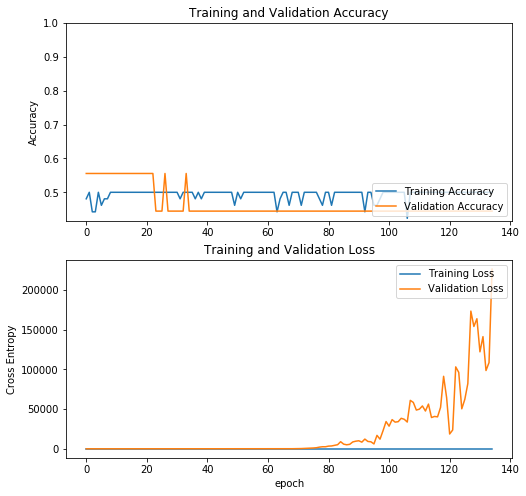

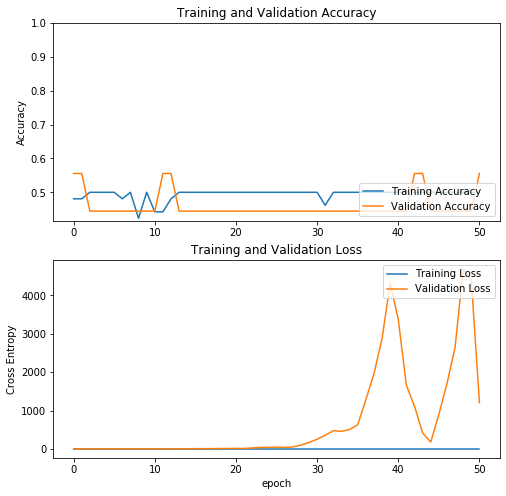

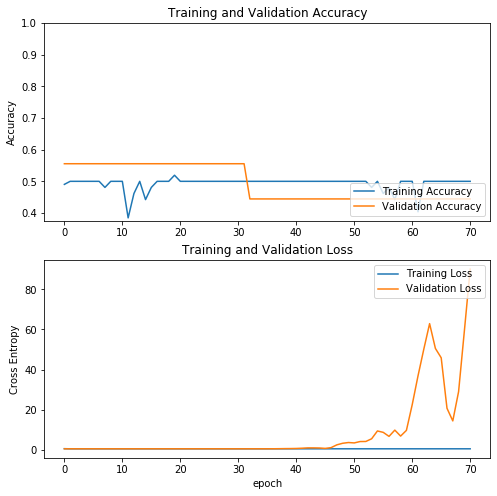

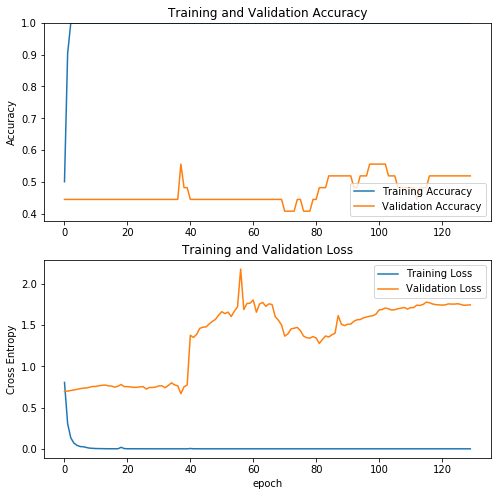

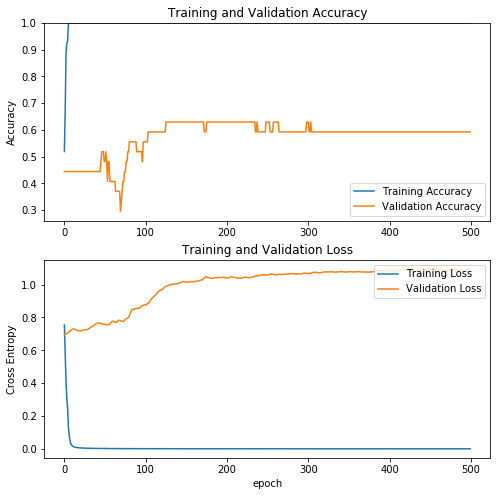

...

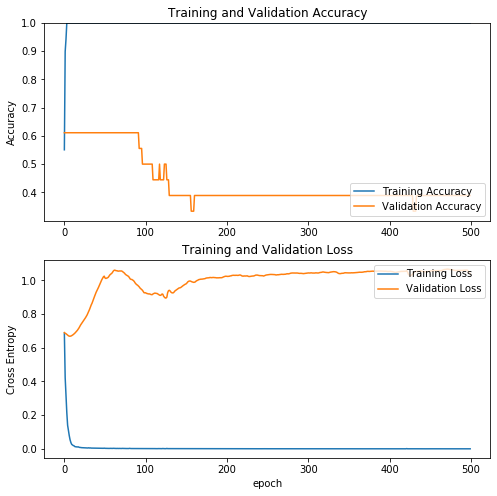

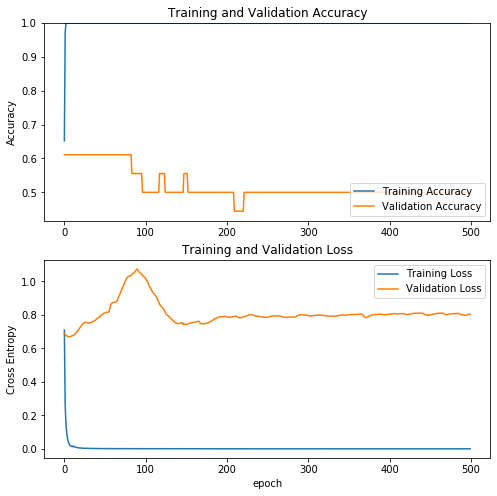

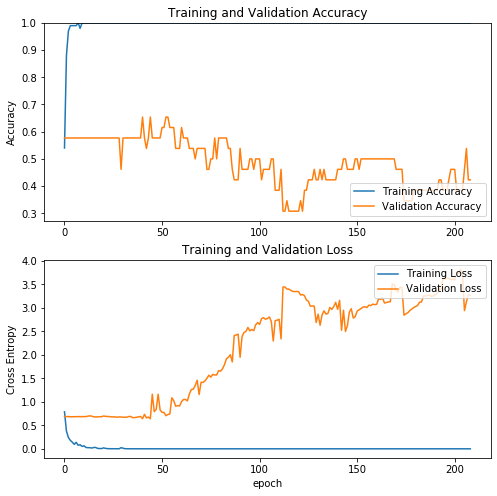

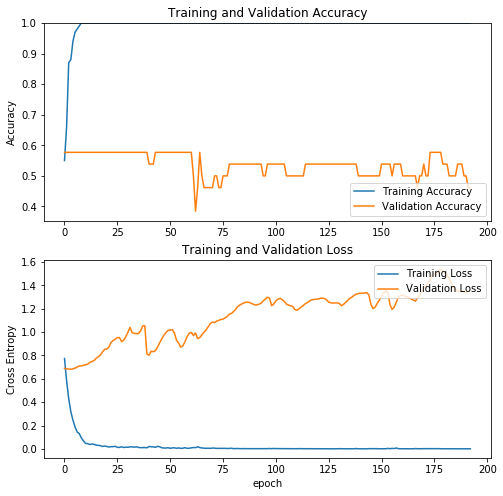

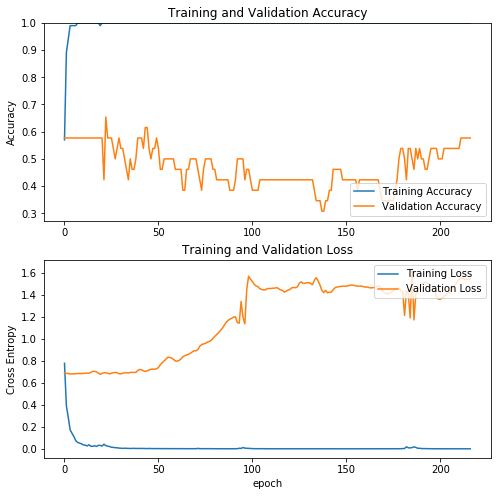

In [22]:
import pandas as pd
from keras.utils import to_categorical

columns = ["slice-dataset", "dataset", "optimizer","sequence", "percentile", "Train_acc", "Train_loss", "Val_acc", "Val_loss"]

rows_list = []


side = 64

result_file = "results-2.6.csv"

recover_count = 0

recover = False

if recover:
    df = pd.read_csv("results-2.6.csv")
    rows_list = df.iloc[:, 1:]
    rows_list = np.array(rows_list).tolist()

for slice_dataset in ["/data/RMN/dataset-gliomi-cnn/datasets-full-brain", "/data/RMN/dataset-gliomi-cnn/datasets-tumor-crop"]:
    for dataset in ["survivor", "idh", "ki67", "egfr", "mgmt"]:
        for sequence in ["T1", "T2", "FLAIR", "ADC", "rCBV", "MPRAGE"]:
            for percentile in [100]:
                
                if recover and recover_count < len(rows_list):
                    pass
                    
                for optimizer_name in ['rmsprop','sgd','adam']:
                    if recover and recover_count < len(rows_list):
                        recover_count = recover_count + 1
                        print("Skip row:", recover_count)
                        continue
                        
                    recover = False
                    
                    # try:

                    K.clear_session()

                    X_train, y_train, X_test, y_test = get_data(f"{slice_dataset}/{sequence}-{side}-{percentile}.pickle",
                                                                f"{slice_dataset}/../dataset-{dataset}.csv")
                    y_train = to_categorical(y_train)
                    y_test = to_categorical(y_test)

                    model = CNN_2D(
                        n_features=256,
                        input_shape=(side, side, 1), 
                        classes=2, 
                        zero_pad=True,
                        avg_pool=True,
                        random_seed=42)

                    # model.summary()

                    model.compile(optimizer=optimizers[f'{optimizer_name}'](), loss='categorical_crossentropy', metrics=['accuracy'])

                    print("Starting fit")

                    history = train_and_test(model, X_train, y_train, X_test, y_test, random_state=42, epochs=500, batch_size=16)

                    plot_file_name = make_name(slice_dataset, dataset, optimizer_name, sequence, str(percentile))

                    save_plot(history, f"2.6-{plot_file_name}")

                    train_score = model.evaluate(X_train, y_train)

                    test_score = model.evaluate(X_test, y_test)

                    #scores_str = ", ".join(str(x) for x in (scores * 100))

                    rows_list.append([
                        slice_dataset,
                        dataset,
                        optimizer_name,
                        sequence,
                        percentile,
                        str(train_score[1]),
                        str(train_score[0]),
                        str(test_score[1]),
                        str(test_score[0])
                    ])

                    df = pd.DataFrame(rows_list, columns=columns)

                    df.to_csv("results-2.6.csv")



In [ ]:
                    except:
                        rows_list.append([
                                slice_dataset,
                                dataset,
                                optimizer_name,
                                sequence,
                                percentile,
                                "Error",
                                "Error",
                                "Error",
                                "Error"
                            ])
                        df = pd.DataFrame(rows_list, columns=columns)
                        df.to_csv(result_file)  